# 1. Library import

In [1]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data as Data

import time
import numpy as np
import gc
import sys
import pickle
import copy
import pandas as pd
from AttentiveLayers_MLP import *
from Featurizer import *
from getFeatures import *

from sklearn.metrics import roc_auc_score
from sklearn.metrics import recall_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import precision_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, auc

from rdkit import Chem
from rdkit.Chem import QED
from numpy.polynomial.polynomial import polyfit
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib
from IPython.display import SVG, display
import seaborn as sns
sns.set(color_codes = True)

In [2]:
import os
os.getcwd()

'/home/dohyeon/hERGAT'

In [3]:
import os
os.chdir('/home/dohyeon/hERGAT/dataset')

# dataset 불러오기 

## Canonical smiles를 기준으로 중복 데이터 삭제

In [4]:
task_name = 'Class'
tasks = ['Class']
raw_filename = "hERG dataset.csv"
feature_filename = raw_filename.replace('.csv','.pickle')
filename = raw_filename.replace('.csv','')
prefix_filename = raw_filename.split('/')[-1].replace('.csv','')
smiles_tasks_df = pd.read_csv(raw_filename)
smilesList = smiles_tasks_df.SMILES.values
print("number of all smiles: ",len(smilesList))
atom_num_dist = []
remained_smiles = []
canonical_smiles_list = []
for smiles in smilesList:
    try:        
        mol = Chem.MolFromSmiles(smiles)
        atom_num_dist.append(len(mol.GetAtoms()))
        remained_smiles.append(smiles)
        canonical_smiles_list.append(Chem.MolToSmiles(Chem.MolFromSmiles(smiles), isomericSmiles=True))
    except:
        print("not successfully processed smiles: ", smiles)
        pass
print("number of successfully processed smiles: ", len(remained_smiles))
smiles_tasks_df = smiles_tasks_df[smiles_tasks_df["SMILES"].isin(remained_smiles)]
# print(smiles_tasks_df)
smiles_tasks_df['cano_smiles'] =canonical_smiles_list
assert canonical_smiles_list[8]==Chem.MolToSmiles(Chem.MolFromSmiles(smiles_tasks_df['cano_smiles'][8]), isomericSmiles=True)
smiles_tasks_df.head()

number of all smiles:  7933
number of successfully processed smiles:  7933


,Unnamed: 0,SMILES,pIC50,hERG,Class,cano_smiles
0,0,Cc1ccc(CN2[C@@H]3CC[C@H]2C[C@@H](C3)Oc4cccc(c4...,9.85,0.979,1,Cc1ccc(CN2[C@@H]3CC[C@H]2C[C@H](Oc2cccc(C(N)=O...
1,1,COc1nc2ccc(Br)cc2cc1[C@@H](c3ccccc3)[C@@](O)(C...,9.70,0.994,1,COc1nc2ccc(Br)cc2cc1[C@@H](c1ccccc1)[C@@](O)(C...
2,2,NC(=O)c1cccc(O[C@@H]2C[C@H]3CC[C@@H](C2)N3CCCc...,9.60,0.986,1,NC(=O)c1cccc(O[C@@H]2C[C@H]3CC[C@@H](C2)N3CCCc...
3,3,Cc1ccc(CN2[C@@H]3CC[C@H]2C[C@@H](C3)Oc4cccc(c4...,9.59,0.949,1,Cc1ccc(CN2[C@@H]3CC[C@H]2C[C@H](Oc2cccc(C(N)=O...
4,4,NC(=O)c1cccc(O[C@@H]2C[C@H]3CC[C@@H](C2)N3CCc4...,9.42,0.983,1,NC(=O)c1cccc(O[C@@H]2C[C@H]3CC[C@@H](C2)N3CCc2...


In [5]:
random_seed =100
start_time = str(time.ctime()).replace(':','-').replace(' ','_')
start = time.time()
radius = 3
T = 2
per_task_output_units_num = 2 # for classification model with 2 classes
output_units_num = len(tasks) * per_task_output_units_num # 2 

In [6]:
len(smiles_tasks_df)

7933

In [7]:
smilesList = [smiles for smiles in canonical_smiles_list if len(Chem.MolFromSmiles(smiles).GetAtoms())<101]

uncovered = [smiles for smiles in canonical_smiles_list if len(Chem.MolFromSmiles(smiles).GetAtoms())>100]

# cano_smiles안에 uncovered값과 겹치는 경우에 삭제
smiles_tasks_df = smiles_tasks_df[~smiles_tasks_df["cano_smiles"].isin(uncovered)]

feature_dicts = get_smiles_dicts(smilesList)
# keys = smiles값들이 cano_smiles값안에 있으면 두고 없다면 삭제
remained_df = smiles_tasks_df[smiles_tasks_df["cano_smiles"].isin(feature_dicts['smiles_to_atom_mask'].keys())] 
uncovered_df = smiles_tasks_df.drop(remained_df.index) 
uncovered_df # 최종적으로 uncovered_df에는 get_smiles_dicts로 바꾼 값과 cano_smiles와 비교하였을 때 삭제

Cc1ncoc1-c1nnc(SCCCN2CC3CC3(c3ccc(S(F)(F)(F)(F)F)cc3)C2)n1C
Cc1ncoc1-c1nnc(SCCCN2CC3CC3(c3cccc(S(F)(F)(F)(F)F)c3)C2)n1C
[Cl-]


,Unnamed: 0,SMILES,pIC50,hERG,Class,cano_smiles
1240,1240,Cc1ncoc1c2nnc(SCCCN3CC4CC4(C3)c5ccc(cc5)S(F)(F...,6.1,0.954,1,Cc1ncoc1-c1nnc(SCCCN2CC3CC3(c3ccc(S(F)(F)(F)(F...
1671,1671,Cc1ncoc1c2nnc(SCCCN3CC4CC4(C3)c5cccc(c5)S(F)(F...,5.9,0.950,1,Cc1ncoc1-c1nnc(SCCCN2CC3CC3(c3cccc(S(F)(F)(F)(...
3704,3704,[Cl-],5.2,0.972,1,[Cl-]


## Physicochemical properties 생성

In [8]:
from rdkit import Chem
from rdkit import DataStructs
from rdkit.Chem import AllChem
from rdkit.Chem.Fingerprints import FingerprintMols
from rdkit.Chem import rdMolDescriptors

remained_df = remained_df.reset_index()

# mol 형태로 변환
train_mols = [Chem.MolFromSmiles(smiles) for smiles in remained_df["cano_smiles"]]

# mol 형태로 변환이 되지 않은 경우, none_list에 담는다
none_list = []
for i in range(len(train_mols)):
    if train_mols[i] is None :
        none_list.append(i)
        print('none_list에 추가됨')
    
reg_idx = 0
for i in none_list :
    del train_mols[i - reg_idx]
    reg_idx += 1
    
# none_list가 존재할 경우, 삭제 후 데이터프레임 인덱스 맞춰주기
if len(none_list) != 0 :
    remained_df = remained_df.drop(none_list, axis=0)
    remained_df = remained_df.reset_index(drop = True)

In [9]:
# fingerprint 생성
bit_info_list = [] # bit vector의 설명자 리스트 담기
bit_info = {} #bit vector 설명자
fps = []

b = 0
# mol 파일에서 fingerprint Bit Vector 형태로 변환하기
for a in train_mols :
    fps.append(AllChem.GetMorganFingerprintAsBitVect(a, 3, nBits = 1024, bitInfo = bit_info))
    bit_info_list.append(bit_info.copy()) # bit_info 그대로 가져오면 변수가 변해서 리스트 값이 달라지므로 .copy()
    
# array 변환

arr_list = []
for i in range(len(fps)):
    array = np.zeros((0,), dtype = np.int8)
    arr_list.append(array)
for i in range(len(fps)):
    bit = fps[i]
    DataStructs.ConvertToNumpyArray(bit, arr_list[i])
    
train_x = np.stack([i.tolist() for i in arr_list])
train_finprt = pd.DataFrame(train_x)
train_finprt.head()

,0,1,2,3,4,5,6,7,8,9,...,1014,1015,1016,1017,1018,1019,1020,1021,1022,1023
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
1,0,1,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


In [10]:
import joblib
from sklearn.preprocessing import StandardScaler

# StandardScaler

sds_scaler = StandardScaler()

# molecular physicochemical properties 구하기

from rdkit.Chem import QED

train_qe = [QED.properties(mol) for mol in train_mols]
train_qe = pd.DataFrame(train_qe)
train_qe = train_qe.drop(columns = ['ROTB', 'AROM', 'ALERTS'])
train_qe[['MW', 'ALOGP', 'HBA', 'HBD', 'PSA']] = sds_scaler.fit_transform(train_qe[['MW', 'ALOGP', 'HBA', 'HBD', 'PSA']])
train_qe

,MW,ALOGP,HBA,HBD,PSA
0,-0.917145,-0.177788,-0.905935,-0.240880,-0.502855
1,1.267313,2.290658,-0.412761,-0.240880,-0.812253
2,-0.767714,-0.089251,-0.905935,-0.240880,-0.502855
3,-0.852917,-0.133940,-0.905935,-0.240880,-0.502855
4,-0.917145,-0.367382,-0.905935,-0.240880,-0.502855
...,...,...,...,...,...
7925,1.160303,-0.326243,0.573587,2.519498,1.530423
7926,1.181779,-0.166537,0.573587,2.519498,1.530423
7927,1.309733,-0.048112,0.573587,2.519498,1.530423
7928,1.331210,0.111594,0.573587,2.519498,1.530423


In [11]:
# 생성한 데이터 병합
input_df=pd.concat([train_finprt, train_qe], axis=1)
input_df.head()

,0,1,2,3,4,5,6,7,8,9,...,1019,1020,1021,1022,1023,MW,ALOGP,HBA,HBD,PSA
0,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,-0.917145,-0.177788,-0.905935,-0.24088,-0.502855
1,0,1,1,1,0,0,0,0,0,0,...,0,0,0,0,0,1.267313,2.290658,-0.412761,-0.24088,-0.812253
2,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,-0.767714,-0.089251,-0.905935,-0.24088,-0.502855
3,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,-0.852917,-0.133940,-0.905935,-0.24088,-0.502855
4,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,-0.917145,-0.367382,-0.905935,-0.24088,-0.502855


In [12]:
new_remained_df = pd.concat([remained_df, input_df], axis = 1)
new_remained_df = new_remained_df.drop(columns = ['index', 'pIC50', 'hERG', 'Unnamed: 0'])
new_remained_df

,SMILES,Class,cano_smiles,0,1,2,3,4,5,6,...,1019,1020,1021,1022,1023,MW,ALOGP,HBA,HBD,PSA
0,Cc1ccc(CN2[C@@H]3CC[C@H]2C[C@@H](C3)Oc4cccc(c4...,1,Cc1ccc(CN2[C@@H]3CC[C@H]2C[C@H](Oc2cccc(C(N)=O...,1,0,0,0,0,0,0,...,1,0,0,0,0,-0.917145,-0.177788,-0.905935,-0.240880,-0.502855
1,COc1nc2ccc(Br)cc2cc1[C@@H](c3ccccc3)[C@@](O)(C...,1,COc1nc2ccc(Br)cc2cc1[C@@H](c1ccccc1)[C@@](O)(C...,0,1,1,1,0,0,0,...,0,0,0,0,0,1.267313,2.290658,-0.412761,-0.240880,-0.812253
2,NC(=O)c1cccc(O[C@@H]2C[C@H]3CC[C@@H](C2)N3CCCc...,1,NC(=O)c1cccc(O[C@@H]2C[C@H]3CC[C@@H](C2)N3CCCc...,0,0,0,0,0,0,0,...,1,0,0,0,0,-0.767714,-0.089251,-0.905935,-0.240880,-0.502855
3,Cc1ccc(CN2[C@@H]3CC[C@H]2C[C@@H](C3)Oc4cccc(c4...,1,Cc1ccc(CN2[C@@H]3CC[C@H]2C[C@H](Oc2cccc(C(N)=O...,0,0,0,0,0,0,0,...,1,1,0,0,0,-0.852917,-0.133940,-0.905935,-0.240880,-0.502855
4,NC(=O)c1cccc(O[C@@H]2C[C@H]3CC[C@@H](C2)N3CCc4...,1,NC(=O)c1cccc(O[C@@H]2C[C@H]3CC[C@@H](C2)N3CCc2...,0,0,0,0,0,0,0,...,1,0,0,0,0,-0.917145,-0.367382,-0.905935,-0.240880,-0.502855
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7925,O=C1[C@H]2N(c3ccc(OCC=CCCNCC(=O)Nc4c(Cl)cc(cc4...,0,NC1=NCc2cc(Cl)c(c(Cl)c2)NC(=O)CNCCC=CCOc2ccc(c...,0,0,0,0,1,0,0,...,1,0,0,0,0,1.160303,-0.326243,0.573587,2.519498,1.530423
7926,O=C1[C@H]2N(c3ccc(OCCCCCNCC(=O)Nc4c(Cl)cc(cc4C...,0,NC1=NCc2cc(Cl)c(c(Cl)c2)NC(=O)CNCCCCCOc2ccc(cc...,0,0,1,0,1,0,0,...,1,0,0,0,0,1.181779,-0.166537,0.573587,2.519498,1.530423
7927,O=C1[C@H]2N(c3ccc(OCC=CCCCNCC(=O)Nc4c(Cl)cc(cc...,0,NC1=NCc2cc(Cl)c(c(Cl)c2)NC(=O)CNCCCC=CCOc2ccc(...,0,0,0,0,1,0,0,...,1,0,0,0,0,1.309733,-0.048112,0.573587,2.519498,1.530423
7928,O=C1[C@H]2N(c3ccc(OCCCCCCNCC(=O)Nc4c(Cl)cc(cc4...,0,NC1=NCc2cc(Cl)c(c(Cl)c2)NC(=O)CNCCCCCCOc2ccc(c...,0,0,1,0,1,0,0,...,1,0,0,0,0,1.331210,0.111594,0.573587,2.519498,1.530423


In [13]:
for key, value in feature_dicts.items():
    print(key)

smiles_to_atom_mask
smiles_to_atom_info
smiles_to_bond_info
smiles_to_atom_neighbors
smiles_to_bond_neighbors
smiles_to_rdkit_list


In [14]:
weights = []
for i,task in enumerate(tasks):    
    negative_df = new_remained_df[new_remained_df[task] == 0][["SMILES",task]] # 
    positive_df = new_remained_df[new_remained_df[task] == 1][["SMILES",task]] # 
    weights.append([(positive_df.shape[0]+negative_df.shape[0])/negative_df.shape[0],\
                    (positive_df.shape[0]+negative_df.shape[0])/positive_df.shape[0]])
# weights = [[2.862815884476534, 1.5368217054263567]]


# train/test/valid split
test_df = new_remained_df.sample(frac=1/10, random_state=random_seed) # test set
training_data = new_remained_df.drop(test_df.index) # training data
valid_df = training_data.sample(frac=1/9, random_state=random_seed) # validation set
train_df = training_data.drop(valid_df.index) # train set
train_df = train_df.reset_index(drop=True)
valid_df = valid_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

In [15]:
print(train_df.shape)
print(valid_df.shape)
print(test_df.shape)

(6344, 1032)
(793, 1032)
(793, 1032)


In [16]:
print('train_df label의 shape')
print(train_df['Class'].value_counts())
print('test_df label의 shape')
print(test_df['Class'].value_counts())
print('valid_df label의 shape')
print(valid_df['Class'].value_counts())

train_df label의 shape
1    4102
0    2242
Name: Class, dtype: int64
test_df label의 shape
1    537
0    256
Name: Class, dtype: int64
valid_df label의 shape
1    521
0    272
Name: Class, dtype: int64


여기에서 test_df를 사용할 예정

In [17]:
def train(model, dataset, optimizer, loss_function):
    model.train()
    np.random.seed(30)
    valList = np.arange(0,dataset.shape[0])
    #shuffle them
    np.random.shuffle(valList)
    batch_list = []
    for i in range(0, dataset.shape[0], batch_size):
        batch = valList[i:i+batch_size]
        batch_list.append(batch)   
    for counter, train_batch in enumerate(batch_list):
        batch_df = dataset.loc[train_batch,:]
        smiles_list = batch_df.cano_smiles.values
        
        x_atom, x_bonds, x_atom_index, x_bond_index, x_mask, smiles_to_rdkit_list = get_smiles_array(smiles_list,feature_dicts)    
        
        selected_rows = batch_df[batch_df['cano_smiles'] == smiles_list].drop(columns=['SMILES', 'Class', 'cano_smiles'])
        physicochemical_features= torch.tensor(selected_rows.to_numpy(dtype=np.float32), dtype=torch.float)
        #physicochemical_features = physicochemical_features.expand(batch_size, -1)

        atoms_prediction, mol_prediction = model(torch.Tensor(x_atom).cpu(),torch.Tensor(x_bonds).cpu(),torch.LongTensor(x_atom_index).cpu(),torch.LongTensor(x_bond_index).cpu(),torch.Tensor(x_mask).cpu(), physicochemical_features.cpu())
#         print(torch.Tensor(x_atom).size(),torch.Tensor(x_bonds).size(),torch.cuda.LongTensor(x_atom_index).size(),torch.cuda.LongTensor(x_bond_index).size(),torch.Tensor(x_mask).size())
        
        model.zero_grad()
        # Step 4. Compute your loss function. (Again, Torch wants the target wrapped in a variable)
        loss = 0.0
        for i,task in enumerate(tasks):
            y_pred = mol_prediction[:, i * per_task_output_units_num:(i + 1) *
                                    per_task_output_units_num]
            y_val = batch_df[task].values

            validInds = np.where((y_val==0) | (y_val==1))[0]
#             validInds = np.where(y_val != -1)[0]
            if len(validInds) == 0:
                continue
            y_val_adjust = np.array([y_val[v] for v in validInds]).astype(float)
            validInds = torch.LongTensor(validInds).squeeze()
            y_pred_adjust = torch.index_select(y_pred, 0, validInds)

            loss += loss_function[i](
                y_pred_adjust,
                torch.LongTensor(y_val_adjust))
        # Step 5. Do the backward pass and update the gradient
#             print(y_val,y_pred,validInds,y_val_adjust,y_pred_adjust)
        loss.backward()
        optimizer.step()
        
        
def eval(model, dataset):
    model.eval()
    y_val_list = {}
    y_pred_list = {}
    losses_list = []

    
    valList = np.arange(0,dataset.shape[0])
    batch_list = []
    for i in range(0, dataset.shape[0], batch_size):
        batch = valList[i:i+batch_size]
        batch_list.append(batch)   
    for counter, test_batch in enumerate(batch_list):
        batch_df = dataset.loc[test_batch,:]
        smiles_list = batch_df.cano_smiles.values
        
        x_atom, x_bonds, x_atom_index, x_bond_index, x_mask, smiles_to_rdkit_list = get_smiles_array(smiles_list,feature_dicts)
        selected_rows = batch_df[batch_df['cano_smiles'] == smiles_list].drop(columns=['SMILES', 'Class', 'cano_smiles'])
        physicochemical_features= torch.tensor(selected_rows.to_numpy(dtype=np.float32), dtype=torch.float)
#        physicochemical_features = physicochemical_features.expand(batch_size, -1)
        
        atoms_prediction, mol_prediction = model(torch.Tensor(x_atom).cpu(),torch.Tensor(x_bonds).cpu(),torch.LongTensor(x_atom_index).cpu(),torch.LongTensor(x_bond_index).cpu(),torch.Tensor(x_mask).cpu(), physicochemical_features.cpu())
        atom_pred = atoms_prediction.data[:,:,1].unsqueeze(2).numpy()
        for i,task in enumerate(tasks):
            y_pred = mol_prediction[:, i * per_task_output_units_num:(i + 1) *
                                    per_task_output_units_num]
            y_val = batch_df[task].values

            validInds = np.where((y_val==0) | (y_val==1))[0]

            if len(validInds) == 0:
                continue
            y_val_adjust = np.array([y_val[v] for v in validInds]).astype(float)
            validInds = torch.LongTensor(validInds).squeeze()
            y_pred_adjust = torch.index_select(y_pred, 0, validInds)

            loss = loss_function[i](
                y_pred_adjust,
                torch.LongTensor(y_val_adjust))
            y_pred_adjust = F.softmax(y_pred_adjust,dim=-1).data.numpy()[:,1]
            losses_list.append(loss.detach().numpy())
            try:
                y_val_list[i].extend(y_val_adjust)
                y_pred_list[i].extend(y_pred_adjust)
            except:
                y_val_list[i] = []
                y_pred_list[i] = []
                y_val_list[i].extend(y_val_adjust)
                y_pred_list[i].extend(y_pred_adjust)
                
    # 시행할때마다 모델에서 최적의 optimal_threshold값을 찾아 성능평가
    
    def find_optimal_threshold(precision, recall, thresholds):
        f1_scores = 2*((precision*recall)/(precision+recall))
        index = np.argmax(f1_scores)
        return thresholds[index]

    test_prc = []
    test_thresholds = []
    optimal_thresholds = []
    for i in range(len(tasks)):
        precision, recall, thresholds = precision_recall_curve(y_val_list[i], y_pred_list[i])
        optimal_threshold = find_optimal_threshold(precision, recall, thresholds)
        optimal_thresholds.append(optimal_threshold)
        test_prc.append(auc(recall, precision))
        test_thresholds.append(thresholds)
        
        
    test_precision = [precision_score(y_val_list[i], (np.array(y_pred_list[i]) > optimal_thresholds[i]).astype(int)) for i in range(len(tasks))]
    test_recall = [recall_score(y_val_list[i],(np.array(y_pred_list[i]) >optimal_thresholds[i]).astype(int)) for i in range(len(tasks))]
    test_f1_score = [2 * (precision * recall) / (precision + recall) for precision, recall in zip(test_precision, test_recall)]    
    conf_matrices = [confusion_matrix(y_val_list[i], (np.array(y_pred_list[i]) > optimal_thresholds[i]).astype(int)) for i in range(len(tasks))]
    test_sensitivity = [cm[1, 1] / (cm[1, 1] + cm[1, 0]) for cm in conf_matrices]
    test_specificity = [cm[0, 0] / (cm[0, 0] + cm[0, 1]) for cm in conf_matrices]
    test_acc = [accuracy_score(y_val_list[i], (np.array(y_pred_list[i]) > optimal_thresholds[i]).astype(int)) for i in range(len(tasks))]
    fpr_list, tpr_list, thresholds2 = [], [], []
    for i in range(len(tasks)):
        fpr, tpr, thresholds = roc_curve(y_val_list[i], y_pred_list[i])
        fpr_list.append(fpr)
        tpr_list.append(tpr)
    test_roc = [roc_auc_score(y_val_list[i], y_pred_list[i]) for i in range(len(tasks))]
    test_loss = np.array(losses_list).mean()
    
    return test_acc, test_roc, test_prc, test_precision, test_recall, test_f1_score, test_loss, test_sensitivity, test_specificity, fpr_list, tpr_list, optimal_thresholds

In [18]:
best_param = {"roc_epoch": 0, "valid_roc": 0, "loss_epoch": 0, "valid_loss": float('inf')}
best_param


{'roc_epoch': 0, 'valid_roc': 0, 'loss_epoch': 0, 'valid_loss': inf}

In [19]:
# bayesian optimizer로 찾은 최적의 parameter 값 #
physicochemical_feature_dim = 1029
batch_size = 114
p_dropout = 0.475
fingerprint_dim = 100
learning_rate = 4.629
weight_decay = 2.291
radius = 3
T = 2

# molecule substructure attention

In [20]:
from AttentiveLayers_Viz import *

In [21]:
import os
os.getcwd()

'/home/dohyeon/hERGAT/dataset'

In [31]:
best_model = torch.load('../saved_model/model_hERG dataset'+'_'+str(82)+'.pt')     # best_param['roc_epoch']

best_model_dict = best_model.state_dict()
best_model_wts = copy.deepcopy(best_model_dict)

In [32]:
best_model_wts.keys()

odict_keys(['atom_fc.weight', 'atom_fc.bias', 'neighbor_fc.weight', 'neighbor_fc.bias', 'GRUCell.0.weight_ih', 'GRUCell.0.weight_hh', 'GRUCell.0.bias_ih', 'GRUCell.0.bias_hh', 'GRUCell.1.weight_ih', 'GRUCell.1.weight_hh', 'GRUCell.1.bias_ih', 'GRUCell.1.bias_hh', 'GRUCell.2.weight_ih', 'GRUCell.2.weight_hh', 'GRUCell.2.bias_ih', 'GRUCell.2.bias_hh', 'align.0.weight', 'align.0.bias', 'align.1.weight', 'align.1.bias', 'align.2.weight', 'align.2.bias', 'attend.0.weight', 'attend.0.bias', 'attend.1.weight', 'attend.1.bias', 'attend.2.weight', 'attend.2.bias', 'mol_GRUCell.weight_ih', 'mol_GRUCell.weight_hh', 'mol_GRUCell.bias_ih', 'mol_GRUCell.bias_hh', 'mol_align.weight', 'mol_align.bias', 'mol_attend.weight', 'mol_attend.bias', 'output.weight', 'output.bias', 'physicochemical_fc.weight', 'physicochemical_fc.bias', 'physicochemical_bn.weight', 'physicochemical_bn.bias', 'physicochemical_bn.running_mean', 'physicochemical_bn.running_var', 'physicochemical_bn.num_batches_tracked', 'physicoc

In [33]:
x_atom, x_bonds, x_atom_index, x_bond_index, x_mask, smiles_to_rdkit_list = get_smiles_array([smilesList[0]], feature_dicts)

num_atom_features = x_atom.shape[-1]
num_bond_features = x_bonds.shape[-1]

In [25]:
# 기존에 best_model_wts에 저장되어있는 가중치값들을 여기에 적용시킨다
model_for_viz = ExtendedFingerprint_viz(radius, T, num_atom_features, num_bond_features,fingerprint_dim, output_units_num, p_dropout, physicochemical_feature_dim)
model_for_viz.load_state_dict(best_model_wts)

<All keys matched successfully>

In [26]:
# 두 모델의 특정 layer에서 가중치가 동일한지 확인하는 코드
# 같다면 1을 출력
(best_model.align[0].weight == model_for_viz.align[0].weight).all()

tensor(True)

In [27]:
def min_max_norm(dataset):
    if isinstance(dataset, list):
        norm_list = list()
        min_value = min(dataset)
        max_value = max(dataset)

        for value in dataset:
            tmp = (value - min_value) / (max_value - min_value)
            norm_list.append(tmp)
    return norm_list

aromatic atom count: 12
prediction: [ 1.2806505 -1.0228252]
O=C(CNC(=O)c1cccc(C(F)(F)F)c1)NC1CN([C@H]2CC[C@@](O)(c3ccc(F)nc3)CC2)C1


[16:37:55] The new font size 1 is below the current minimum (6).


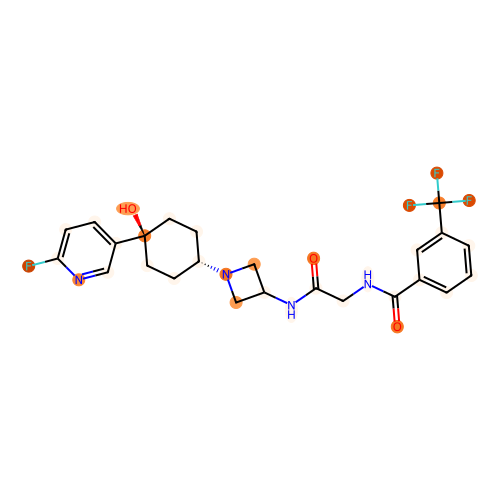

aromatic atom count: 18
prediction: [-1.4350827  1.3964702]
CCN(CC)C(=O)c1ccc(C(=C2CCN(Cc3ccc(F)cc3)CC2)c2ccc(NC(C)=O)cc2)cc1


[16:37:55] The new font size 1 is below the current minimum (6).


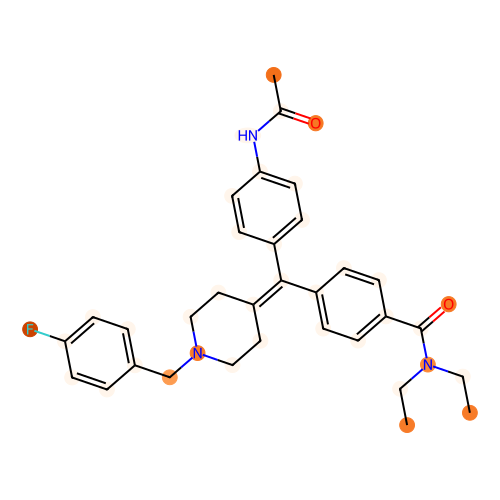

aromatic atom count: 24
prediction: [-0.6688156   0.72078764]
Cc1ccc2c(-c3nnc(SCCCCN4CCc5cc6nc(C)oc6c(C)c5CC4)n3C)cccc2n1


[16:37:55] The new font size 1 is below the current minimum (6).


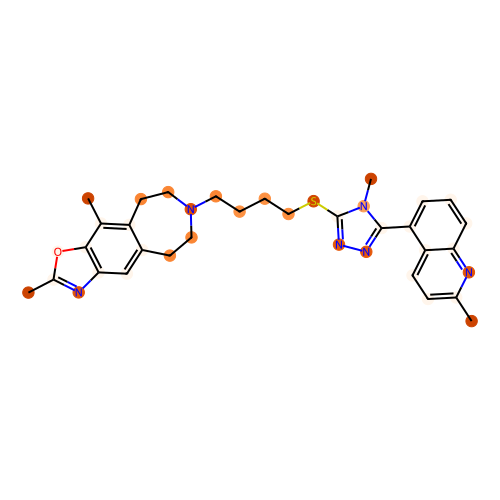

aromatic atom count: 25
prediction: [-0.26802295  0.30287609]
NS(=O)(=O)c1ccc(Oc2cnc3ccc(=O)n(CCN4CCC(c5nc6cc(C(F)(F)F)ccc6[nH]5)CC4)c3c2)cc1


[16:37:55] The new font size 1 is below the current minimum (6).


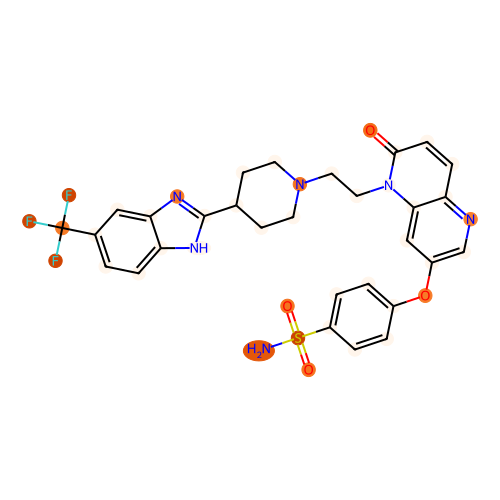

aromatic atom count: 18
prediction: [-0.5044649   0.61982054]
CN(C)Cc1ccc2c(c1)CC[C@H](N(C)C(=O)c1ccc(-c3ccc(F)cc3)cn1)C2


[16:37:55] The new font size 1 is below the current minimum (6).


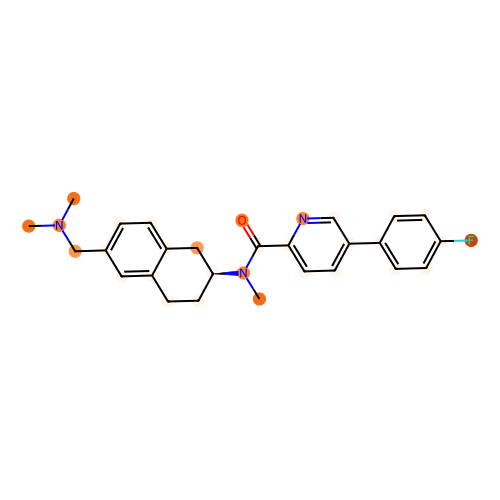

aromatic atom count: 22
prediction: [ 2.9377496 -2.038236 ]
C[C@@H](N1CCn2nc(-c3ccc(C#N)nc3)nc2C1)[C@](O)(Cn1cncn1)c1ccc(F)cc1F


[16:37:55] The new font size 1 is below the current minimum (6).


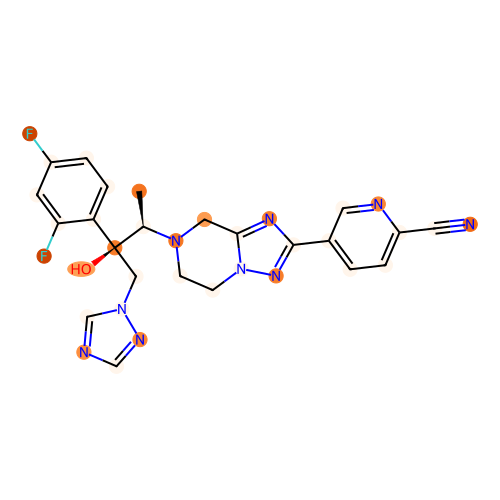

aromatic atom count: 18
prediction: [ 1.2910548  -0.88910323]
COc1cnc(-c2c(C)ccc(F)c2CCNC(=O)c2ccc(COCC(F)(F)F)nc2)cn1


[16:37:55] The new font size 1 is below the current minimum (6).


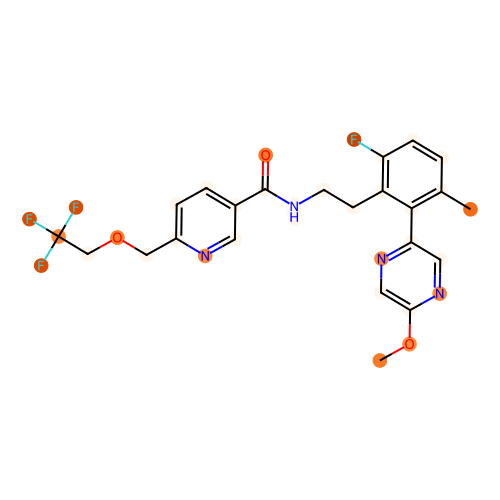

aromatic atom count: 30
prediction: [ 0.95635176 -0.67953384]
CC(C)n1nc([C@]2(c3cnn(C)c3)N[C@@H](c3nc(-c4ccc(F)cn4)c[nH]3)Cc3c2[nH]c2ccccc32)oc1=O


[16:37:55] The new font size 1 is below the current minimum (6).


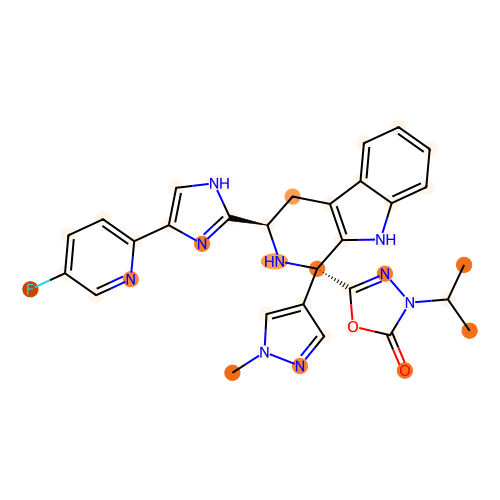

aromatic atom count: 15
prediction: [ 2.4372354 -1.779157 ]
O=C(c1cnn2cccnc12)N1CCN(c2ccc(OCCCN3CCCCC3)cc2)C(=O)C1


[16:37:55] The new font size 1 is below the current minimum (6).


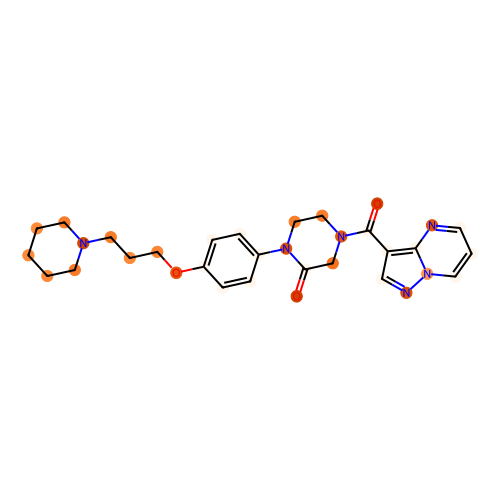

aromatic atom count: 18
prediction: [-1.1504946  1.1892337]
CC(C)(C)NC(=O)c1c[nH]c2ncc(-c3nn(CCCN4CCOCC4)c4ccc(OC(F)F)cc34)nc12


[16:37:55] The new font size 1 is below the current minimum (6).


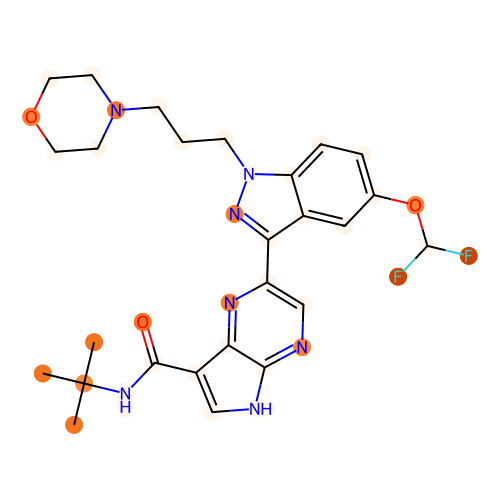

aromatic atom count: 12
prediction: [-0.04984014  0.09450686]
O=C(NCc1ccc(OC(F)(F)F)cc1)C1c2ccccc2C(=O)N1CCC1CCOCC1


[16:37:55] The new font size 1 is below the current minimum (6).


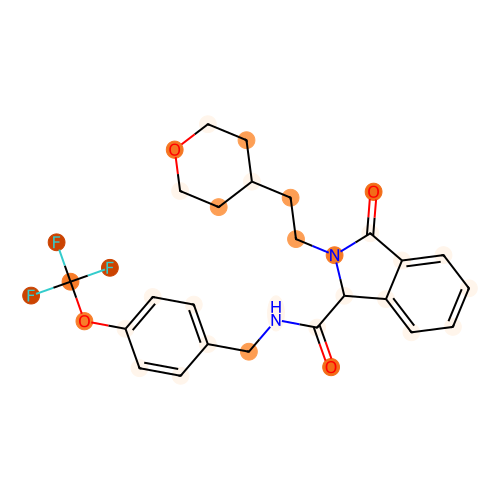

aromatic atom count: 21
prediction: [0.01772319 0.1252248 ]
C=CC(=O)Nc1cc(Nc2ncc(Cl)c(-c3c[nH]c4ccccc34)n2)c(OC)cc1N(C)CCN(C)C


[16:37:55] The new font size 1 is below the current minimum (6).


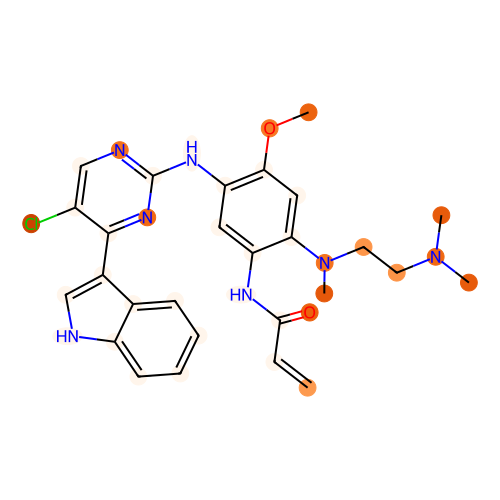

aromatic atom count: 6
prediction: [ 3.4964309 -2.7412856]
CO[C@@H]1COCC[C@@H]1N[C@@H]1C[C@H]2CCC[C@@]2(C(=O)N2CCc3ncc(C(F)(F)F)cc3C2)C1


[16:37:55] The new font size 1 is below the current minimum (6).


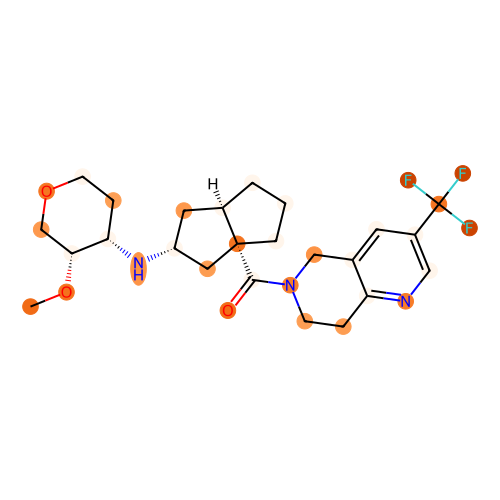

aromatic atom count: 16
prediction: [-1.1289384  1.110796 ]
O=C(NC1CCN(Cc2ccc3c(c2)OCO3)CC1)c1cc(=O)c2ccc(F)cc2o1


[16:37:55] The new font size 1 is below the current minimum (6).


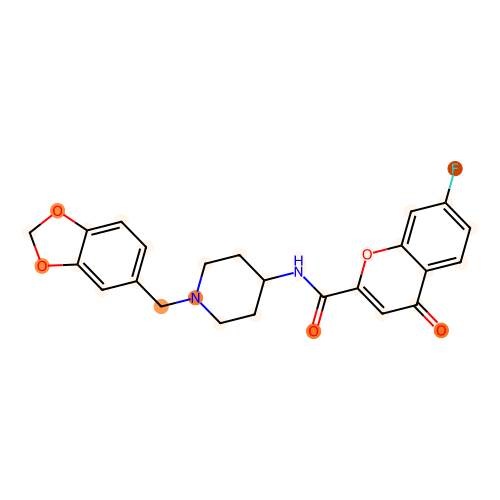

aromatic atom count: 12
prediction: [-1.9212029  1.7674029]
COCCc1ccc(Cl)c(CN(C(=O)[C@H]2CNCC[C@]2(O)c2ccc(F)c(F)c2)C2CC2)c1


[16:37:55] The new font size 1 is below the current minimum (6).


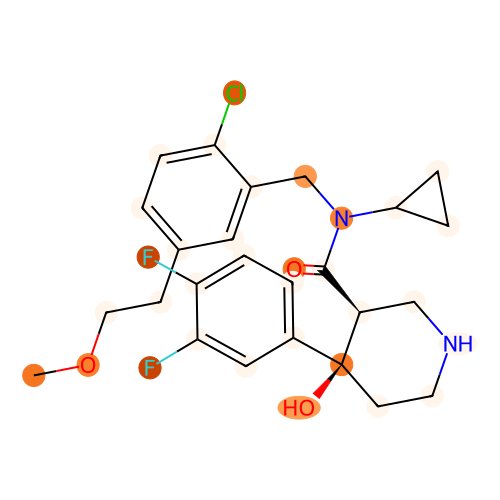

aromatic atom count: 18
prediction: [ 0.76397216 -0.6084895 ]
COc1ccccc1Oc1ccccc1CN1CCC2(CC1)CCN(C(=O)c1ccccc1C(=O)O)CC2


[16:37:55] The new font size 1 is below the current minimum (6).


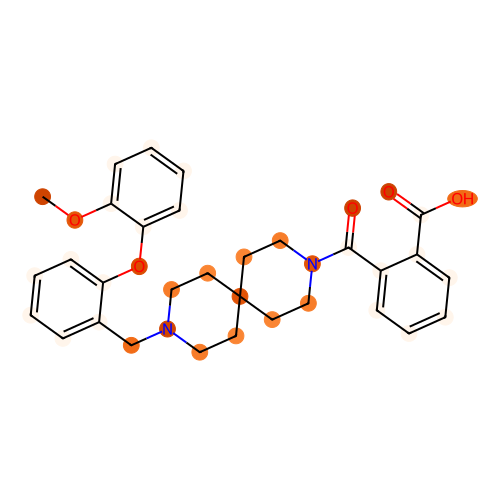

aromatic atom count: 18
prediction: [ 1.3980393 -1.0105361]
COc1cnc(-c2c(F)ccc(F)c2CCNC(=O)c2ccc(COCC(F)(F)F)nc2)cn1


[16:37:55] The new font size 1 is below the current minimum (6).


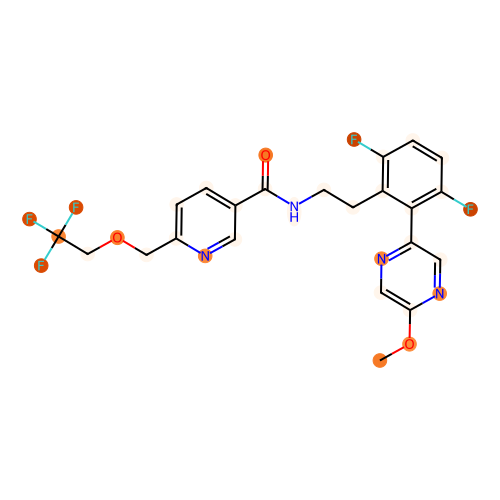

aromatic atom count: 18
prediction: [ 1.2701373 -0.9137488]
CC(Cc1ccccn1)N1C(=O)c2ccccc2C1C(=O)NCc1ccc(OC(F)(F)F)cc1


[16:37:55] The new font size 1 is below the current minimum (6).


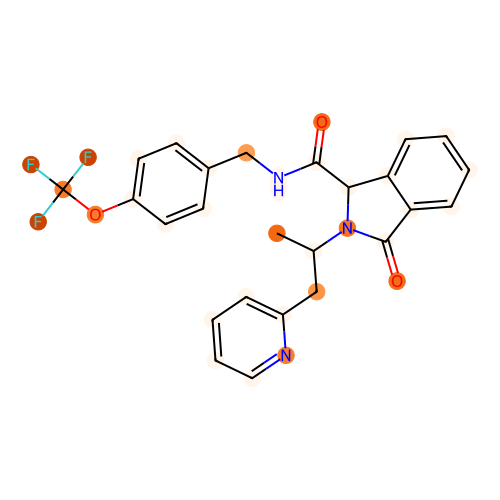

aromatic atom count: 17
prediction: [-1.4805382  1.4664211]
N#Cc1ccc(Cn2cncc2C[NH+](CC[NH+]2CCOCC2)C2CCN(Cc3cccc(Cl)c3)C2=O)cc1


[16:37:55] The new font size 1 is below the current minimum (6).


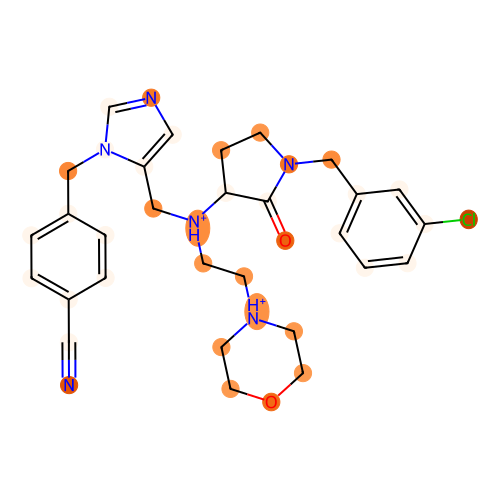

aromatic atom count: 21
prediction: [-1.675885   1.7027813]
Cc1ccc(CN2CCC(Oc3ncnc4c3ccn4Cc3ccccc3)CC2)nc1


[16:37:55] The new font size 1 is below the current minimum (6).


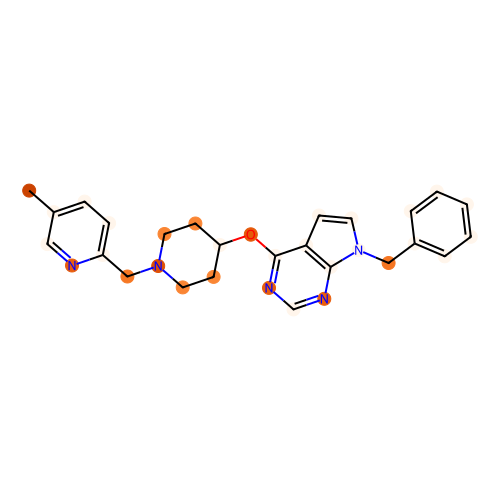

aromatic atom count: 26
prediction: [ 1.3798981 -0.9887271]
O=C(Nc1ccc(-c2nnn[nH]2)cc1F)[C@H](C1CCCCC1)n1c(-c2ccc(Cl)cc2)nc2cc(F)c(F)cc21


[16:37:55] The new font size 1 is below the current minimum (6).


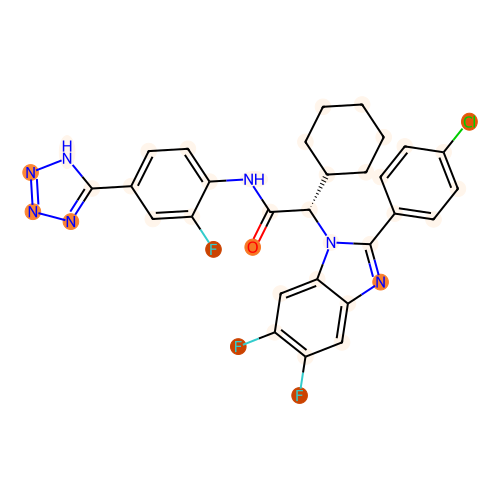

aromatic atom count: 20
prediction: [ 0.36624584 -0.2517389 ]
Cc1nc2cc3c(cc2o1)CCN(CCCSc1nnc(-c2ccc(C(F)(F)F)cc2)n1C)CC3


[16:37:55] The new font size 1 is below the current minimum (6).


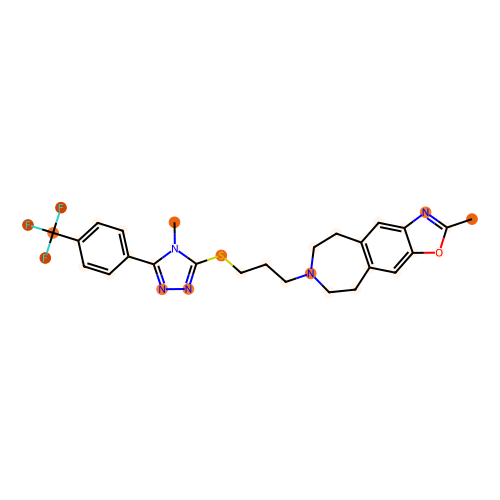

aromatic atom count: 16
prediction: [-0.8285128   0.85750717]
COc1ccc2ncc(F)c(CCC34CCC(NCc5ccc6c(n5)N(C)C(=O)CO6)(CC3)CO4)c2n1


[16:37:55] The new font size 1 is below the current minimum (6).


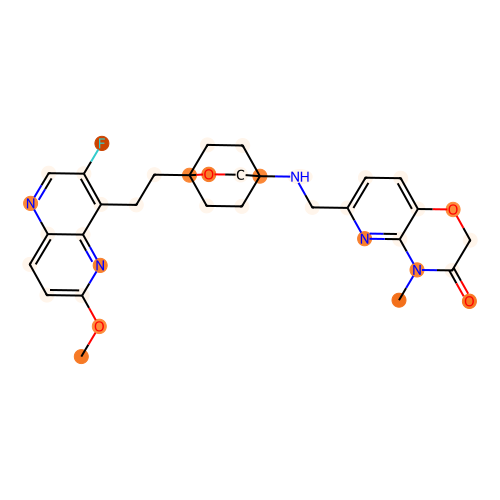

aromatic atom count: 24
prediction: [-0.8700149  0.8859075]
NC1=N[C@@]2(CO1)c1cc(-c3cccnc3F)ccc1Oc1cnc(-c3ccncc3)cc12


[16:37:55] The new font size 1 is below the current minimum (6).


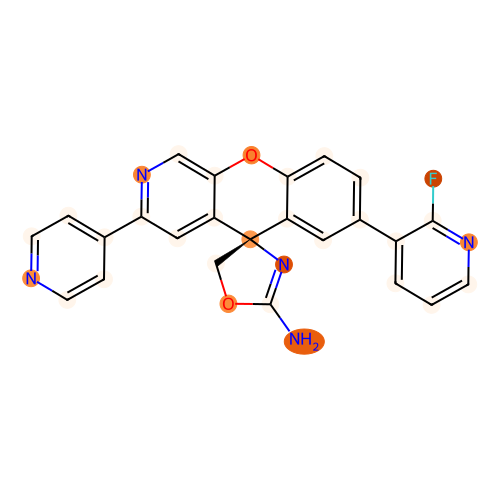

aromatic atom count: 12
prediction: [-0.1676552   0.15214367]
CCN(C(=O)Cc1ccc(S(C)(=O)=O)cc1)C1CCN(CC[C@@H](c2ccccc2)N2CCN(S(=O)(=O)C(F)(F)F)CC2)CC1


[16:37:55] The new font size 1 is below the current minimum (6).


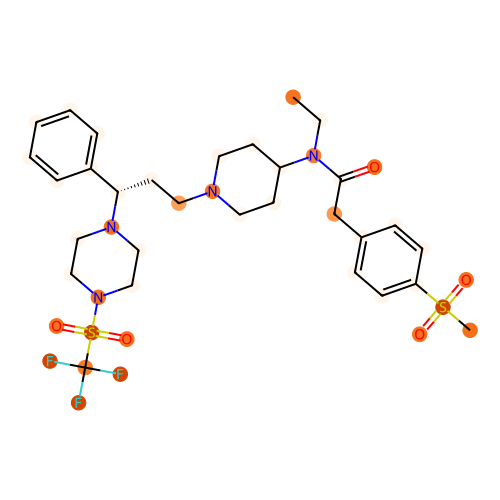

aromatic atom count: 16
prediction: [ 3.1376438 -2.3296654]
COc1cc2nnc(C(N)=O)c(Nc3ccc(C)cc3F)c2cc1N1CCS(=O)(=O)CC1


[16:37:55] The new font size 1 is below the current minimum (6).


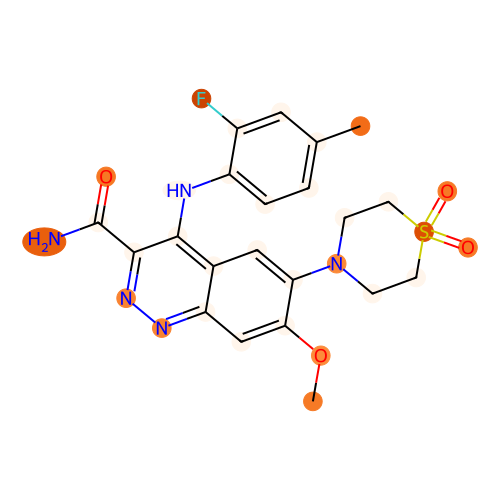

aromatic atom count: 24
prediction: [ 3.0045757 -2.044446 ]
CC(O)(c1ccccc1)c1ccc(C(Cc2cc[n+]([O-])cc2)c2ccc(OC(F)F)c(OC(F)F)c2)cn1


[16:37:55] The new font size 1 is below the current minimum (6).


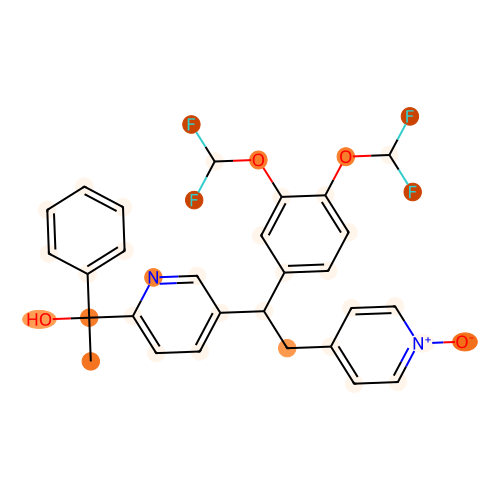

aromatic atom count: 15
prediction: [-0.9946677  0.9866112]
COCCCc1ccc(F)c2c(CN(C(=O)[C@H]3CNCC[C@]3(O)c3ccc(F)c(F)c3)C3CC3)cn(CCCOC)c12


[16:37:55] The new font size 1 is below the current minimum (6).


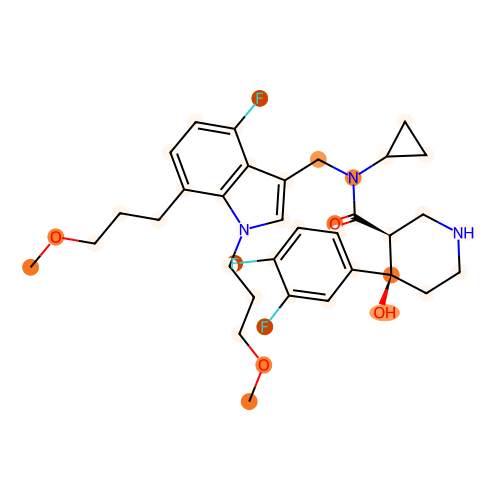

aromatic atom count: 16
prediction: [ 2.787268 -2.174057]
COc1ccc2ncc(=O)n(CCN3CC[C@H](NCc4cc5c(cn4)OCCO5)[C@@H](OC)C3)c2c1


[16:37:55] The new font size 1 is below the current minimum (6).


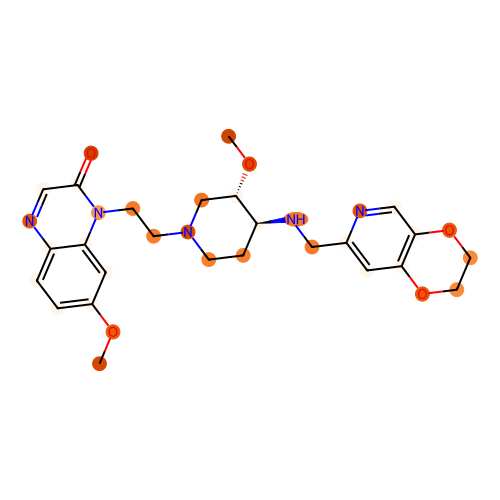

aromatic atom count: 24
prediction: [-0.9122534  0.9755455]
Cc1cc(C2(c3cccc(-c4cncnc4)c3)N=C(N)c3c(F)cccc32)cc(C)n1


[16:37:55] The new font size 1 is below the current minimum (6).


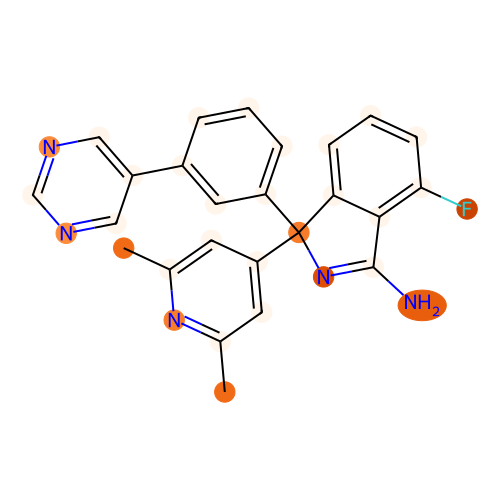

aromatic atom count: 15
prediction: [-0.17946403  0.28315392]
COc1cccc(-n2cc3nc(CC(C)C)n(C[C@H]4CCCN(C[C@H]5CCCO5)C4)c(=O)c3n2)c1


[16:37:55] The new font size 1 is below the current minimum (6).


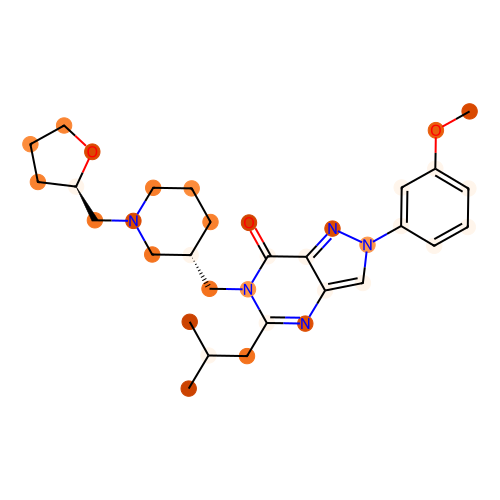

aromatic atom count: 21
prediction: [ 0.274684   -0.16435212]
COc1ccc(C(CC(=O)N2CCN(Cc3nc4ccc(C)cc4o3)CC2)c2ccccc2)cc1


[16:37:55] The new font size 1 is below the current minimum (6).


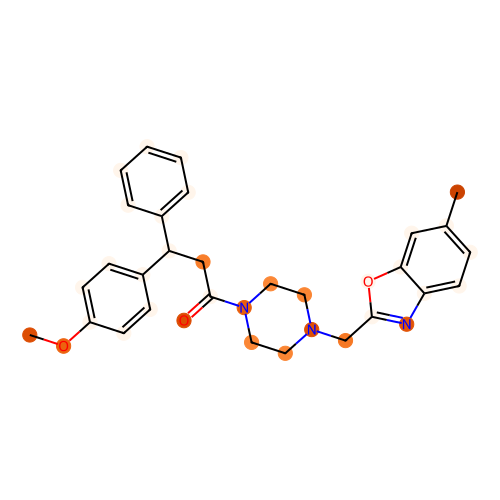

aromatic atom count: 15
prediction: [ 2.5281007 -1.9827336]
O=C(CNc1nccc2ncc(C(F)(F)F)cc12)NC1CN([C@H]2CC[C@@](O)(c3cncs3)CC2)C1


[16:37:55] The new font size 1 is below the current minimum (6).


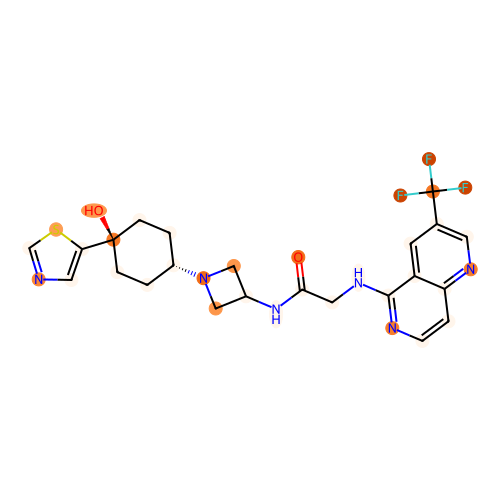

aromatic atom count: 12
prediction: [ 0.15890595 -0.11092567]
O=C(O)[C@H](Cc1ccc(Cl)cc1)N1CCC(CN2CCC(Oc3ccc(Cl)c(Cl)c3)CC2)CC1


[16:37:55] The new font size 1 is below the current minimum (6).


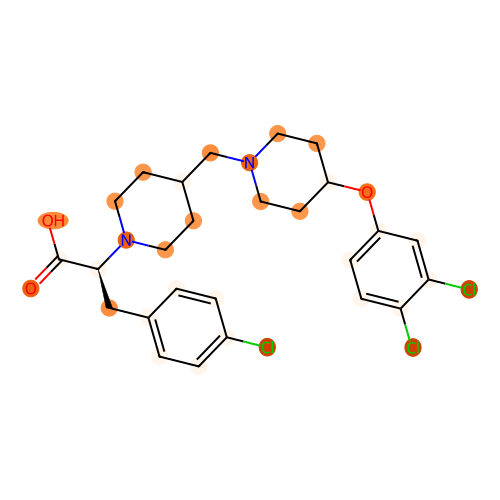

aromatic atom count: 21
prediction: [-1.3199589  1.3312429]
Cc1ccc2c(N3CCN(CCc4cccc5c4OCc4cncn4-5)CC3)cccc2n1


[16:37:55] The new font size 1 is below the current minimum (6).


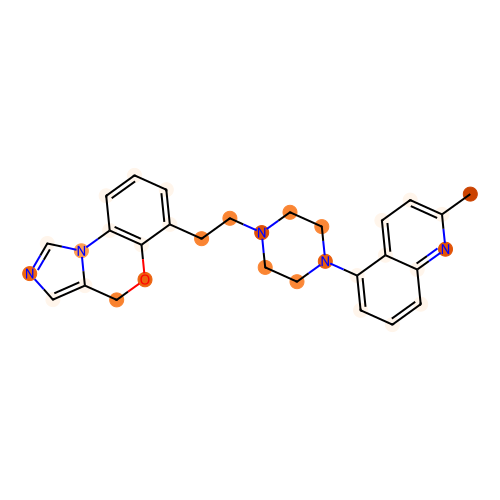

aromatic atom count: 6
prediction: [ 0.35912582 -0.45349097]
CCOC[C@@H](CC(C)C)NC(=O)[C@@H]1CNC[C@H](C(=O)N(c2ccc(C(C)C)c(OCCCOC)n2)C2CC2)C1


[16:37:55] The new font size 1 is below the current minimum (6).


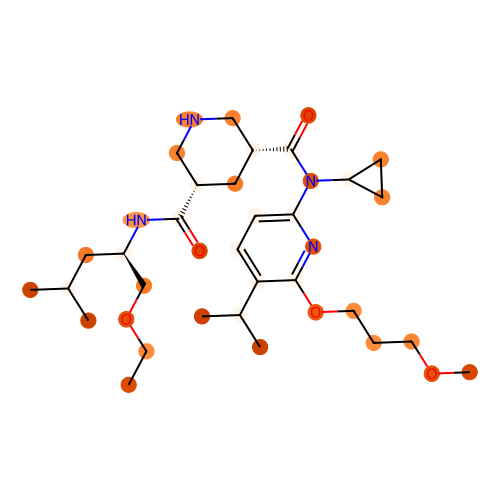

aromatic atom count: 12
prediction: [ 1.9150252 -1.413191 ]
CC(C)(C)Oc1cc([C@H](C2=CNC(C(C)(C)O)S2)c2cc[n+]([O-])cc2)ccc1OC(F)F


[16:37:56] The new font size 1 is below the current minimum (6).


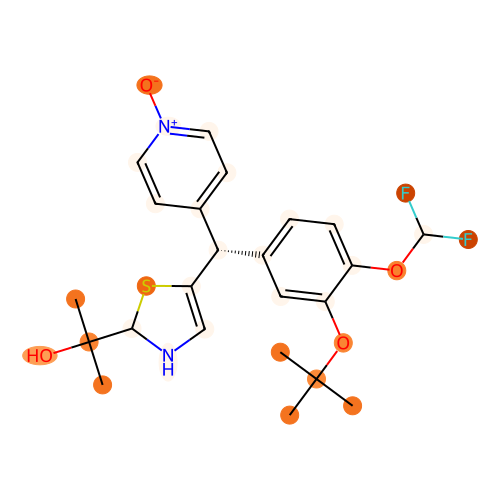

aromatic atom count: 24
prediction: [-1.425878   1.4028779]
NC1=N[C@@]2(CO1)c1cc(-c3cccnc3F)ccc1Oc1cnc(-c3ccccc3)cc12


[16:37:56] The new font size 1 is below the current minimum (6).


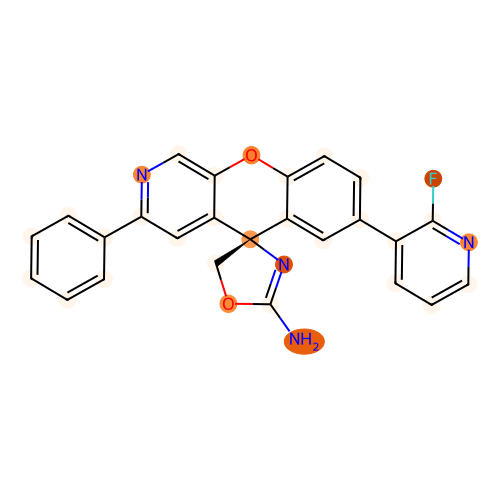

aromatic atom count: 16
prediction: [-1.4735773  1.4313518]
CCCOCCn1c(=O)c(N2CCN(CC)CC2)nc2cnc(-c3ccc(OC)nc3)cc21


[16:37:56] The new font size 1 is below the current minimum (6).


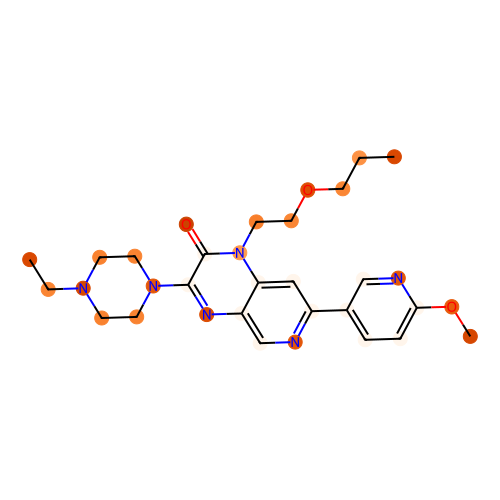

aromatic atom count: 15
prediction: [-2.3215318  2.1306357]
Clc1ccc(Cn2c(/C=C/C3CCN(CC4CCCCC4)C3)nc3cc(Br)ccc32)cc1


[16:37:56] The new font size 1 is below the current minimum (6).


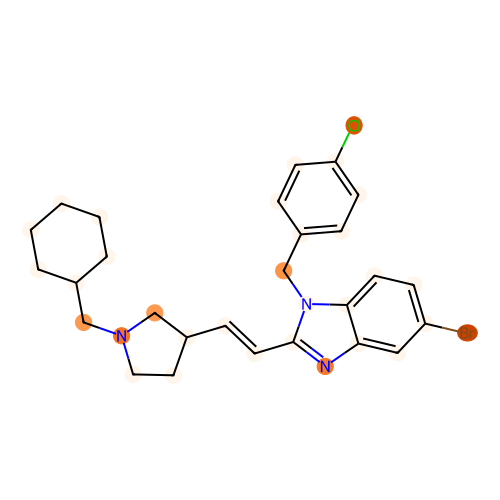

aromatic atom count: 24
prediction: [ 1.101065  -0.7929878]
COc1cc(N2C(=O)N(c3ccc(-c4ccc(C(=O)O)c(Cl)c4)cc3)C(=O)C23CCN(Cc2ncccc2C)CC3)ncn1


[16:37:56] The new font size 1 is below the current minimum (6).


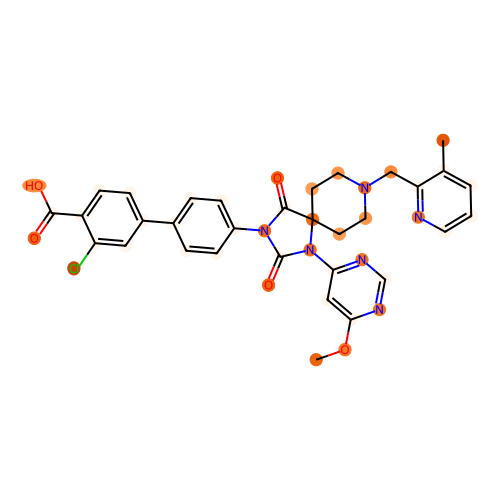

aromatic atom count: 27
prediction: [-1.5813178  1.5897717]
CC(=O)Nc1cccc(C2CCN(Cc3ccc(C(=O)c4nc5ccccc5n4-c4ccc(F)cc4)cc3)CC2)c1


[16:37:56] The new font size 1 is below the current minimum (6).


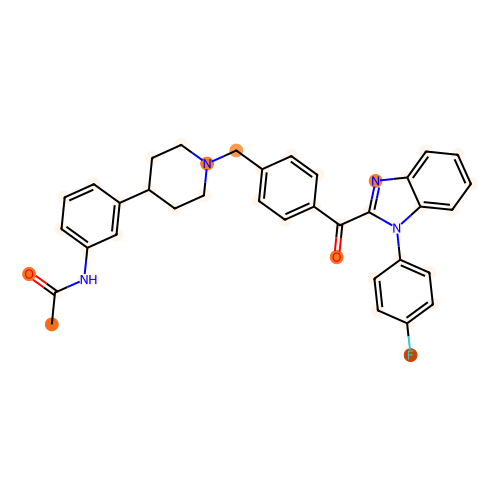

aromatic atom count: 12
prediction: [ 2.898815  -2.1609752]
O=C(Nc1cc(Cl)ccc1Cl)NS(=O)(=O)c1ccc(OCCCN2CCCCC2)cc1


[16:37:56] The new font size 1 is below the current minimum (6).


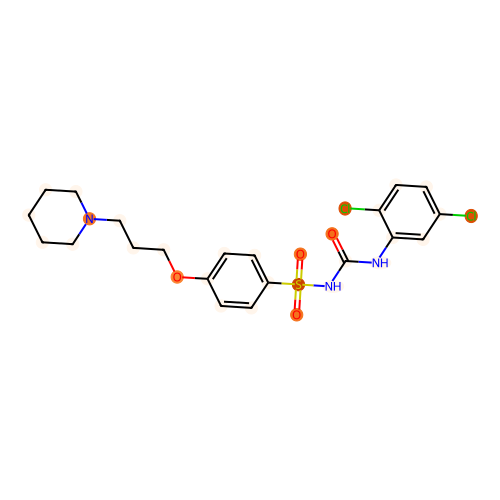

aromatic atom count: 26
prediction: [ 0.9969042  -0.65324366]
Cc1nc2ccccc2n1C1CC2CCC(C1)N2CCC1(c2ccccc2)CCN(C(=O)c2cccc(-c3noc(=S)[nH]3)c2)CC1


[16:37:56] The new font size 1 is below the current minimum (6).


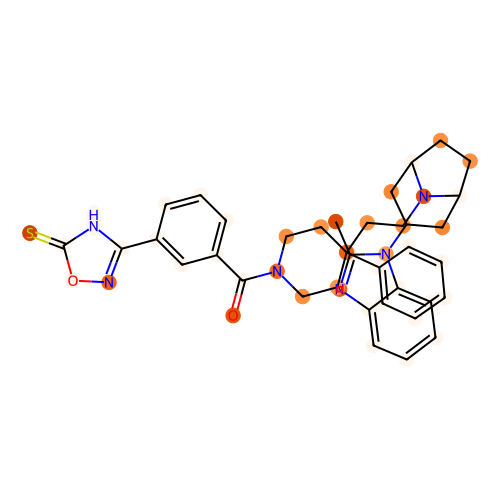

aromatic atom count: 18
prediction: [-0.9241039  0.9413943]
CC1(C)C=C(c2cc3c(cn2)Oc2ccc(-c4cccnc4F)cc2[C@@]32COC(N)=N2)CCO1


[16:37:56] The new font size 1 is below the current minimum (6).


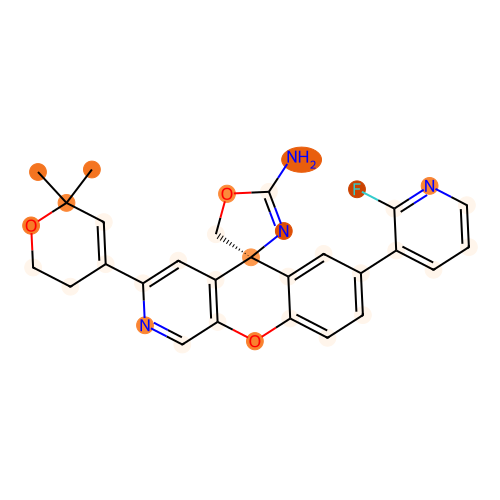

aromatic atom count: 12
prediction: [ 0.4000698 -0.3622105]
O=C(CNC(=O)c1cccc(C(F)(F)F)c1)NC1CN([C@H]2CC[C@H](c3cccnc3)CC2)C1


[16:37:56] The new font size 1 is below the current minimum (6).


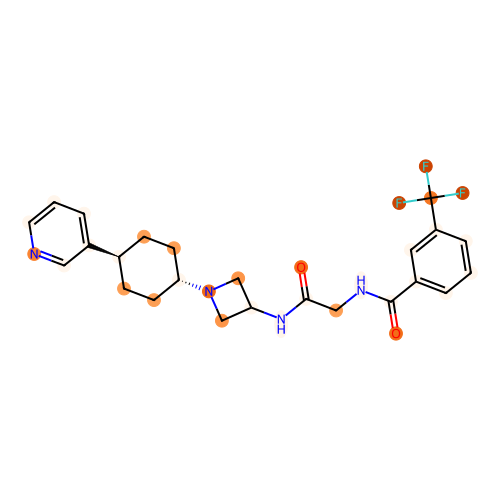

aromatic atom count: 16
prediction: [-0.16325152  0.11118512]
COc1ccc2ncc(S(C)(=O)=O)c(CCC34CCC(NCc5ccc6c(n5)NC(=O)CO6)(CC3)CO4)c2n1


[16:37:56] The new font size 1 is below the current minimum (6).


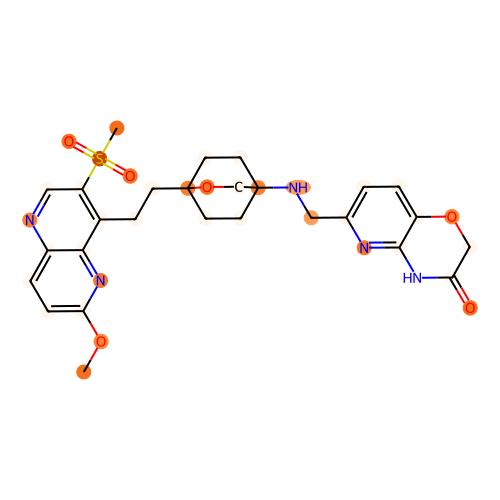

aromatic atom count: 6
prediction: [ 3.3987749 -2.6521425]
COC1COCCC1N[C@@H]1C[C@H]2C[C@@H](O)C[C@@]2(C(=O)N2CCc3ncc(C(F)(F)F)cc3C2)C1


[16:37:56] The new font size 1 is below the current minimum (6).


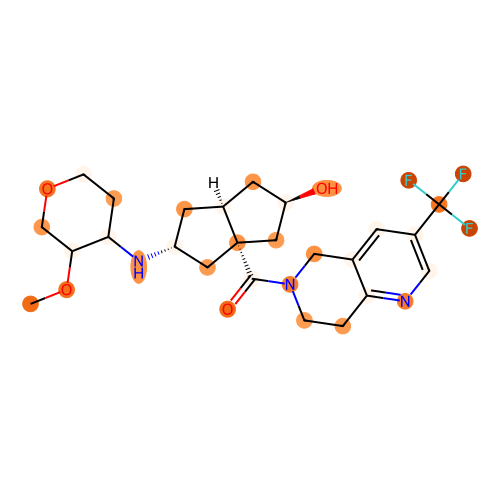

aromatic atom count: 19
prediction: [-1.8609989  1.6963956]
Cc1ncoc1-c1nnc(SCCCN2CCc3ccc4oc(C(F)(F)C(F)(F)F)nc4c3CC2)n1C


[16:37:56] The new font size 1 is below the current minimum (6).


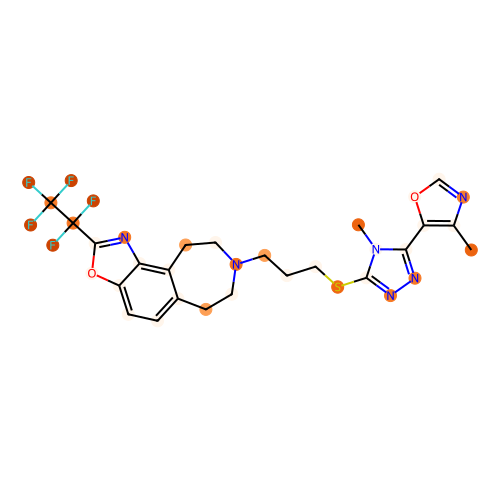

aromatic atom count: 21
prediction: [-1.213847  1.19826 ]
Cc1ccc2c(N3CCN(CCc4cccc5c4OCc4c(C(=O)NC6CCC6)ncn4-5)CC3)cccc2n1


[16:37:56] The new font size 1 is below the current minimum (6).


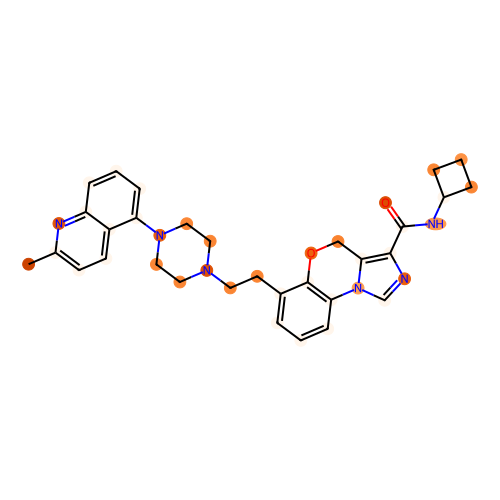

aromatic atom count: 18
prediction: [-0.6359657  0.7635898]
Cc1cc[n+]([O-])c(C)c1C(=O)N1CCC(C)(N2CCC(N(Cc3ccccc3)c3ccccc3)CC2)CC1


[16:37:56] The new font size 1 is below the current minimum (6).


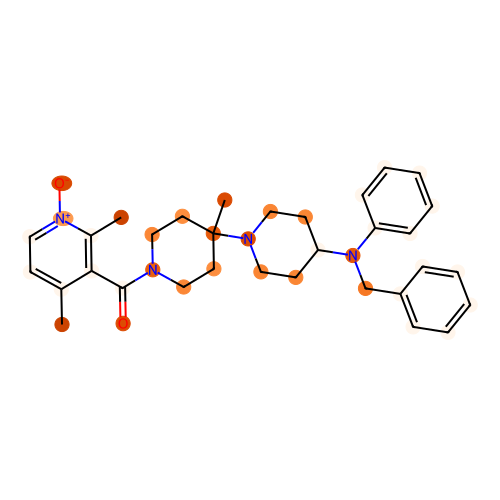

aromatic atom count: 18
prediction: [ 1.7808723 -1.2430557]
O=C(NCc1ccc(F)c(C(F)(F)F)c1)C1c2ccccc2C(=O)N1CCc1ncc(F)cn1


[16:37:56] The new font size 1 is below the current minimum (6).


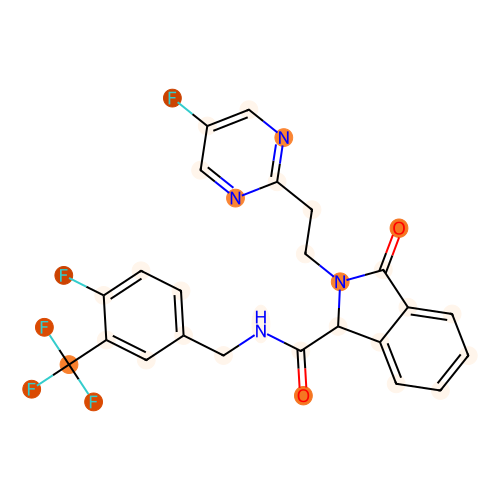

aromatic atom count: 18
prediction: [-0.908473   0.9461031]
Cc1cccc2c1C(C(=O)NCc1ccc(OC(F)(F)F)cc1)N(CCc1ccccn1)C2=O


[16:37:56] The new font size 1 is below the current minimum (6).


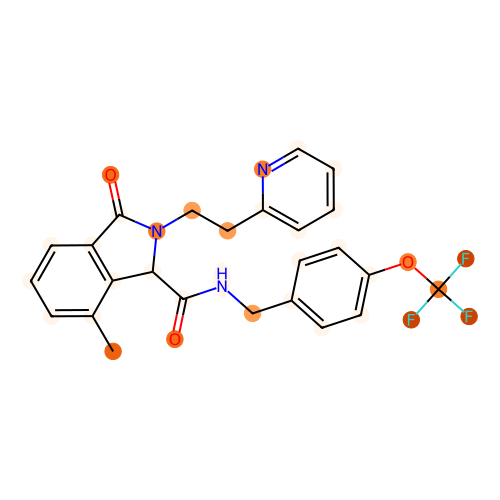

aromatic atom count: 24
prediction: [-1.4776305  1.5305847]
Cc1ccccc1[C@H]1C[C@@H](NCc2ccc(Cl)cc2)CC[C@@H]1C(=O)N1CC(c2ccccc2)(c2ccccc2)C1


[16:37:56] The new font size 1 is below the current minimum (6).


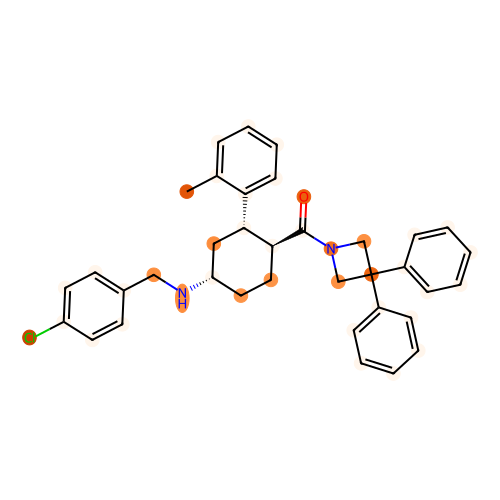

aromatic atom count: 21
prediction: [-1.5547352  1.5327042]
O=c1cc(OCc2ccccc2)ccn1-c1ccc2c(cnn2CCN2CCNCC2)c1


[16:37:56] The new font size 1 is below the current minimum (6).


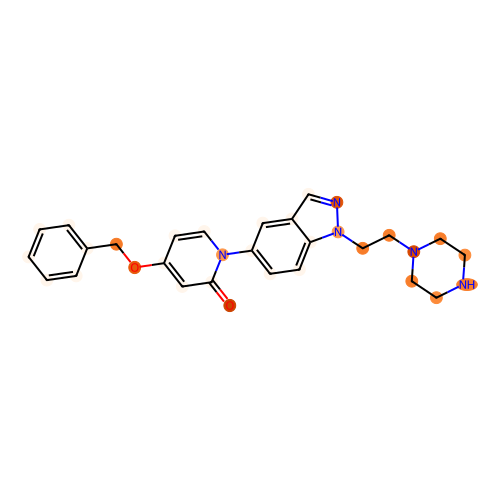

aromatic atom count: 18
prediction: [-1.0192008  1.0400269]
CC1(C)CC(NC(=O)C(F)(F)CO)c2cc(-c3ccc(Cl)cc3)c(-c3ccc(Cl)cc3Cl)nc2O1


[16:37:56] The new font size 1 is below the current minimum (6).


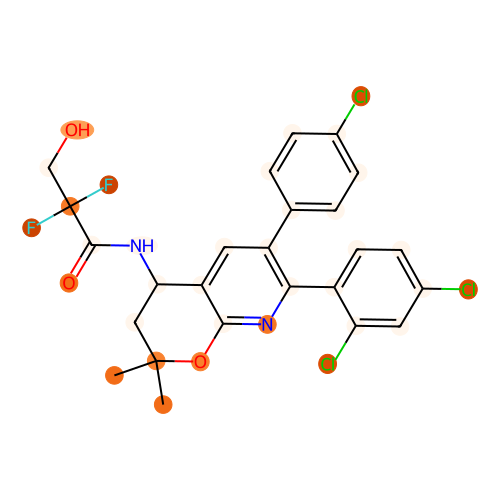

aromatic atom count: 23
prediction: [ 0.91753036 -0.63878524]
Cc1nc(C)c(-c2ccc(N3C(=O)N(c4cc(O)ncn4)C4(CCN(Cc5ncccc5C)CC4)C3=O)cc2)s1


[16:37:56] The new font size 1 is below the current minimum (6).


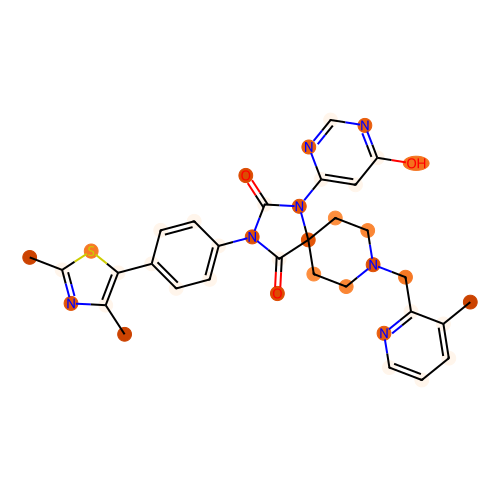

aromatic atom count: 17
prediction: [-1.0273703  1.1137179]
N#Cc1ccc2cc1Oc1ccc(Br)c(c1)CN1CC[C@@H](NCc3cncn3C2)C1=O


[16:37:56] The new font size 1 is below the current minimum (6).


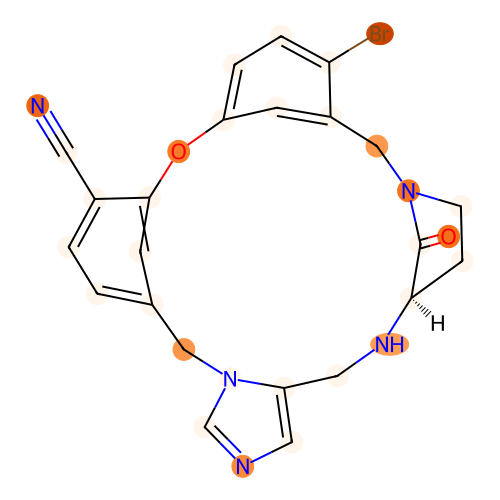

aromatic atom count: 12
prediction: [ 2.0831733 -1.6417038]
CC(C)N1CCC(Oc2ccc(N3CCN(C(=O)c4cc(F)cc(F)c4)CC3=O)cc2)CC1


[16:37:56] The new font size 1 is below the current minimum (6).


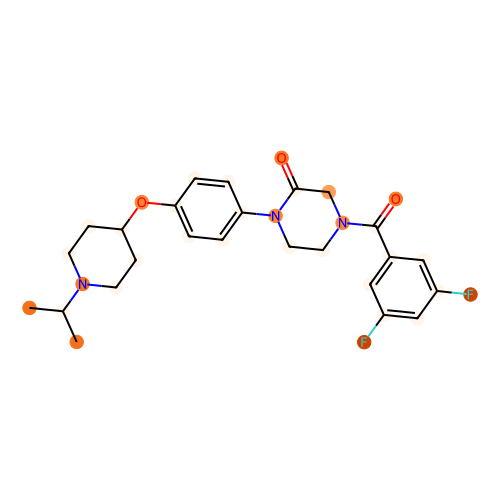

aromatic atom count: 12
prediction: [ 1.0952759  -0.84569836]
C[C@@H]1CCCN1CCCOc1ccc(N2CCN(C(=O)c3cc(F)cc(F)c3)CC2=O)cc1


[16:37:56] The new font size 1 is below the current minimum (6).


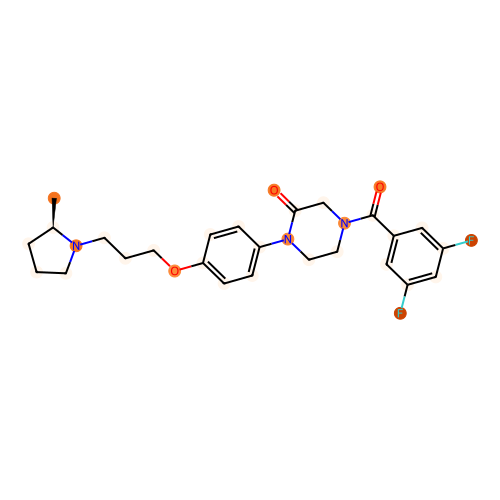

aromatic atom count: 21
prediction: [-0.80841815  0.8868064 ]
Cc1ccc2c(-c3nnc(SCCC(C)N4CCc5cc6c(cc5CC4)C(=O)N(C(C)C)C6)n3C)cccc2n1


[16:37:56] The new font size 1 is below the current minimum (6).


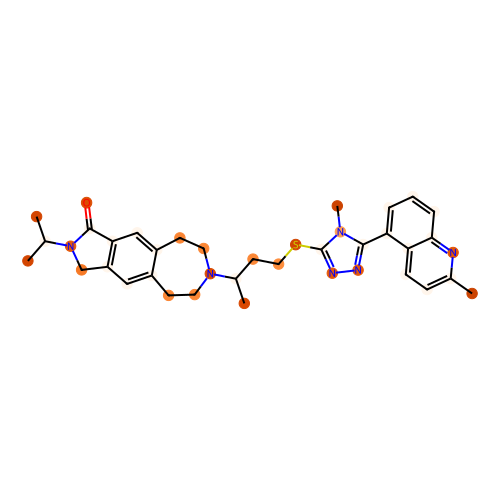

aromatic atom count: 16
prediction: [-1.3387359  1.2708207]
O=c1nc(NC2CC3CCC(C2)N3Cc2ccc3c(c2)OCO3)c2cc(Cl)ccc2n1CC(F)(F)F


[16:37:56] The new font size 1 is below the current minimum (6).


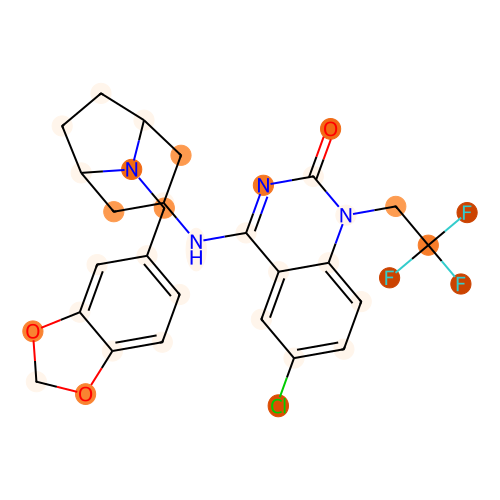

aromatic atom count: 19
prediction: [-1.4400287  1.3759415]
Cc1nc2ccc3c(c2s1)CCN(CCCSc1nnc(-c2ocnc2C)n1C)CC3


[16:37:56] The new font size 1 is below the current minimum (6).


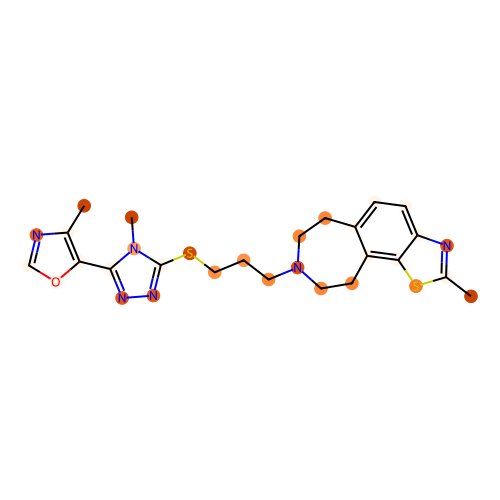

aromatic atom count: 20
prediction: [-1.0505394  1.103734 ]
Cc1cnc(-c2nnc(SCCCN3CCc4ccc5oc(C(F)(F)F)nc5c4CC3)n2C)cn1


[16:37:56] The new font size 1 is below the current minimum (6).


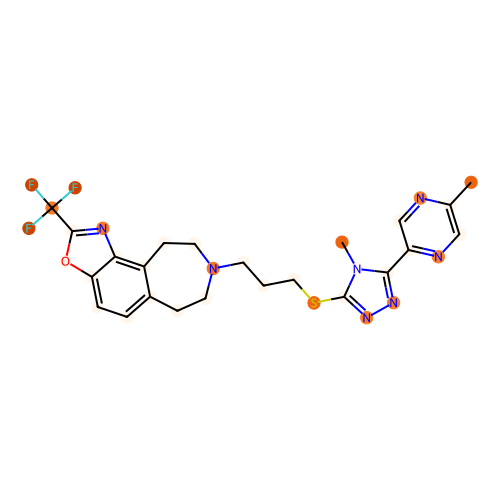

aromatic atom count: 16
prediction: [ 2.829078  -2.1364815]
O=C1COc2ccc(CNC34CCC(C[C@@]5(O)Cn6c(=O)ccc7ncc(F)c5c76)(CC3)OC4)nc2N1


[16:37:56] The new font size 1 is below the current minimum (6).


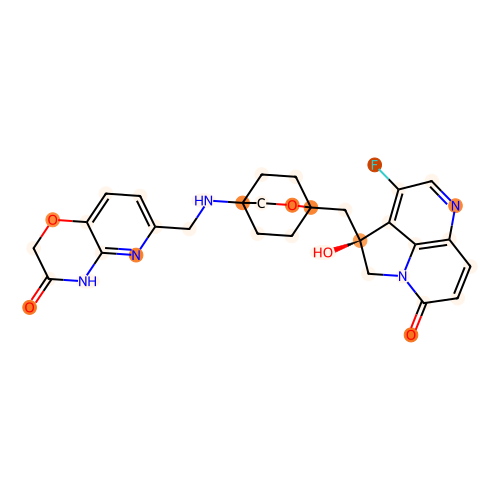

aromatic atom count: 12
prediction: [-0.01854148  0.11927319]
O=C(NC1CC1)c1ccc(OCCC2CC2C2CCN(c3ncc(Cl)cn3)CC2)cc1F


[16:37:56] The new font size 1 is below the current minimum (6).


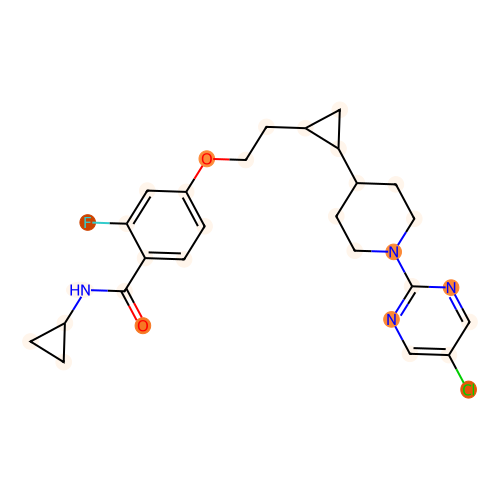

aromatic atom count: 16
prediction: [ 0.5810336 -0.4299121]
O=c1ccc2ncc(F)c3c2n1C[C@@]3(O)CC12CCC(NCc3ccc4c(c3)OC(F)(F)O4)(CC1)CO2


[16:37:56] The new font size 1 is below the current minimum (6).


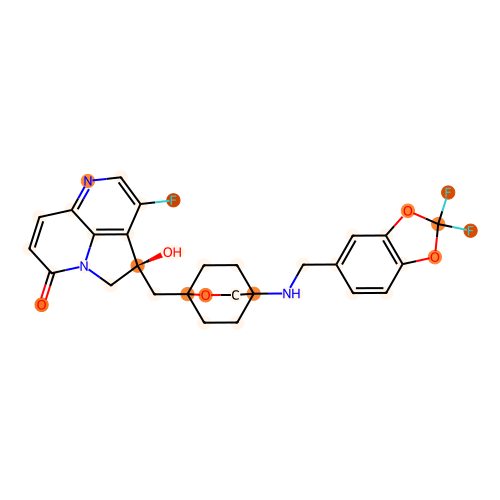

aromatic atom count: 18
prediction: [-1.6118277  1.6273035]
O=C1NCN(c2ccccc2)C12CC[NH+](CCCC(c1ccc(F)cc1)c1ccc(F)cc1)CC2


[16:37:56] The new font size 1 is below the current minimum (6).


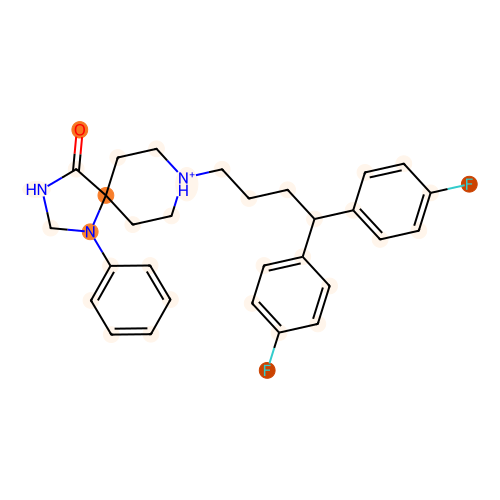

aromatic atom count: 12
prediction: [-0.99543536  0.9845965 ]
COc1ccc(CN[C@@H]2CC[C@@H](C(=O)N3CCC(C(=O)N4CCCC4)(c4ccccc4)CC3)C(C)(C)C2)cc1


[16:37:56] The new font size 1 is below the current minimum (6).


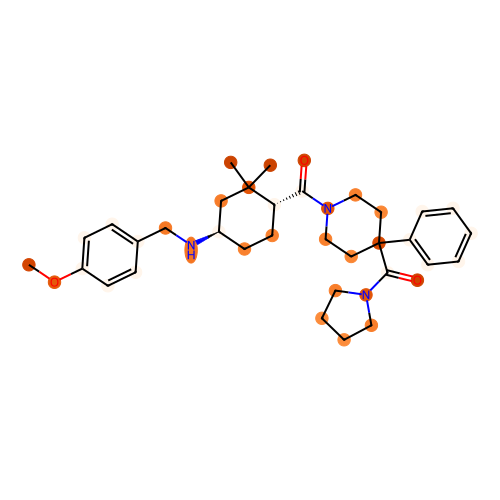

aromatic atom count: 16
prediction: [ 2.00029   -1.5406592]
COc1ccc(-c2ccc3c(N4CCOC[C@@H]4C)nc(N4CCOC[C@@H]4C)nc3n2)cc1CO


[16:37:56] The new font size 1 is below the current minimum (6).


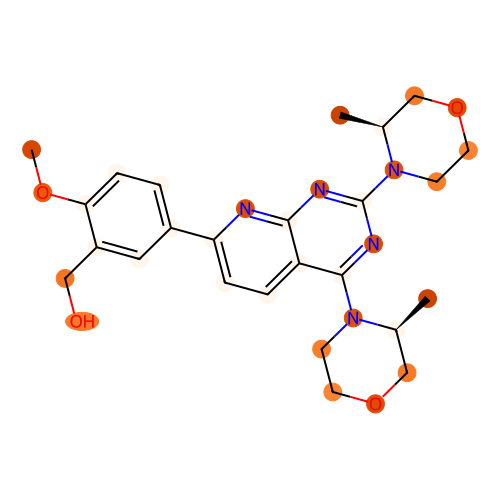

aromatic atom count: 16
prediction: [-1.0790558  1.077162 ]
Cc1ccc2c(N3CCN(CCCc4cccc5c4OCC(=O)N5C)CC3)cc(F)cc2n1


[16:37:56] The new font size 1 is below the current minimum (6).


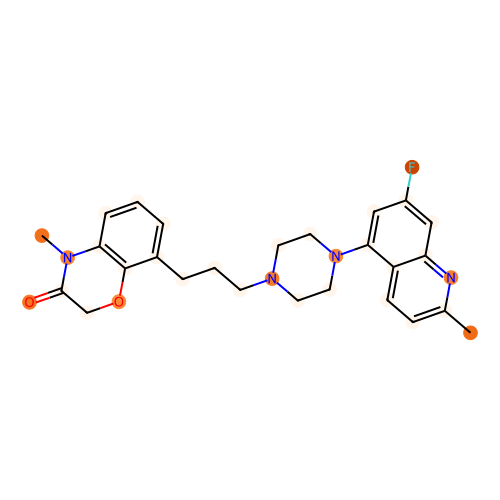

aromatic atom count: 11
prediction: [ 0.4111752  -0.36750102]
Cc1c2c(n3c1CCCN1CCOC[C@@H]1CNc1cc-3ccc1C(N)=O)CC(C)(C)CC2=O


[16:37:56] The new font size 1 is below the current minimum (6).


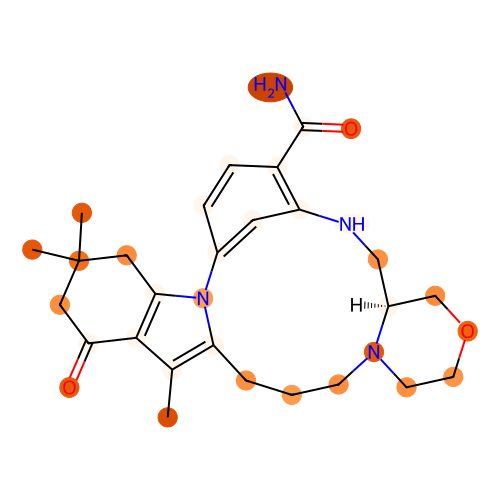

aromatic atom count: 15
prediction: [ 3.4684508 -2.6276011]
O=C(CNc1ncnc2ccc(C(F)(F)F)cc12)NC1CN([C@H]2CC[C@@](O)(c3nccs3)CC2)C1


[16:37:56] The new font size 1 is below the current minimum (6).


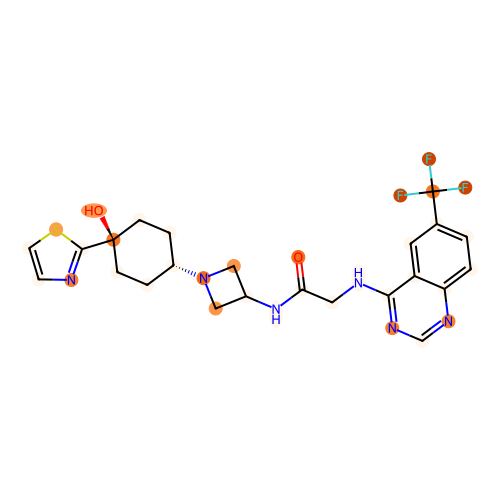

aromatic atom count: 18
prediction: [ 2.3014617 -1.6942911]
COc1cccc2c1nc(N)n1nc(CN3CCN(c4sc(C)nc4C)C[C@H]3C)nc21


[16:37:56] The new font size 1 is below the current minimum (6).


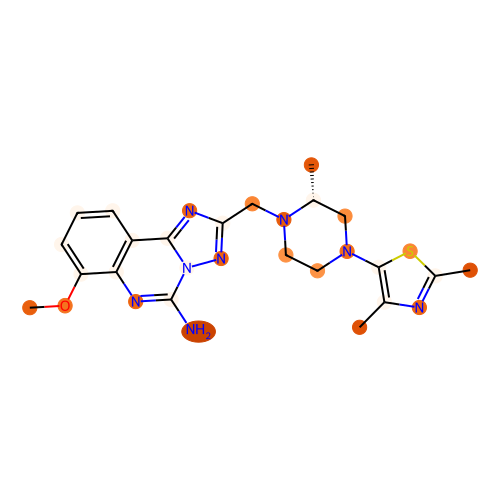

aromatic atom count: 12
prediction: [-0.03260062  0.11205077]
Cc1cc(Cl)ccc1OC1CCN(C[C@H](O)CNC(=O)c2c[nH]c(=O)cc2C(F)(F)F)CC1


[16:37:56] The new font size 1 is below the current minimum (6).


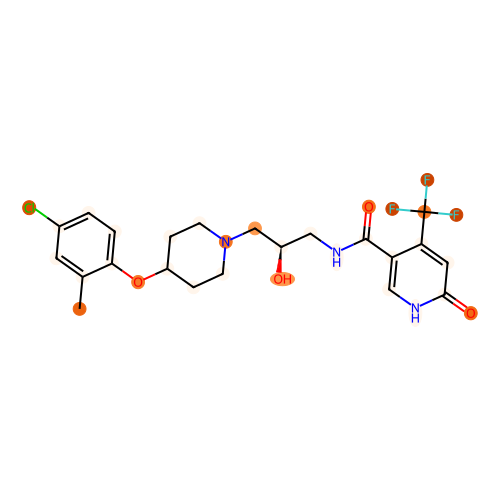

aromatic atom count: 12
prediction: [-0.16813281  0.18106696]
CC(C)CN(CC(C)C)c1cc(C(F)(F)F)cc(COCC2(c3ccc(F)cc3)CCN(C)CC2)n1


[16:37:56] The new font size 1 is below the current minimum (6).


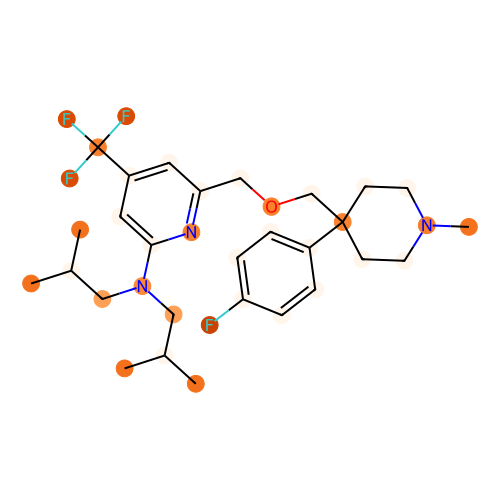

aromatic atom count: 15
prediction: [-1.9959782  1.8166138]
O=C(NC1CCc2ccc(CCN3CCN(c4nsc5ccccc45)CC3)cc21)C1CC1


[16:37:56] The new font size 1 is below the current minimum (6).


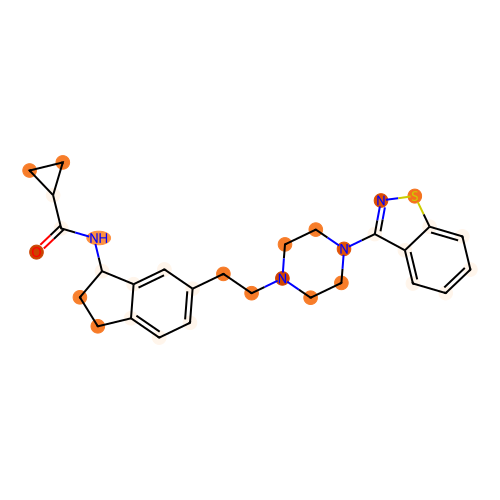

aromatic atom count: 18
prediction: [-0.12112604  0.15470245]
CC1(C)CN(c2cc3c(cn2)Oc2ccc(-c4cccnc4F)cc2[C@@]32COC(N)=N2)CCO1


[16:37:56] The new font size 1 is below the current minimum (6).


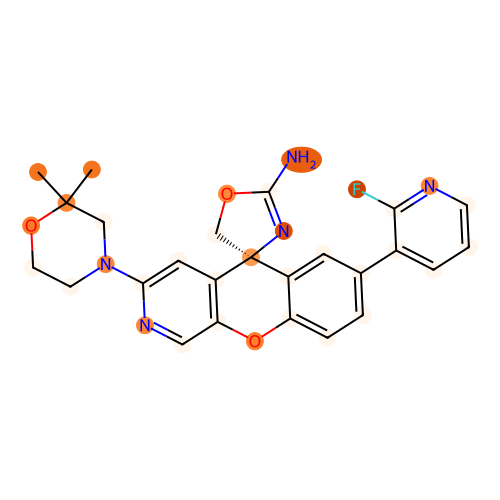

aromatic atom count: 12
prediction: [-0.6274595  0.7067295]
COC(=O)C1(CNC(=O)c2cc(OC)cc(OC)c2)CCN(Cc2ccccc2C(F)(F)F)CC1


[16:37:56] The new font size 1 is below the current minimum (6).


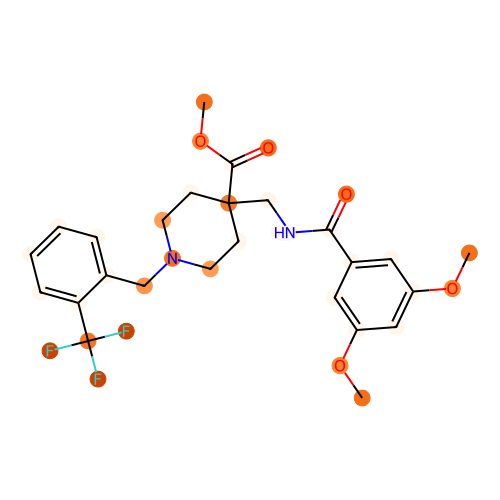

[16:37:56] The new font size 1 is below the current minimum (6).


aromatic atom count: 16
prediction: [-1.6117224  1.4909204]
Cn1c(=O)nc(NC2CC3CCC(C2)N3Cc2ccc3c(c2)OCO3)c2cc(Cl)ccc21


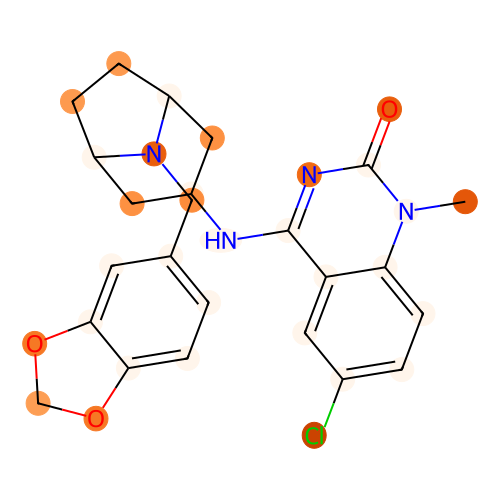

[16:37:56] The new font size 1 is below the current minimum (6).


aromatic atom count: 12
prediction: [-1.5640079  1.5494604]
COC(=O)C(CCCN1CCC(c2ccccc2OC)CC1)(c1ccc(Br)cc1)C(C)C


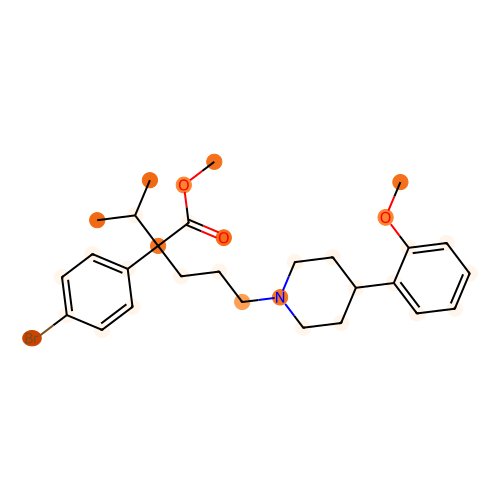

aromatic atom count: 12
prediction: [ 2.0553703 -1.4457855]
C[C@H]1CCCN1CCCOc1ccc(N2CCN(C(=O)c3ccc(F)cc3)CC2=O)cc1


[16:37:56] The new font size 1 is below the current minimum (6).


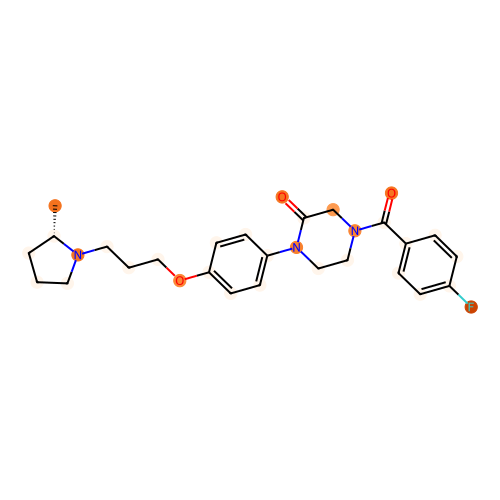

aromatic atom count: 21
prediction: [ 2.202168  -1.6042746]
CS(=O)(=O)c1cccc(-c2ccc3ncc(-c4ccc(C(=O)N5CCC(O)C5)cc4)n3n2)c1


[16:37:56] The new font size 1 is below the current minimum (6).


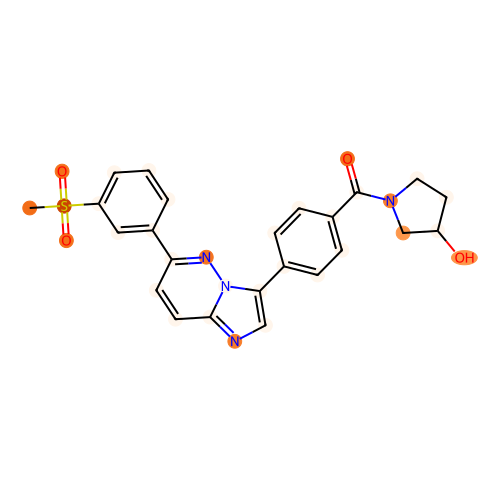

aromatic atom count: 22
prediction: [-0.98722523  1.0592729 ]
COc1cc(-c2cn(CC(=O)N(Cc3ccccc3)CC(F)(F)F)nn2)ccc1-n1cnc(C)c1


[16:37:56] The new font size 1 is below the current minimum (6).


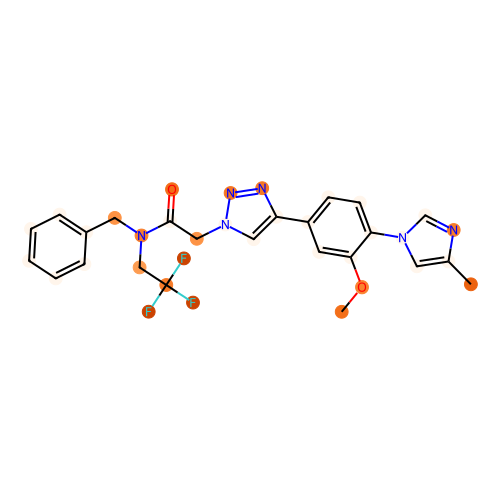

aromatic atom count: 12
prediction: [ 1.1449025 -0.8404293]
O=C(O)C(c1ccccc1)N1CCC(N2CCC(Oc3ccc(Cl)c(Cl)c3)CC2)CC1


[16:37:56] The new font size 1 is below the current minimum (6).


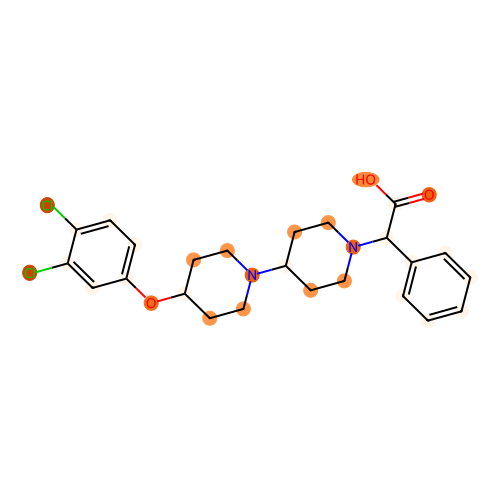

aromatic atom count: 19
prediction: [-1.8368195  1.6870865]
Cc1ncoc1-c1nnc(SCCCN2CCc3nc4cc(C(F)(F)F)ccn4c3CC2)n1C


[16:37:56] The new font size 1 is below the current minimum (6).


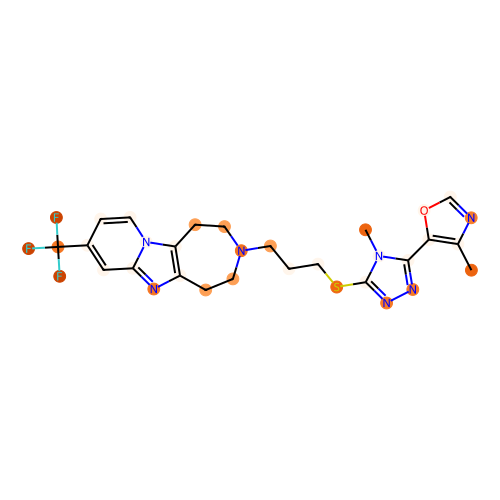

aromatic atom count: 16
prediction: [ 0.5423672 -0.4428807]
O=C1COc2ccc(CNC34CCC(CCc5c(F)cnc6ccc(OCC(O)CO)nc56)(CC3)OC4)nc2N1


[16:37:56] The new font size 1 is below the current minimum (6).


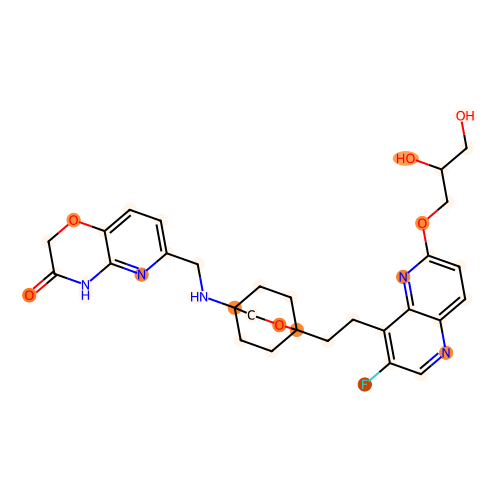

aromatic atom count: 18
prediction: [-1.7428908  1.6608812]
CC(C)CN1CCC(c2ccccc2Oc2ncccc2NC(=O)Nc2ccc(OC(F)(F)F)cc2)CC1


[16:37:56] The new font size 1 is below the current minimum (6).


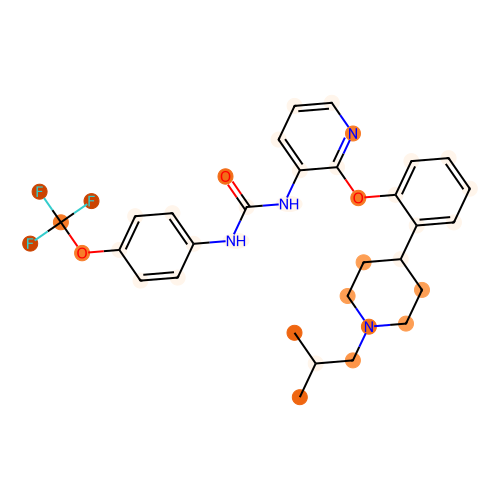

aromatic atom count: 15
prediction: [-1.4163691  1.449017 ]
CN(CC1CCOCC1)C1CCN(c2nc3ccccc3n2Cc2ccc(F)cc2)CC1


[16:37:56] The new font size 1 is below the current minimum (6).


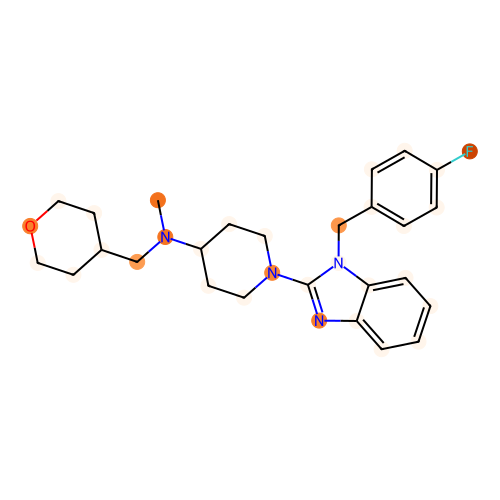

aromatic atom count: 18
prediction: [ 1.1039178 -0.7427016]
O=C(N[C@@H]1COc2cccc(-c3ccnc(CO)c3)c2C1)c1ccc(OCC(F)(F)F)nc1


[16:37:56] The new font size 1 is below the current minimum (6).


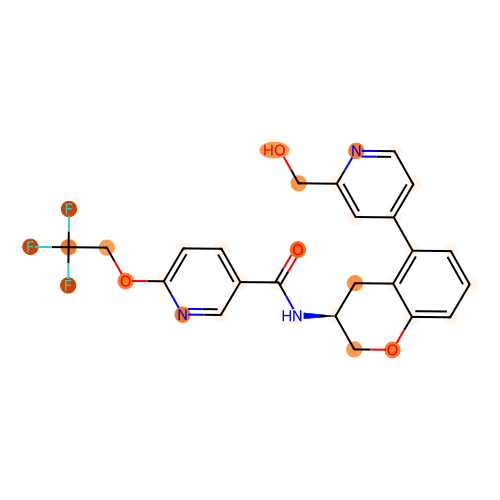

aromatic atom count: 18
prediction: [ 0.38576037 -0.17738628]
COc1ccc(C(=O)N(c2cc(C)ccn2)C2CCN(c3cc(N)ccn3)CC2)cc1


[16:37:56] The new font size 1 is below the current minimum (6).


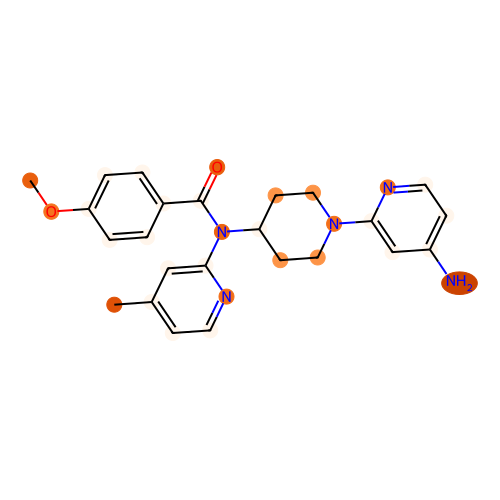

aromatic atom count: 6
prediction: [-0.42693856  0.4394223 ]
CCOC(=O)N1CCC(C)(CN2CCC3(CC2)CN(S(C)(=O)=O)c2ncccc23)CC1


[16:37:56] The new font size 1 is below the current minimum (6).


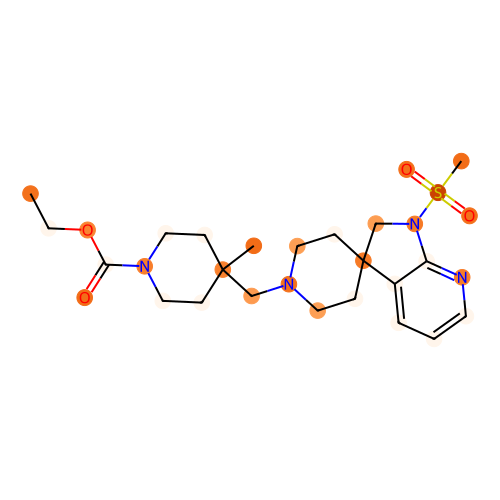

aromatic atom count: 6
prediction: [ 0.33491504 -0.26441646]
COCC[C@@H]1C[C@H](N(C)C(C)C)CC[C@@H]1NC(=O)CNC(=O)c1cccc(C(F)(F)F)c1


[16:37:56] The new font size 1 is below the current minimum (6).


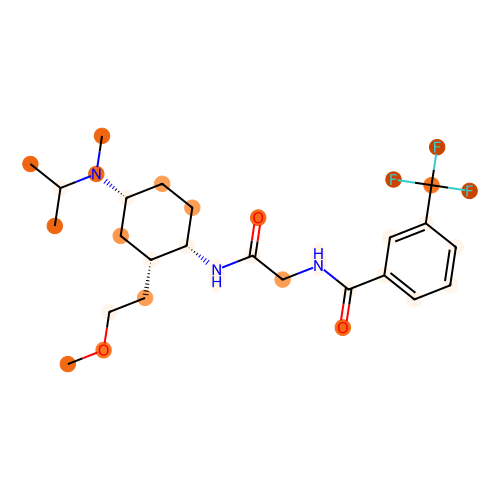

aromatic atom count: 12
prediction: [-1.2617702  1.2746073]
O=C(CNC(=O)c1cccc(C(F)(F)F)c1)N[C@@H]1CCN(CCC2CCN(C(=O)c3ccccc3F)CC2)C1


[16:37:56] The new font size 1 is below the current minimum (6).


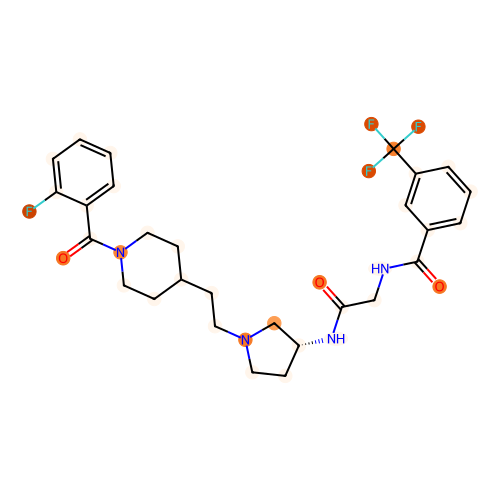

aromatic atom count: 12
prediction: [-1.0056152  1.0476795]
COc1ccc(CCN(C)CCCC(C#N)(c2ccc(OC)c(OC)c2)C(C)C)cc1OC


[16:37:56] The new font size 1 is below the current minimum (6).


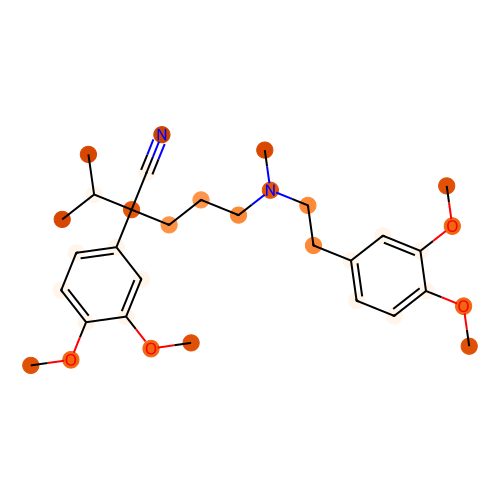

aromatic atom count: 18
prediction: [-1.7200848  1.6694771]
COc1ccc([C@H]2CN(CCc3ccc(OC)c(OC)c3)C[C@@H]2CCNC(=O)c2cccc(Cl)c2)cc1


[16:37:56] The new font size 1 is below the current minimum (6).


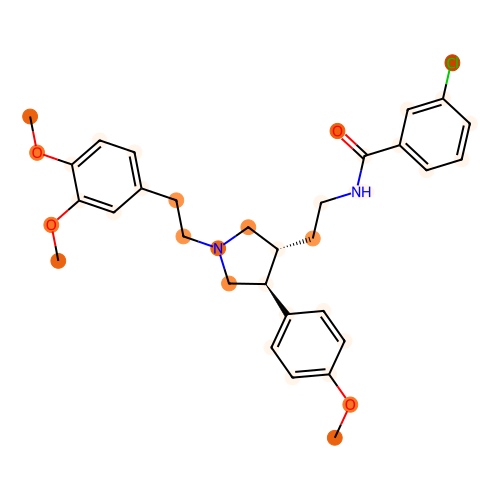

aromatic atom count: 24
prediction: [ 1.9608539 -1.4274662]
NC1=N[C@@]2(CO1)c1cc(-c3cccnc3F)ccc1Oc1c2cc(-c2cccnc2)nc1F


[16:37:56] The new font size 1 is below the current minimum (6).


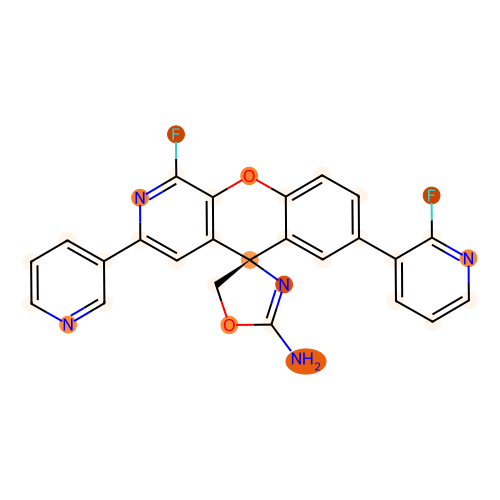

aromatic atom count: 21
prediction: [-1.1058316  1.1132047]
Cc1ccc2c(N3CCN(CCc4cccc5c4OCc4c(C(=O)NCC6CC6)ncn4-5)CC3)cccc2n1


[16:37:56] The new font size 1 is below the current minimum (6).


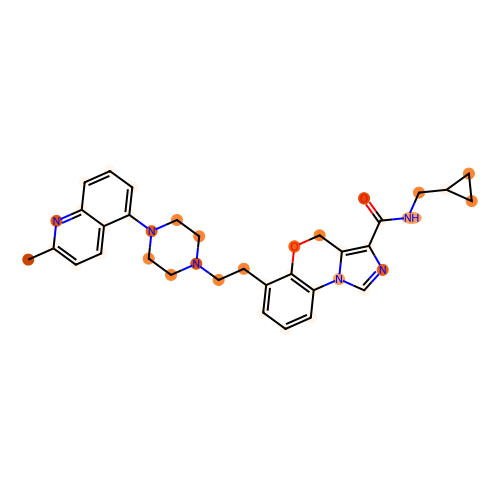

aromatic atom count: 12
prediction: [ 2.61026  -2.101066]
N/C1=N\C(=O)[C@@H]2CCCN2c2ccc(cc2)OC/C=C/CCNCC(=O)Nc2c(Cl)cc(cc2Cl)CN1


[16:37:57] The new font size 1 is below the current minimum (6).


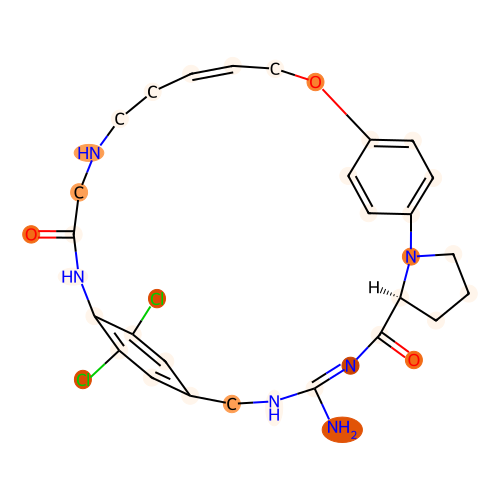

aromatic atom count: 24
prediction: [-1.5149661  1.4184788]
COC(=O)c1ccc(Sc2ccc(NC(=O)c3ccc(C(=N)N(C)C)cc3)c(C(=O)Nc3ccc(Cl)cn3)c2)cc1


[16:37:57] The new font size 1 is below the current minimum (6).


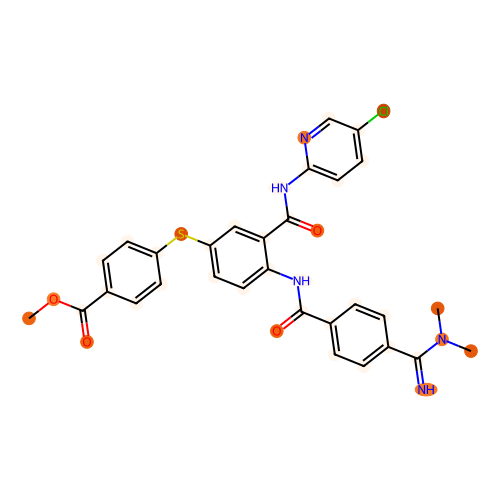

[16:37:57] The new font size 1 is below the current minimum (6).


aromatic atom count: 16
prediction: [-1.190668   1.3133382]
COc1cccc2nc(C)n(-c3ccc(OC4CCN(C5CCC5)CC4)cc3)c(=O)c12


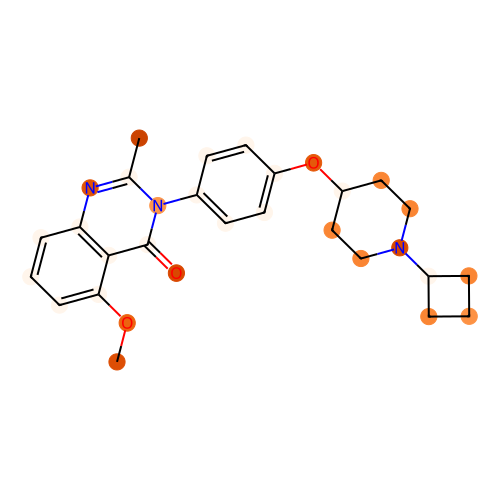

aromatic atom count: 23
prediction: [ 0.7475843 -0.5447534]
O=C1Nc2cc(NC(=O)c3c[nH]cc(-c4ccccc4F)c3=O)ccc2/C1=C/c1ccc[nH]1


[16:37:57] The new font size 1 is below the current minimum (6).


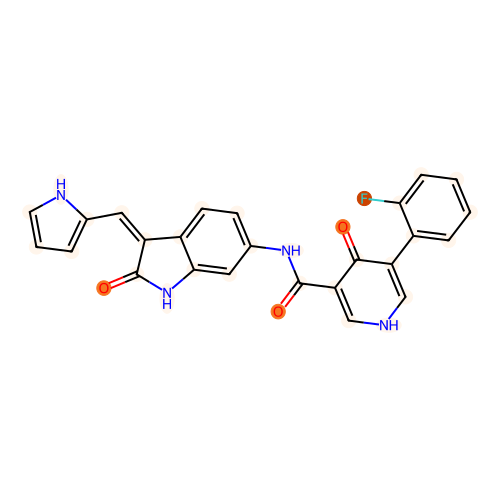

aromatic atom count: 24
prediction: [ 1.7644717 -1.2121896]
Nc1ccc(-c2ccccc2)cc1NC(=O)c1ccc(CNC(=O)OCc2cccnc2)cc1


[16:37:57] The new font size 1 is below the current minimum (6).


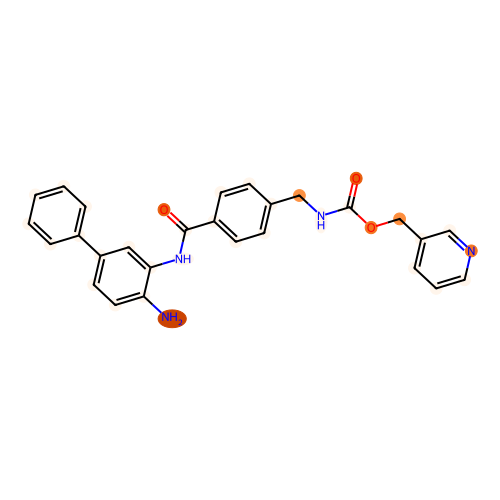

aromatic atom count: 16
prediction: [-1.7221049  1.6066635]
COc1ccc(C23CC2CN(CCCSc2nnc(-c4ocnc4C)n2C)C3)cc1C(F)(F)F


[16:37:57] The new font size 1 is below the current minimum (6).


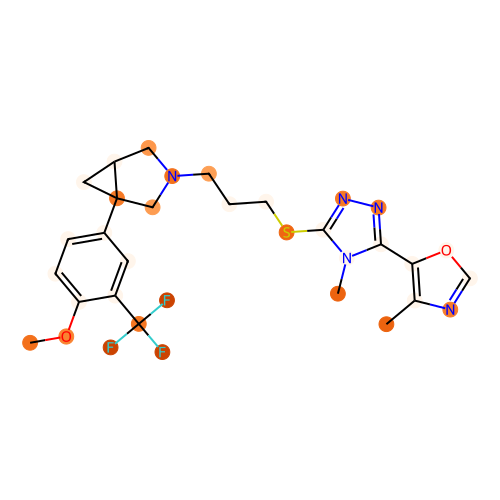

aromatic atom count: 16
prediction: [ 1.9342724 -1.5149409]
COc1ccc2nccc(NC(=O)[C@]3(O)CC[C@@H](NCc4cc5c(cn4)OCCO5)CC3)c2n1


[16:37:57] The new font size 1 is below the current minimum (6).


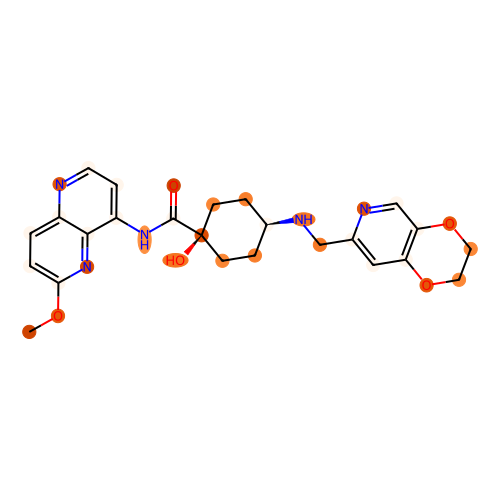

aromatic atom count: 12
prediction: [ 0.33121085 -0.26001206]
CCO[C@H]1CN([C@H]2CC[C@@](O)(c3ccc4c(c3)OCO4)CC2)C[C@@H]1NC(=O)CNC(=O)c1cccc(C(F)(F)F)c1


[16:37:57] The new font size 1 is below the current minimum (6).


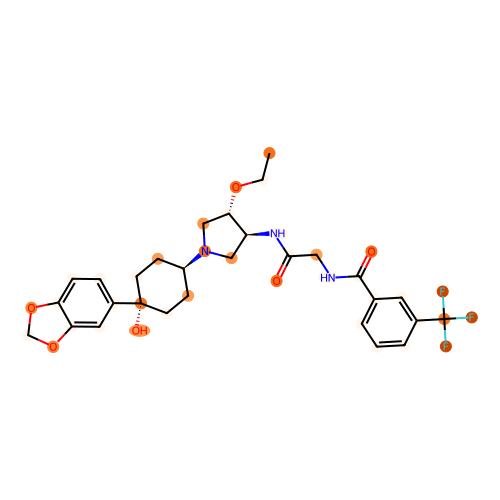

aromatic atom count: 15
prediction: [ 1.507338  -1.2093467]

[16:37:57] The new font size 1 is below the current minimum (6).



CC(C(=O)O)c1ccc(CN2CCC(COC(=O)c3c4n(c5ccccc35)CCCO4)CC2)cc1


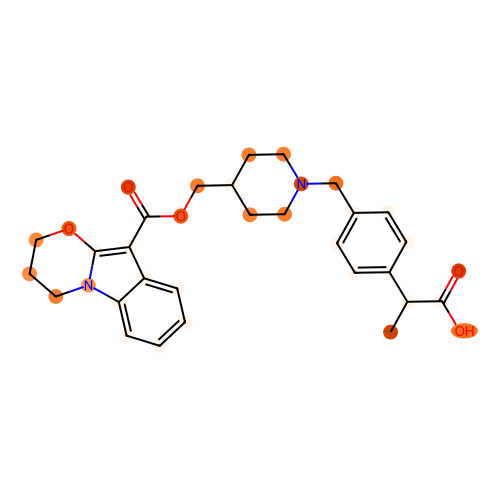

aromatic atom count: 10
prediction: [ 1.4794898 -1.0349361]
CN(C)CCC1CCN(c2cc(C(=O)NC[C@H]3CC[C@H](CNC(=O)OC(C)(C)C)CC3)c3ccccc3n2)CC1


[16:37:57] The new font size 1 is below the current minimum (6).


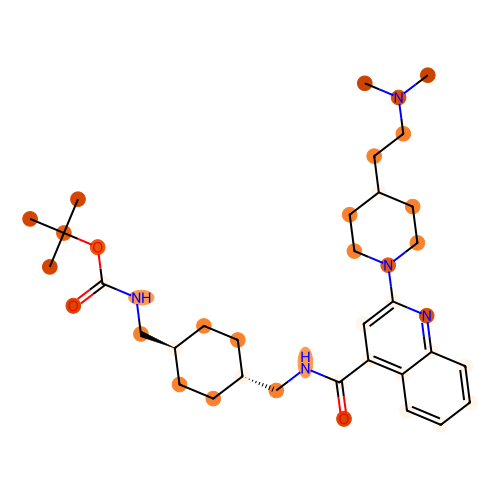

aromatic atom count: 19
prediction: [0.03593487 0.03451264]
CC(C)=CCn1c(N2CCC[C@H](N)C2)c(C#N)c2ncn(Cc3ccnc4ccccc34)c(=O)c21


[16:37:57] The new font size 1 is below the current minimum (6).


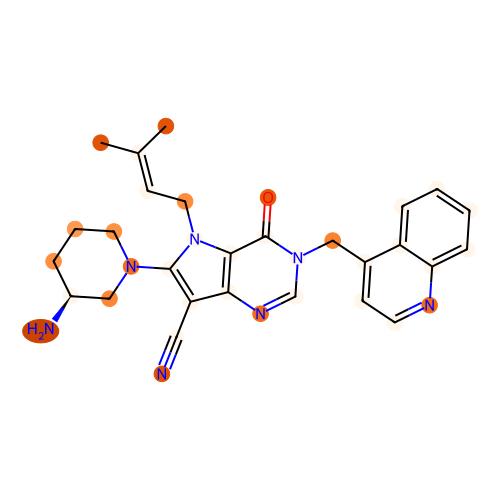

aromatic atom count: 16
prediction: [ 2.3564012 -1.7166554]
CN1CCOc2ccc(CNC34CCC(C[C@]5(O)Cn6c(=O)ccc7ncc(F)c5c76)(CC3)OC4)nc21


[16:37:57] The new font size 1 is below the current minimum (6).


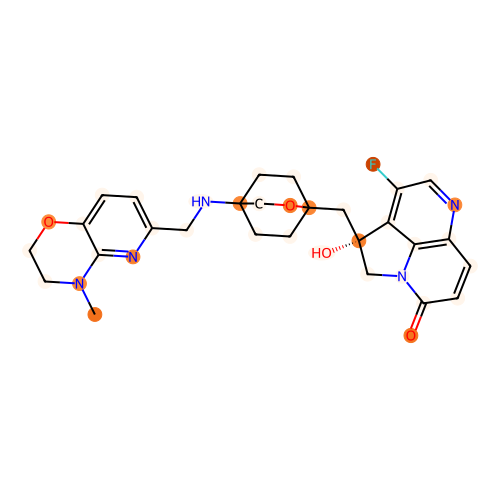

aromatic atom count: 16
prediction: [-0.33253887  0.42338464]
N#Cc1ccccc1[C@H]1CC[C@@H](N2CC(NC(=O)CNc3ncnc4ccc(C(F)(F)F)cc34)C2)CC1


[16:37:57] The new font size 1 is below the current minimum (6).


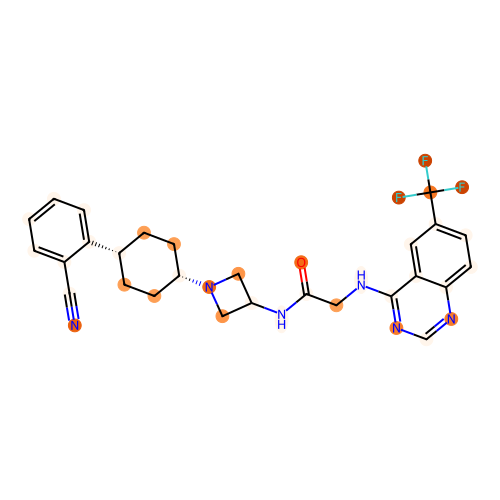

aromatic atom count: 17
prediction: [-0.17311962  0.33605543]
O=C(NC1CCN(Cc2ccn(-c3ccc(C(F)(F)F)cc3)c2)CC1)N1CCC(c2ccccc2O)CC1


[16:37:57] The new font size 1 is below the current minimum (6).


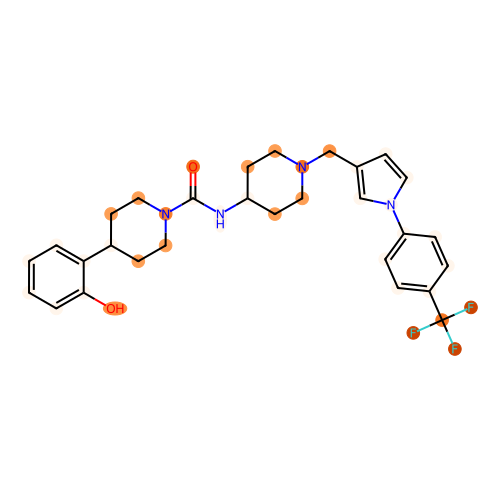

aromatic atom count: 27
prediction: [-2.0551815  1.926421 ]
COc1cc(-c2cn(Cc3cccc(-c4noc(C)n4)c3)nn2)ccc1-n1cnc(C)c1


[16:37:57] The new font size 1 is below the current minimum (6).


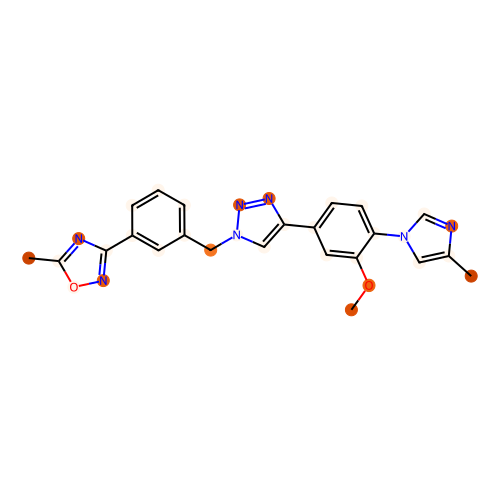

aromatic atom count: 21
prediction: [-2.086025  1.972948]
O=C(NC1CCc2ccc(CCN3CCN(c4nsc5ccccc45)CC3)cc21)c1ccccc1


[16:37:57] The new font size 1 is below the current minimum (6).


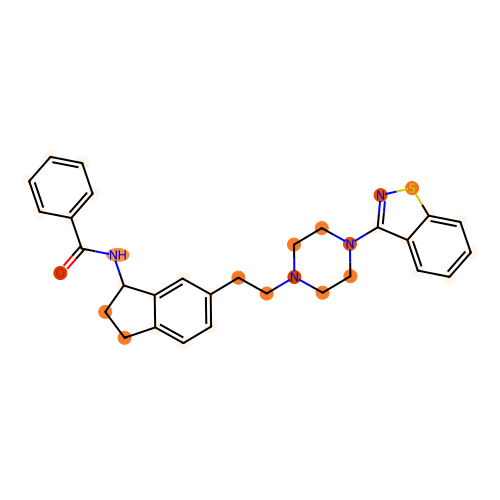

aromatic atom count: 12
prediction: [-1.6253873  1.5352521]
C[C@@H](N[C@@H]1CC[C@@H](C(=O)N2CCC(C(=O)N3CCCC3)(c3ccccc3)CC2)C(C)(C)C1)c1ccc(F)cc1


[16:37:57] The new font size 1 is below the current minimum (6).


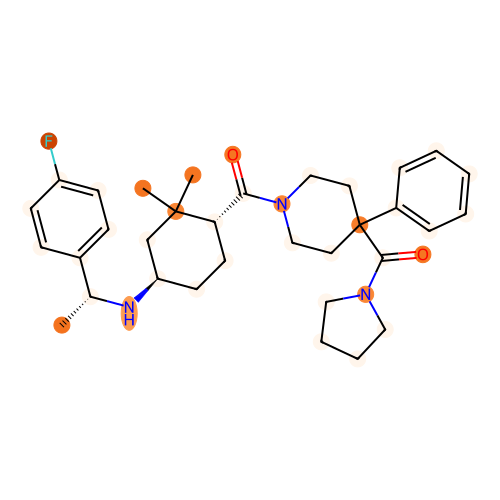

aromatic atom count: 18
prediction: [-1.1748182  1.1974947]
CC(C)(C)c1cc(C(=O)N2CCN(CCCCCC(c3ccc(F)cc3)c3ccc(F)cc3)CC2)cc(C(C)(C)C)c1O


[16:37:57] The new font size 1 is below the current minimum (6).


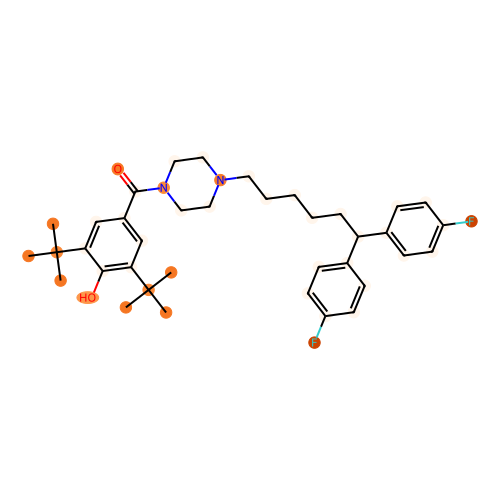

aromatic atom count: 16
prediction: [-1.4371482  1.4089757]
COc1ccc(C23CC2CN(CCCSc2nnc(-c4ocnc4C)n2C)C3)cc1Cl


[16:37:57] The new font size 1 is below the current minimum (6).


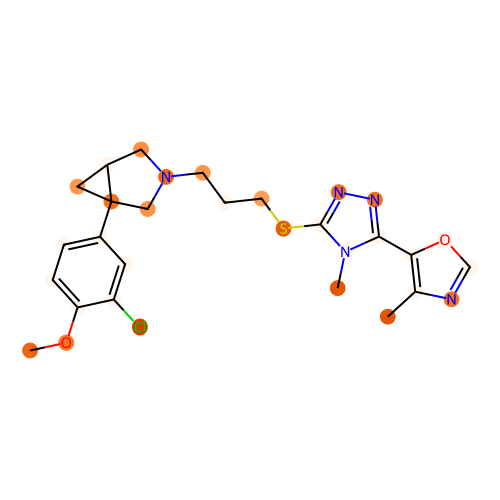

aromatic atom count: 16
prediction: [ 0.96725446 -0.81784743]
CC(=O)Nc1ccc2c(c1)C(N1CCC(NC(=O)c3cc(=O)c4ccc(F)cc4o3)CC1)CC2


[16:37:57] The new font size 1 is below the current minimum (6).


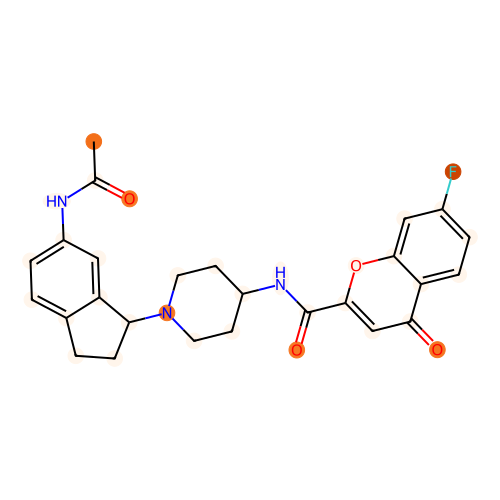

aromatic atom count: 18
prediction: [-0.26969987  0.33739707]
CN1C[C@H](C(=O)Nc2ccc(Cl)cc2)[C@@H](c2ccc(/C=C/C(=O)Nc3ccccc3N)cc2)C1


[16:37:57] The new font size 1 is below the current minimum (6).


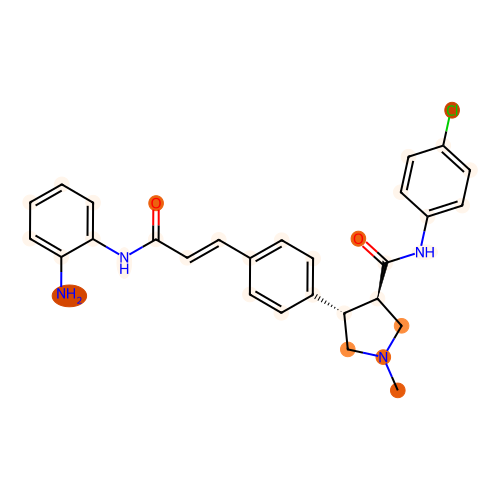

aromatic atom count: 18
prediction: [ 3.773562  -2.6984537]
Cc1cnc(NC(=O)c2cc(Oc3ccc(C(=O)N4CCC4)cc3)cc(O[C@@H](C)CO)c2)cn1


[16:37:57] The new font size 1 is below the current minimum (6).


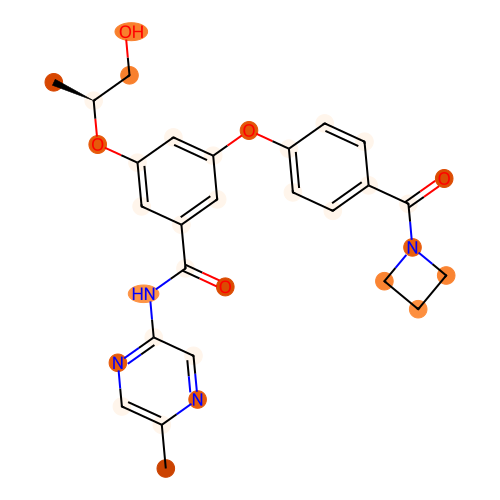

aromatic atom count: 12
prediction: [-2.165085  1.961916]
COc1cc(CCN2CCN(CC(C)c3ccc4c(c3C)COC4=O)CC2)ccc1C#N


[16:37:57] The new font size 1 is below the current minimum (6).


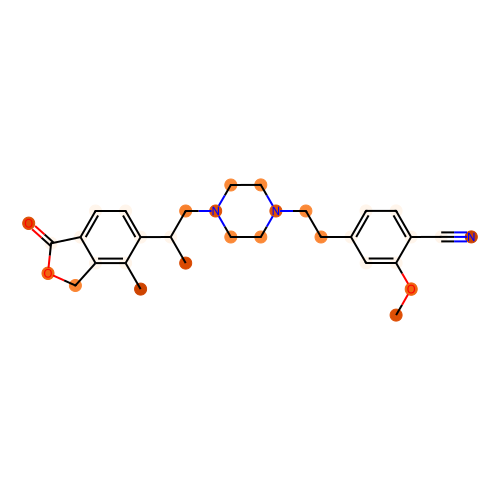

aromatic atom count: 12
prediction: [-0.26262352  0.28799653]
CCN(C(=O)Cc1ccc(S(C)(=O)=O)cc1)C1CCN(CC[C@@H](c2cc(Cl)cc(Cl)c2)C2CCN(S(C)(=O)=O)CC2)CC1


[16:37:57] The new font size 1 is below the current minimum (6).


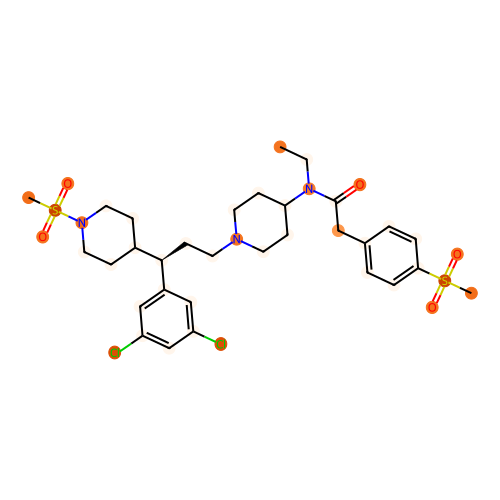

[16:37:57] The new font size 1 is below the current minimum (6).


aromatic atom count: 18
prediction: [-1.355266   1.4441335]
O=C(c1ccc(Cl)cc1)N1CCC2(CCN(Cc3cccc(Oc4ccccc4)c3)CC2)CC1


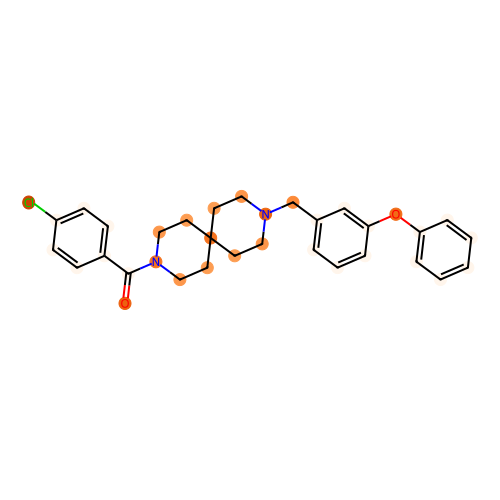

aromatic atom count: 18
prediction: [ 0.97410566 -0.64278376]
Cc1ncc(-c2cccc3c2C[C@H](NC(=O)c2ccc(OCC(F)(F)F)nc2)CO3)cn1


[16:37:57] The new font size 1 is below the current minimum (6).


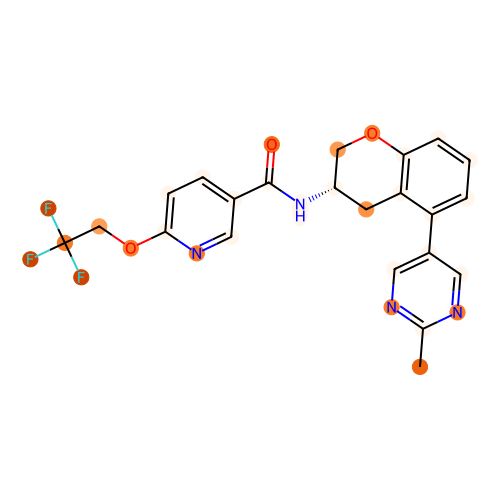

aromatic atom count: 21
prediction: [ 1.8602061 -1.3220105]
N#Cc1ccc(N2N=C(c3ccc4[nH]c(=O)oc4c3)CC2c2ccc(C(=O)O)cc2)cc1


[16:37:57] The new font size 1 is below the current minimum (6).


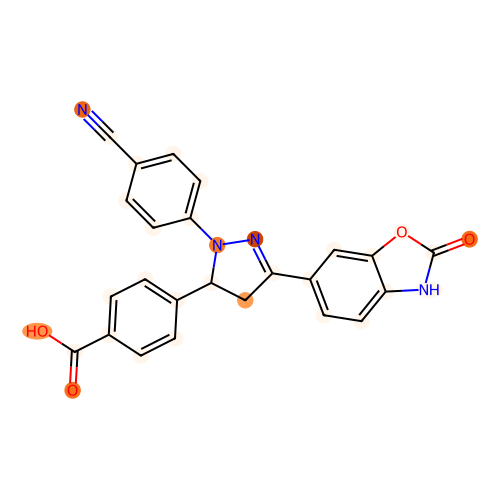

aromatic atom count: 12
prediction: [ 2.3113773 -1.6644801]
O=C(c1ccc(F)cc1)N1CCN(c2ccc(OCCCN3CCCC3)cc2)C(=O)C1


[16:37:57] The new font size 1 is below the current minimum (6).


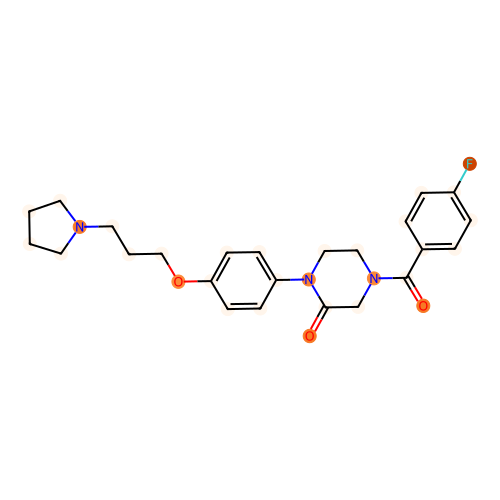

aromatic atom count: 21
prediction: [ 1.0771478  -0.74871665]
COc1cc(Oc2ccccc2)ccc1-c1nc([C@H]2C[C@@](C)(O)C2)n2ccnc(N)c12


[16:37:57] The new font size 1 is below the current minimum (6).


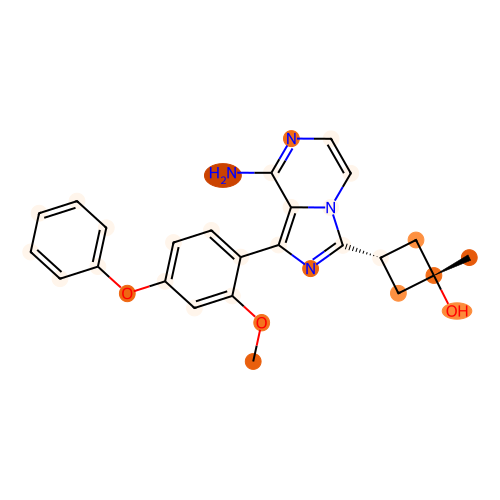

aromatic atom count: 21
prediction: [0.00861713 0.03627849]
COc1cc(N2CCN(C(=O)[C@@H](C)N)CC2)ccc1Nc1ncc(Cl)c(-c2cnc3ccccn23)n1


[16:37:57] The new font size 1 is below the current minimum (6).


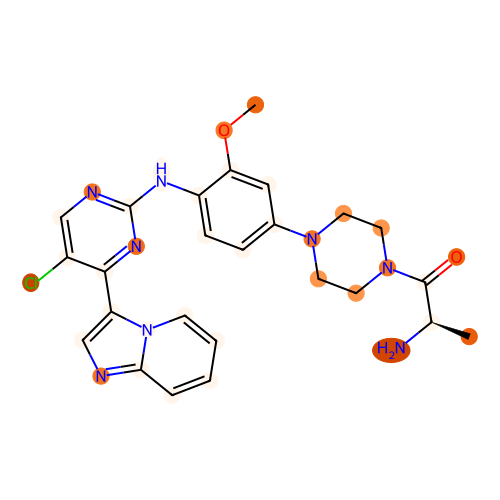

aromatic atom count: 17
prediction: [-0.5617146   0.56461424]
CS(=O)(=O)N1CCC2(CCN(c3ccc(C(=O)Nc4cc(-c5cccs5)ccc4N)cn3)CC2)C1


[16:37:57] The new font size 1 is below the current minimum (6).


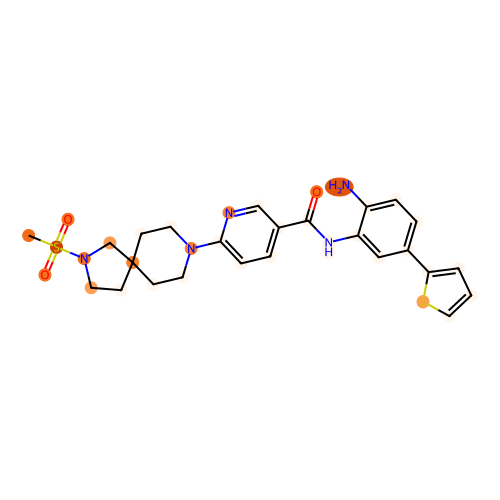

aromatic atom count: 18
prediction: [-1.371783   1.3284907]
CN(C(=O)c1ccc(-c2ccc(C(F)(F)F)cc2)cc1)[C@H]1CCN(C(=O)N(C)[C@@H]2CCN(CCCc3ccc(Cl)cc3)C2)C1


[16:37:57] The new font size 1 is below the current minimum (6).


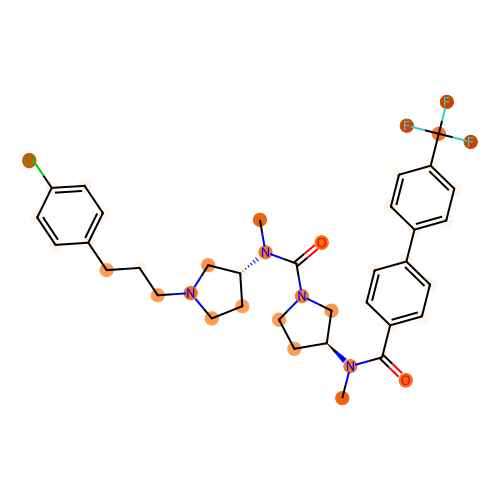

aromatic atom count: 6
prediction: [-1.5120376  1.4537026]
CCO[C@H]1COCC[C@H]1N[C@@H]1CC[C@@](C(=O)N2CCN(c3cc(C(F)(F)F)ccn3)CC2)(C(C)C)C1


[16:37:57] The new font size 1 is below the current minimum (6).


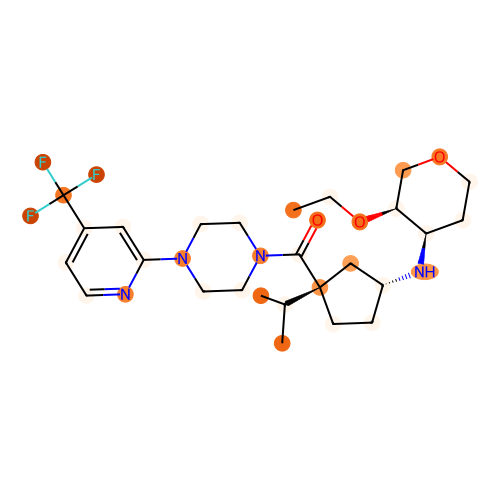

aromatic atom count: 12
prediction: [ 0.6306995  -0.50823605]
O=C([C@H]1CNCC[C@@]12OCc1cc(F)c(F)cc12)N(Cc1cccc(C(F)(F)F)c1Cl)C1CC1


[16:37:57] The new font size 1 is below the current minimum (6).


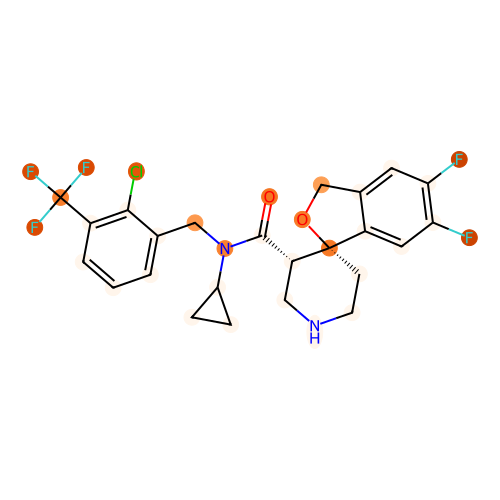

aromatic atom count: 31
prediction: [-0.9617651  1.0549806]
Cn1cc([C@@]2(c3cncc(C(=O)O)c3)N[C@@H](c3nc(-c4ccc(F)cc4)c[nH]3)Cc3c2[nH]c2ccccc32)cn1


[16:37:57] The new font size 1 is below the current minimum (6).


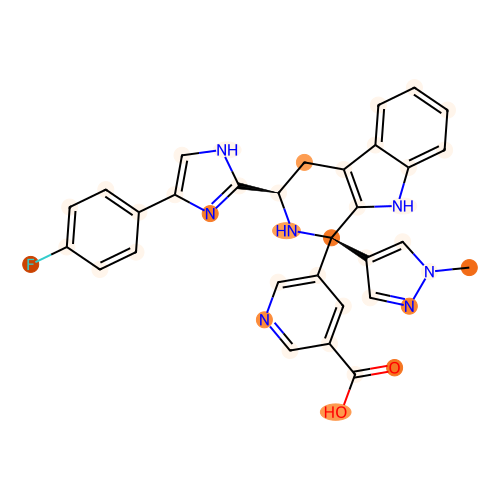

aromatic atom count: 17
prediction: [-0.96939963  1.0504619 ]
N#Cc1ccc(Cn2cncc2C[NH2+]C2CCN(C(=O)c3cccc(Cl)c3)C2=O)cc1


[16:37:57] The new font size 1 is below the current minimum (6).


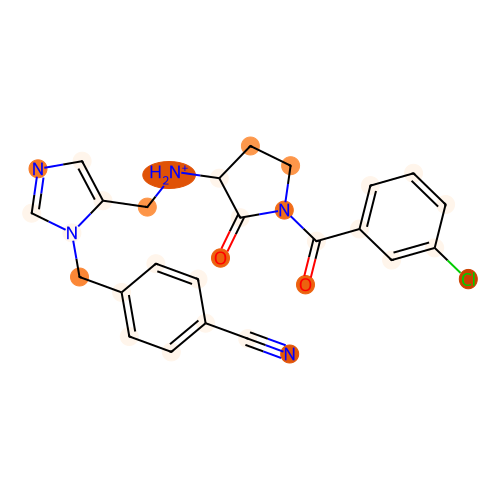

aromatic atom count: 12
prediction: [ 3.1116133 -2.3013833]
CS(=O)(=O)c1ccc(C(=O)N2CCN(c3ccc(OCCCN4CCCCC4)cc3)C(=O)C2)cc1


[16:37:57] The new font size 1 is below the current minimum (6).


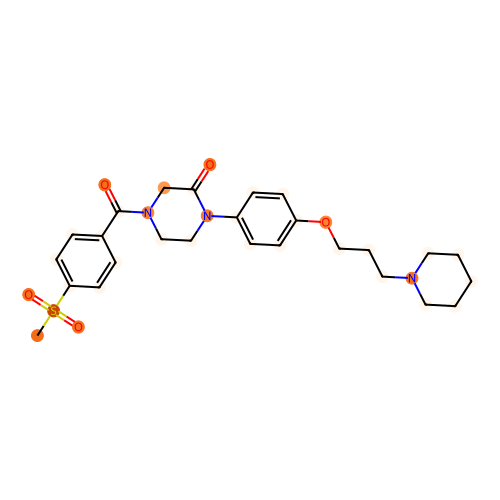

aromatic atom count: 20
prediction: [-2.3631117  2.1789753]
O=C(NC1CCc2ccc(CCN3CCN(c4nsc5ccccc45)CC3)cc21)c1ccco1


[16:37:57] The new font size 1 is below the current minimum (6).


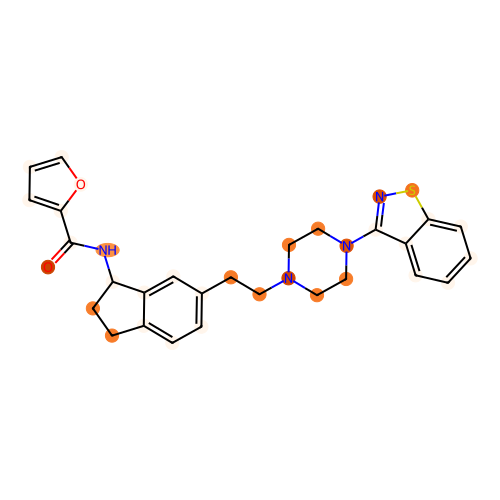

[16:37:57] The new font size 1 is below the current minimum (6).


aromatic atom count: 26
prediction: [-0.9622661  1.0220269]
COc1cc(-c2cn(CC(=O)Nc3cccc4ccccc34)nn2)ccc1-n1cnc(C)c1


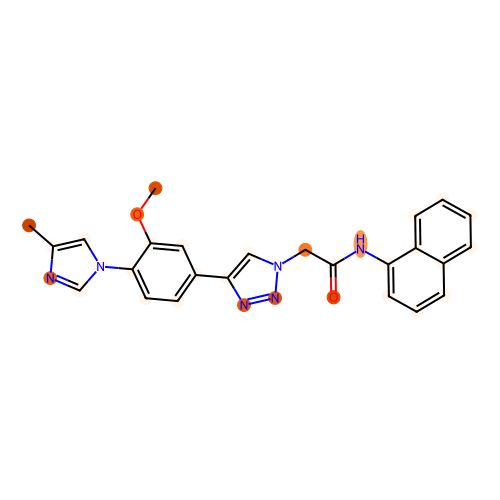

aromatic atom count: 12
prediction: [ 0.9954271 -0.8244812]
O=C(c1cc(Cl)c(O)cc1OC[C@@H](O)CN1CCC2(CC1)Cc1cc(Cl)ccc1O2)N1CC[C@H](O)C1


[16:37:57] The new font size 1 is below the current minimum (6).


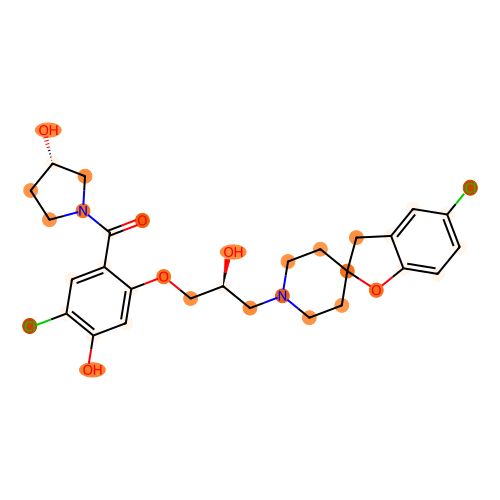

aromatic atom count: 11
prediction: [-1.0668378  1.0582808]
Cc1cc(Cl)nc(C)c1C(=O)NCC[C@@H](C)N1CCC(N(Cc2ccsc2)C(=O)CC#N)CC1


[16:37:57] The new font size 1 is below the current minimum (6).


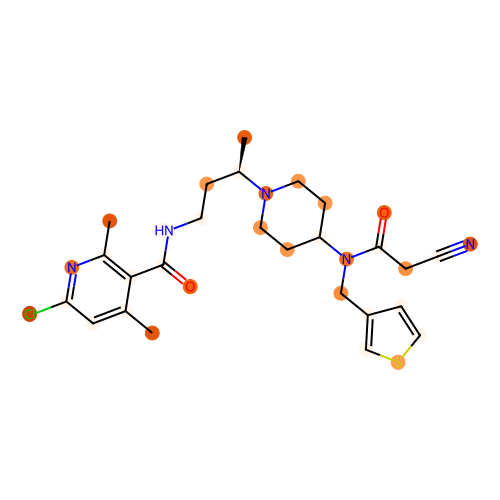

aromatic atom count: 22
prediction: [ 2.5389066 -1.7794393]
C[C@@H](N1CCc2nc(-c3cncnc3)sc2C1)[C@](O)(Cn1cncn1)c1ccc(F)cc1F


[16:37:57] The new font size 1 is below the current minimum (6).


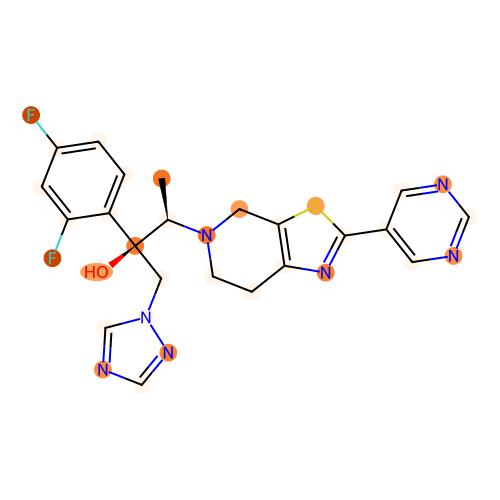

aromatic atom count: 6
prediction: [ 2.4128714 -1.9315996]
CC(C)N(C)[C@@H]1CC[C@H](N2CC[C@H](NC(=O)c3cccc(C(C)(C)C)c3)C2=O)[C@H](CS(=O)(=O)C(C)C)C1


[16:37:57] The new font size 1 is below the current minimum (6).


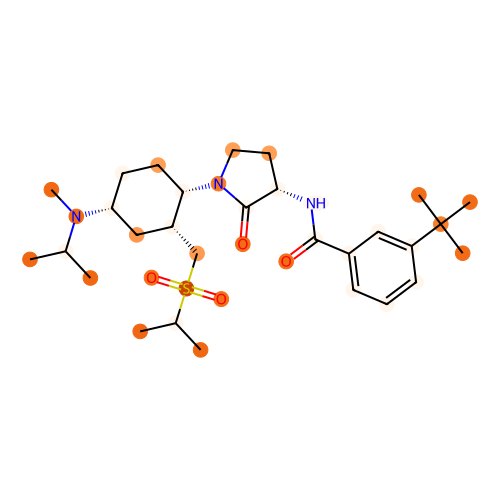

aromatic atom count: 17
prediction: [-0.2732969   0.40324208]
CCCCC1=NC2(CCCC2)C(=O)N1Cc1ccc(-c2ccccc2-c2nn[nH]n2)cc1


[16:37:57] The new font size 1 is below the current minimum (6).


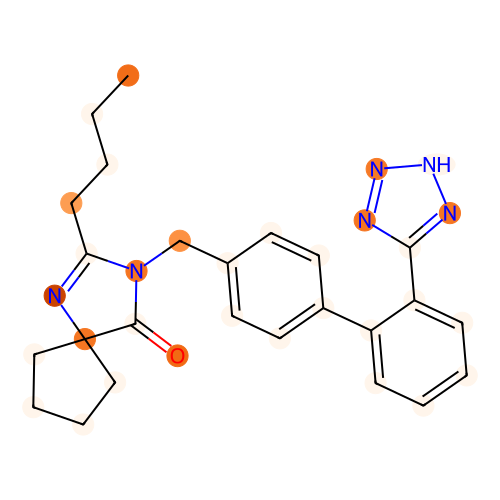

aromatic atom count: 18
prediction: [ 2.0213223 -1.4833578]
CC(C)N1CCN(Cc2cnc(-c3ccc(C(=O)Nc4ccccc4N)cc3)c(C#N)c2)CC1


[16:37:57] The new font size 1 is below the current minimum (6).


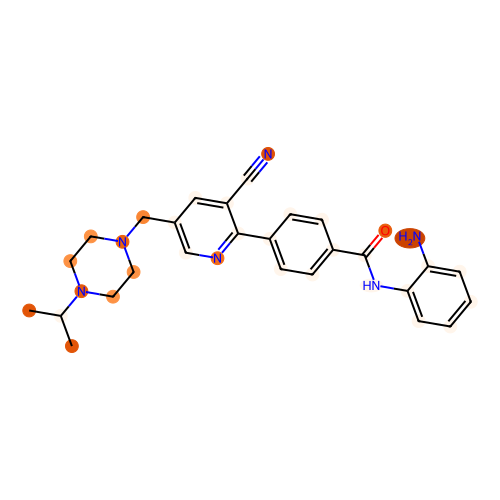

aromatic atom count: 12
prediction: [ 2.2121902 -1.7382011]
O=C(c1ccc(F)cc1F)N1CCN(c2ccc(OC3CCN(C4CCC4)CC3)cc2)C(=O)C1


[16:37:57] The new font size 1 is below the current minimum (6).


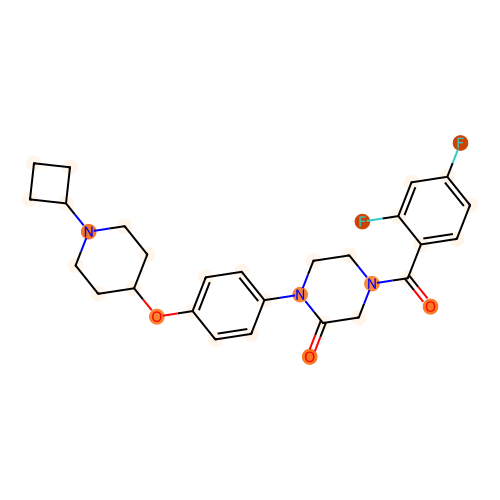

aromatic atom count: 11
prediction: [-1.2111366  1.2638899]
Cc1nnc(C(C)C)n1C1CCN(C(C)C[C@H](NC(=O)C2CC(F)(F)C2)c2ccccc2)CC1


[16:37:57] The new font size 1 is below the current minimum (6).


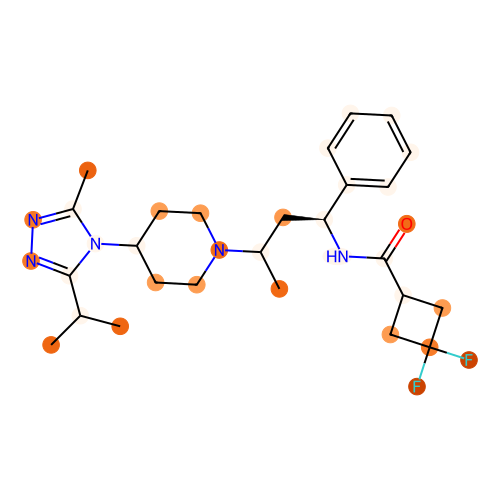

aromatic atom count: 6
prediction: [-0.57477736  0.6537726 ]
CO[C@@H]1COCC[C@@H]1N[C@@H]1CC[C@@](C(=O)N2CCN(c3cc(C(F)(F)F)cnn3)CC2)(C(C)C)C1


[16:37:57] The new font size 1 is below the current minimum (6).


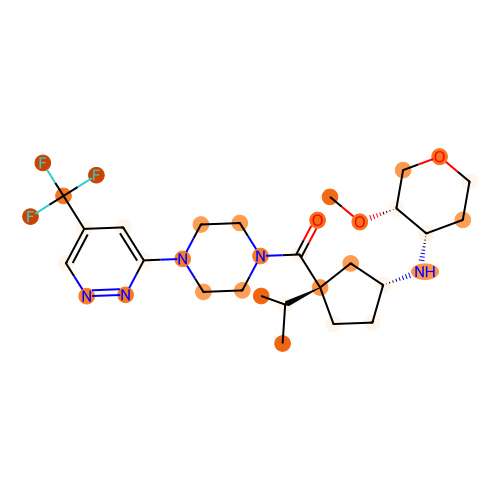

aromatic atom count: 16
prediction: [ 2.825502  -2.3531737]
CO[C@@H]1CN(CCn2c(=O)ccc3ccc(C#N)cc32)CC[C@H]1NCc1ccc2c(n1)NC(=O)CO2


[16:37:57] The new font size 1 is below the current minimum (6).


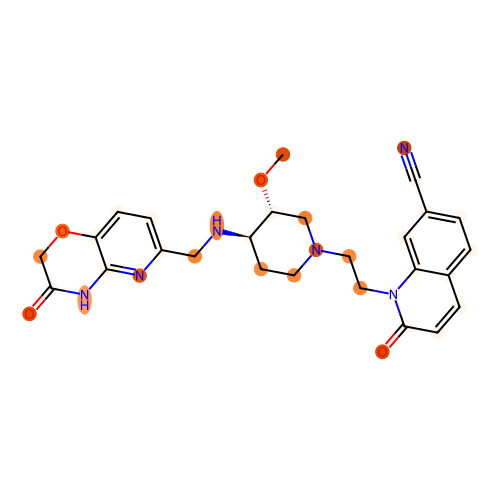

aromatic atom count: 12
prediction: [-1.5129476  1.4655783]
O=C(Cc1ccc(Cl)cc1)N[C@H](Cc1ccc(Cl)cc1)C(=O)N[C@H]1C[C@H]2CC[C@@H](C1)N2


[16:37:57] The new font size 1 is below the current minimum (6).


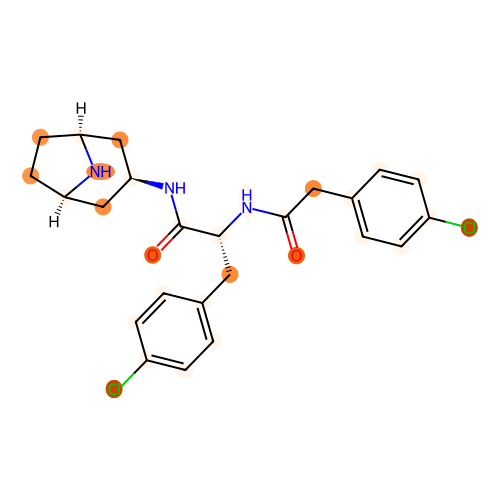

aromatic atom count: 12
prediction: [-1.4273615  1.3663695]
Cc1ccc([C@@H](C)N[C@@H]2CC[C@@H](C(=O)N3CCC(C(=O)N4CCCC4)(c4ccccc4)CC3)C(C)(C)C2)cc1


[16:37:57] The new font size 1 is below the current minimum (6).


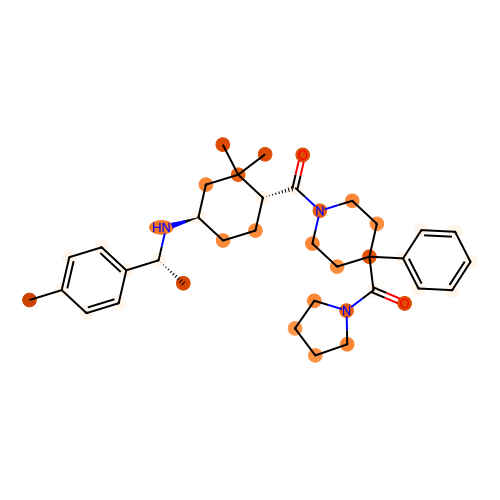

aromatic atom count: 23
prediction: [-0.6498576  0.6378572]
COCCCc1cc(CN(C(=O)[C@H]2CNCC[C@@H]2c2ccc(OCCOc3c(Cl)cc(C)cc3Cl)cc2)C2CC2)cc(OCC2(Cc3nn[nH]n3)CC2)c1


[16:37:57] The new font size 1 is below the current minimum (6).


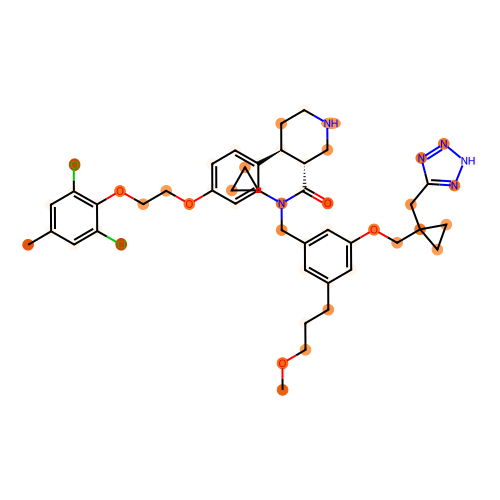

aromatic atom count: 18
prediction: [-1.508721   1.5262585]
Cc1ccc(N2CCN(CC(O)COc3ccccc3C(=O)CCc3ccccc3)CC2)cc1


[16:37:57] The new font size 1 is below the current minimum (6).


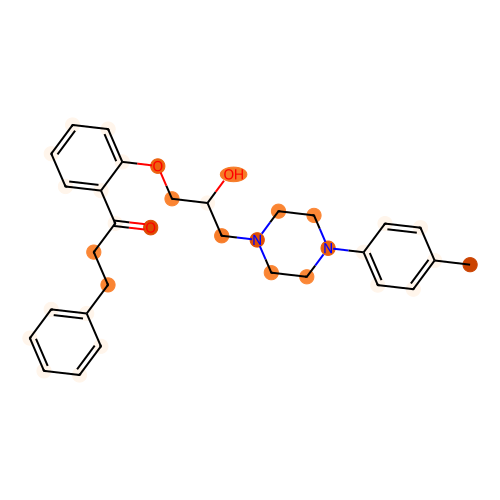

aromatic atom count: 16
prediction: [-1.2950432  1.309431 ]
Nc1ccc2ncc(F)c(CCC34CCC(NCc5ccc6c(n5)NC(=O)CO6)(CC3)CO4)c2n1


[16:37:57] The new font size 1 is below the current minimum (6).


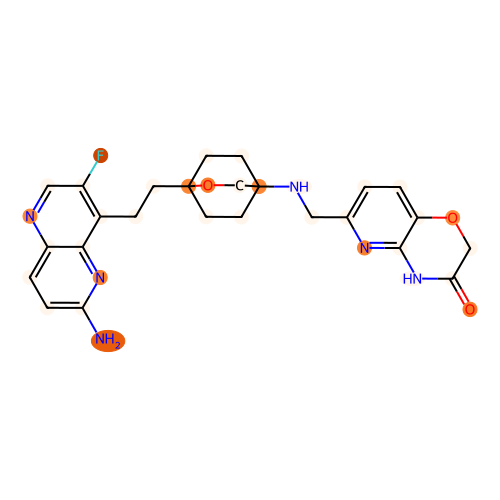

aromatic atom count: 21
prediction: [-0.79919004  0.84038204]
Cc1ccc2c(-c3nnc(SCCCCN4CCc5cc6c(cc5CC4)C(=O)N(C)C6)n3C)cccc2n1


[16:37:57] The new font size 1 is below the current minimum (6).


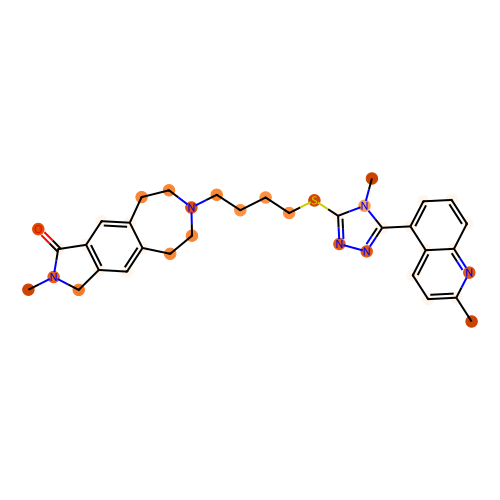

aromatic atom count: 24
prediction: [-1.9019246  1.7920854]
Cc1ccc2c(-c3nnc(SCCCN4CCc5ccc6nc(C)sc6c5CC4)n3C)cccc2n1


[16:37:57] The new font size 1 is below the current minimum (6).


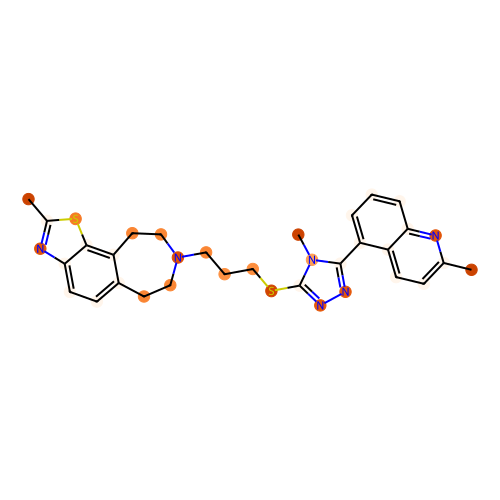

aromatic atom count: 15
prediction: [ 1.631956  -1.3428266]
COc1ccc2c(c1)C1CC1(C(=O)N1C3CNCC1C3)Cn1c-2c(C2CCCCC2)c2ccc(C(=O)NS(=O)(=O)N(C)C)cc21


[16:37:57] The new font size 1 is below the current minimum (6).


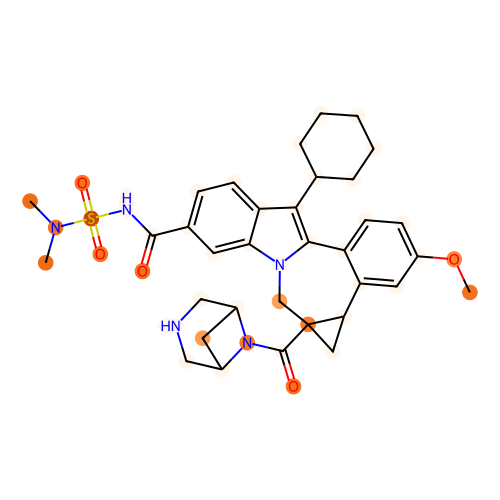

aromatic atom count: 23
prediction: [-0.35967427  0.35995755]
CC1(C)C[C@@H](NC(=O)c2n[nH]c3c2CCC3)c2cc(-c3ccc(Cl)cc3)c(-c3ccc(Cl)cc3Cl)nc2O1


[16:37:57] The new font size 1 is below the current minimum (6).


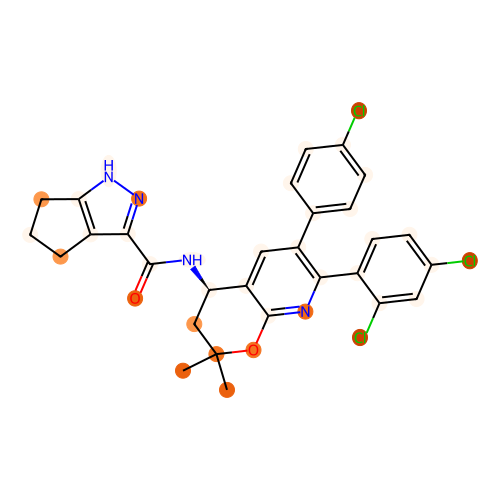

aromatic atom count: 18
prediction: [-0.623955   0.6177188]
COc1ncc(-c2cccc(C)c2CCNC(=O)c2ccc(OCCC(F)(F)F)nc2)cn1


[16:37:57] The new font size 1 is below the current minimum (6).


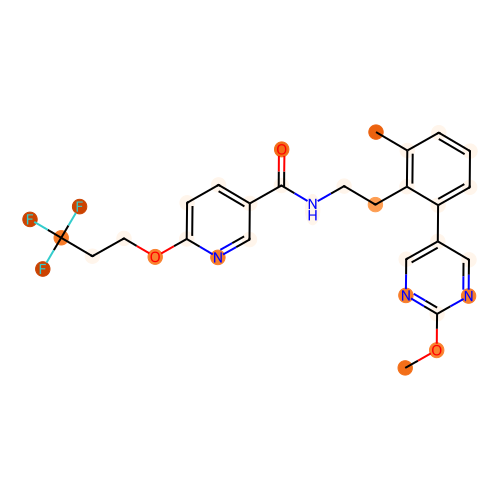

aromatic atom count: 12
prediction: [ 0.5488091 -0.5423213]
COCCCc1cc(Cl)cc(CN(C(=O)[C@H]2CNCC[C@@H]2c2ccn(C)c(=O)c2)C2CC2)c1


[16:37:57] The new font size 1 is below the current minimum (6).


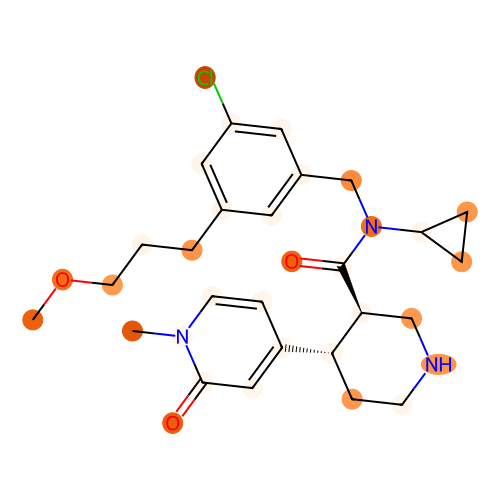

aromatic atom count: 18
prediction: [-0.9574648  1.0204483]
CC(C)(C)NC(=O)c1c[nH]c2ncc(-c3nn(CCC(O)CO)c4ccc(OC(F)F)cc34)nc12


[16:37:57] The new font size 1 is below the current minimum (6).


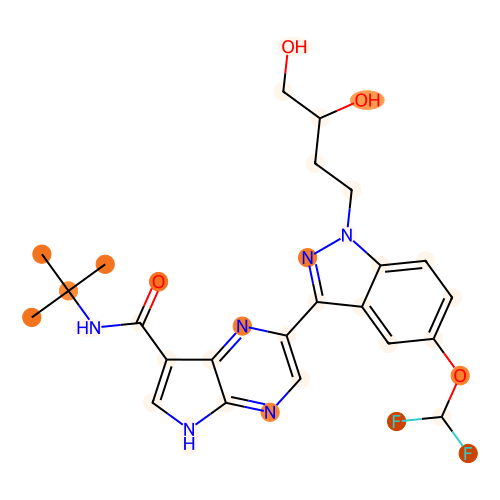

aromatic atom count: 20
prediction: [ 0.70827115 -0.55563676]
O=C(Cc1ccc(-n2cnnn2)cc1)N1CCN(CCc2ccc3nonc3c2)CC1


[16:37:57] The new font size 1 is below the current minimum (6).


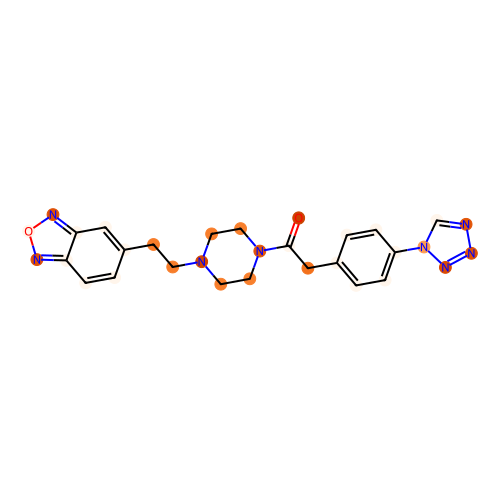

aromatic atom count: 15
prediction: [-1.934139  1.782109]
CC(C)C(=O)NC1CCc2ccc(CCN3CCN(c4nsc5ccccc45)CC3)cc21


[16:37:57] The new font size 1 is below the current minimum (6).


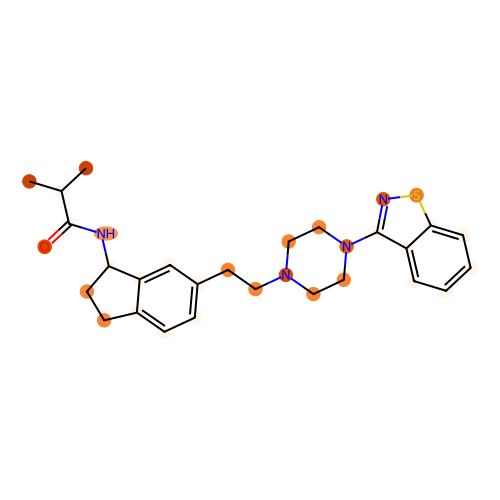

aromatic atom count: 18
prediction: [-0.69876665  0.819362  ]
Cc1ccnc(C)c1C(=O)N1CCC(C)(N2CCC(N(c3ccccc3)c3cccnc3)CC2)CC1


[16:37:57] The new font size 1 is below the current minimum (6).


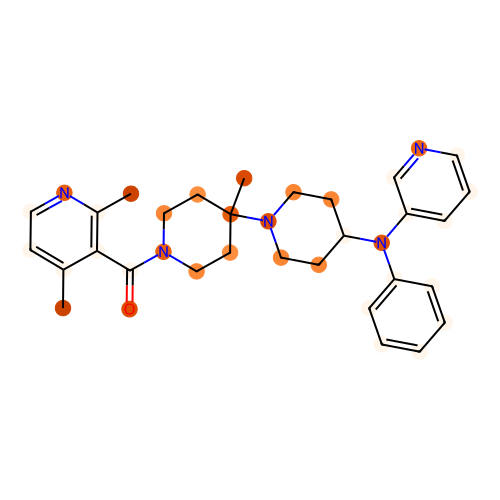

aromatic atom count: 16
prediction: [-1.7152421  1.5954528]
Cc1cc(C(F)(F)F)ccc1C12CC1CN(CCCSc1nnc(-c3ocnc3C)n1C)C2


[16:37:57] The new font size 1 is below the current minimum (6).


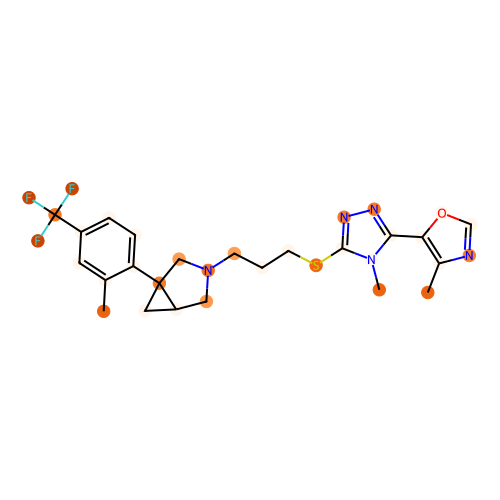

aromatic atom count: 20
prediction: [ 0.78514546 -0.5286539 ]
Cc1nc2cc3c(cc2o1)CCN(CCCSc1nnc(-c2ccc(F)c(F)c2)n1C)CC3


[16:37:57] The new font size 1 is below the current minimum (6).


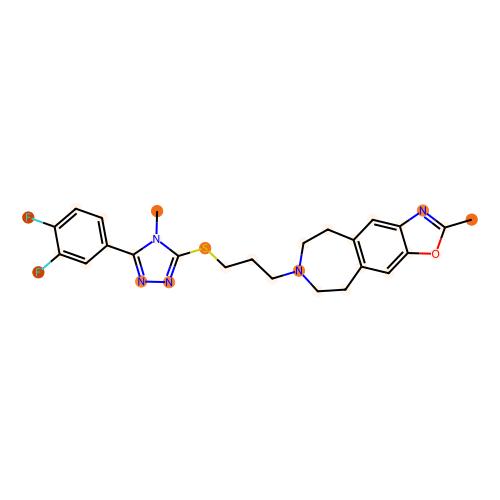

aromatic atom count: 18
prediction: [-0.81528383  0.8129829 ]
NC1=N[C@@]2(CO1)c1cc(-c3cccnc3F)ccc1Oc1ncc(C3=CCCOC3)cc12


[16:37:57] The new font size 1 is below the current minimum (6).


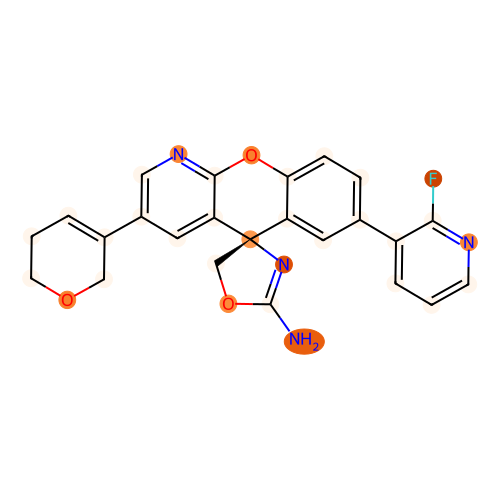

aromatic atom count: 12
prediction: [ 2.3430645 -1.7924701]
Cc1cc(Cl)ccc1OC1CCN(CC2CCN([C@@H](Cc3ccc(F)cc3)C(=O)O)CC2)CC1


[16:37:57] The new font size 1 is below the current minimum (6).


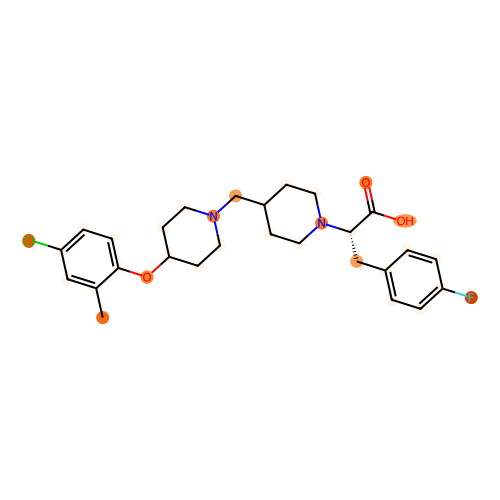

aromatic atom count: 16
prediction: [-1.0371389  1.1888866]
COc1cccc2c(=O)n(-c3ccc(OC4CCN(C5CCC5)CC4)cc3)c(C)nc12


[16:37:57] The new font size 1 is below the current minimum (6).


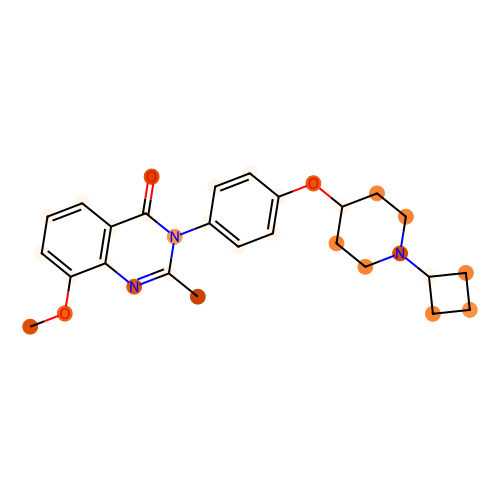

aromatic atom count: 24
prediction: [ 1.7688444 -1.2827053]
Cc1cc(C(=O)O)ccc1-c1ccc(N2C(=O)N(c3cc(O)ncn3)C3(CCN(Cc4ncccc4C)CC3)C2=O)cn1


[16:37:57] The new font size 1 is below the current minimum (6).


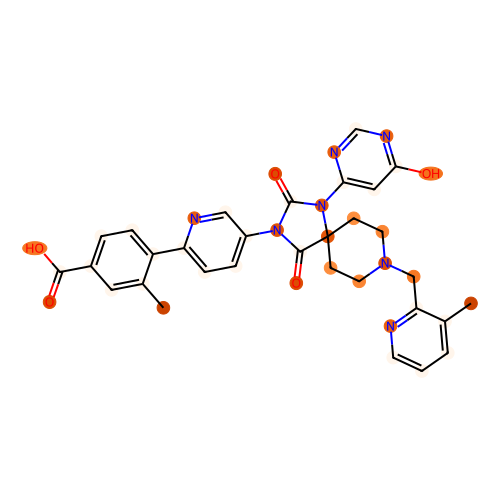

aromatic atom count: 33
prediction: [-1.1496711  1.1519397]
Nc1ccc(-c2nnc(C3CCN(Cc4ccc(-c5nc6nc(N7CCN(CCO)CC7)ccc6nc5-c5ccccc5)cc4)CC3)[nH]2)cn1


[16:37:57] The new font size 1 is below the current minimum (6).


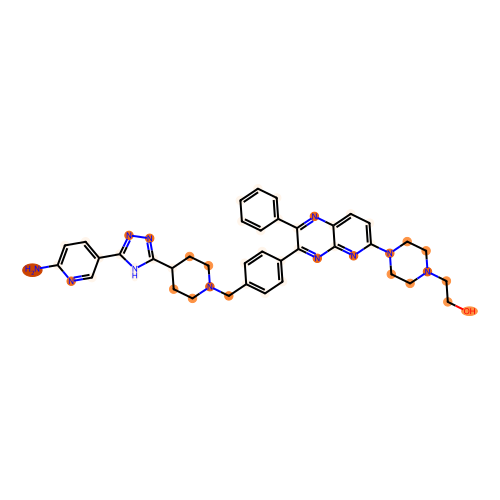

aromatic atom count: 11
prediction: [ 1.7909269 -1.4849536]
Cc1cnc([C@]2(O)CC[C@H](N3CC(NC(=O)CNC(=O)c4cccc(C(F)(F)F)c4)C3)CC2)s1


[16:37:58] The new font size 1 is below the current minimum (6).


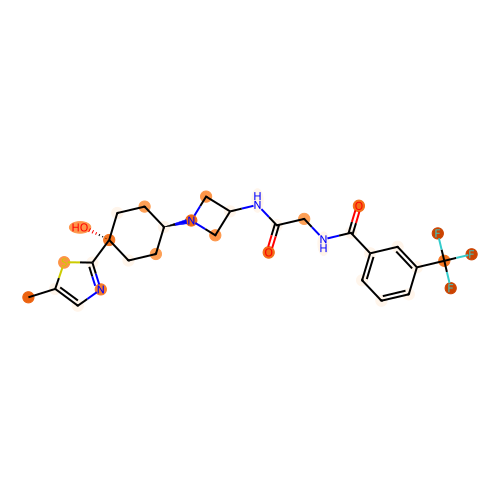

aromatic atom count: 12
prediction: [-1.5689645  1.5330365]
Cc1cccc(C)c1C(=O)N1CCC(N2CCC(N(Cc3ccccc3)C(=O)C3CCC3)CC2)CC1


[16:37:58] The new font size 1 is below the current minimum (6).


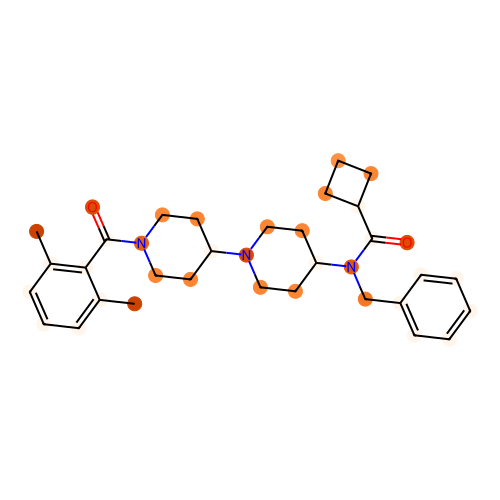

aromatic atom count: 14
prediction: [-2.0776882  1.8265568]
CCN1CCN(c2cc3[nH]c(S[C@]4(C)CC[C@@H](c5nnc(C)o5)CC4)nc3cc2Cl)CC1


[16:37:58] The new font size 1 is below the current minimum (6).


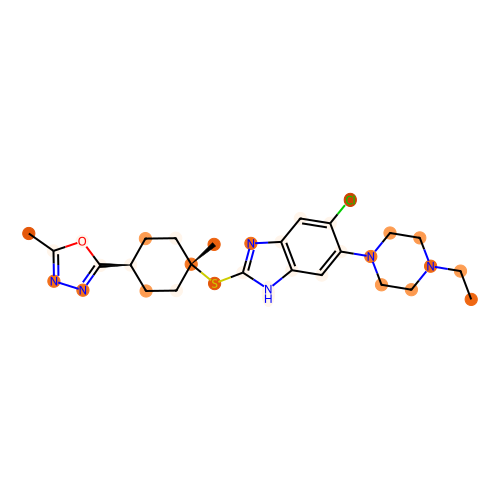

aromatic atom count: 18
prediction: [-1.6969402  1.5363686]
O=C1CN([C@H]2CC[C@](c3ccccc3)(N3CCC(c4cc(C(F)(F)F)cc(C(F)(F)F)c4)C3=O)CC2)CCN1c1ccccc1


[16:37:58] The new font size 1 is below the current minimum (6).


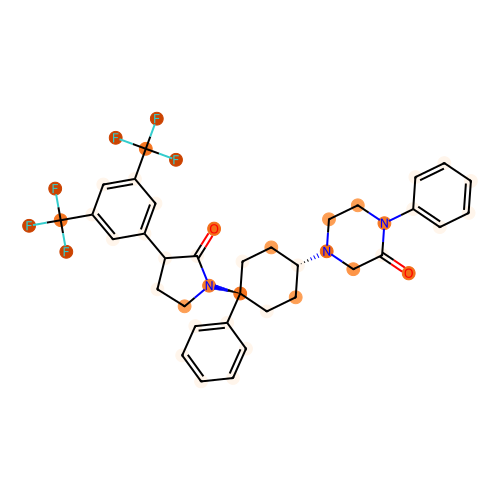

aromatic atom count: 12
prediction: [-1.1729162  1.1661472]
COc1ccccc1[C@@H](C)N[C@@H]1CC[C@@H](C(=O)N2CCC(C(=O)N3CCCC3)(c3ccccc3)CC2)C(C)(C)C1


[16:37:58] The new font size 1 is below the current minimum (6).


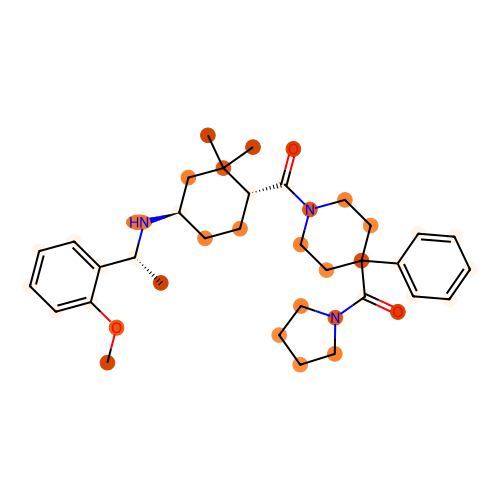

aromatic atom count: 20
prediction: [-2.2479398  2.1439967]
FC(F)(F)c1cccc(Cn2ccc3c(OC4CCN(Cc5cscn5)CC4)ncnc32)c1


[16:37:58] The new font size 1 is below the current minimum (6).


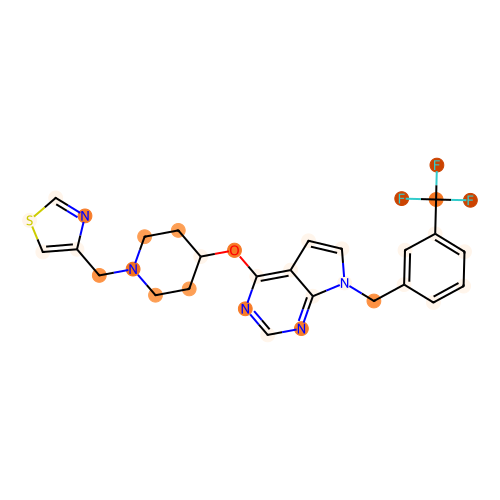

aromatic atom count: 18
prediction: [-0.1611419   0.24701199]
Nc1cc(CN2CCC(N(C(=O)NCc3ccc(F)cc3)c3ccc(Cl)cc3)CC2)ccn1


[16:37:58] The new font size 1 is below the current minimum (6).


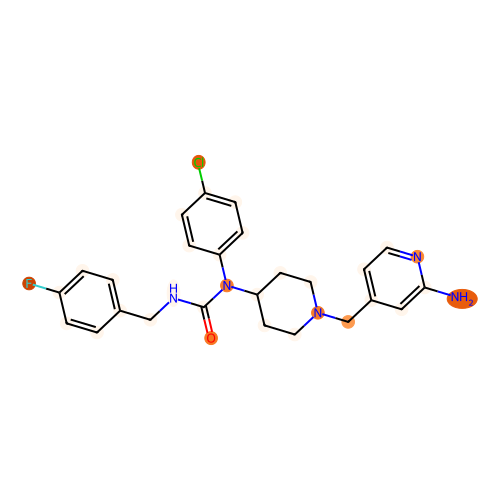

aromatic atom count: 6
prediction: [-1.7011223  1.5591664]
CNC(=O)c1c(NCC2CCC3(CCCC3)CC2)nc(C#N)nc1OCC1CCN(C)CC1


[16:37:58] The new font size 1 is below the current minimum (6).


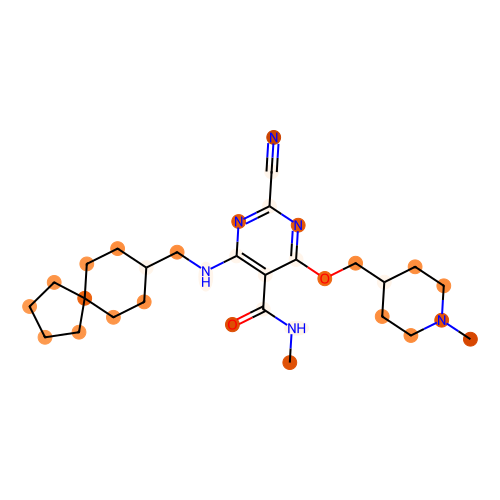

aromatic atom count: 21
prediction: [-1.5464591  1.5658522]
Cc1cccnc1CN1CCC(Oc2ncnc3c2ccn3Cc2ccccc2)CC1


[16:37:58] The new font size 1 is below the current minimum (6).


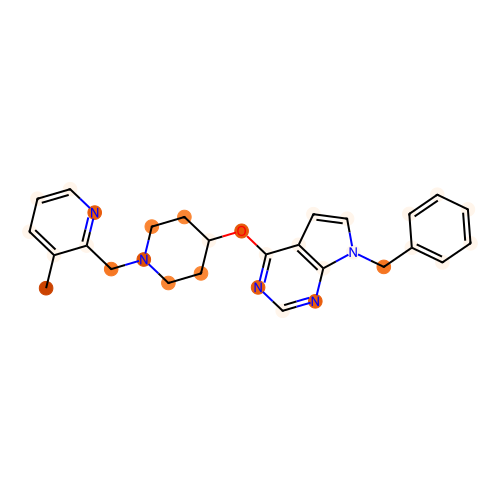

aromatic atom count: 6
prediction: [ 2.0173352 -1.5632286]
CN(C)C(=O)[C@@H](C1CCC(N(C)C(=O)c2cccc(F)c2)CC1)[C@H](N)C(=O)N1CC[C@H](F)C1


[16:37:58] The new font size 1 is below the current minimum (6).


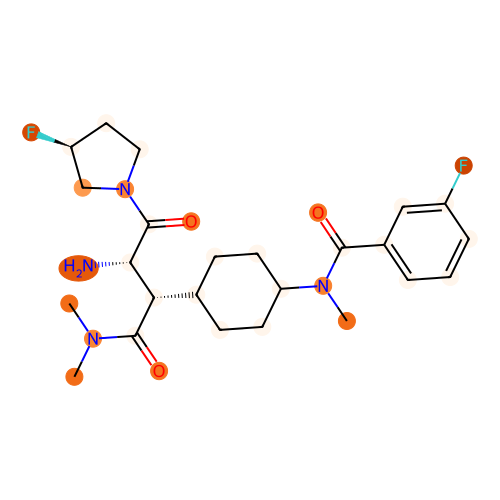

aromatic atom count: 21
prediction: [-0.17302471  0.12707528]
CCNC1(C(N)=O)CCN(c2ncnc3c2nc(-c2ccccc2Cl)n3-c2ccc(Cl)cc2)CC1


[16:37:58] The new font size 1 is below the current minimum (6).


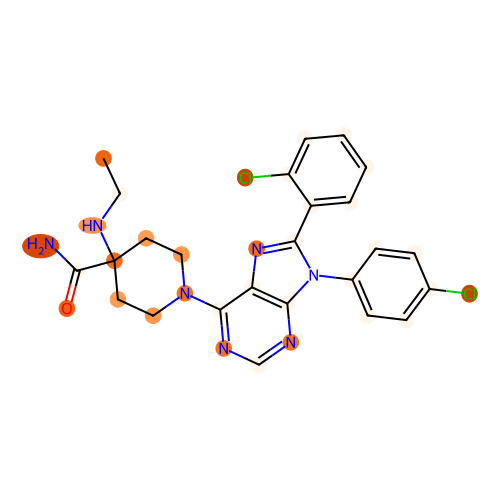

aromatic atom count: 18
prediction: [ 1.4795885 -1.0672923]
CS(=O)(=O)c1ccc(-n2cc(Cl)c(OC3CCN(c4ncc(Cl)cn4)CC3)cc2=O)c(F)c1


[16:37:58] The new font size 1 is below the current minimum (6).


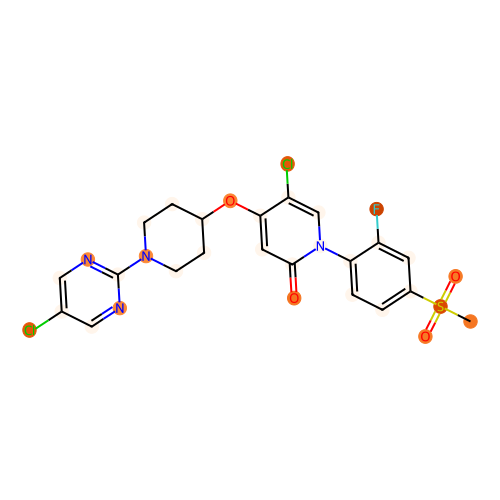

aromatic atom count: 24
prediction: [-1.4198     1.3646132]
CCc1nc2cc3c(c(C)c2o1)CCN(CCCCSc1nnc(-c2cccc4nc(C)ccc24)n1C)CC3


[16:37:58] The new font size 1 is below the current minimum (6).


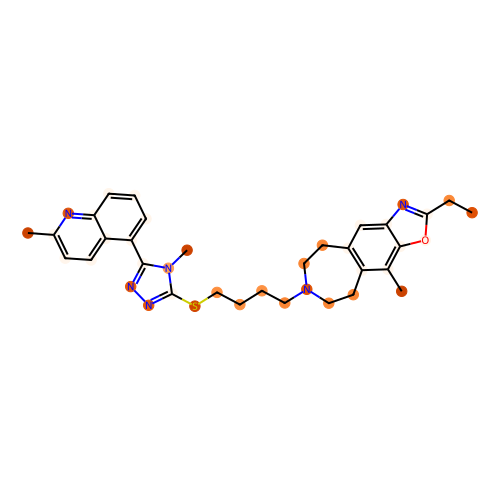

aromatic atom count: 16
prediction: [ 2.5512586 -1.9937564]
COc1ccc(C(=O)CSc2nnc(-c3ccco3)n2C(C)C2CC3CCC2C3)cc1


[16:37:58] The new font size 1 is below the current minimum (6).


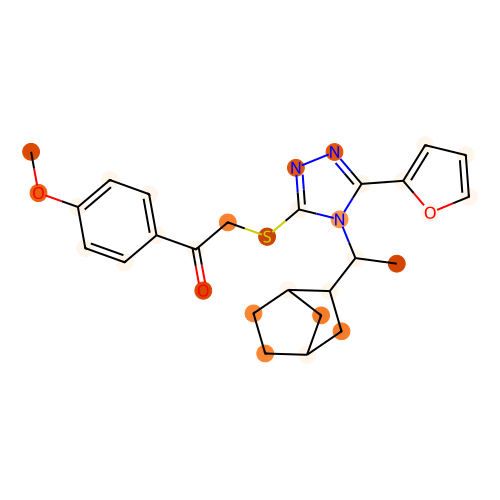

aromatic atom count: 18
prediction: [-1.6921659  1.6601497]
O=c1cc(OCc2ccc(C(F)(F)F)cc2)ccn1-c1ccc(OCCN2CCCC2)cc1


[16:37:58] The new font size 1 is below the current minimum (6).


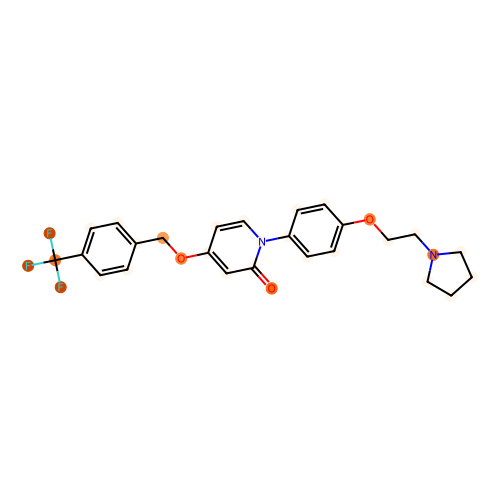

aromatic atom count: 12
prediction: [-0.20422362  0.27193663]
Cc1c([C@@H](O)CN2CCN(CC(O)c3cc(C4CC4)c(C#N)cn3)CC2)ccc2c1COC2=O


[16:37:58] The new font size 1 is below the current minimum (6).


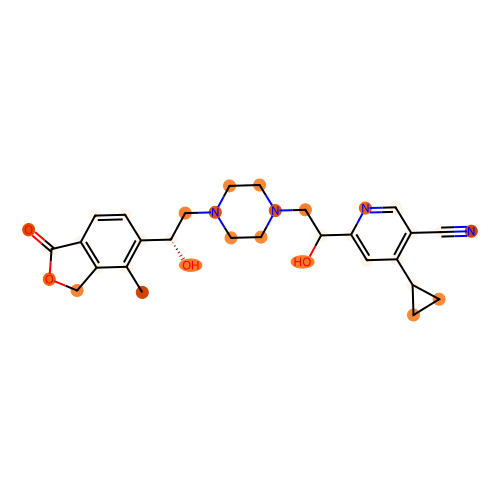

aromatic atom count: 12
prediction: [ 1.46578   -1.0987489]
O=C(NO)C1(S(=O)(=O)c2ccc(Oc3ccc(OC(F)(F)F)cc3)cc2)CCC2(CCNCC2)C1


[16:37:58] The new font size 1 is below the current minimum (6).


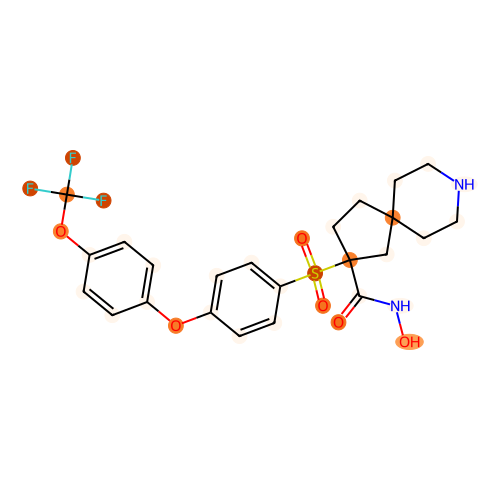

aromatic atom count: 15
prediction: [-0.22227776  0.23025128]
COc1ccc([C@H]2CC[C@@H](N3CC(NC(=O)CNc4noc5ccc(C(F)(F)F)cc45)C3)CC2)cn1


[16:37:58] The new font size 1 is below the current minimum (6).


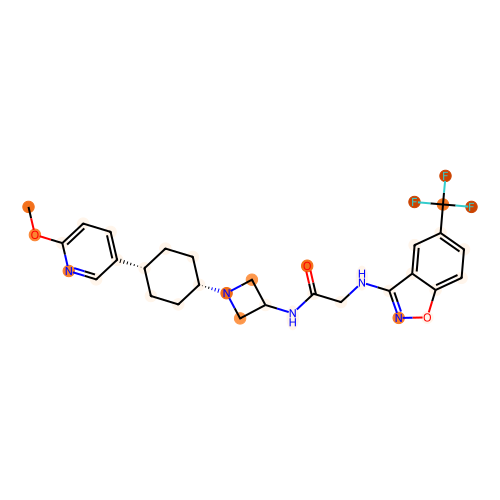

aromatic atom count: 16
prediction: [ 0.12693742 -0.16464335]
NCCCOc1ccc2ncc(F)c(CCC34CCC(NCc5ccc6c(n5)NC(=O)CO6)(CC3)CO4)c2n1


[16:37:58] The new font size 1 is below the current minimum (6).


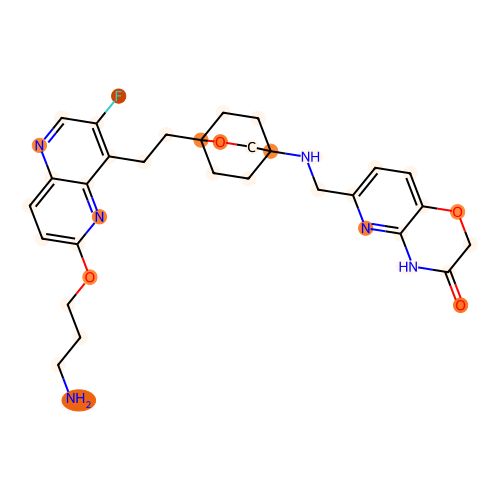

aromatic atom count: 12
prediction: [-1.981121   1.9089197]
FC(F)(F)Oc1ccc(OC2CC2)c(CNC2CCC3CCC2(c2ccccc2)N3)c1


[16:37:58] The new font size 1 is below the current minimum (6).


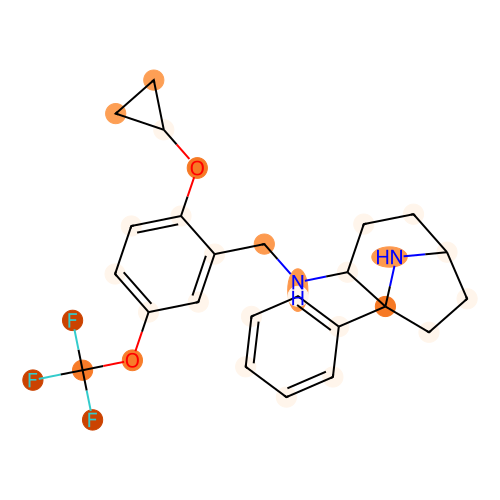

aromatic atom count: 22
prediction: [-0.05080346  0.10050908]
CC(=O)c1cccc(-c2cccc(-n3cc(C(=O)NC(C)C)c(=O)c4cccnc43)c2)c1


[16:37:58] The new font size 1 is below the current minimum (6).


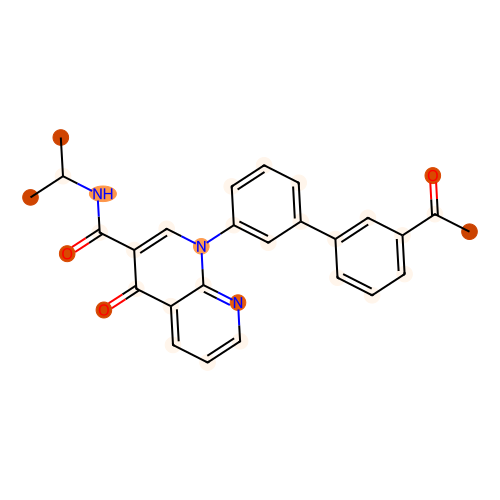

[16:37:58] The new font size 1 is below the current minimum (6).


aromatic atom count: 18
prediction: [-1.5716702  1.589023 ]
Cc1cccc(C)c1C(=O)N1CCC(C)(N2CCC(N(Cc3ccccc3)c3ccccc3)CC2)CC1


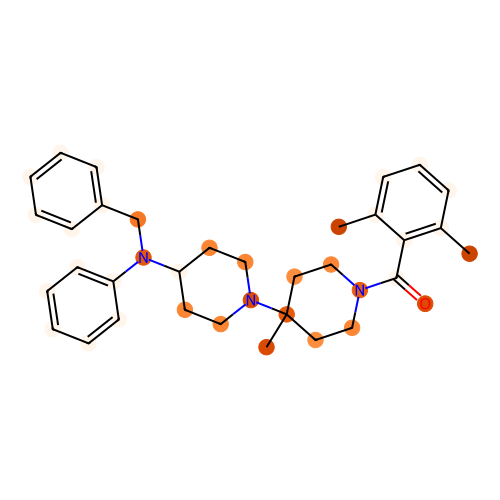

[16:37:58] The new font size 1 is below the current minimum (6).


aromatic atom count: 12
prediction: [ 0.9150362  -0.78723323]
COc1ccc([C@]2(O)CC[C@@H](N3CC(NC(=O)CNC(=O)c4cccc(C(F)(F)F)c4)C3)CC2)cc1


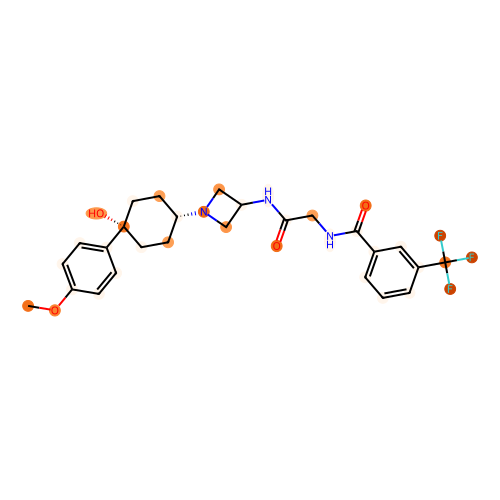

aromatic atom count: 20
prediction: [-0.6190344  0.7189746]
Cc1nc2cnc(Oc3cccc4cccnc34)cc2c(=O)n1C[C@H]1CCCN(C(C)C)C1


[16:37:58] The new font size 1 is below the current minimum (6).


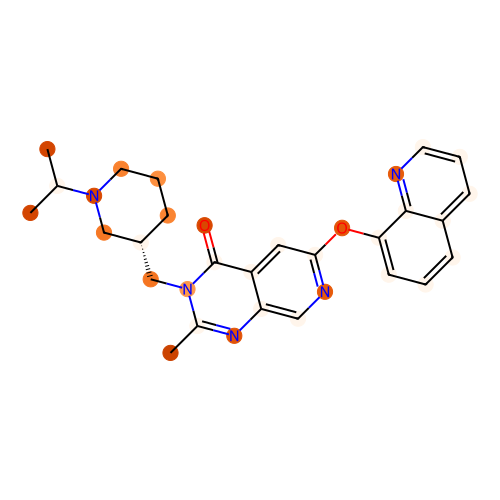

aromatic atom count: 18
prediction: [-1.1913123  1.2117795]
C[C@H](O)C(=O)NC1CC(C)(C)Oc2nc(-c3ccc(Cl)cc3Cl)c(-c3ccc(Cl)cc3)cc21


[16:37:58] The new font size 1 is below the current minimum (6).


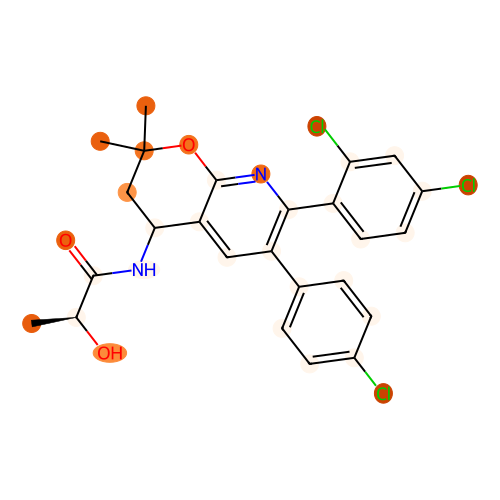

aromatic atom count: 25
prediction: [-1.5400597  1.4957705]
Cc1cnc(-c2ccc3c(c2)CCN(CCCSc2nnc(-c4ccc5[nH]ccc5c4)n2C)CC3)o1


[16:37:58] The new font size 1 is below the current minimum (6).


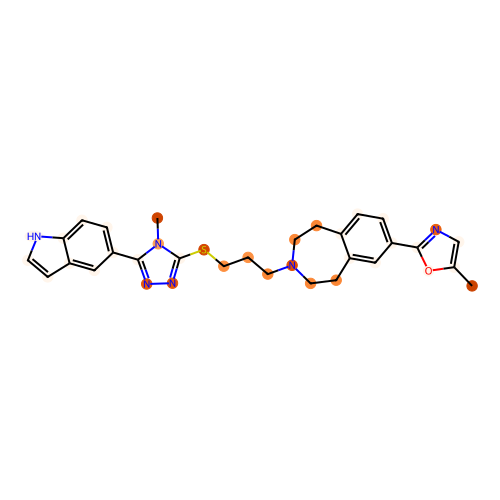

aromatic atom count: 19
prediction: [-1.4950942  1.4910793]
Cn1c(=O)c2c(nc(N3CCC[C@@H](N)C3)n2Cc2ccccc2Cl)c2ccc(C#N)cc21


[16:37:58] The new font size 1 is below the current minimum (6).


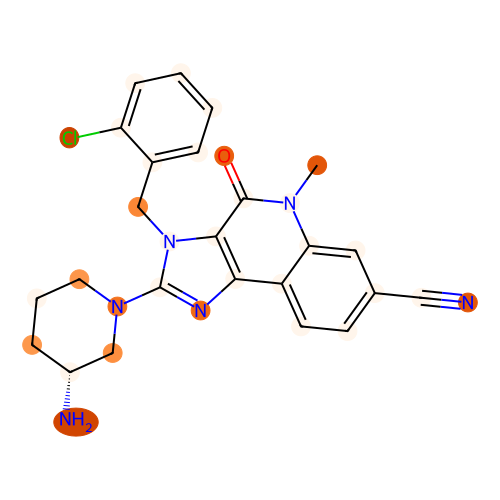

aromatic atom count: 21
prediction: [ 1.245512  -1.0400045]
CCOc1cc2nccc(Oc3cnc(CC(=O)Nc4n[nH]c(CC)c4C)c(OC)c3)c2cc1OC


[16:37:58] The new font size 1 is below the current minimum (6).


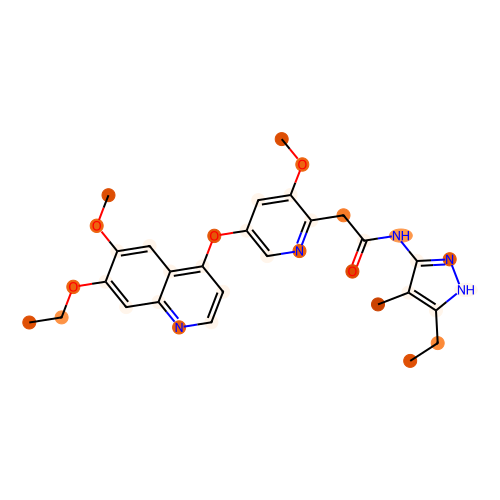

aromatic atom count: 19
prediction: [-1.4408494  1.3500568]
CCc1nc2cc3c(cc2s1)CCN(CCCSc1nnc(-c2ocnc2C)n1C)CC3


[16:37:58] The new font size 1 is below the current minimum (6).


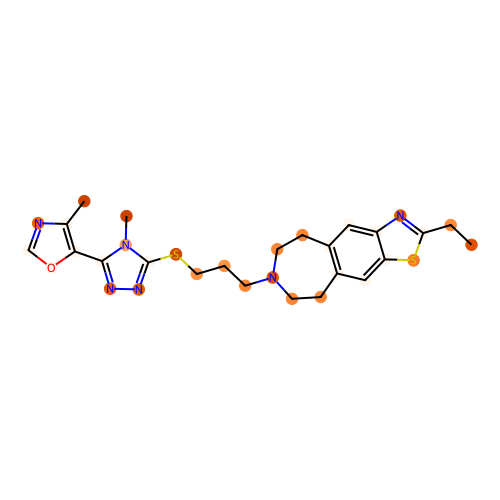

aromatic atom count: 12
prediction: [-1.6241834  1.608261 ]
COc1cccc(N2CCN(CCCCCCN3CCN(c4cccc(OC)c4)CC3)CC2)c1


[16:37:58] The new font size 1 is below the current minimum (6).


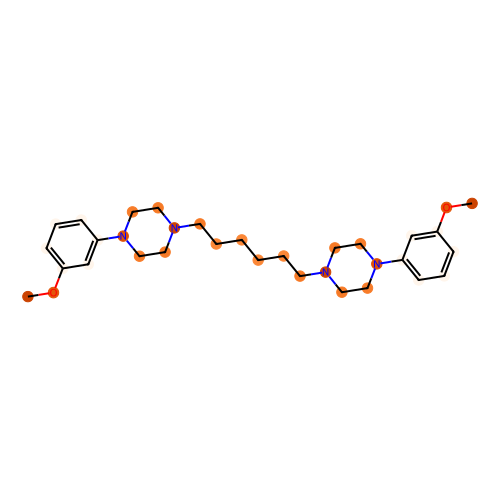

aromatic atom count: 12
prediction: [-1.2750114  1.2314435]
COc1cc(OC)cc(C(=O)NCC2(C#N)CCN(Cc3ccccc3C(F)(F)F)CC2)c1


[16:37:58] The new font size 1 is below the current minimum (6).


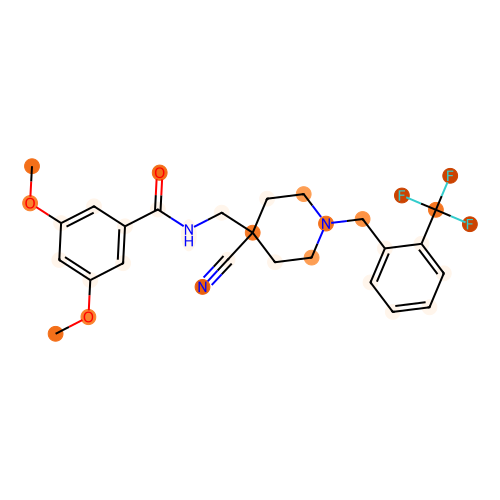

aromatic atom count: 25
prediction: [-0.8050295  0.9032559]
N#Cc1ccc2[nH]c(C3CCN(CCn4c(=O)ccc5ncc(Oc6cccnc6)cc54)CC3)nc2c1


[16:37:58] The new font size 1 is below the current minimum (6).


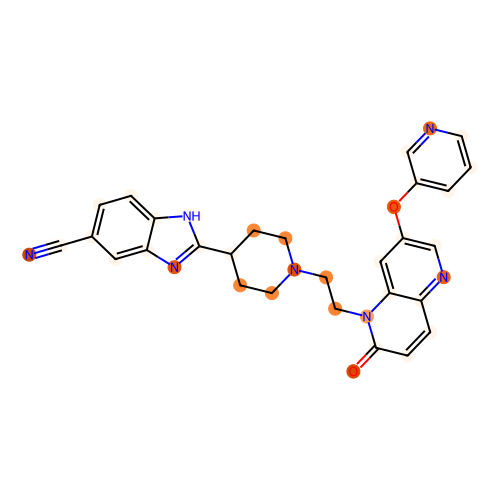

aromatic atom count: 12
prediction: [-0.00127898  0.07329194]
O=C(NC1CC1)c1ccc(OCC2CC2C2CCN(c3ncc(Cl)cn3)CC2)cc1F


[16:37:58] The new font size 1 is below the current minimum (6).


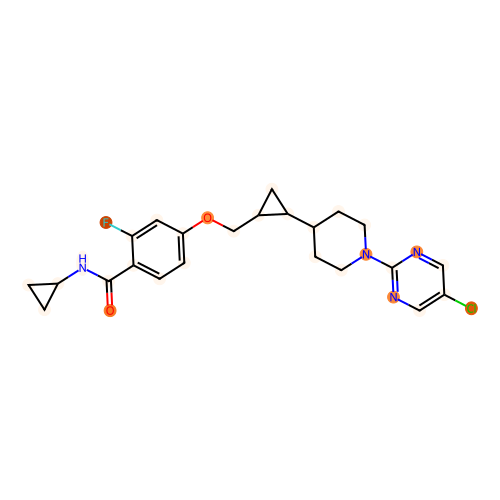

aromatic atom count: 23
prediction: [ 1.6839842 -1.2125131]
COCc1nc(-c2ccc(N3C(=O)N(c4cc(=O)nc[nH]4)C4(CCN(Cc5ncccc5C)CC4)C3=O)cc2)no1


[16:37:58] The new font size 1 is below the current minimum (6).


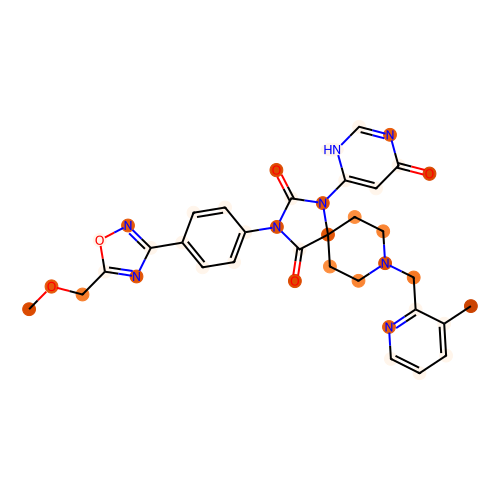

aromatic atom count: 16
prediction: [ 3.7757127 -2.862671 ]
O=C1COc2cnc(CNC34CCC(C[C@]5(O)Cn6c(=O)ccc7ncc(F)c5c76)(CC3)OC4)nc2N1


[16:37:58] The new font size 1 is below the current minimum (6).


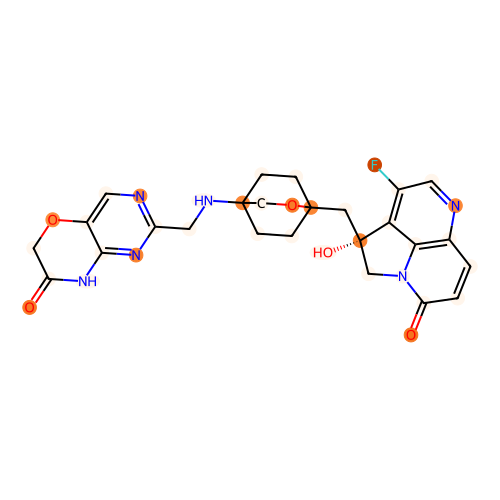

aromatic atom count: 12
prediction: [ 0.49525663 -0.4668566 ]
COc1cc([C@@H](O)CN2CCN(C[C@H](O)c3ccc4c(c3C)COC4=O)CC2)ncc1C#N


[16:37:58] The new font size 1 is below the current minimum (6).


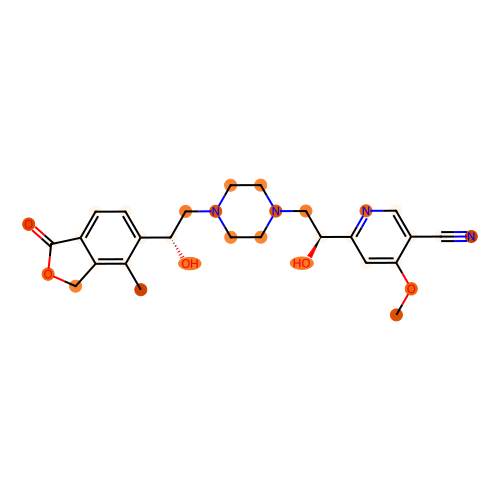

aromatic atom count: 17
prediction: [-0.58179057  0.64048696]
CC1(C)c2nc(-c3ccc(F)cc3)c(Nc3ccc(F)c(F)c3)n2CCN1C(=O)CN


[16:37:58] The new font size 1 is below the current minimum (6).


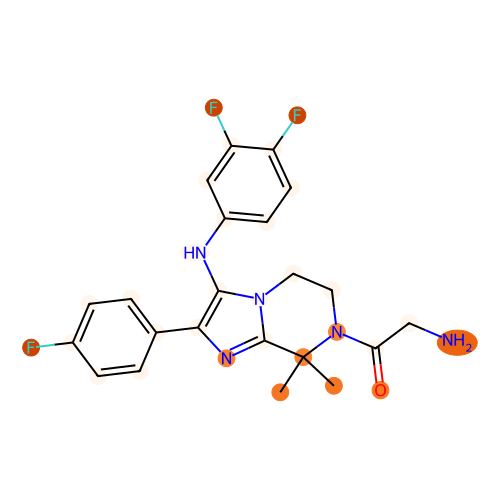

aromatic atom count: 24
prediction: [-0.7577802   0.79434514]
COc1c(C)cc(C2(c3cccc(-c4cncnc4)c3)N=C(N)c3c(F)cccc32)cc1C#N


[16:37:58] The new font size 1 is below the current minimum (6).


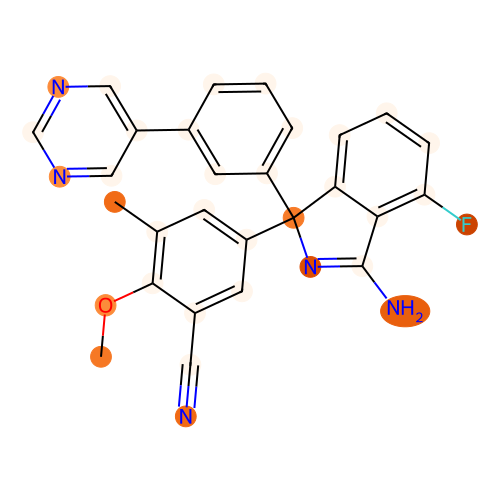

aromatic atom count: 18
prediction: [ 0.64101666 -0.42715883]
CC(C)(C)COc1ccc2c(c1)[C@]1(COC(N)=N1)c1cc(-c3ccncc3)ccc1O2


[16:37:58] The new font size 1 is below the current minimum (6).


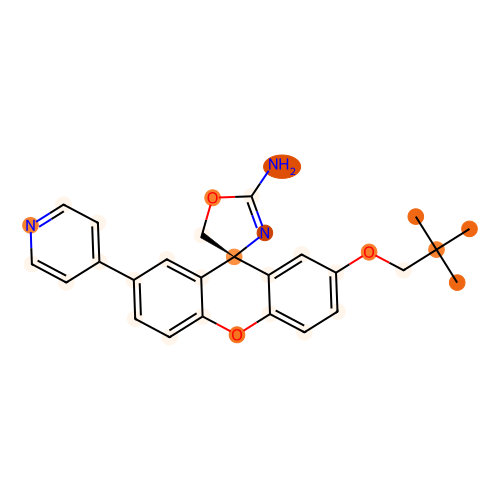

aromatic atom count: 15
prediction: [ 1.324564 -1.07839 ]
CCN(CC)C(=O)[C@@H]1C=C2c3cccc4[nH]cc(c34)C[C@H]2N(C(=O)Nc2ccccc2)C1


[16:37:58] The new font size 1 is below the current minimum (6).


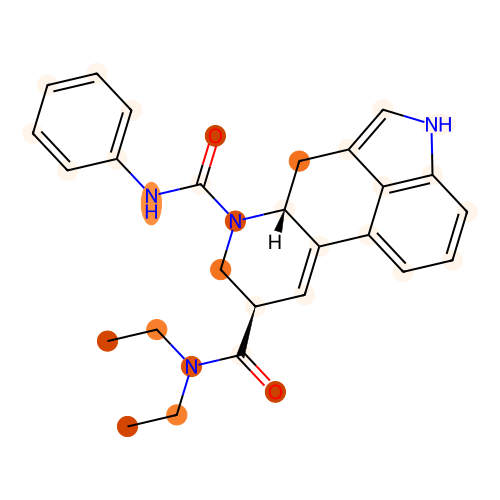

aromatic atom count: 12
prediction: [ 1.1060026 -0.8594705]
C[C@H]1CCCN1CCCOc1ccc(N2CCN(C(=O)c3cc(F)cc(F)c3)CC2=O)cc1


[16:37:58] The new font size 1 is below the current minimum (6).


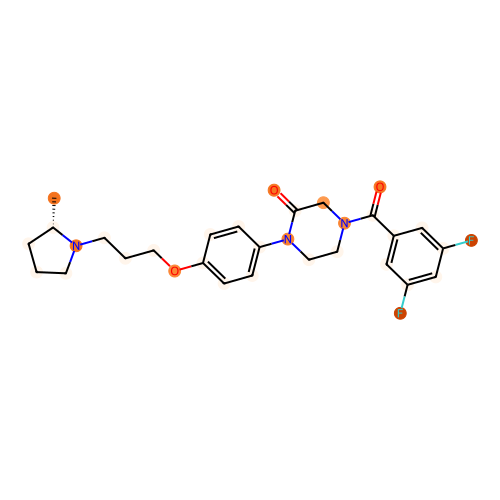

aromatic atom count: 28
prediction: [-0.8108776   0.88449174]
COC(=O)N(NC(=O)c1c(CN2CCN(S(=O)(=O)c3ccccc3)CC2)c(-c2ccccc2)nc2ccccc12)c1ccccc1


[16:37:58] The new font size 1 is below the current minimum (6).


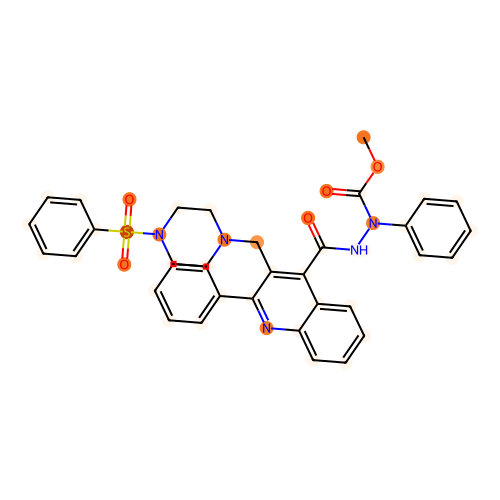

aromatic atom count: 17
prediction: [-1.7053704  1.6265944]
Cc1nc(C(=O)NCCCN2CCN(c3cccc(Cl)c3Cl)CC2)c(C)n1-c1ccccc1


[16:37:58] The new font size 1 is below the current minimum (6).


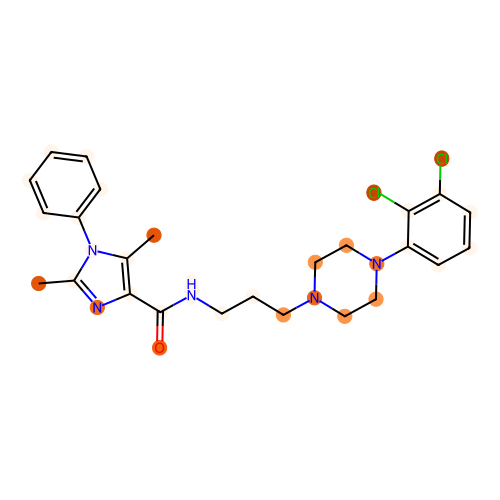

aromatic atom count: 20
prediction: [-1.5971671  1.5580164]
Cc1noc2cc3c(cc12)CCN(CCCSc1nnc(-c2ccc(C(F)(F)F)cc2)n1C)CC3


[16:37:58] The new font size 1 is below the current minimum (6).


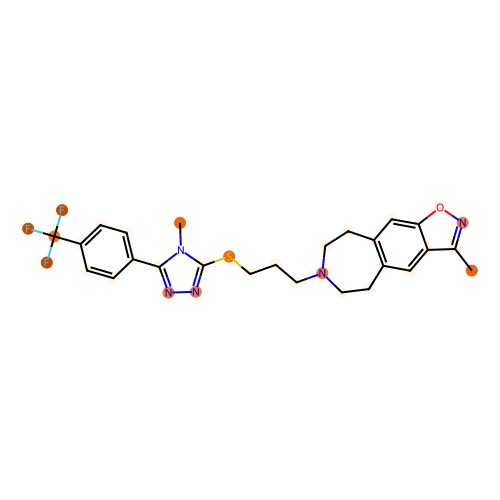

aromatic atom count: 12
prediction: [ 2.1576974 -1.5704366]
C[C@H]1CCCN1CCCOc1ccc(N2CCN(C(=O)c3ccc(C#N)cc3)CC2=O)cc1


[16:37:58] The new font size 1 is below the current minimum (6).


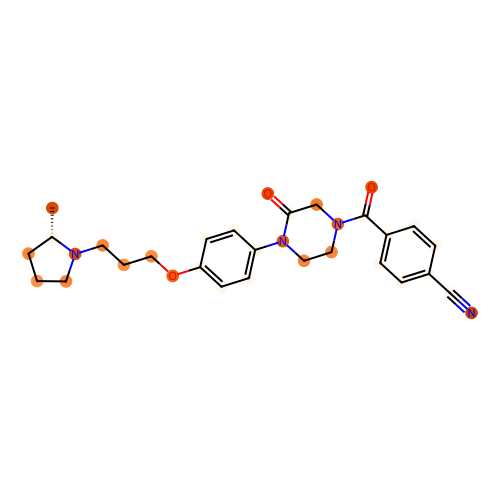

aromatic atom count: 17
prediction: [-1.8073109  1.7804854]
C[C@@H](OC1CCC2NC1(c1ccccc1)CC2c1nnn(C)n1)c1cc(C(F)(F)F)cc(C(F)(F)F)c1


[16:37:58] The new font size 1 is below the current minimum (6).


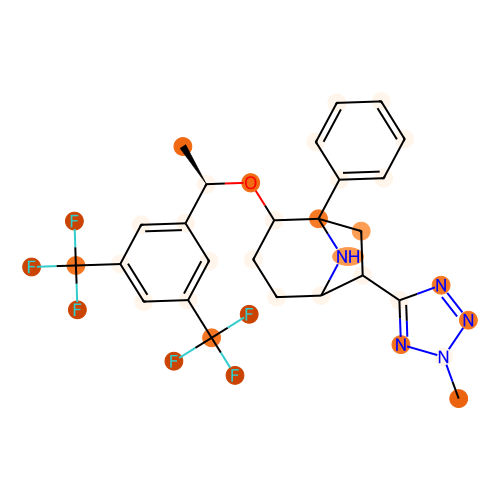

aromatic atom count: 12
prediction: [-1.4533523  1.4036043]
COc1ccc([C@@H](C)N[C@@H]2CC[C@@H](C(=O)N3CCC(C(=O)N4CCCC4)(c4ccccc4)CC3)C(C)(C)C2)cc1


[16:37:58] The new font size 1 is below the current minimum (6).


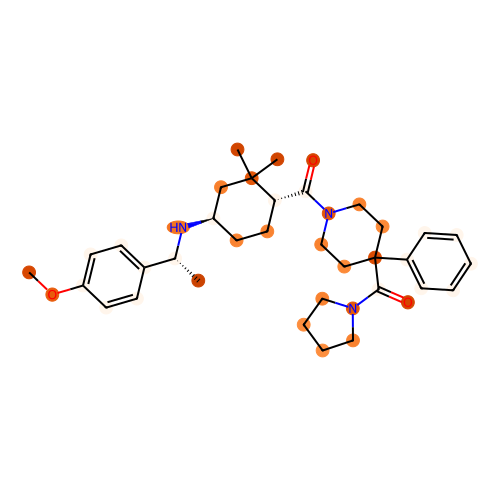

aromatic atom count: 21
prediction: [ 0.81768316 -0.6211481 ]
CCOc1nc(NC(=O)C2(NC(=O)c3ccc4c(c3)c(C)c(-c3ccc(F)cn3)n4C3CCCCC3)CCC2)ccc1/C=C/C(=O)O


[16:37:58] The new font size 1 is below the current minimum (6).


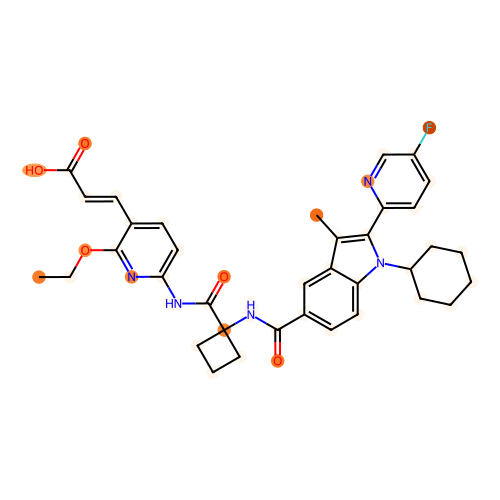

aromatic atom count: 23
prediction: [-0.68096995  0.6667177 ]
O=C(O)CCCOc1cccc(CCCCCCOc2cc(-c3ccsc3)cc(-c3ccc4c(c3)OCO4)c2)c1CCC(=O)O


[16:37:58] The new font size 1 is below the current minimum (6).


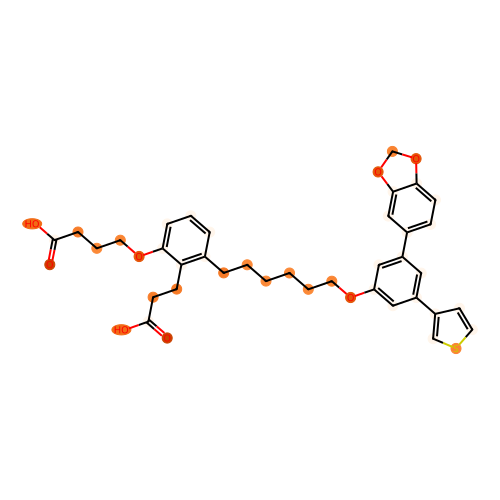

aromatic atom count: 22
prediction: [ 2.1462514 -1.5692203]
COc1ccc2c(=O)n(CC(CO)NCc3cccnc3)c(C#N)c(-c3ccccc3)c2c1


[16:37:58] The new font size 1 is below the current minimum (6).


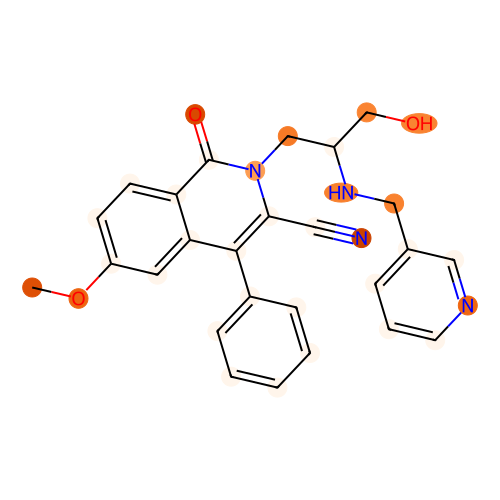

aromatic atom count: 17
prediction: [-1.0788219  1.118829 ]
OCC1(N2CCN(C3CCc4ccc(OCc5noc(-c6ccc(Cl)cc6)n5)cc43)CC2)CCCC1


[16:37:58] The new font size 1 is below the current minimum (6).


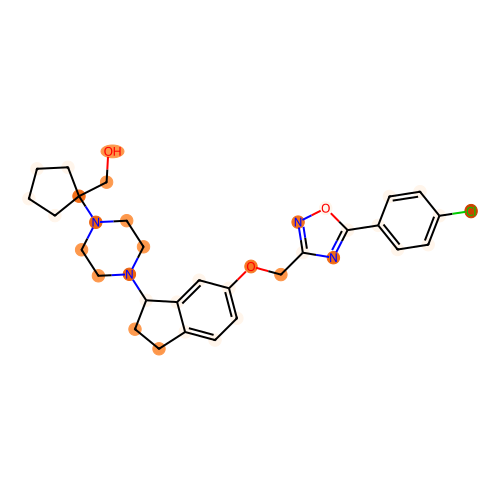

aromatic atom count: 15
prediction: [-1.1457009  1.1640875]
CCOc1cc(CN2CCC(Nc3nc4cc(S(=O)(=O)CC)ccc4o3)CC2)ccc1OC


[16:37:58] The new font size 1 is below the current minimum (6).


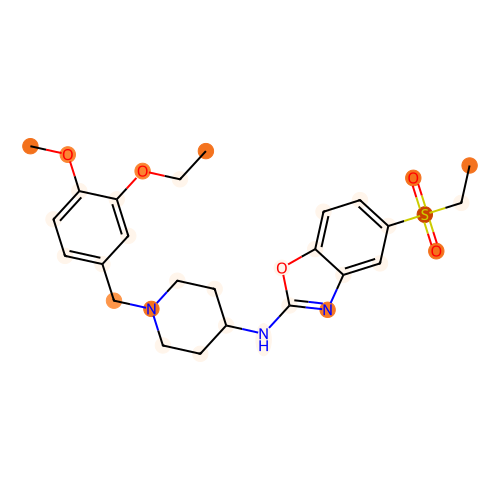

aromatic atom count: 17
prediction: [-1.4763342  1.4322735]
O=C([C@@H]1C[C@H]1c1ccc(C(F)(F)F)cc1)N1CCN(S(=O)(=O)c2cc(-c3cn[nH]n3)cc(C(F)(F)F)c2)CC1


[16:37:58] The new font size 1 is below the current minimum (6).


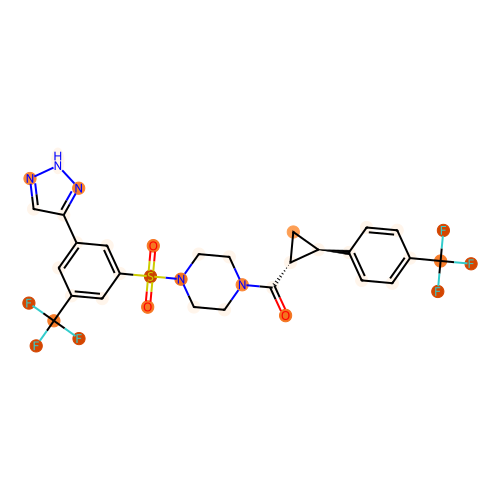

aromatic atom count: 16
prediction: [-1.6109563  1.4534826]
O=C(NC1CCN(Cc2ccc3c(c2)OCO3)CC1)c1cc(=O)c2ccc(Br)cc2o1


[16:37:58] The new font size 1 is below the current minimum (6).


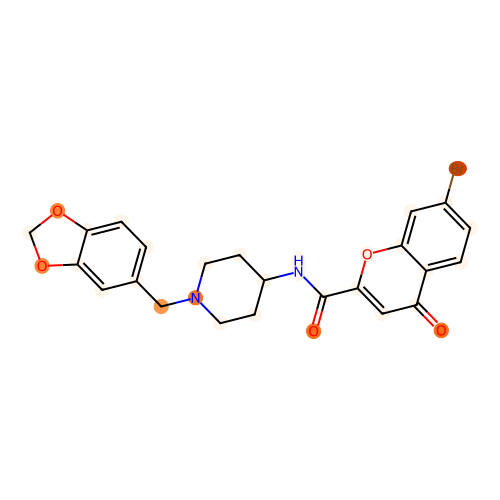

aromatic atom count: 33
prediction: [-0.86267465  0.96318424]
OCCN1CCN(c2ccc3nc(-c4ccccc4)c(-c4ccc(CN5CCC(c6nnc(-c7ncccn7)[nH]6)CC5)cc4)nc3n2)CC1


[16:37:58] The new font size 1 is below the current minimum (6).


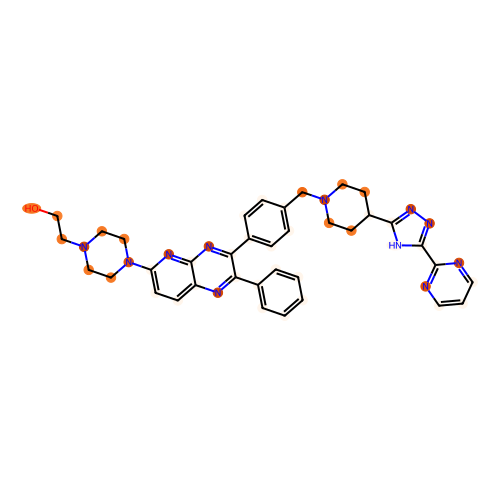

aromatic atom count: 16
prediction: [ 1.4235926 -1.2408668]
COc1ccc2ncc(=O)n(CC(N)C3(F)CCC(NCc4ccc5c(n4)NC(=O)CO5)CC3)c2c1


[16:37:58] The new font size 1 is below the current minimum (6).


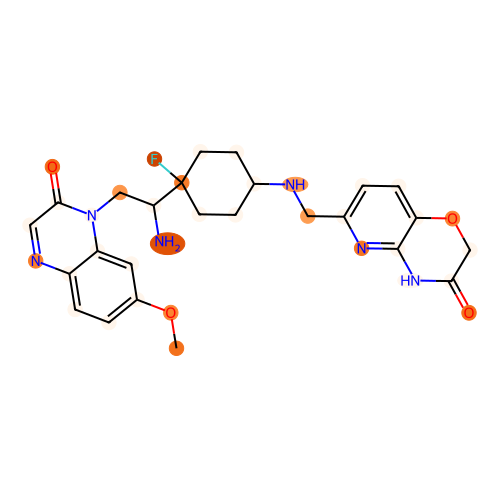

aromatic atom count: 12
prediction: [ 2.474076  -1.9242802]
Cc1ccc(C(=O)N2CCN(c3ccc(OC4CCN(C5CCC5)CC4)cc3)C(=O)C2)cc1


[16:37:58] The new font size 1 is below the current minimum (6).


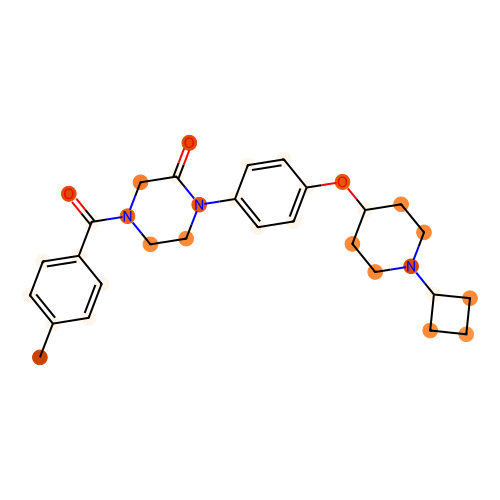

aromatic atom count: 12
prediction: [ 0.5375705  -0.48763812]
O=C(CNC(=O)c1cccc(C(F)(F)F)c1)NC1CN([C@H]2CC[C@@](O)(c3ccc(OC4CCC4)nc3)CC2)C1


[16:37:59] The new font size 1 is below the current minimum (6).


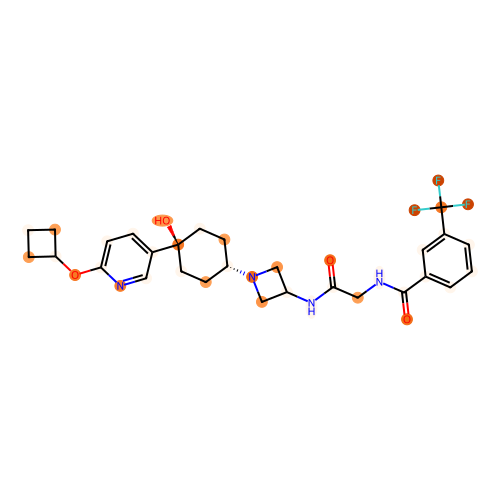

aromatic atom count: 11
prediction: [-0.04045966  0.09048244]
Cc1c2c(n3c1CCCN1CCC[C@@H](C1)Nc1cc-3ccc1C(N)=O)CC(C)(C)CC2=O


[16:37:59] The new font size 1 is below the current minimum (6).


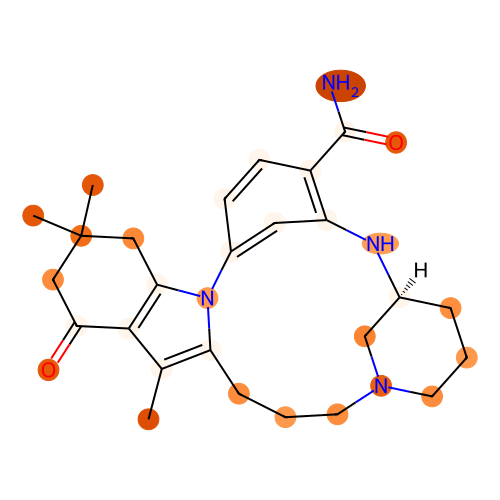

aromatic atom count: 21
prediction: [ 1.1724145  -0.84474635]
COc1cc(N2CCN(C(=O)CO)CC2)ccc1Nc1ncc(Cl)c(-c2cnc3ccccn23)n1


[16:37:59] The new font size 1 is below the current minimum (6).


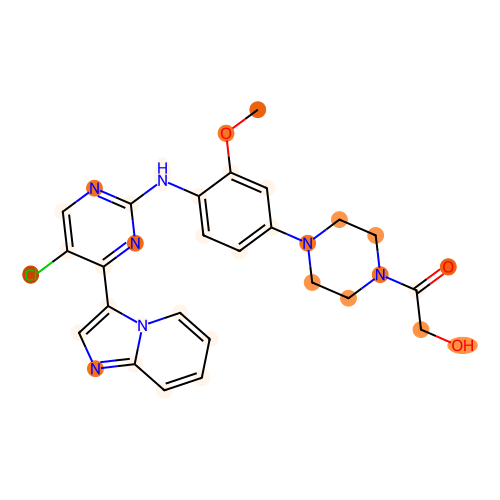

aromatic atom count: 23
prediction: [-1.4664824  1.4027426]
Cc1[nH]nc(C(=O)N[C@@H]2CC(C)(C)Oc3nc(-c4ccc(Cl)cc4Cl)c(-c4ccc(Cl)cc4)cc32)c1C


[16:37:59] The new font size 1 is below the current minimum (6).


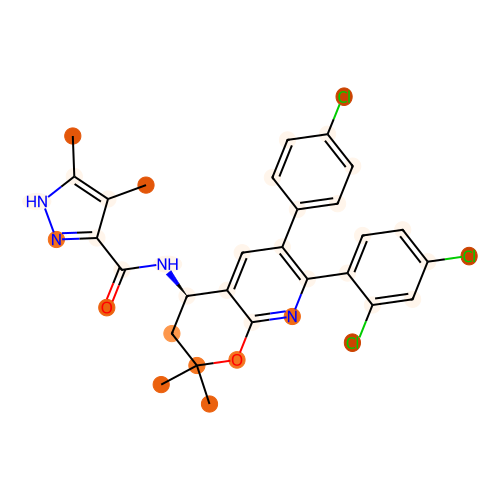

aromatic atom count: 16
prediction: [ 1.3369874  -0.98750925]
COc1ccc2ncc(F)c([C@@H](O)CN3CCC(NCc4cc5c(cn4)OCCO5)CC3)c2n1


[16:37:59] The new font size 1 is below the current minimum (6).


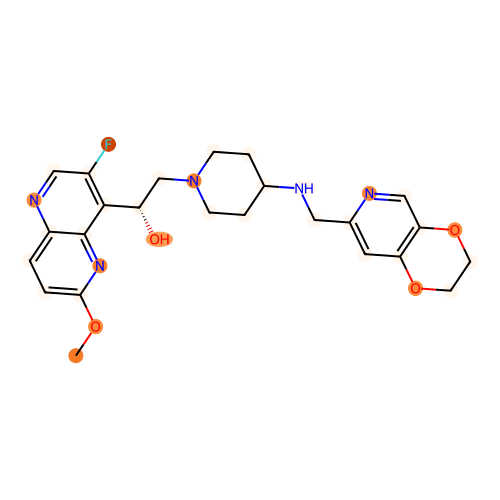

aromatic atom count: 16
prediction: [-1.1383339  1.1438962]
Cc1ccc2c(N3CCN(CCc4cccc5c4OCC(=O)N5C)CC3)cccc2n1


[16:37:59] The new font size 1 is below the current minimum (6).


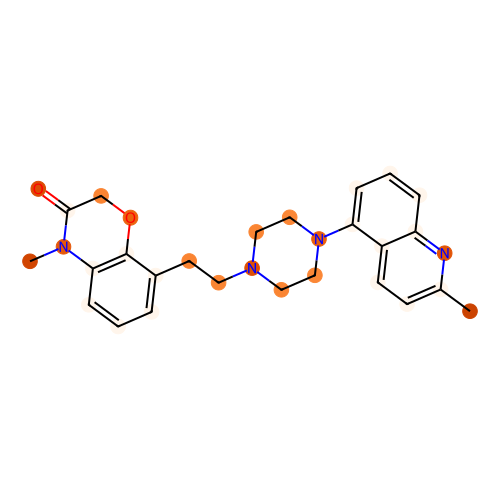

aromatic atom count: 16
prediction: [-0.5266657  0.5817706]
NC1COCC1Oc1ccc2ncc(F)c(CCC34CCC(NCc5ccc6c(n5)NC(=O)CO6)(CC3)CO4)c2n1


[16:37:59] The new font size 1 is below the current minimum (6).


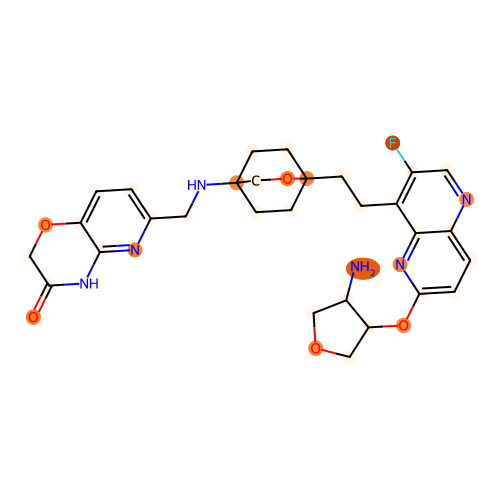

aromatic atom count: 12
prediction: [ 0.06189834 -0.00148022]
CN(C(=O)Cc1ccc(Cl)c(Cl)c1)C(CN1CCCC1)c1cccc(OCC(=O)O)c1


[16:37:59] The new font size 1 is below the current minimum (6).


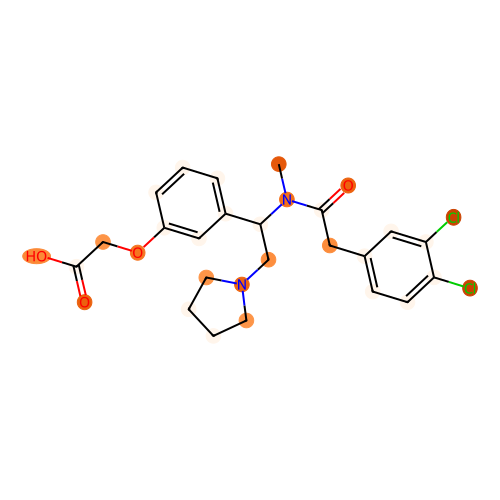

aromatic atom count: 12
prediction: [ 0.16859935 -0.11932742]
Cn1ccc([C@H]2CCNC[C@@H]2C(=O)N(Cc2cc(CCCC#N)cc(Cl)c2Cl)C2CC2)cc1=O


[16:37:59] The new font size 1 is below the current minimum (6).


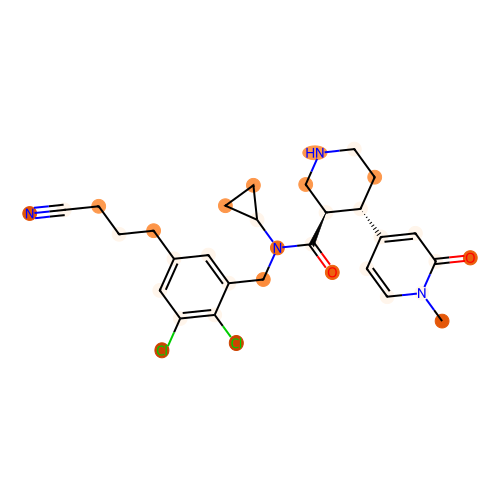

aromatic atom count: 12
prediction: [-2.3741698  2.1017618]
CC(C)CN(CCc1ccc(Cl)c(Cl)c1)C[C@H](O)COc1ccc(NS(C)(=O)=O)cc1


[16:37:59] The new font size 1 is below the current minimum (6).


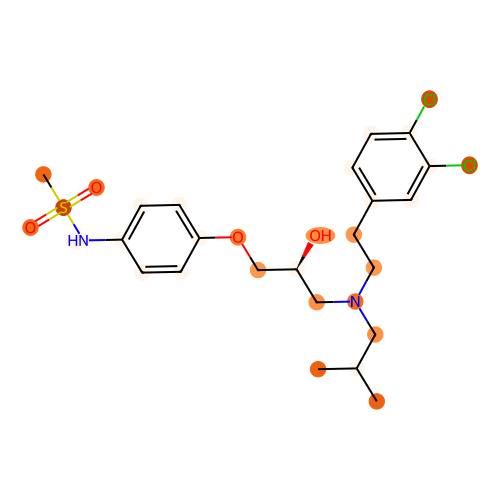

aromatic atom count: 16
prediction: [-1.5918373  1.4988693]
COc1ccccc1N1CCN(CCCCNC(=O)c2ccc3ccccc3c2)CC1


[16:37:59] The new font size 1 is below the current minimum (6).


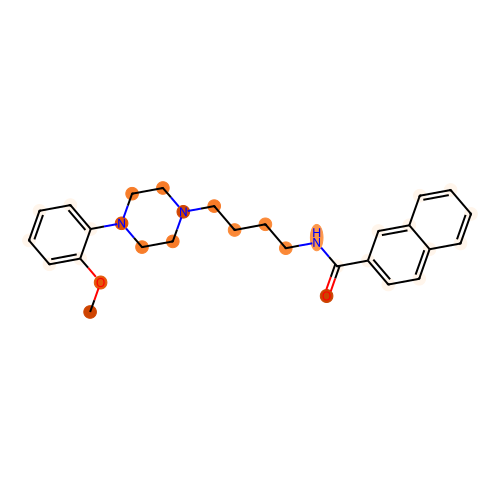

aromatic atom count: 12
prediction: [ 1.2067953 -0.9210445]
O=C(O)c1ccc(C2CCN([C@@H]3C[C@H]4OCC[C@@]4(C(=O)N4CCc5ncc(C(F)(F)F)cc5C4)C3)CC2)cc1


[16:37:59] The new font size 1 is below the current minimum (6).


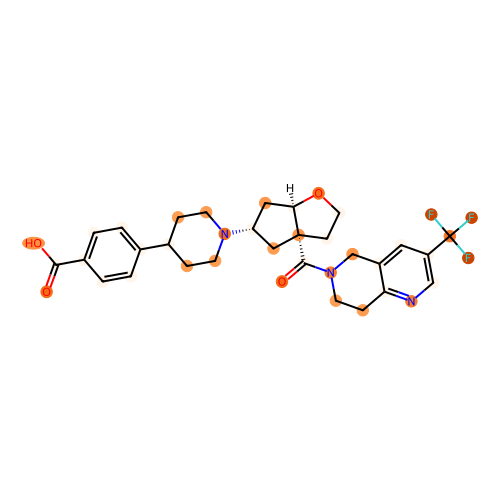

aromatic atom count: 21
prediction: [-1.5828929  1.5292245]
O[C@]1(c2ccc(F)c(F)c2)CCNC[C@@H]1c1onc(-c2cccc3ccccc23)c1Br


[16:37:59] The new font size 1 is below the current minimum (6).


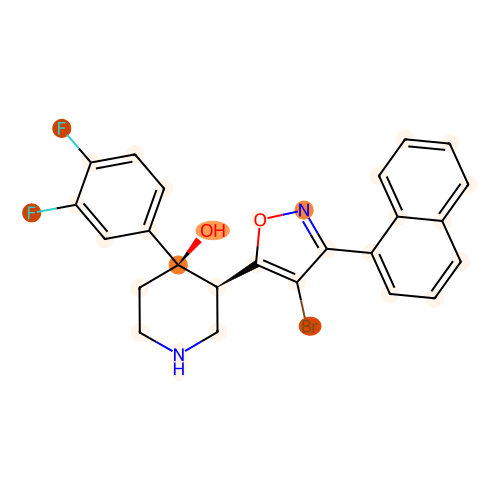

aromatic atom count: 12
prediction: [-0.14301199  0.15236375]
COc1ccc2c(c1)N(CCN1CCC(NCc3cc4c(cn3)OCCO4)CC1)C(=O)CS2


[16:37:59] The new font size 1 is below the current minimum (6).


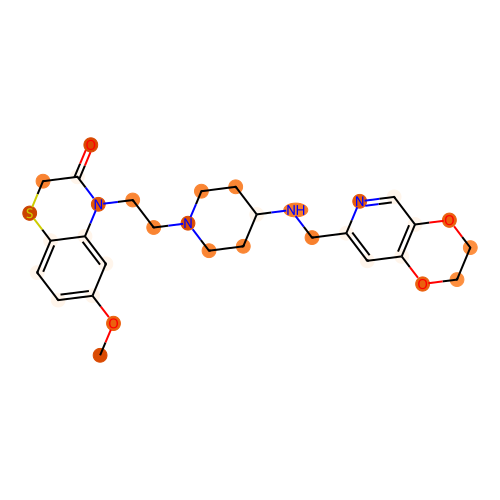

aromatic atom count: 12
prediction: [ 1.2576522 -0.9507513]
CC1(C)Cc2cccc(CN3CCC4(CC3)CCN(C(=O)c3ncccc3N)CC4)c2O1


[16:37:59] The new font size 1 is below the current minimum (6).


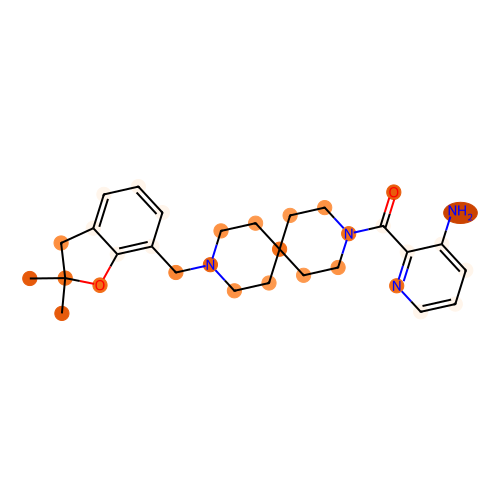

aromatic atom count: 22
prediction: [-0.6143165  0.6814666]
COc1c(-n2cnc(C)c2)ccc(-c2cn([C@H]3CCc4c(F)cccc4N(CC(F)(F)F)C3=O)nn2)c1F


[16:37:59] The new font size 1 is below the current minimum (6).


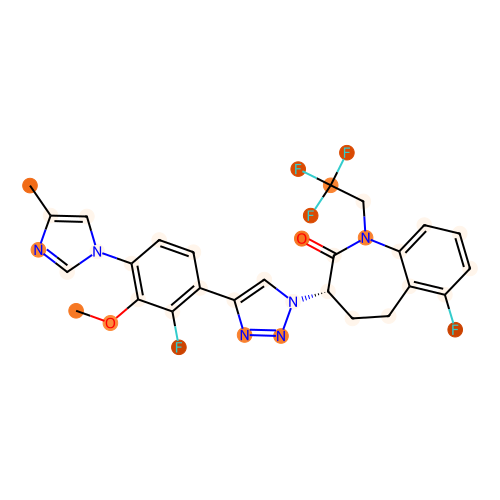

aromatic atom count: 6
prediction: [ 3.274114  -2.4827058]
CCOC[C@@H](CC(C)C)NC(=O)[C@@H]1CNC[C@H](C(=O)N(c2cc(OC)c(C(C)C)cn2)C2CC2)[C@@H]1O


[16:37:59] The new font size 1 is below the current minimum (6).


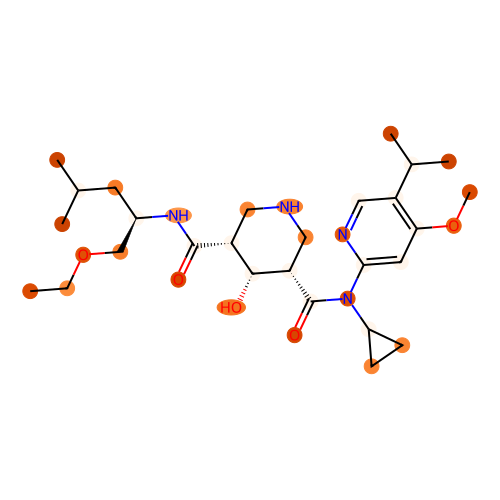

aromatic atom count: 6
prediction: [ 3.2121572 -2.474966 ]
O=C(N1CCc2ncc(C(F)(F)F)cc2C1)[C@@]12CCC[C@@H]1C[C@@H](NC1CCOCC1)C2


[16:37:59] The new font size 1 is below the current minimum (6).


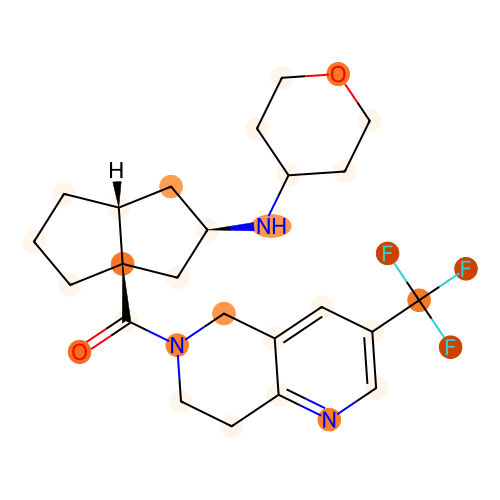

aromatic atom count: 15
prediction: [-1.1144582  1.1385554]
O=C1O[C@]2(CC[C@H](c3nc4cc(OC(F)(F)F)ccc4[nH]3)CC2)CN1c1cccc(F)n1


[16:37:59] The new font size 1 is below the current minimum (6).


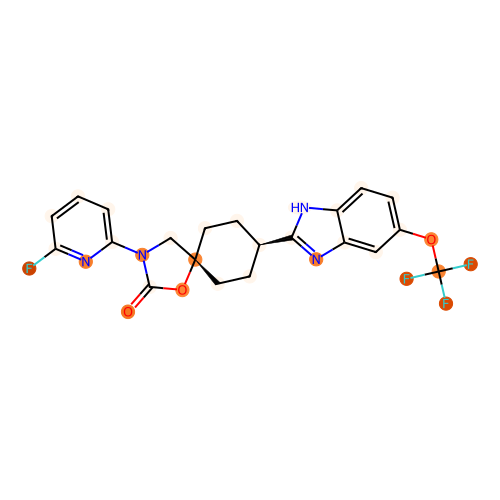

aromatic atom count: 23
prediction: [-0.19897945  0.25301933]
COc1ccc(Oc2cc(C)c(-c3csc(NC(=O)c4ccnc(F)c4)n3)c(C)c2)cc1


[16:37:59] The new font size 1 is below the current minimum (6).


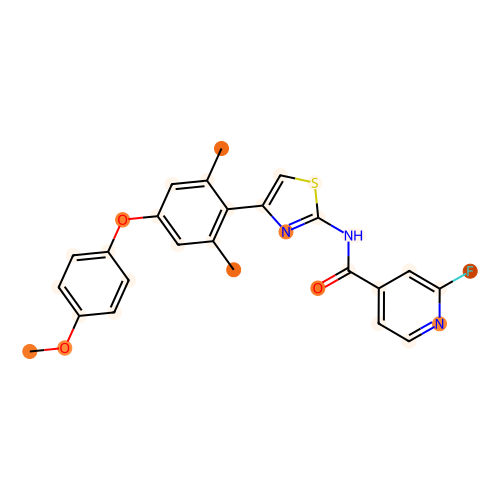

aromatic atom count: 16
prediction: [-2.0242658  1.8453673]
Cc1ncoc1-c1nnc(SCCCN2CC3CC3(c3cc(F)cc(C(F)(F)F)c3)C2)n1C


[16:37:59] The new font size 1 is below the current minimum (6).


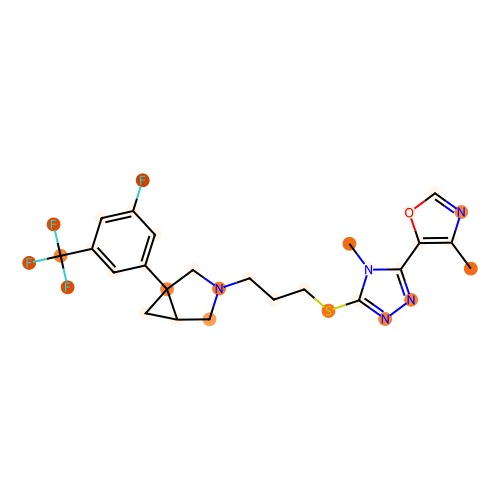

aromatic atom count: 15
prediction: [-1.0314944  1.104988 ]
CCc1nn(CCOCC(F)(F)F)c2c(Nc3ccncn3)nc(N3CCN[C@H](C)C3)nc12


[16:37:59] The new font size 1 is below the current minimum (6).


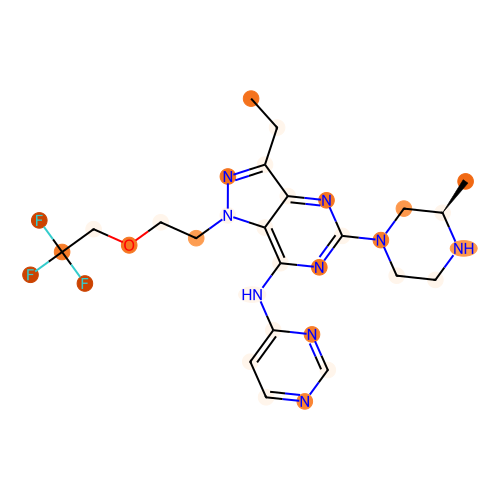

aromatic atom count: 21
prediction: [ 1.8475816 -1.3332912]
Cc1nc2ccccc2n1C1CC2CCC(C1)N2CCC1(c2ccccc2)CCN(C(=O)c2cccc(S(=O)(=O)N(C)C)c2)CC1


[16:37:59] The new font size 1 is below the current minimum (6).


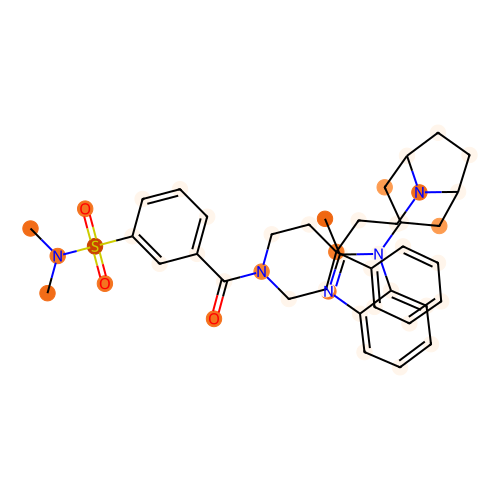

aromatic atom count: 15
prediction: [-1.4987497  1.3614229]
O=C([C@H]1CNCC[C@]1(O)c1ccc(F)c(F)c1)N(Cc1c[nH]c2cccc(Br)c12)C1CC1


[16:37:59] The new font size 1 is below the current minimum (6).


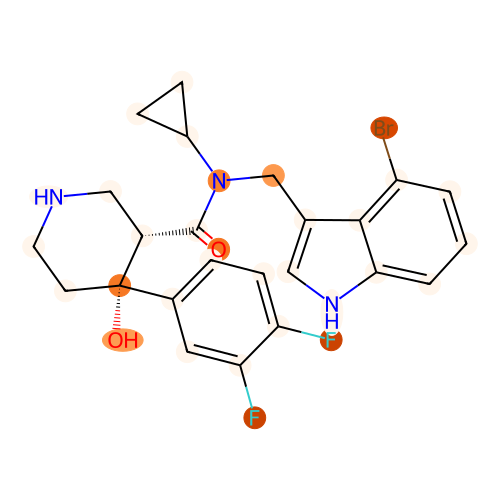

aromatic atom count: 16
prediction: [ 0.97066563 -0.7987104 ]
O=C(NCCN1CCCCC1)c1ccc(CN2CCC(NC(=O)c3cc(=O)c4ccc(F)cc4o3)CC2)cc1


[16:37:59] The new font size 1 is below the current minimum (6).


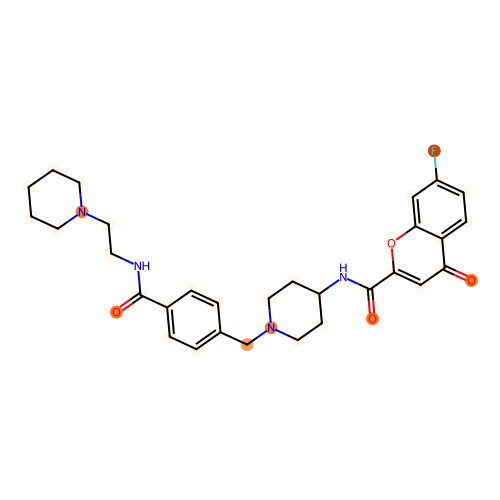

aromatic atom count: 22
prediction: [ 1.0955342  -0.81549275]
Cc1cc(-c2ccc3cc(CCN4CCC[C@H]4C)ccc3n2)nc(-c2ccccc2)n1


[16:37:59] The new font size 1 is below the current minimum (6).


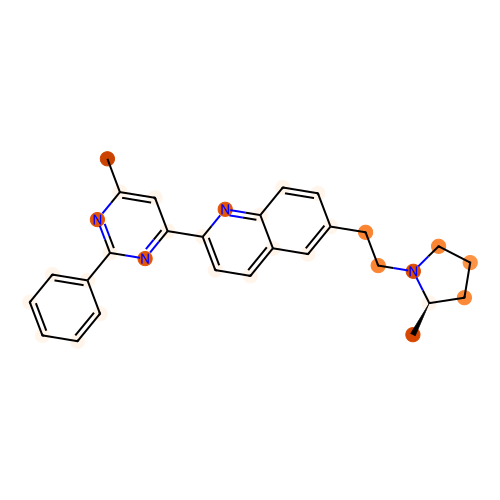

aromatic atom count: 16
prediction: [-1.5324913  1.5355476]
O=C1COc2ccc(CNC34CCC(CCc5ccnc6cc(Cl)cnc56)(CC3)OC4)nc2N1


[16:37:59] The new font size 1 is below the current minimum (6).


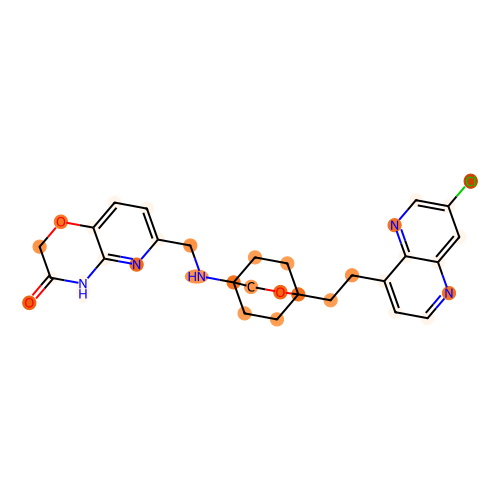

aromatic atom count: 24
prediction: [-1.471676   1.4420363]
CCc1nn(C)c2cc3c(cc12)CCN(CCCSc1nnc(-c2cccc4nc(C)ccc24)n1C)CC3


[16:37:59] The new font size 1 is below the current minimum (6).


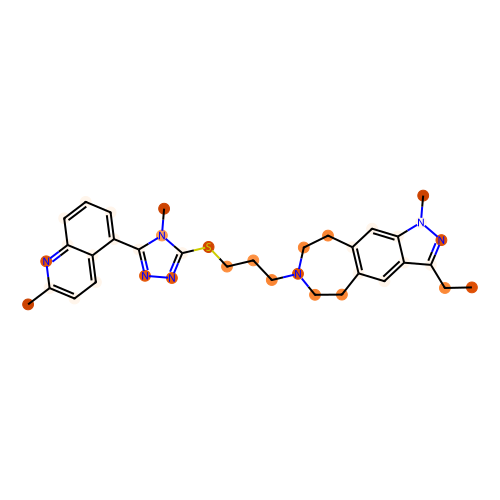

aromatic atom count: 21
prediction: [-0.22946182  0.25621024]
CNC(=O)[C@@]12C[C@@H]1[C@@H](n1cnc3c(NCc4cccc(Cl)c4)nc(C#Cc4ccc(F)c(F)c4)nc31)[C@H](O)[C@@H]2O


[16:37:59] The new font size 1 is below the current minimum (6).


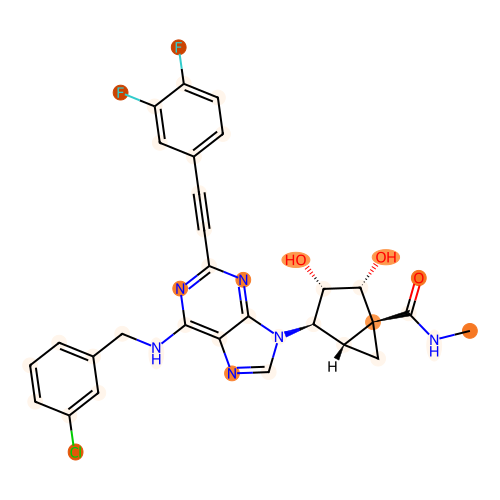

aromatic atom count: 16
prediction: [ 0.35778478 -0.24085423]
COc1cc(-c2cn([C@H]3C[C@@H](C(C)(C)C)CCN(CC(C)(C)C)C3=O)nn2)ccc1-n1cnc(C)c1


[16:37:59] The new font size 1 is below the current minimum (6).


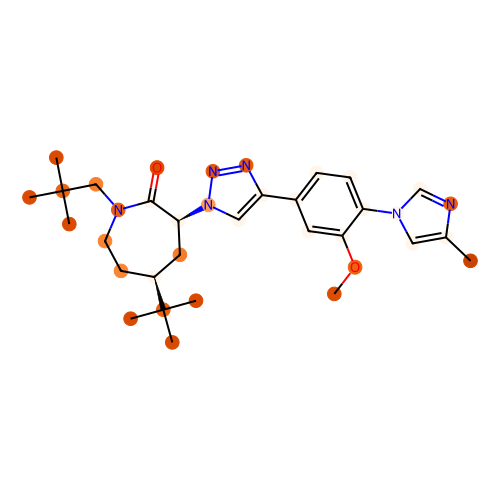

aromatic atom count: 12
prediction: [ 0.66027284 -0.57283247]
COC(=O)C1(CNC(=O)c2cc(OC)cc(OC)c2)CCN(CC2=Cc3ccccc3OC2(C)C)CC1


[16:37:59] The new font size 1 is below the current minimum (6).


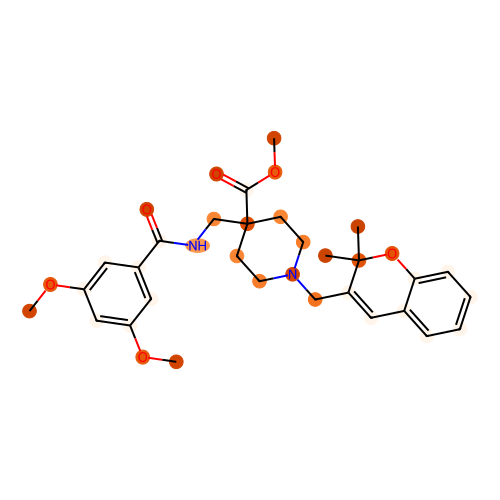

aromatic atom count: 20
prediction: [-1.6008881  1.523989 ]
Cc1cc(Cn2cc(CN(C(=O)[C@H]3CNCC[C@]3(O)c3ccc(F)c(F)c3)C3CC3)c3c(F)cccc32)no1


[16:37:59] The new font size 1 is below the current minimum (6).


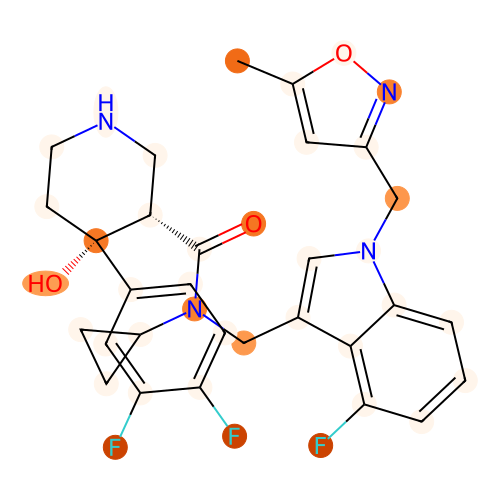

aromatic atom count: 15
prediction: [-0.21223037  0.26485515]
CC(C)(CNC(=O)N1CCC(c2nc(-c3ccc4ccccc4n3)no2)CC1)N1CCOCC1


[16:37:59] The new font size 1 is below the current minimum (6).


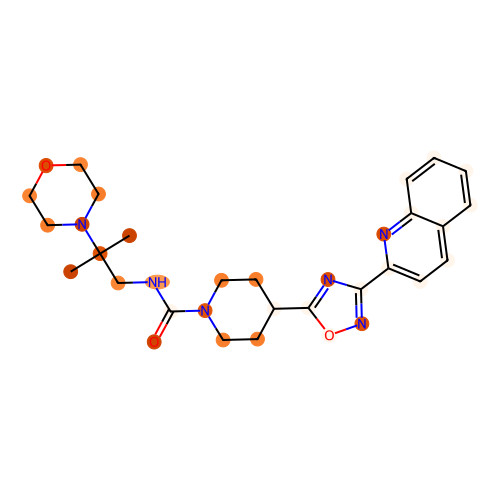

aromatic atom count: 16
prediction: [ 1.0852423  -0.83088875]
N[C@@H]1CO[C@H]1COc1ccc2ncc(F)c(CCC34CCC(NCc5ccc6c(n5)NC(=O)CO6)(CC3)CO4)c2n1


[16:37:59] The new font size 1 is below the current minimum (6).


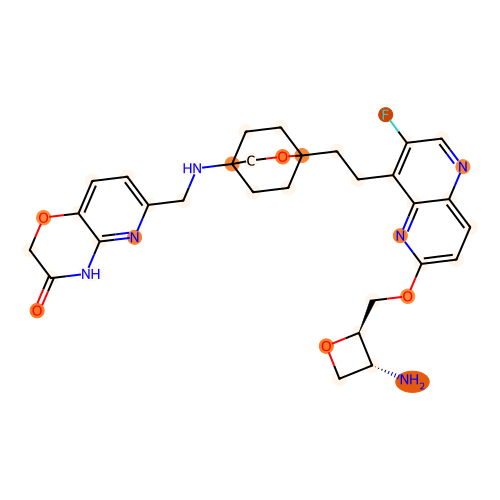

aromatic atom count: 17
prediction: [-0.95236087  1.0281872 ]
CCc1cc(-c2nnc(NCCCN3CCCCC3)o2)ccc1NC(=O)c1ccccc1F


[16:37:59] The new font size 1 is below the current minimum (6).


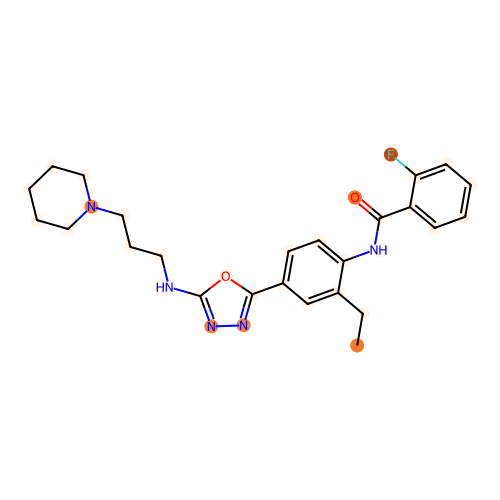

aromatic atom count: 23
prediction: [-1.3965863  1.3211111]
Cc1n[nH]c(C)c1C(=O)N[C@@H]1CC(C)(C)Oc2nc(-c3ccc(Cl)cc3Cl)c(-c3ccc(Cl)cc3)cc21


[16:37:59] The new font size 1 is below the current minimum (6).


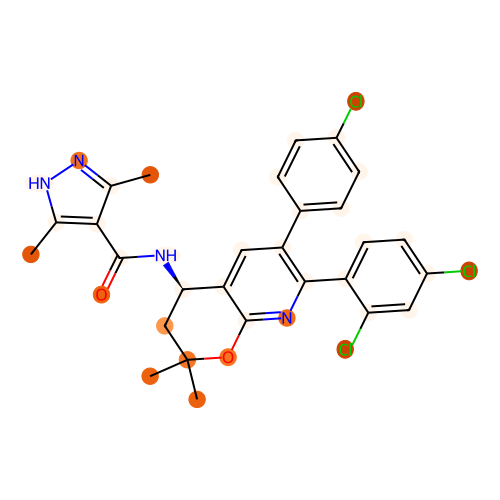

aromatic atom count: 30
prediction: [-1.5547545  1.5162259]
Cc1nc([C@]2(c3cnn(C)c3)N[C@@H](c3nc(-c4ccc(F)cc4)c[nH]3)Cc3c2[nH]c2ccccc32)no1


[16:37:59] The new font size 1 is below the current minimum (6).


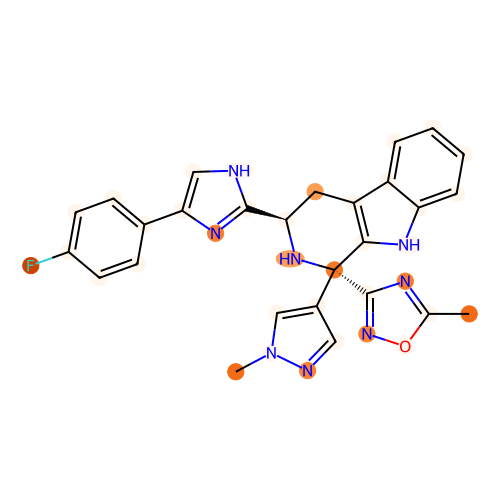

aromatic atom count: 17
prediction: [ 1.6349696 -1.2444193]
C[C@@H]1CN(c2noc(C(F)(F)F)n2)CCN1c1ncc(OCc2ccncc2C#N)cn1


[16:37:59] The new font size 1 is below the current minimum (6).


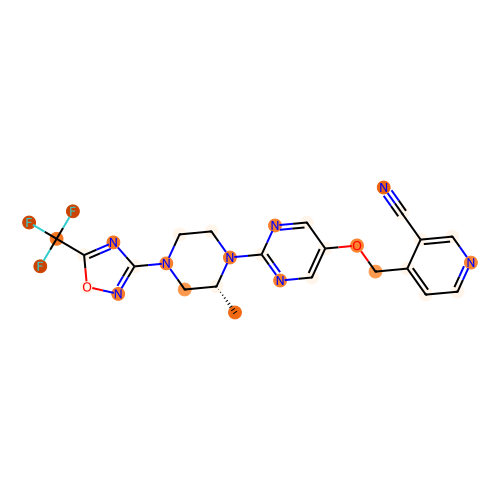

aromatic atom count: 18
prediction: [-1.1369863  1.100403 ]
CC(C)(C)NC(=O)c1c[nH]c2ncc(-c3nn(CCCS(C)(=O)=O)c4cc(F)ccc34)nc12


[16:37:59] The new font size 1 is below the current minimum (6).


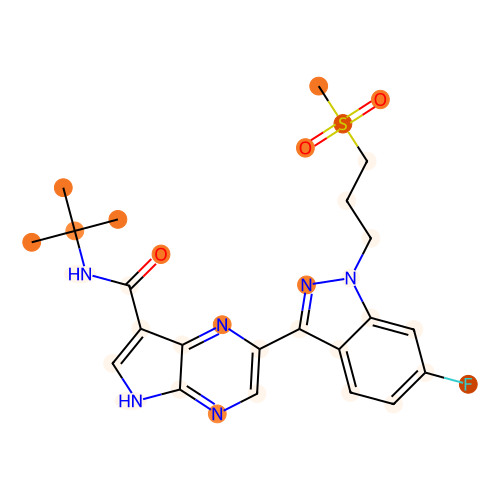

aromatic atom count: 18
prediction: [-1.0602274  1.0777086]
Cc1ncc(OC[C@@]2(c3cc(F)cc(F)c3)C[C@H]2C(=O)Nc2ccc(F)cn2)c(C)n1


[16:37:59] The new font size 1 is below the current minimum (6).


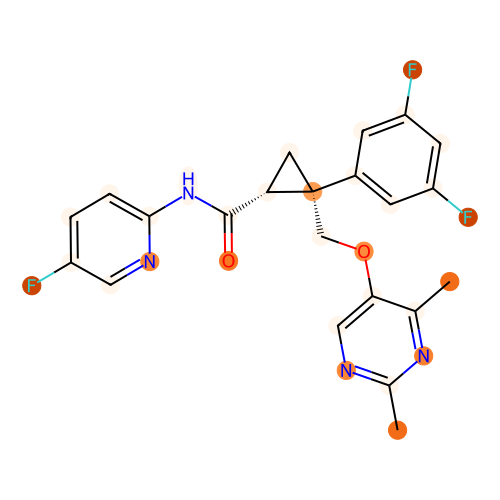

aromatic atom count: 16
prediction: [ 0.6214861  -0.51023304]
CCCOCCn1c(=O)c(NCCNCCO)nc2cnc(-c3ccc(OC)nc3)cc21


[16:37:59] The new font size 1 is below the current minimum (6).


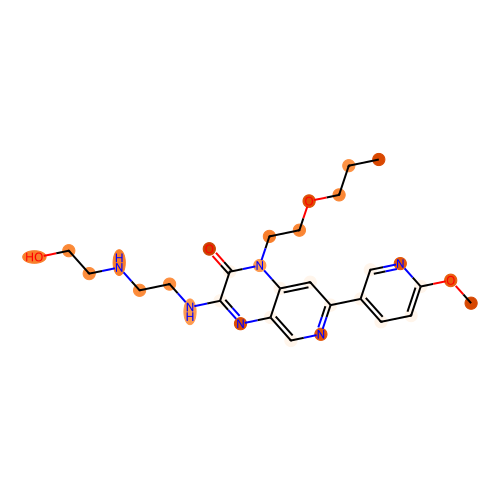

aromatic atom count: 16
prediction: [-0.9085199   0.94226414]
[2H]C([2H])(O)CN1CCN(c2cnc3cc(C(F)(F)F)cc(NCc4cccc([N+](=O)[O-])c4)c3c2)CC1


[16:37:59] The new font size 1 is below the current minimum (6).


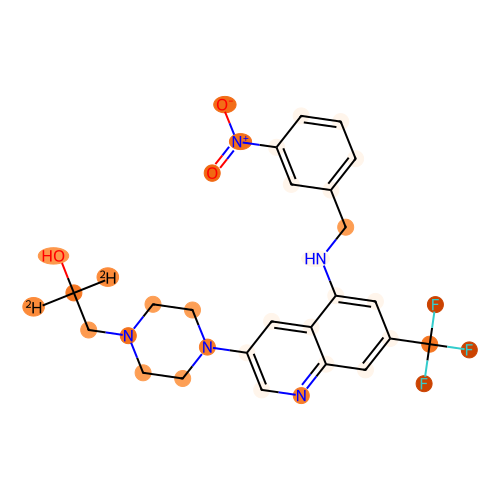

aromatic atom count: 22
prediction: [ 2.8700554 -2.042728 ]
O=C(NC1CC1)c1cn(-c2cccc(C#Cc3ccc[n+]([O-])c3)c2)c2ncccc2c1=O


[16:37:59] The new font size 1 is below the current minimum (6).


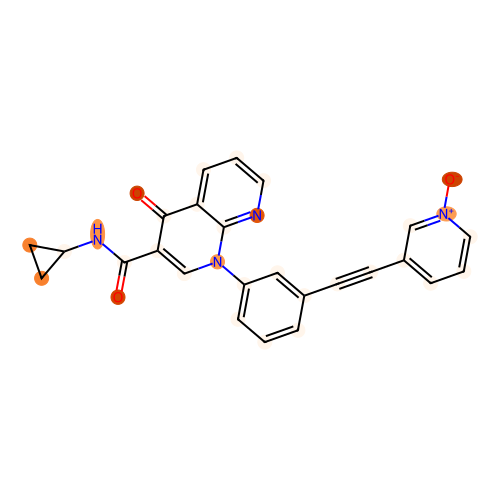

aromatic atom count: 15
prediction: [-0.33276665  0.39630976]
CN(C)C1(CNC(=O)N2CCC(c3nc(-c4ccc5ccccc5n4)no3)CC2)CCCC1


[16:37:59] The new font size 1 is below the current minimum (6).


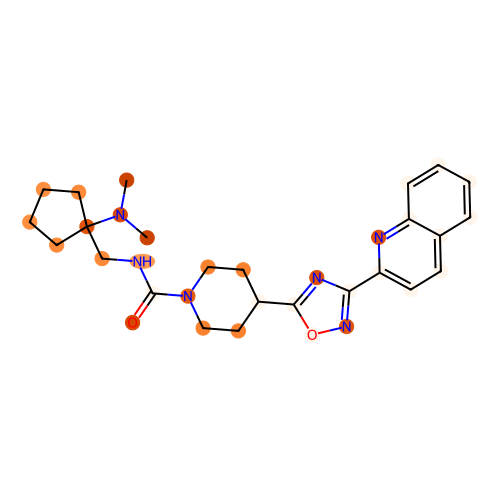

aromatic atom count: 18
prediction: [-1.4311079  1.4217631]
COc1ccc(COc2ccn(-c3ccc(OCCN4CCCC4)cc3)c(=O)c2)cc1


[16:37:59] The new font size 1 is below the current minimum (6).


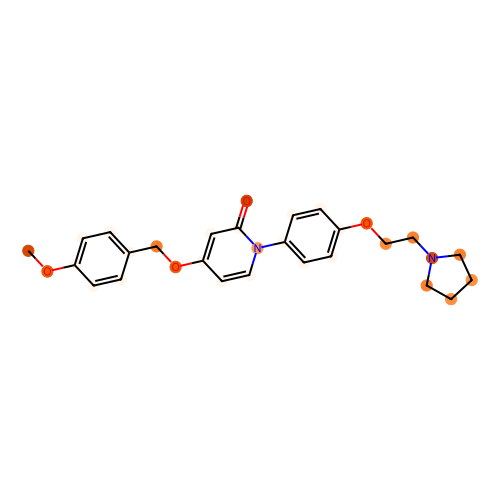

aromatic atom count: 12
prediction: [ 0.9988194 -0.8088868]
N#Cc1cccc([C@]2(O)CC[C@@H](N3CC(NC(=O)CNC(=O)c4cccc(C(F)(F)F)c4)C3)CC2)c1


[16:37:59] The new font size 1 is below the current minimum (6).


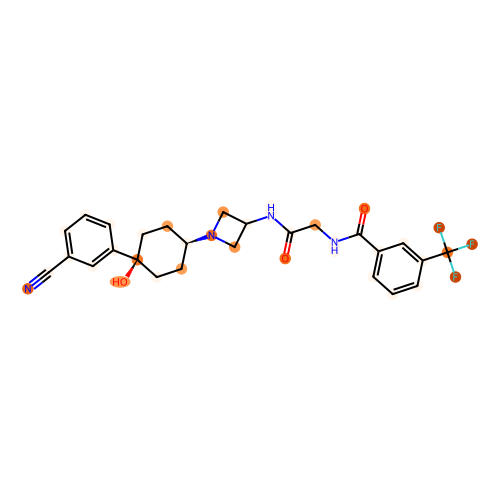

aromatic atom count: 21
prediction: [ 2.4186893 -1.7877179]
CC(C)c1cc(C#N)cc2nc(-c3ccc(C(=O)NC[C@H]4CC[C@@H](c5cccc(C(F)(F)F)c5)CC4)cc3)oc12


[16:37:59] The new font size 1 is below the current minimum (6).


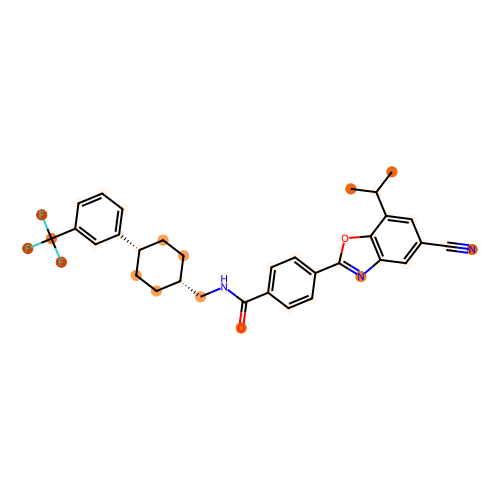

aromatic atom count: 16
prediction: [ 3.3327703 -2.5364554]
COc1ccc2ncc(=O)n(CCN3CC[C@@H](NCc4cc5c(cn4)OCCO5)[C@H](O)C3)c2c1


[16:37:59] The new font size 1 is below the current minimum (6).


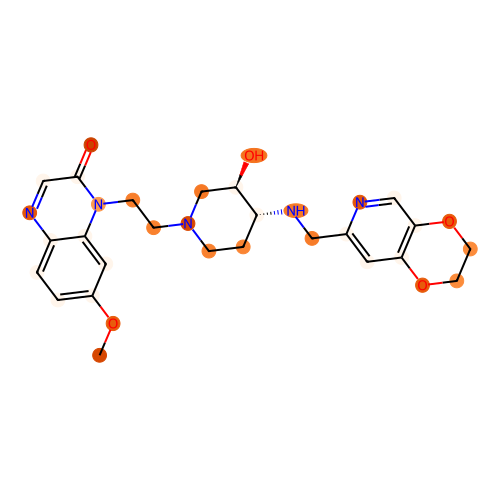

aromatic atom count: 16
prediction: [-2.167991   1.9885228]
CN(C)Cc1cc(OCCCN2CCCCC2)ccc1Nc1ncnc2ccccc12


[16:37:59] The new font size 1 is below the current minimum (6).


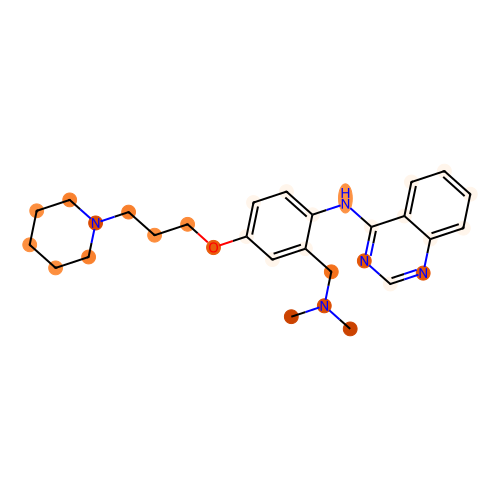

aromatic atom count: 24
prediction: [-0.02685402  0.02836047]
Cc1c(NC(=O)OC[C@@H]2COCCN2)cn2ncnc(Nc3ccc4c(cnn4Cc4cccc(F)c4)c3)c12


[16:37:59] The new font size 1 is below the current minimum (6).


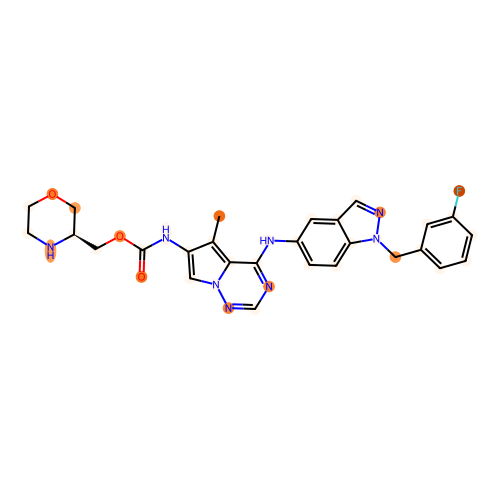

aromatic atom count: 6
prediction: [-0.5813328  0.5852886]
O=C(Nc1cccc(N2CCN(CCCCNS(=O)(=O)CC3CCCCC3)CC2)c1)C1CC1


[16:37:59] The new font size 1 is below the current minimum (6).


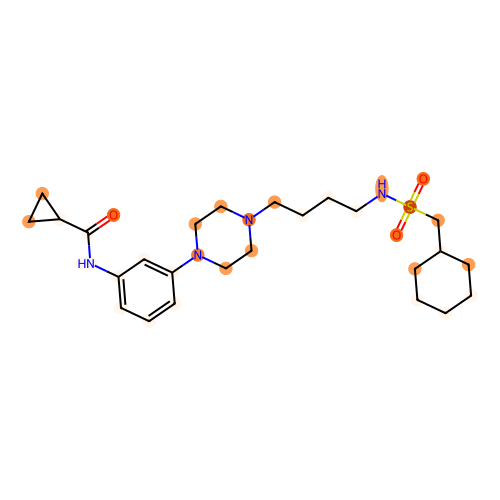

aromatic atom count: 9
prediction: [-2.0579758  1.9465082]
C[C@H]1c2c([nH]c3ccc(C(F)(F)F)cc23)C[C@H]2CCN(CCCC3CCOCC3)C[C@@H]21


[16:37:59] The new font size 1 is below the current minimum (6).


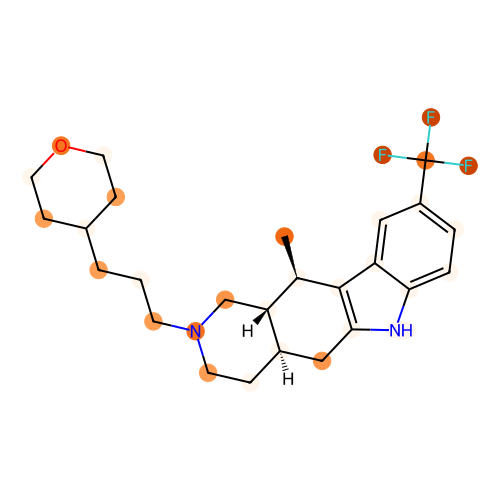

aromatic atom count: 21
prediction: [-1.0540361  1.0915358]
COC[C@H]1CCCN1CCn1ncc2cc(-n3ccc(OCc4ccccc4)cc3=O)ccc21


[16:37:59] The new font size 1 is below the current minimum (6).


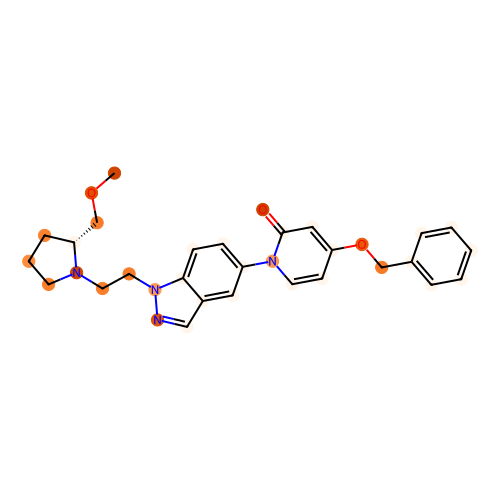

aromatic atom count: 24
prediction: [-1.6203476  1.5166864]
CN(C)C(=N)c1ccc(C(=O)Nc2ccc(Sc3ccccc3)cc2C(=O)Nc2ccc(Cl)cn2)cc1


[16:37:59] The new font size 1 is below the current minimum (6).


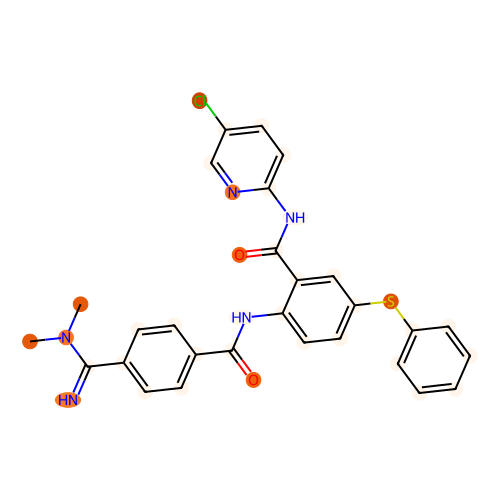

aromatic atom count: 18
prediction: [ 0.09407758 -0.0201922 ]
COc1ccc(CNC(=O)C2(c3ccccc3)CCN(c3cc(N)ccn3)CC2)cc1


[16:37:59] The new font size 1 is below the current minimum (6).


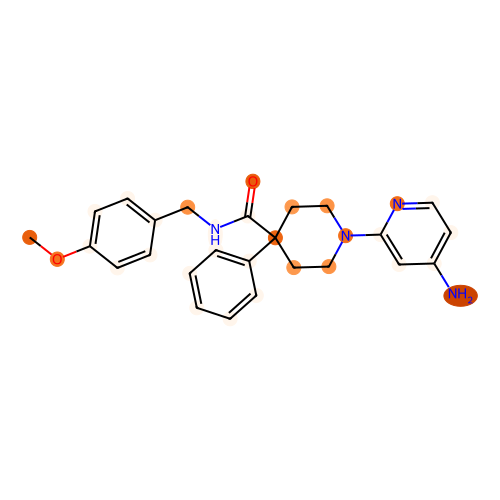

aromatic atom count: 18
prediction: [ 0.94722986 -0.6716712 ]
CCN(C)C(=O)c1ccc([C@H](c2ccccn2)N2CCN(Cc3ccccn3)CC2)cc1


[16:37:59] The new font size 1 is below the current minimum (6).


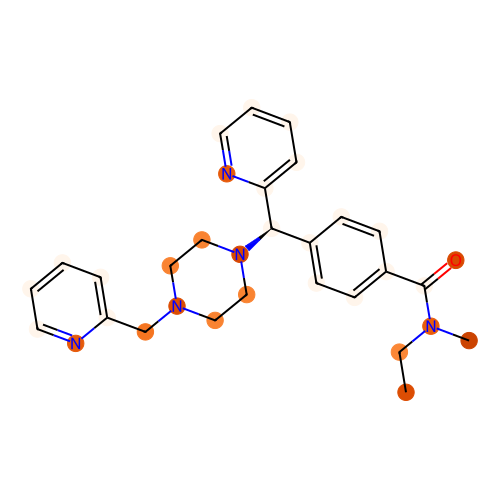

aromatic atom count: 15
prediction: [-0.8281068   0.87112975]
O=C1COc2ccccc2N1CCCN1CCC(n2c(=O)[nH]c3ccc(F)cc32)CC1


[16:37:59] The new font size 1 is below the current minimum (6).


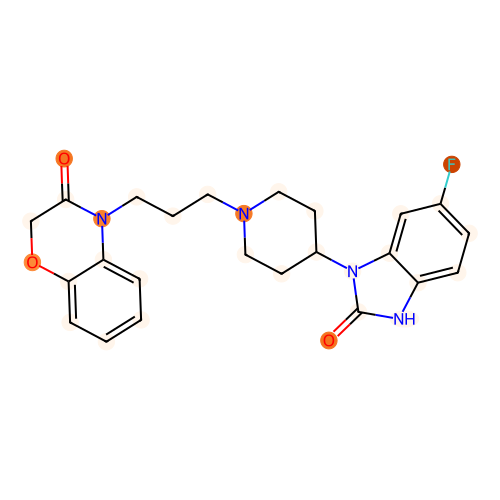

aromatic atom count: 18
prediction: [-0.3191083   0.33929202]
COc1cnc(-c2ccccc2CCNC(=O)c2ccc(OCCC(F)(F)F)nc2)cn1


[16:37:59] The new font size 1 is below the current minimum (6).


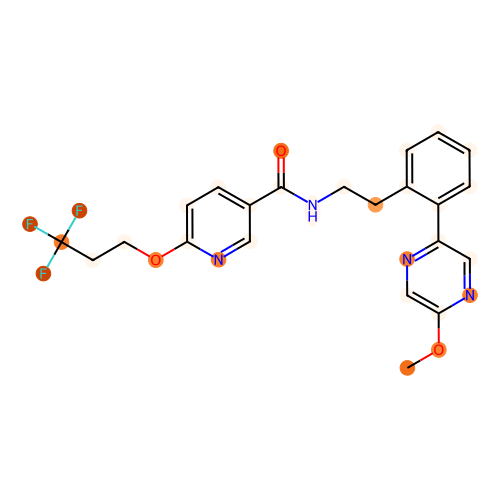

aromatic atom count: 16
prediction: [ 0.24903701 -0.18761837]
O=C(O)c1cc(CN2CCN(c3ccc(C(F)(F)F)cc3)CC2)c2ccccn2c1=O


[16:37:59] The new font size 1 is below the current minimum (6).


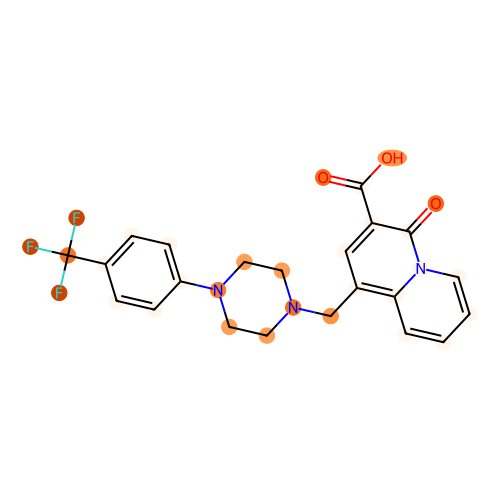

aromatic atom count: 15
prediction: [-0.02714328  0.09003749]
O=C(CNc1n[nH]c2ccc(C(F)(F)F)cc12)NC1CN([C@H]2CC[C@@H](c3ccccc3)CC2)C1


[16:37:59] The new font size 1 is below the current minimum (6).


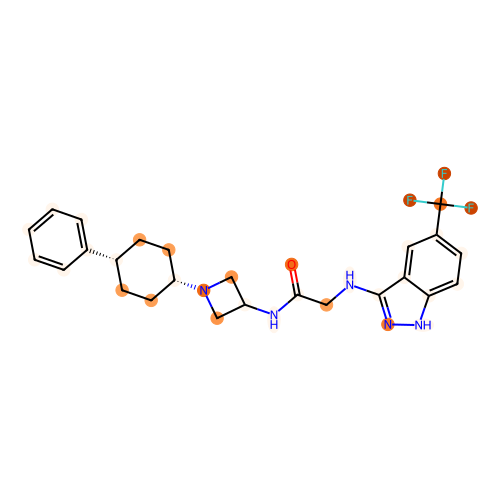

aromatic atom count: 22
prediction: [-1.8190408  1.7144332]
Cc1cc(-c2ccc3c(c2)CCN(CCCSc2nnc(-c4cccc(F)c4)n2C)CC3)no1


[16:37:59] The new font size 1 is below the current minimum (6).


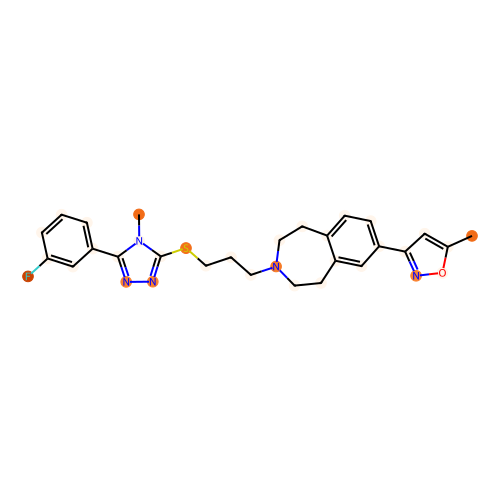

aromatic atom count: 18
prediction: [-0.30160493  0.32695472]
NC1=N[C@@]2(CO1)c1cc(-c3cccnc3F)ccc1Oc1cnc(C3CCOCC3)cc12


[16:37:59] The new font size 1 is below the current minimum (6).


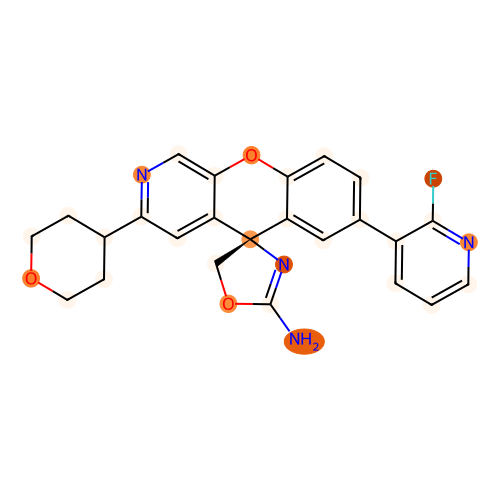

aromatic atom count: 17
prediction: [-0.26832113  0.31426075]
Cc1cc(-n2cnnn2)ccc1CC(=O)N1CCN(CCc2ccc3c(c2)COC3=O)CC1


[16:37:59] The new font size 1 is below the current minimum (6).


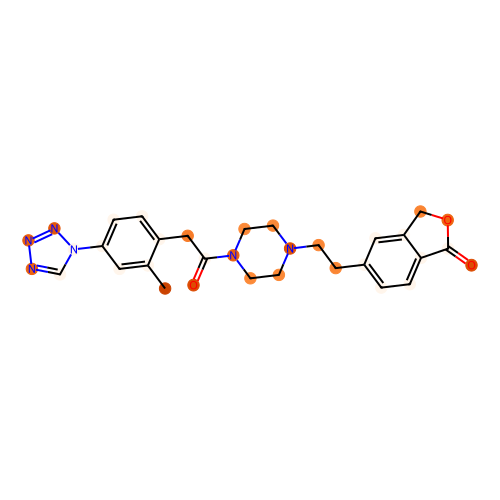

aromatic atom count: 12
prediction: [-1.6263194  1.516359 ]
O=C(NC1CC1)c1ccc(F)cc1OC[C@@H](O)CN1CCC2(CC1)Cc1cc(Cl)ccc1O2


[16:37:59] The new font size 1 is below the current minimum (6).


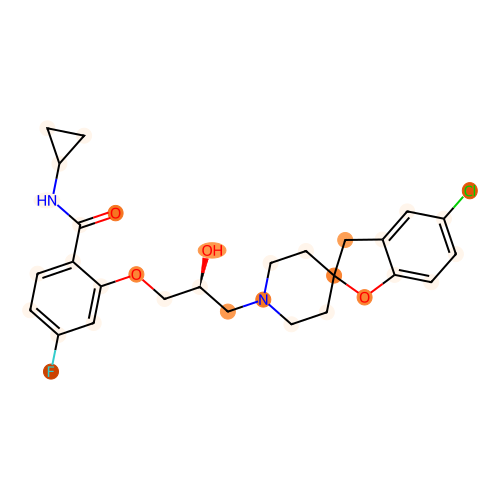

aromatic atom count: 21
prediction: [-1.7976189  1.6679386]
Cc1cc(-c2ccc3c(c2)CCN(CCCSc2nnc(-c4cccs4)n2C)CC3)no1


[16:37:59] The new font size 1 is below the current minimum (6).


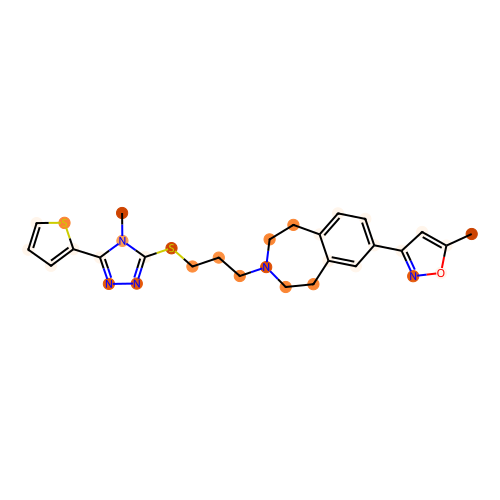

aromatic atom count: 24
prediction: [-0.41596955  0.5270066 ]
CCn1cc(C2(c3cccc(-c4cncnc4)c3)N=C(N)c3c(F)cccc32)cc(C)c1=O


[16:37:59] The new font size 1 is below the current minimum (6).


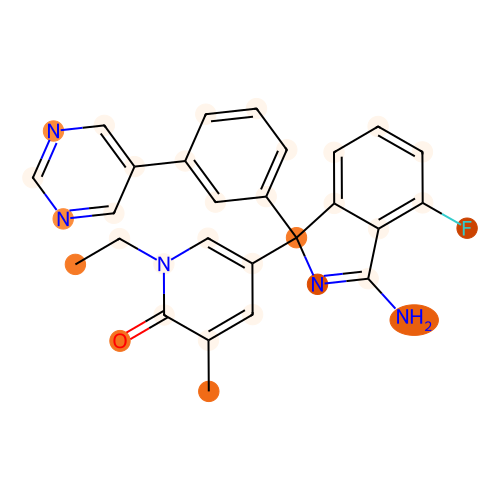

aromatic atom count: 6
prediction: [-1.2178407  1.1403948]
O=C(N[C@H]1CC[C@H]2CN(Cc3cccc(C(F)(F)F)c3)C[C@H]21)C(C1CCCCC1)C1CCCCC1


[16:37:59] The new font size 1 is below the current minimum (6).


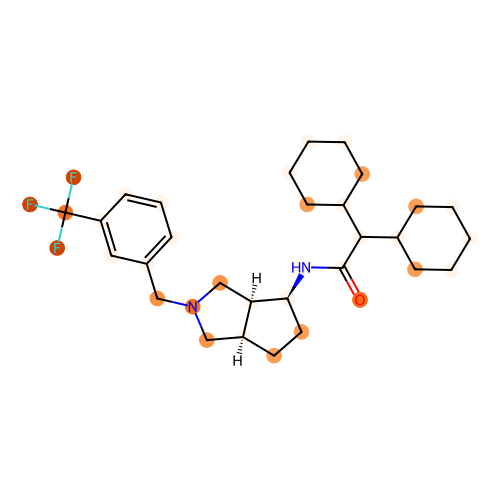

aromatic atom count: 18
prediction: [-1.9173664  1.830937 ]
Cc1cc(C(NC(=O)[C@@H]2CC[C@@H](N3CCOCC3)C[C@H]2c2ccc(Br)cc2)c2ccc(Cl)cc2)ccn1


[16:38:00] The new font size 1 is below the current minimum (6).


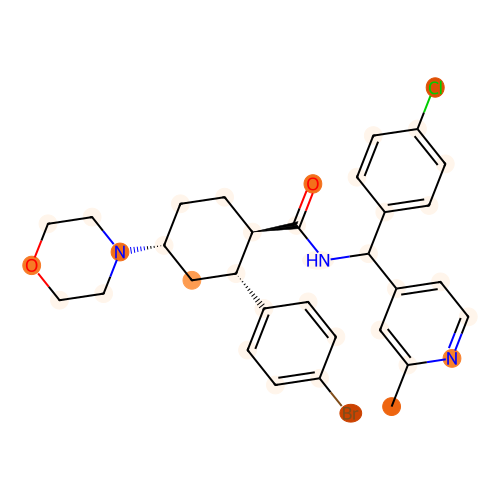

aromatic atom count: 18
prediction: [-0.9734503  1.0291975]
Cc1cccnc1C(=O)N1CCC(C)(N2CCC(N(c3ccccc3)c3cccnc3)CC2)CC1


[16:38:00] The new font size 1 is below the current minimum (6).


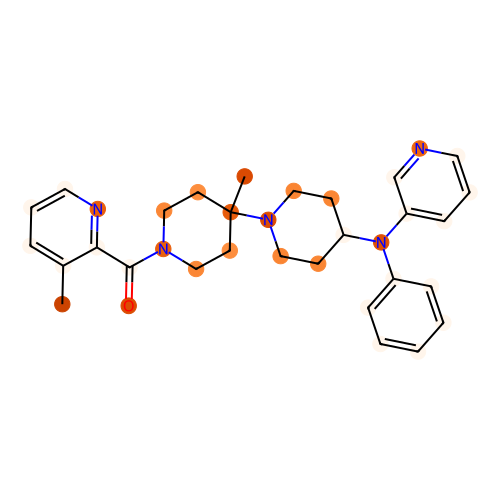

aromatic atom count: 17
prediction: [ 0.7699661 -0.5739342]
COc1cc(NC(=O)c2ccccc2F)ccc1-c1nnc(NCCCCN2CCCCC2)o1


[16:38:00] The new font size 1 is below the current minimum (6).


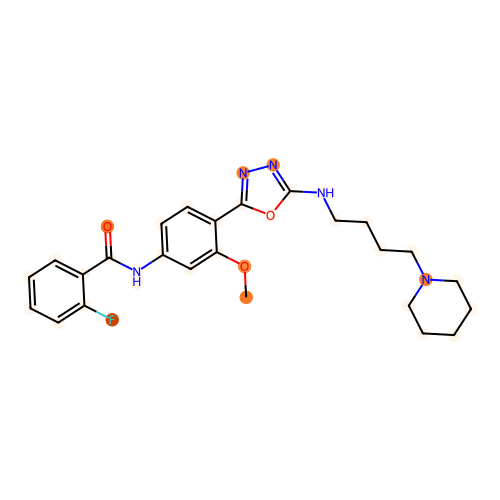

aromatic atom count: 21
prediction: [ 2.9289978 -2.2320604]
Cc1cccc([C@H]2CC[C@@H](CNC(=O)c3ccc(-c4nc5cc(C#N)cc(C(C)C)c5o4)cc3)CC2)c1


[16:38:00] The new font size 1 is below the current minimum (6).


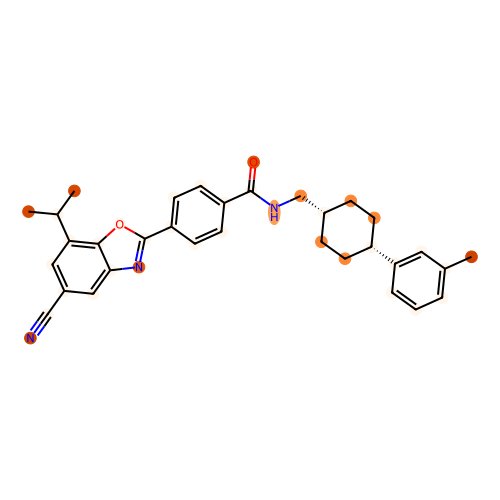

aromatic atom count: 16
prediction: [-1.0548978  1.1852651]
COc1ccc2nc(-c3ccc(OC4CCN(C5CCC5)CC4)cc3)n(C)c(=O)c2c1


[16:38:00] The new font size 1 is below the current minimum (6).


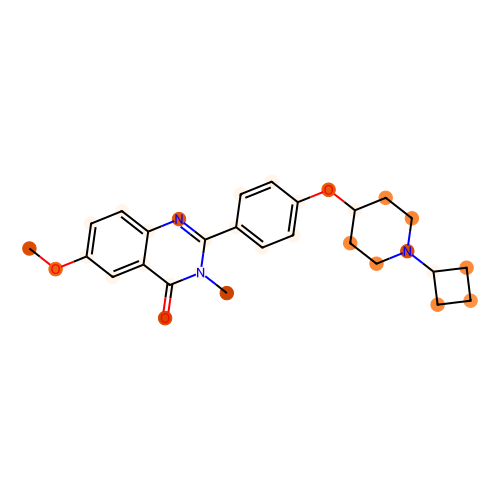

aromatic atom count: 21
prediction: [ 1.840732  -1.4583261]
COc1cc2c(Nc3ncc(CC(=O)Nc4cccc(F)c4)s3)ncnc2cc1OCCCN1CCC(CO)CC1


[16:38:00] The new font size 1 is below the current minimum (6).


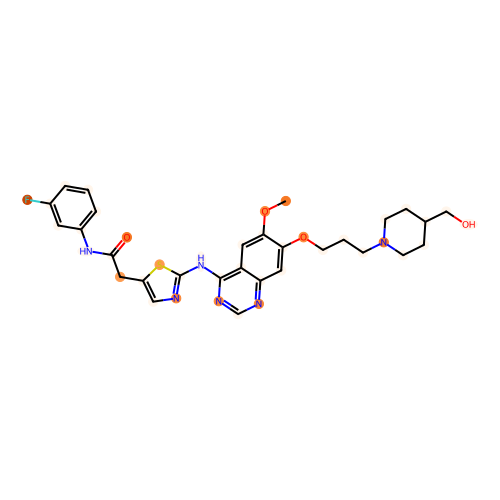

aromatic atom count: 18
prediction: [-1.8103851  1.7954626]
O=C(NC(c1ccncc1)c1ccc(F)cc1)[C@@H]1CC[C@@H](N2CCOCC2)C[C@H]1c1ccc(Br)cc1


[16:38:00] The new font size 1 is below the current minimum (6).


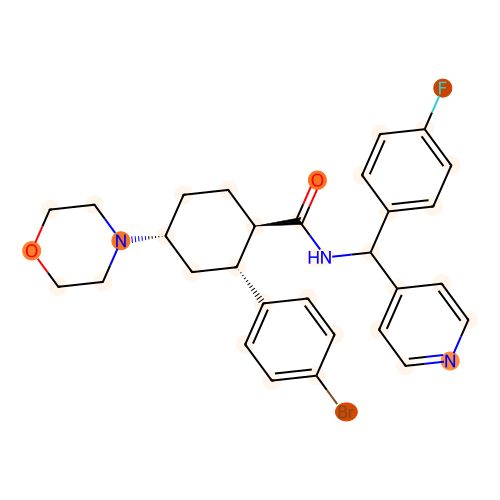

aromatic atom count: 18
prediction: [ 2.3600225 -1.6532172]
Cc1cc(CN2CCN(C(C)C)CC2)cnc1-c1ccc(C(=O)Nc2ccccc2N)cc1


[16:38:00] The new font size 1 is below the current minimum (6).


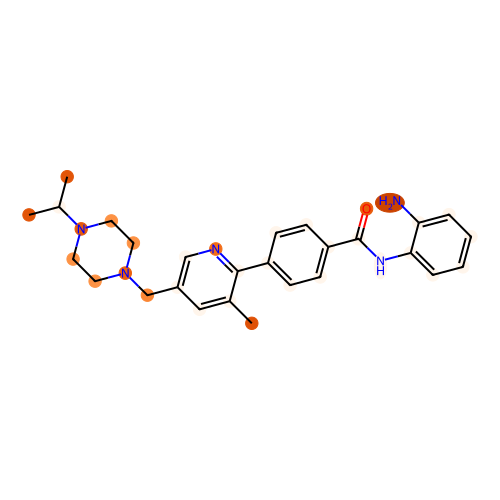

aromatic atom count: 24
prediction: [-1.7578261  1.6815526]
Cc1ccc2c(-c3nnc(SCCCN4CCc5c(Cl)cc6oc(C)nc6c5CC4)n3C)cccc2n1


[16:38:00] The new font size 1 is below the current minimum (6).


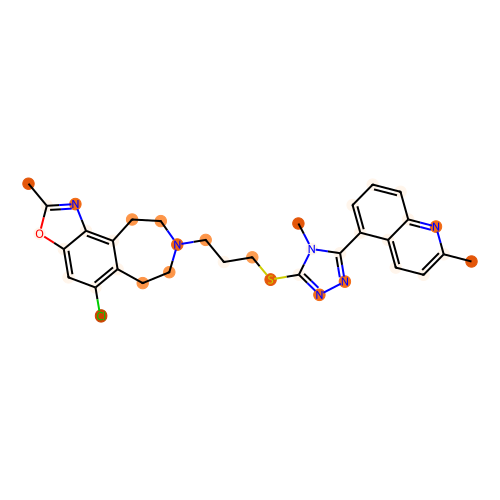

aromatic atom count: 17
prediction: [-1.1756732  1.185538 ]
Nc1nc2c(s1)CC[C@H]2C(=O)Nc1ccc(C[C@@H]2CC[C@H]([C@H](O)c3cccc(Cl)c3)N2)cc1


[16:38:00] The new font size 1 is below the current minimum (6).


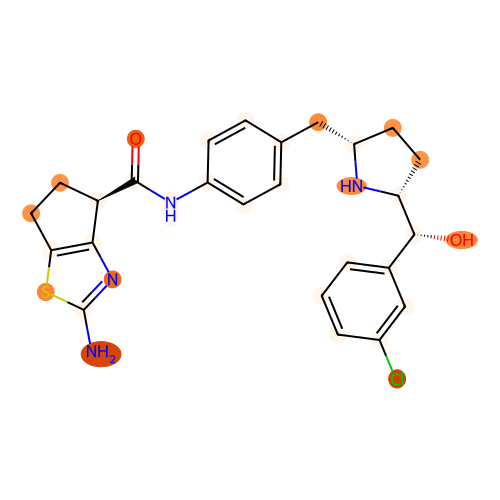

aromatic atom count: 11
prediction: [-1.5261282  1.449091 ]
CCN1C[C@H]2C[C@@H](N(Cc3cccc(OC(F)(F)F)c3)C(=O)c3cn(C)cn3)C[C@H]2C1


[16:38:00] The new font size 1 is below the current minimum (6).


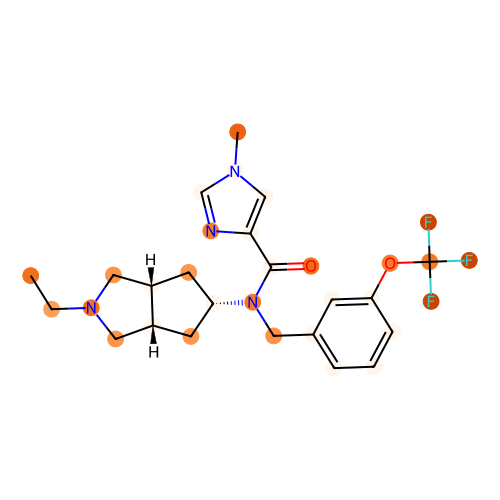

aromatic atom count: 21
prediction: [ 2.0899494 -1.4952537]
CC(C)c1cc(C#N)cc2nc(-c3ccc(C(=O)NC[C@H]4CC[C@@H](c5cc(C(F)(F)F)cc(C(F)(F)F)c5)CC4)cc3)oc12


[16:38:00] The new font size 1 is below the current minimum (6).


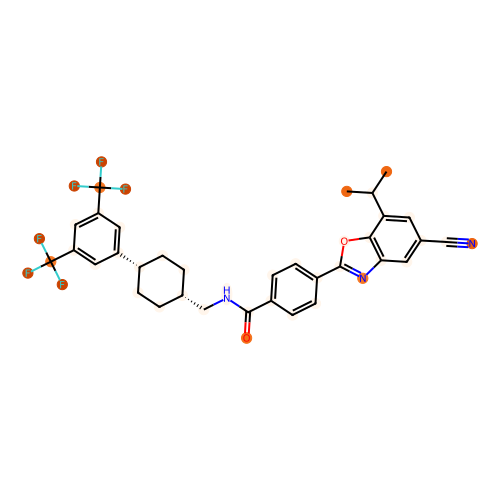

aromatic atom count: 15
prediction: [-0.61498934  0.69437927]
Fc1ccc(-n2cc(C3CC[NH+](CCN4CCNC4=S)CC3)c3cc(Cl)ccc32)cc1


[16:38:00] The new font size 1 is below the current minimum (6).


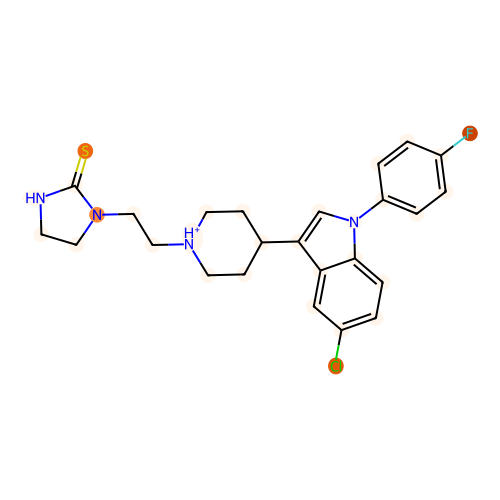

aromatic atom count: 12
prediction: [ 0.894271   -0.70406073]
Cc1cc(OC2CCN(CC3CCN([C@@](C)(Cc4ccc(F)cc4)C(=O)O)CC3)CC2)ccc1Cl


[16:38:00] The new font size 1 is below the current minimum (6).


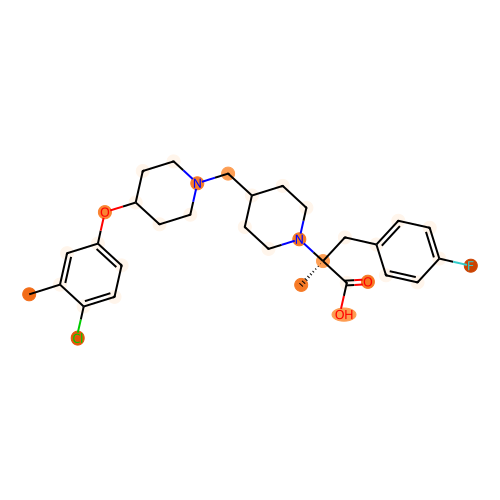

aromatic atom count: 17
prediction: [-1.0664415  1.1094964]
N#Cc1ccc2cc1Oc1ccc3c(c1)[C@@H](CCO3)N1CC[C@H](NCc3cncn3C2)C1=O


[16:38:00] The new font size 1 is below the current minimum (6).


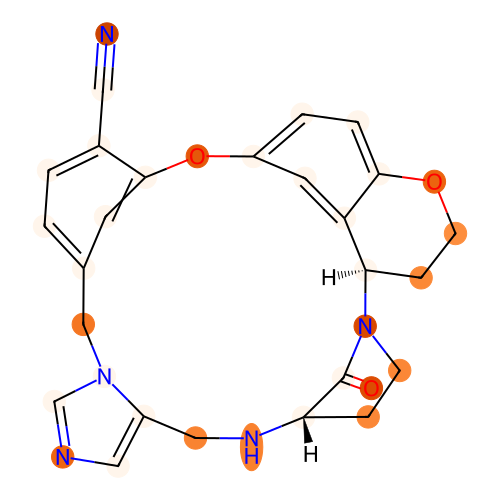

aromatic atom count: 6
prediction: [ 3.2156224 -2.5026689]
COC1COCCC1N[C@@H]1C[C@H]2C[C@@H](C(N)=O)C[C@@]2(C(=O)N2CCc3ncc(C(F)(F)F)cc3C2)C1


[16:38:00] The new font size 1 is below the current minimum (6).


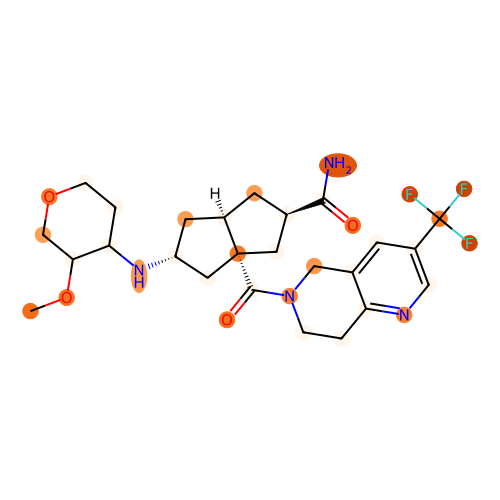

aromatic atom count: 17
prediction: [ 1.720721  -1.3160588]
C[C@@H]1CN(c2nc(C(F)(F)F)no2)CCN1c1ncc(OCc2ccc(C[S+](C)[O-])cc2F)cn1


[16:38:00] The new font size 1 is below the current minimum (6).


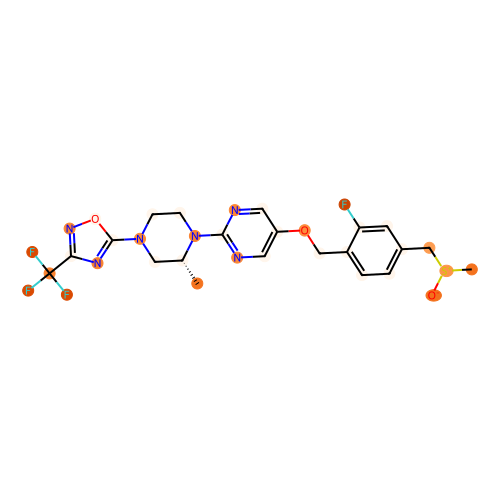

aromatic atom count: 16
prediction: [ 2.3306215 -1.8192029]
COc1ccc2ncc(=O)n(CCN3CC[C@H](NCc4ccc5c(n4)NC(=O)CO5)[C@@H](F)C3)c2c1


[16:38:00] The new font size 1 is below the current minimum (6).


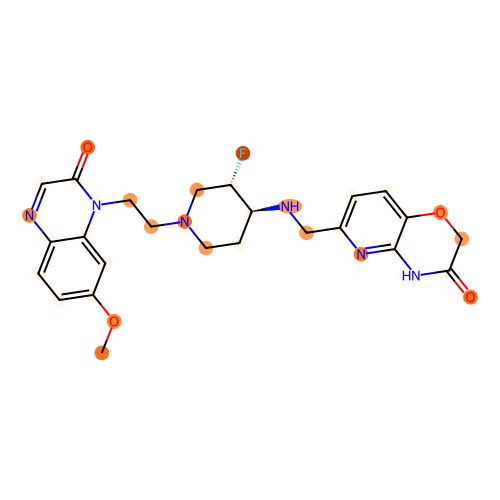

aromatic atom count: 21
prediction: [-0.27439526  0.34313136]
COc1cc(N2CCN(S(C)(=O)=O)CC2)ccc1Nc1ncc(Cl)c(-c2cnc3ccccn23)n1


[16:38:00] The new font size 1 is below the current minimum (6).


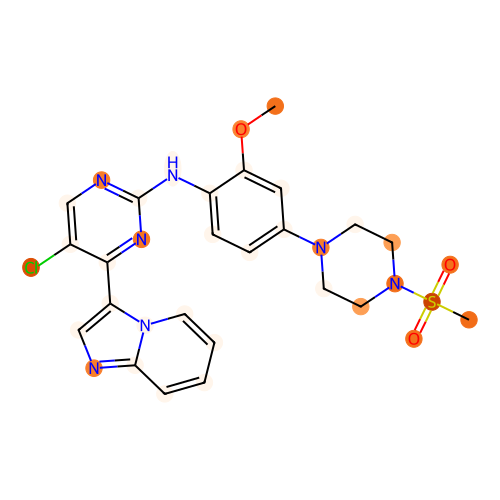

aromatic atom count: 12
prediction: [ 0.22189017 -0.24193677]
COc1cc2c(c(N3CCN(C)CC3)c1)O[C@@H](C(=O)Nc1ccc(N3CCOCC3)cc1)CC2


[16:38:00] The new font size 1 is below the current minimum (6).


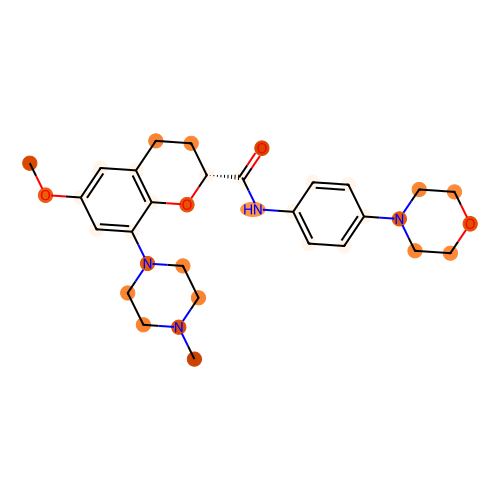

aromatic atom count: 12
prediction: [-1.3986367  1.3576403]
COc1cccc([C@@H](C)N[C@@H]2CC[C@@H](C(=O)N3CCC(C(=O)N4CCCC4)(c4ccccc4)CC3)C(C)(C)C2)c1


[16:38:00] The new font size 1 is below the current minimum (6).


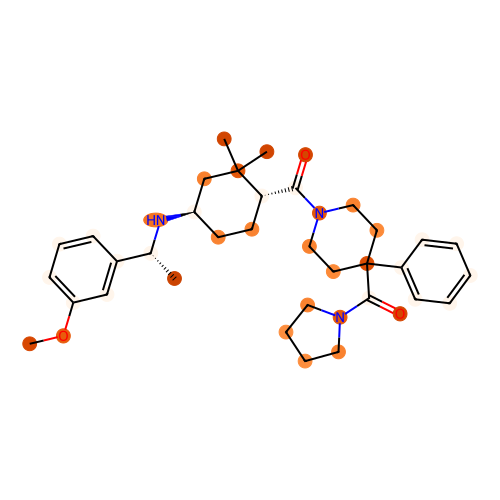

aromatic atom count: 17
prediction: [-1.3202782  1.3298987]
CO[C@H]1CN(Cc2ccc(C(F)(F)F)cc2)CC[C@H]1N(C)C(=O)Cc1ccc(-n2cnnn2)cc1


[16:38:00] The new font size 1 is below the current minimum (6).


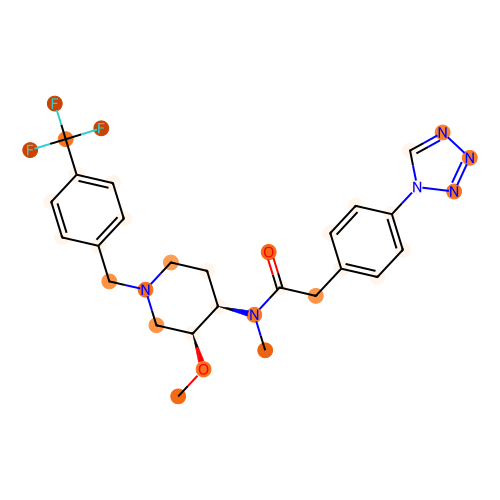

aromatic atom count: 21
prediction: [-0.32490793  0.36802274]
COc1ccc(-n2cc3nc(-c4ccccc4C)n(CC4CCCN(C(C)C)C4)c(=O)c3n2)cc1


[16:38:00] The new font size 1 is below the current minimum (6).


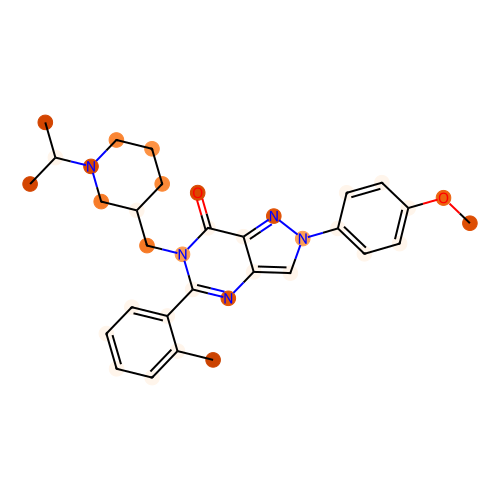

aromatic atom count: 12
prediction: [ 1.5355734 -1.1640215]
COc1ccc2c(c1)N(CCN1CCC(NCc3cc4c(cn3)OCCO4)CC1)C(=O)CO2


[16:38:00] The new font size 1 is below the current minimum (6).


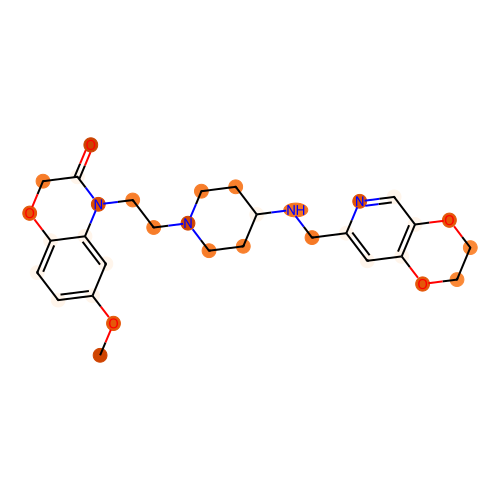

aromatic atom count: 18
prediction: [-0.8149139  0.8979387]
O=C(NCCc1ccccc1-c1ccc(CO)nc1)c1ccc(OCCC(F)(F)F)nc1


[16:38:00] The new font size 1 is below the current minimum (6).


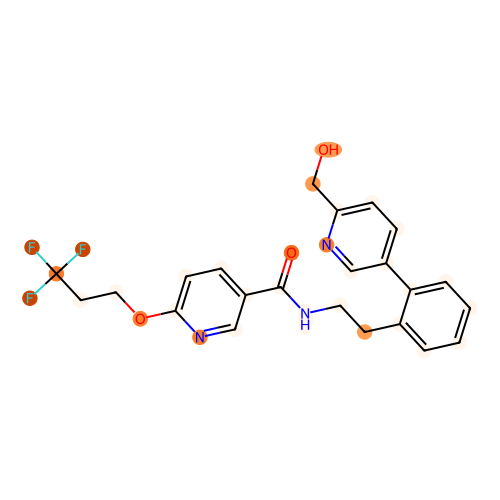

aromatic atom count: 16
prediction: [-0.84896    0.9361687]
Cn1c(=O)cnn(CCCCN2CCN(c3cccc4ccc(O[11CH3])cc34)CC2)c1=O


[16:38:00] The new font size 1 is below the current minimum (6).


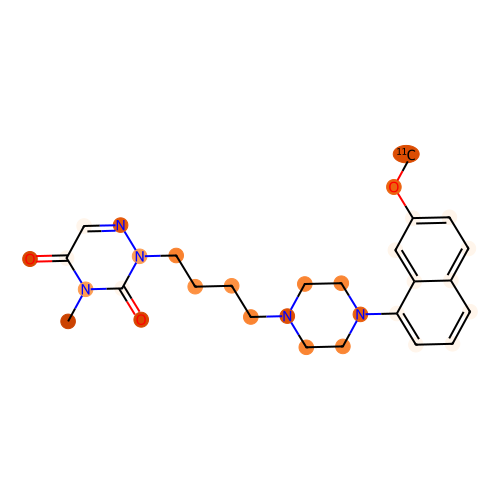

aromatic atom count: 24
prediction: [ 0.5164351 -0.3455807]
CC(C)(Cc1cccc(CC(=O)NCc2cccc(-c3ccc(O)cc3)c2)c1)NC[C@H](O)c1ccc(O)c(NS(C)(=O)=O)c1


[16:38:00] The new font size 1 is below the current minimum (6).


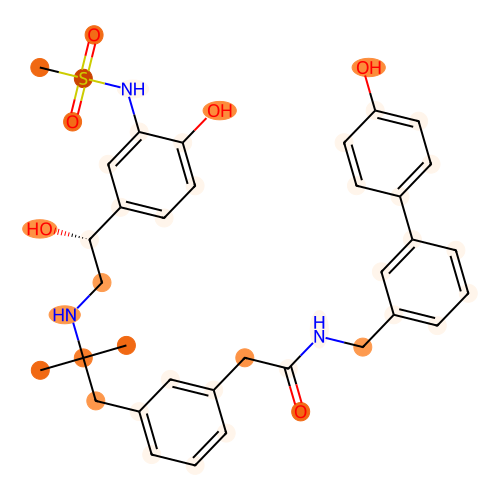

aromatic atom count: 18
prediction: [ 1.7658985 -1.2686125]
COC(C)(C)COc1ccc2c(c1)[C@]1(COC(N)=N1)c1cc(-c3cncnc3)ccc1O2


[16:38:00] The new font size 1 is below the current minimum (6).


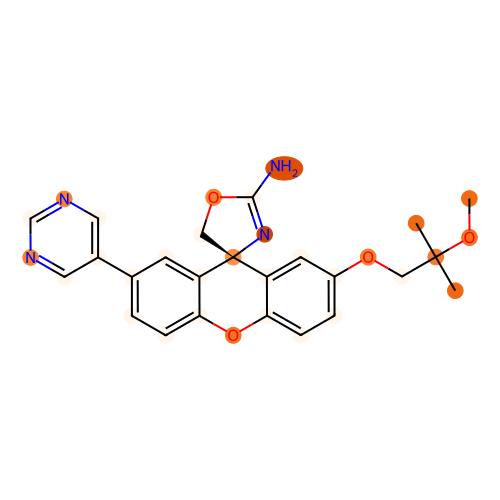

aromatic atom count: 12
prediction: [-1.4888808  1.4413662]
COC(=O)C1(CNC(=O)c2cc(Cl)cc(Cl)c2)CCN(Cc2ccc(C(F)(F)F)cc2)CC1


[16:38:00] The new font size 1 is below the current minimum (6).


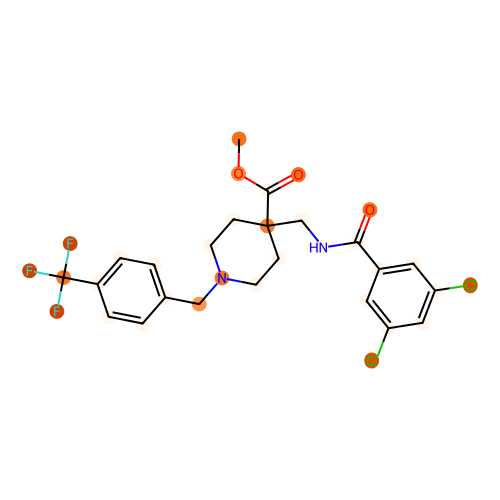

aromatic atom count: 16
prediction: [ 2.0360363 -1.6132784]
COc1ncc2ccc(=O)n(CCN3CCC(NCc4cc5c(cn4)OCCO5)CC3)c2n1


[16:38:00] The new font size 1 is below the current minimum (6).


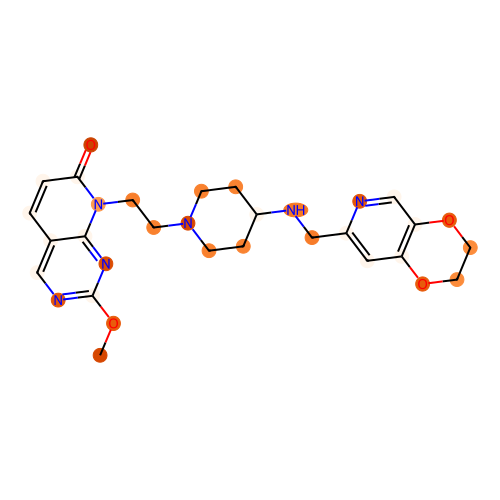

aromatic atom count: 21
prediction: [ 0.6016682  -0.41562098]
O=C(Nc1ccc(F)cn1)[C@H](CN1CC(O)C1)Oc1ncnc2c1cnn2-c1ccccc1Cl


[16:38:00] The new font size 1 is below the current minimum (6).


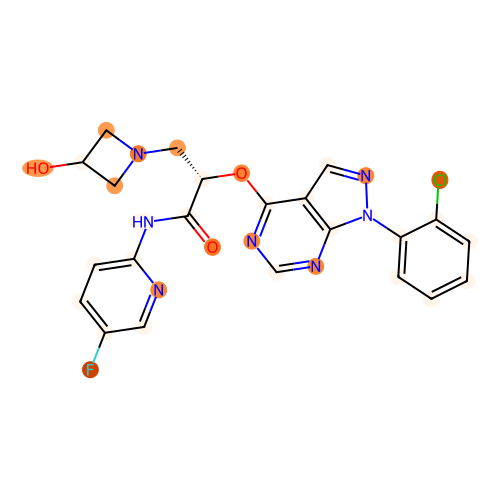

aromatic atom count: 12
prediction: [ 0.7404457 -0.5983561]
Cc1c([C@@H](O)CN2CCN(C[C@H](O)c3ccc(C#N)cn3)CC2)ccc2c1COC2=O


[16:38:00] The new font size 1 is below the current minimum (6).


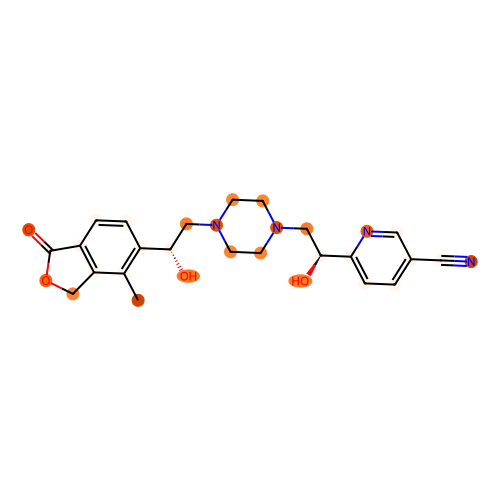

aromatic atom count: 12
prediction: [ 2.8028133 -2.0846596]
O=C(Nc1ccc(C(F)(F)F)cc1)NS(=O)(=O)c1ccc(OCCN2CCCCC2)cc1


[16:38:00] The new font size 1 is below the current minimum (6).


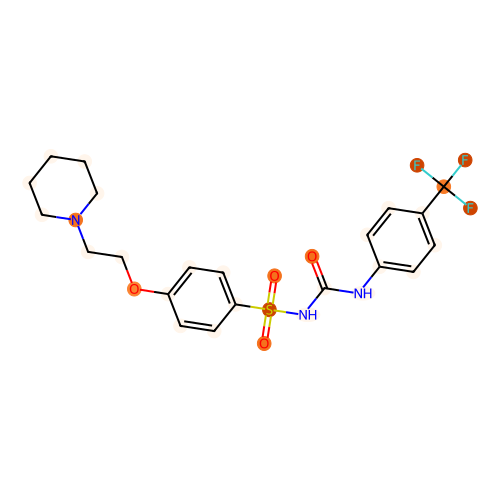

aromatic atom count: 24
prediction: [-1.1570047  1.0409201]
CC1(C)C2=C3C=C4C5=[N+](CCC4OC3CCN2c2ccc(CCC(=O)NCCCCCCN(CCOc3ccc(NS(C)(=O)=O)cc3)CCc3ccc(NS(C)(=O)=O)cc3)cc21)c1ccc(S(=O)(=O)[O-])cc1C5(C)C


[16:38:00] The new font size 1 is below the current minimum (6).


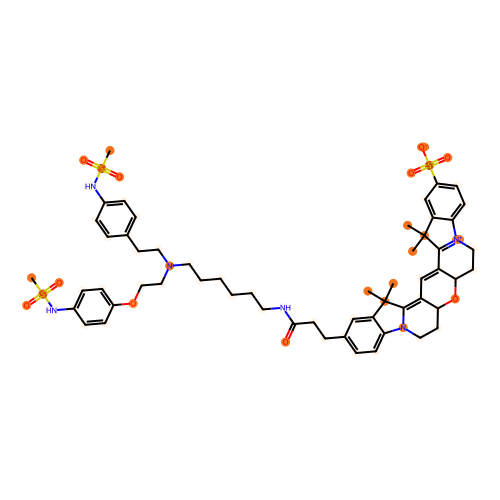

aromatic atom count: 17
prediction: [ 1.4679924 -1.1348273]
Cc1ncccc1C(=O)N1CCC([NH2+]Cc2cncn2Cc2ccc(C#N)cc2)C1=O


[16:38:00] The new font size 1 is below the current minimum (6).


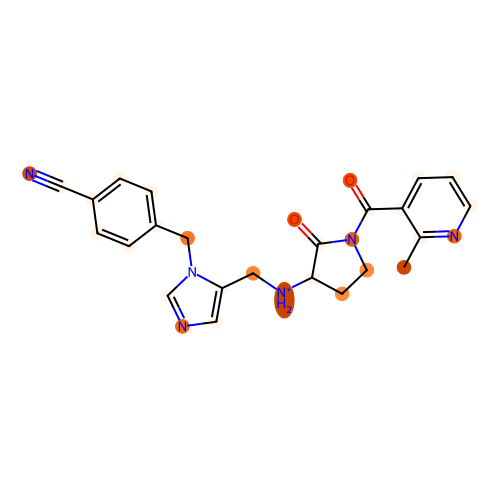

aromatic atom count: 11
prediction: [ 1.8248452 -1.3758414]
O=C(CC1CCN(Cc2ccn(-c3ccc(C(F)(F)F)cc3)c2)CC1)N1CCOC(C(=O)N2CCCC2)C1


[16:38:00] The new font size 1 is below the current minimum (6).


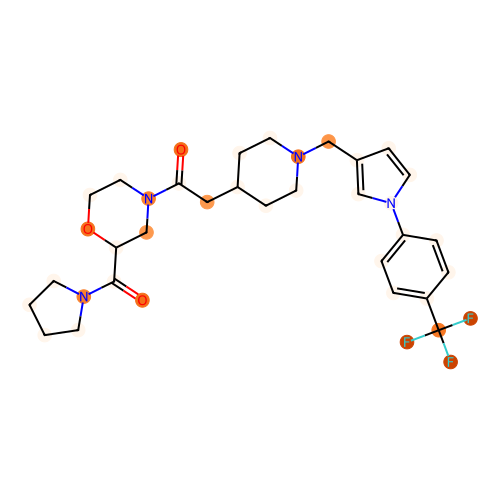

aromatic atom count: 18
prediction: [ 0.8741505  -0.64338946]
COc1cnc(-c2cccc3c2C[C@H](NC(=O)c2ccc(OCC(F)(F)F)nc2)CO3)cn1


[16:38:00] The new font size 1 is below the current minimum (6).


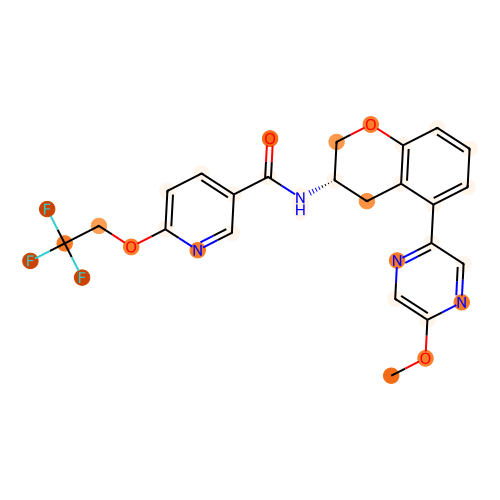

aromatic atom count: 15
prediction: [ 2.1046762 -1.64683  ]
O=C(CNc1nccc2ccc(C(F)(F)F)cc12)NC1CN([C@H]2CC[C@@](O)(c3cncs3)CC2)C1


[16:38:00] The new font size 1 is below the current minimum (6).


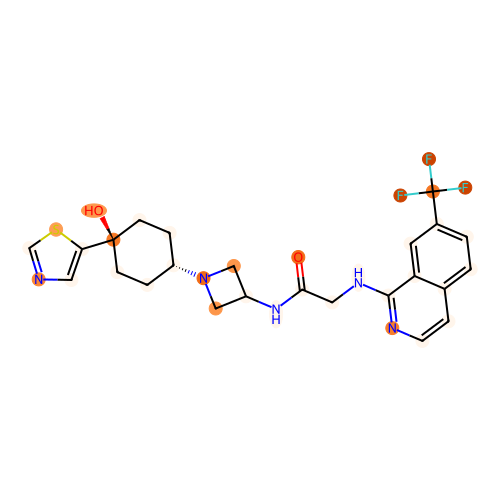

aromatic atom count: 18
prediction: [-1.3232882  1.3064055]
O=S(=O)(NCC1CC2(c3ccc(F)cc3)NC1CCC2NCc1cc(OC(F)(F)F)ccc1OC1CC1)c1ccccc1


[16:38:00] The new font size 1 is below the current minimum (6).


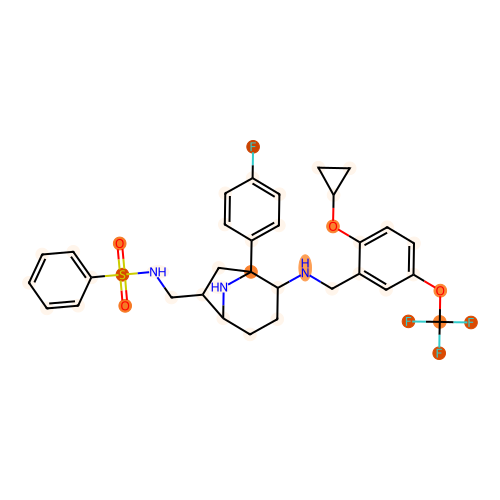

aromatic atom count: 12
prediction: [ 2.8650534 -2.1685653]
O=C(c1ccc(C(=O)N2CCN(c3ccc(OCCCN4CCCCC4)cc3)C(=O)C2)cc1)N1CCC1


[16:38:00] The new font size 1 is below the current minimum (6).


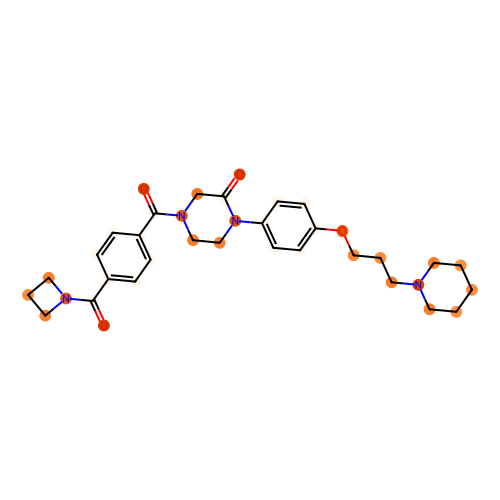

aromatic atom count: 16
prediction: [ 0.9134765  -0.77187496]
O=C([C@H]1CNCC[C@@]12OCc1cc(F)c(F)cc12)N(Cc1cccc2cccnc12)C1CC1


[16:38:00] The new font size 1 is below the current minimum (6).


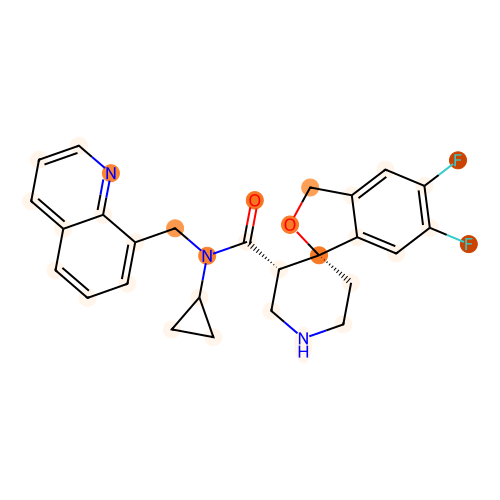

aromatic atom count: 18
prediction: [-0.5513362  0.6097547]
Nc1ccc(-c2ccc(F)cc2)cc1NC(=O)c1ccc(N2CCC3(CC2)CNC(=O)O3)nc1


[16:38:00] The new font size 1 is below the current minimum (6).


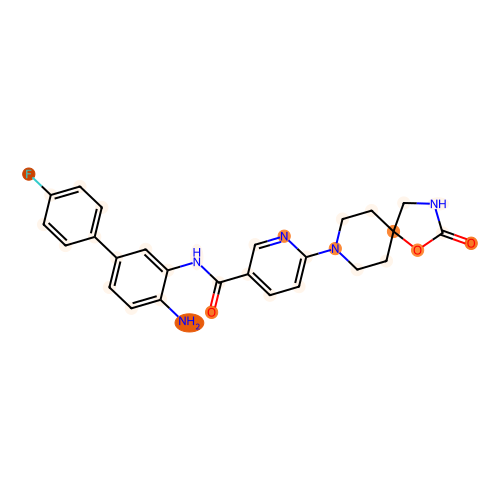

aromatic atom count: 20
prediction: [ 1.0004553  -0.70751005]
Cn1nccc1CCOc1ccc(C2CCN(c3ccc4nnc(C(F)(F)F)n4n3)CC2)cc1


[16:38:00] The new font size 1 is below the current minimum (6).


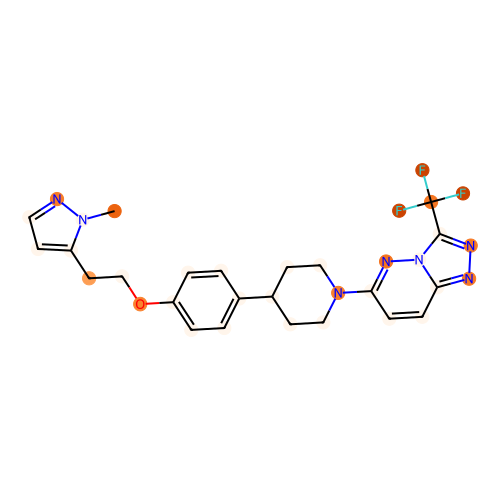

aromatic atom count: 17
prediction: [-1.2943437  1.3139753]
O=C(NC1CCN(Cc2ccn(-c3ccc(C(F)(F)F)cc3)c2)CC1)N1CCCC1c1ccc(F)cc1


[16:38:00] The new font size 1 is below the current minimum (6).


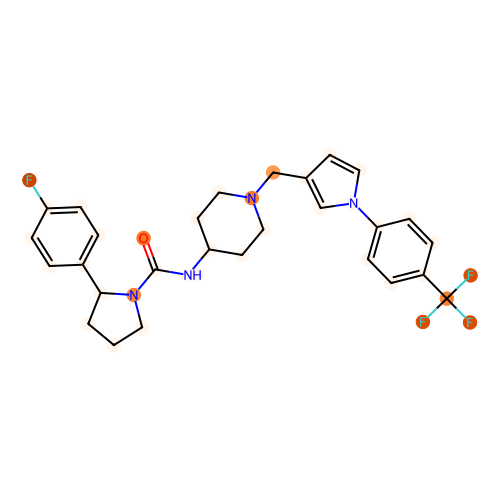

aromatic atom count: 18
prediction: [ 0.8949403  -0.69660306]
COc1ncc(-c2cccc3c2C[C@H](NC(=O)c2ccc(COCC(F)(F)F)nc2)CO3)cn1


[16:38:00] The new font size 1 is below the current minimum (6).


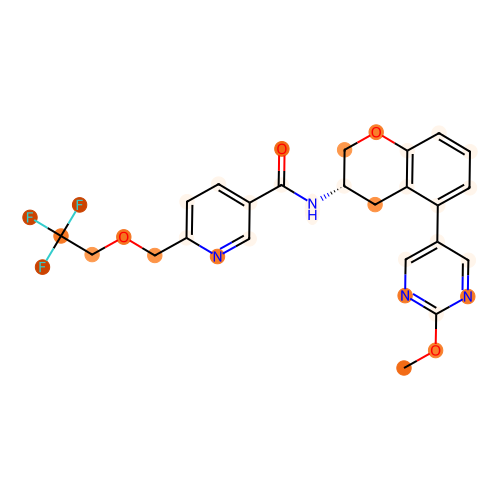

aromatic atom count: 6
prediction: [ 0.9752709  -0.71181977]
CN(C)C(=O)N[C@H]1CC[C@H](CN2[C@@H]3CC[C@H]2C[C@@H](Oc2cccc(C(N)=O)c2)C3)CC1


[16:38:00] The new font size 1 is below the current minimum (6).


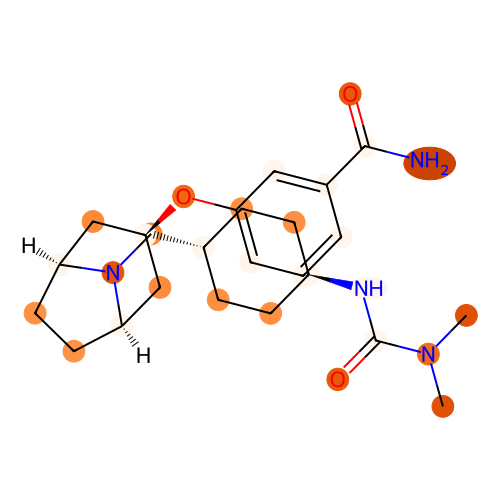

aromatic atom count: 12
prediction: [-1.3932536  1.3582292]
COc1ccc([C@H]2CN(CCCN(C)S(C)(=O)=O)C[C@@H]2CC(=O)Nc2cccc(Cl)c2)cc1


[16:38:00] The new font size 1 is below the current minimum (6).


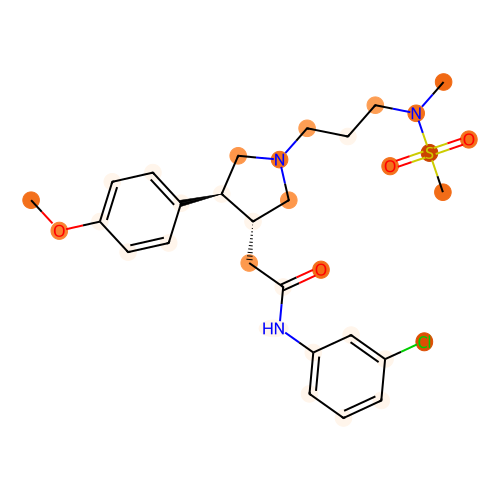

aromatic atom count: 18
prediction: [ 0.38741723 -0.23918638]
O=C(NCc1ccc(OCC(F)(F)F)nc1)C1c2ccccc2C(=O)N1CCc1ccccn1


[16:38:00] The new font size 1 is below the current minimum (6).


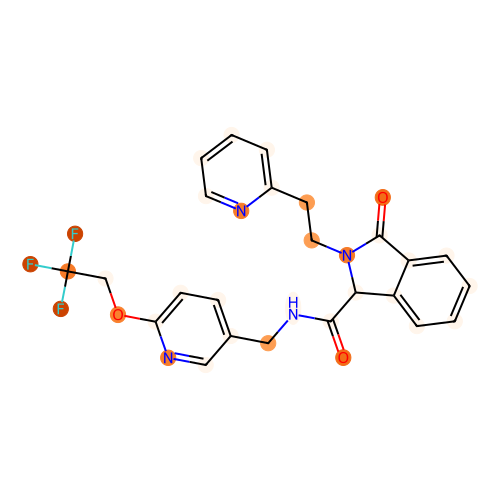

aromatic atom count: 6
prediction: [ 0.78816956 -0.58128166]
CCCS(=O)(=O)N1CCN(C2(CNC(=O)c3c(F)cccc3F)CCC(F)(F)CC2)CC1


[16:38:00] The new font size 1 is below the current minimum (6).


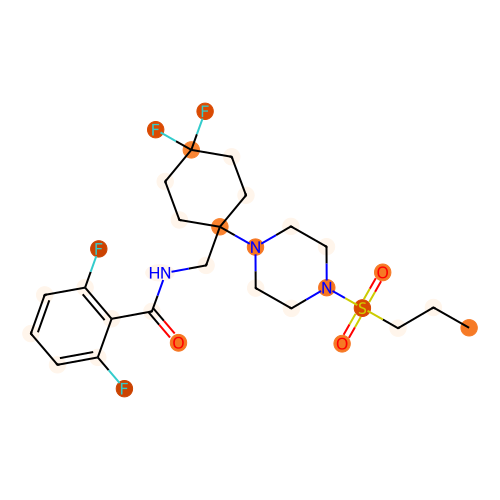

aromatic atom count: 15
prediction: [ 0.6855327  -0.52527547]
CCCc1nc(C)c2c(=O)nc(-c3cc([S+2]([O-])([O-])N4CC[NH+](CC)CC4)ccc3OCC)[nH]n12


[16:38:00] The new font size 1 is below the current minimum (6).


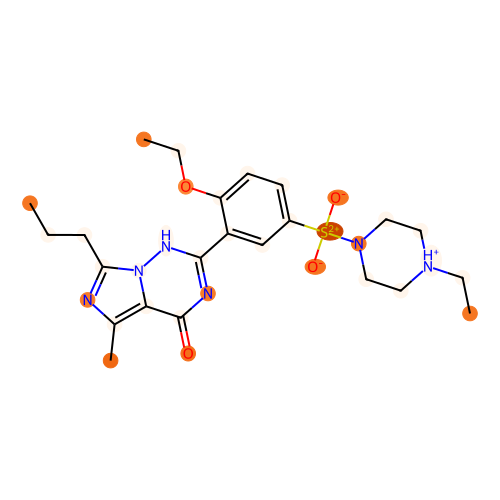

aromatic atom count: 16
prediction: [-1.6664885  1.5665464]
Cc1ncoc1-c1nnc(SCCCN2[C@@H]3CC[C@H]2C[C@@H](c2ccc(C(F)(F)F)cc2)C3)n1C


[16:38:00] The new font size 1 is below the current minimum (6).


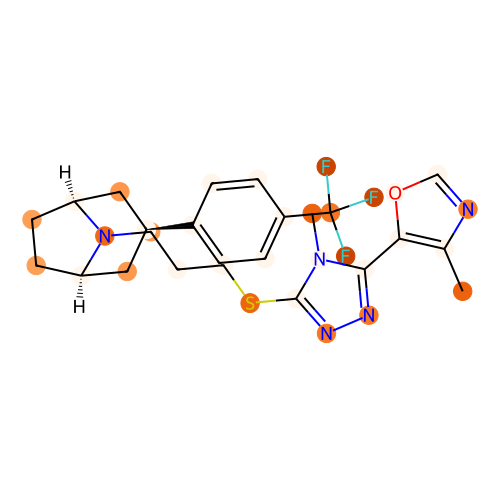

aromatic atom count: 18
prediction: [ 2.2391858 -1.5462013]
CN1Cc2ccccc2[C@@H](c2ccccc2)N=C1OCc1ccc(NS(C)(=O)=O)cc1


[16:38:00] The new font size 1 is below the current minimum (6).


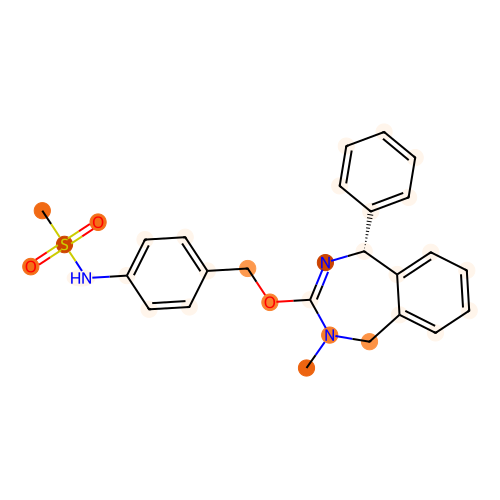

aromatic atom count: 24
prediction: [ 0.60553855 -0.41936564]
COc1cc(N2C(=O)N(c3ccc(-c4ccc(C(=O)O)cc4C)nc3)C(=O)C23CCN(Cc2ncccc2C)CC3)ncn1


[16:38:00] The new font size 1 is below the current minimum (6).


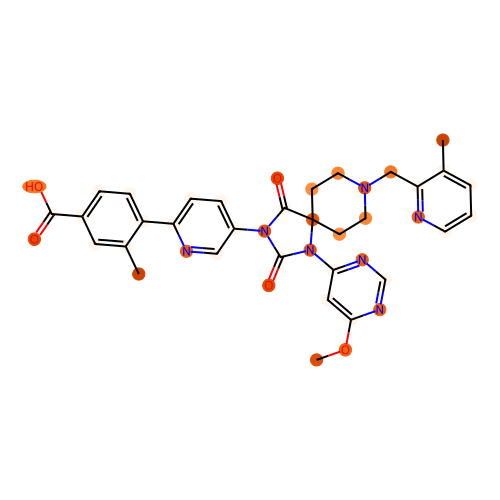

aromatic atom count: 6
prediction: [ 2.8441164 -2.2986453]
COC1COCCC1N[C@@H]1C[C@H]2CN(C(=O)OCCN3CCCC3)C[C@@]2(C(=O)N2CCc3ncc(C(F)(F)F)cc3C2)C1


[16:38:00] The new font size 1 is below the current minimum (6).


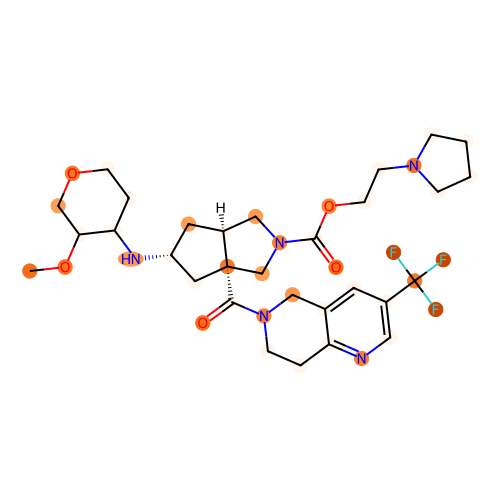

aromatic atom count: 19
prediction: [-0.37138984  0.34788463]
CC(C)=CCn1c(N2CCCNCC2)c(C#N)c2c1c(=O)n(Cc1ncc3ccccc3c1C#N)c(=O)n2C


[16:38:00] The new font size 1 is below the current minimum (6).


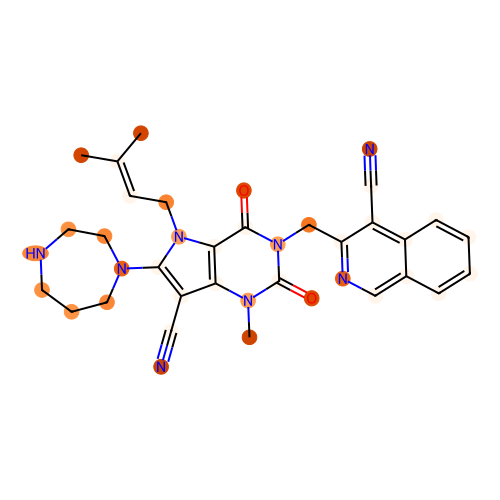

aromatic atom count: 12
prediction: [-0.8615462  0.893291 ]
CC(=O)N1CCC(N(C)C(=O)N2CC(c3cc(F)ccc3F)=C[C@H]2c2ccccc2)CC1


[16:38:00] The new font size 1 is below the current minimum (6).


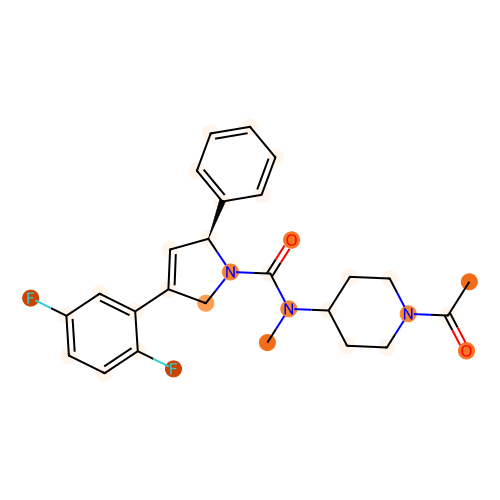

aromatic atom count: 16
prediction: [-2.0133383  1.7997779]
CCCCCn1c(=O)nc(NC2CCN(Cc3ccc4c(c3)OCO4)CC2)c2cc(Cl)ccc21


[16:38:00] The new font size 1 is below the current minimum (6).


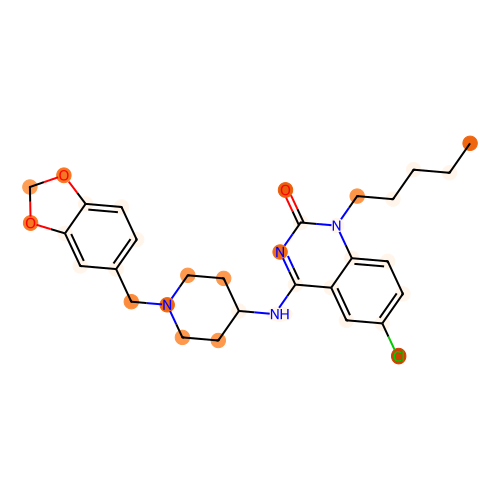

aromatic atom count: 18
prediction: [-0.51900667  0.5801006 ]
Cc1cc(Nc2ncc(Cl)c(Nc3ccccc3S(=O)(=O)C(C)C)n2)c(OC(C)C)cc1C1CCN(CCO)CC1


[16:38:01] The new font size 1 is below the current minimum (6).


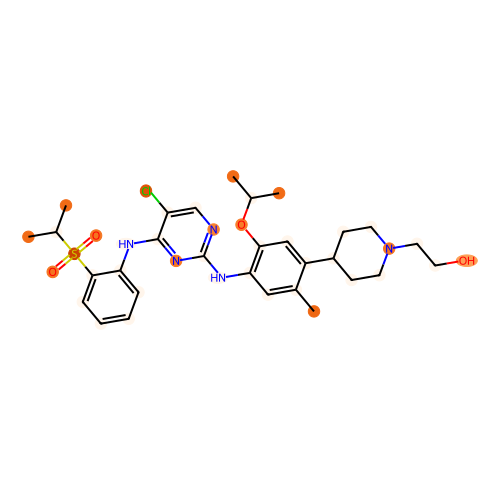

aromatic atom count: 16
prediction: [-0.7600759  0.8408109]
COc1ccc2ncc(OC)c(CCC34CCC(NCc5ccc6c(n5)NC(=O)CO6)(CC3)CO4)c2n1


[16:38:01] The new font size 1 is below the current minimum (6).


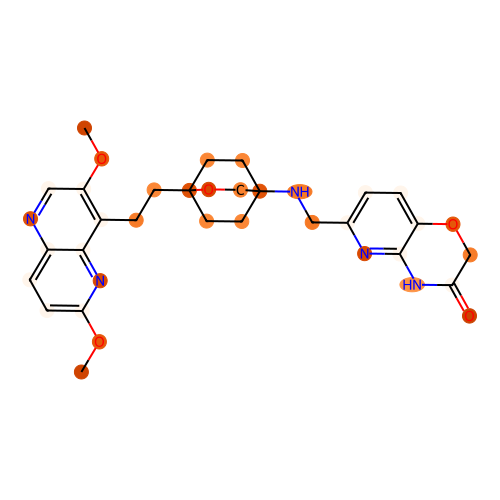

aromatic atom count: 9
prediction: [ 1.3284373 -1.1356369]
CCCS(=O)(=O)n1c2c(c3cc(C(=O)N4CCC(C)CC4)ccc31)CN(C1CCOCC1)CC2


[16:38:01] The new font size 1 is below the current minimum (6).


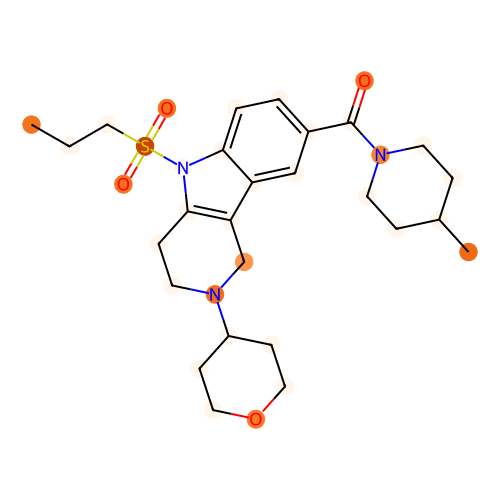

aromatic atom count: 21
prediction: [ 2.082906  -1.4575167]
CCOc1ccc(-n2ncc(-c3ccc4cc(CCN5CCC[C@H]5C)ccc4n3)c2C)nn1


[16:38:01] The new font size 1 is below the current minimum (6).


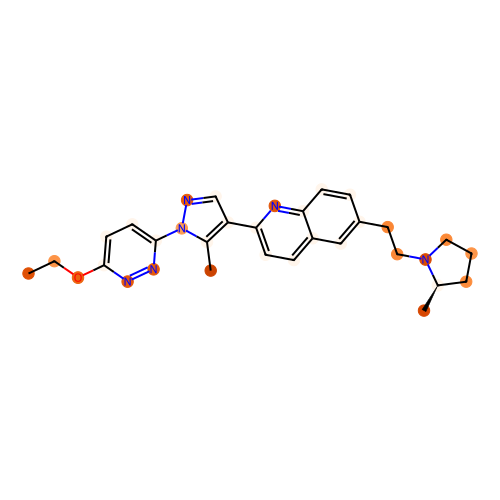

aromatic atom count: 12
prediction: [-0.8007557  0.7504896]
O=C([C@H]1CNCC[C@@]12OCc1cc(F)c(F)cc12)N(Cc1cc(Cl)ccc1Cl)C1CC1


[16:38:01] The new font size 1 is below the current minimum (6).


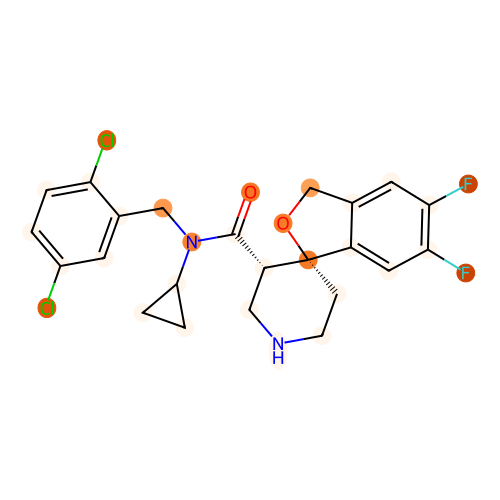

aromatic atom count: 18
prediction: [-0.48197734  0.51737696]
CCOC(=O)Nc1ccccc1[C@@H](c1ccc(C(=O)N(CC)CC)cc1)N1CCN(Cc2ccccn2)CC1


[16:38:01] The new font size 1 is below the current minimum (6).


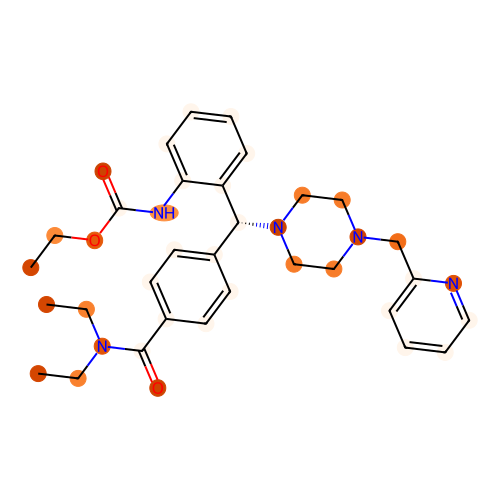

aromatic atom count: 18
prediction: [-1.0673778  1.0398822]
NC1=N[C@@]2(CO1)c1cc(-c3cccnc3F)ccc1Oc1cnc(N3CCC(F)(F)CC3)cc12


[16:38:01] The new font size 1 is below the current minimum (6).


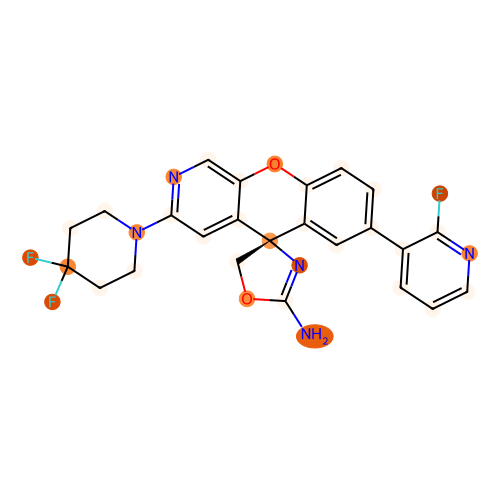

aromatic atom count: 25
prediction: [-0.8512457   0.94291127]
Cn1c(=O)n(Cc2nccc3ccccc23)c(=O)c2c1c(C#N)c(N1CCC[C@H](N)C1)n2Cc1ccccc1


[16:38:01] The new font size 1 is below the current minimum (6).


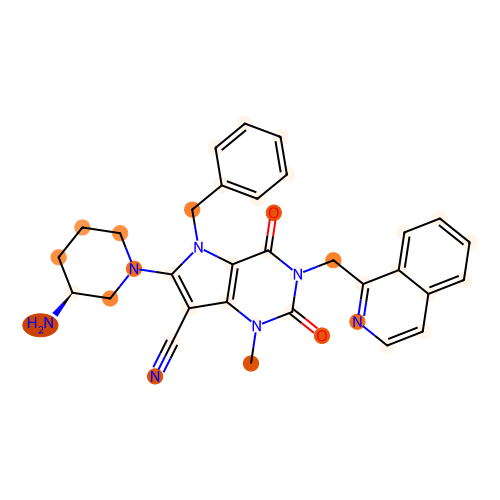

aromatic atom count: 18
prediction: [-1.5630419  1.5354519]
COc1cc(CNCC2CCN(CCCCCC(c3ccc(F)cc3)c3ccc(F)cc3)C2)cc(OC)c1OC


[16:38:01] The new font size 1 is below the current minimum (6).


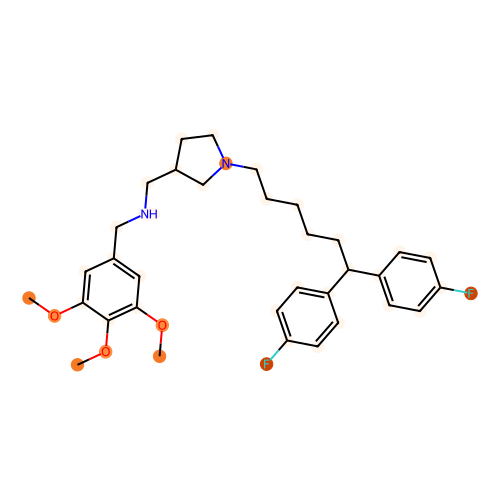

aromatic atom count: 15
prediction: [-0.35321775  0.45124114]
CC(C)n1nc(C(=O)NCC2CCN(CCc3ccc(N)cc3)CC2)c2ccccc21


[16:38:01] The new font size 1 is below the current minimum (6).


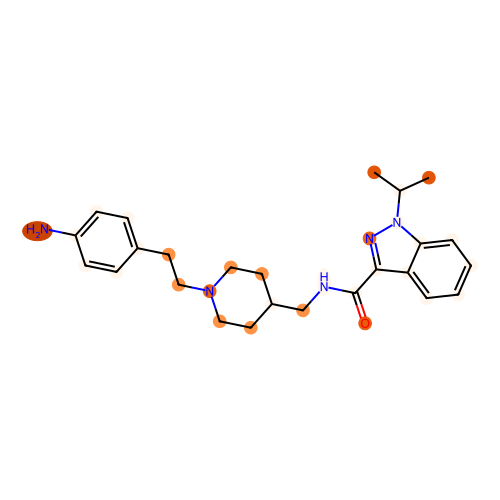

aromatic atom count: 18
prediction: [ 0.82576513 -0.73084253]
N#Cc1ccnc(N2CCC(C(=O)N3CC[C@H](N[C@H]4CC[C@@](O)(c5ccc(-c6ncccn6)cn5)CC4)C3)CC2)c1


[16:38:01] The new font size 1 is below the current minimum (6).


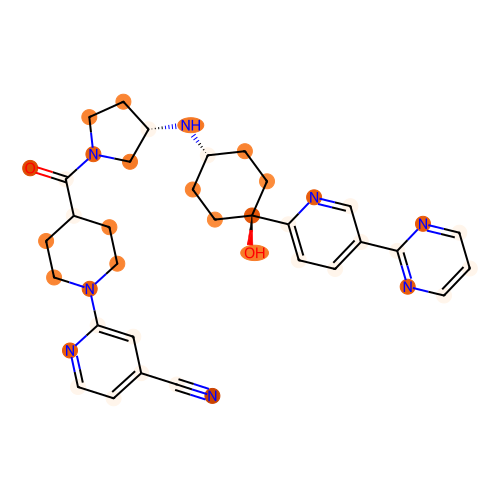

aromatic atom count: 17
prediction: [-0.47727817  0.5606235 ]
O=C1OCc2cc(CCN3CCN(C(=O)Cc4ccc(-n5cnnn5)cc4C4CC4)CC3)ccc21


[16:38:01] The new font size 1 is below the current minimum (6).


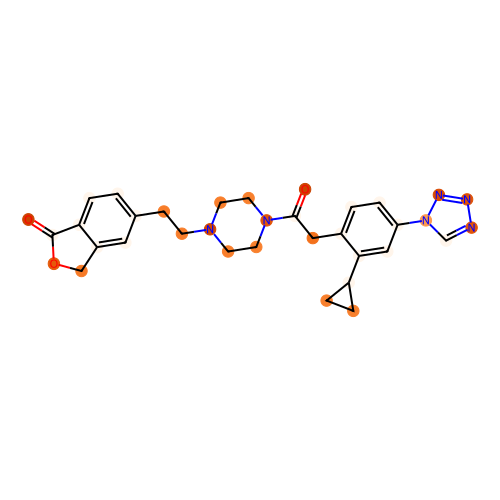

aromatic atom count: 12
prediction: [ 1.8635007 -1.5133278]
N#Cc1ccc(C(=O)N2CCN(c3ccc(OC4CCN(C5CCC5)CC4)cc3)C(=O)C2)cc1


[16:38:01] The new font size 1 is below the current minimum (6).


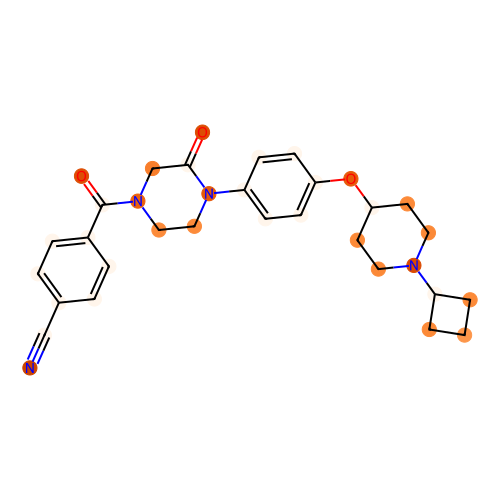

aromatic atom count: 12
prediction: [ 0.25702426 -0.24793684]
COCCCc1cc(CN(C(=O)[C@H]2CNCC[C@]2(O)c2ccccc2)C2CC2)cc(OCCOC)c1


[16:38:01] The new font size 1 is below the current minimum (6).


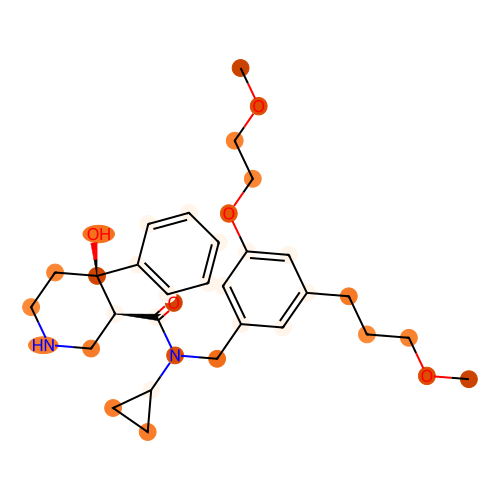

aromatic atom count: 17
prediction: [-1.0227611  1.1146046]
N#Cc1ccc2cc1Oc1ccc3c(c1)[C@@H](CC3)N1CC[C@H](NCc3cncn3C2)C1=O


[16:38:01] The new font size 1 is below the current minimum (6).


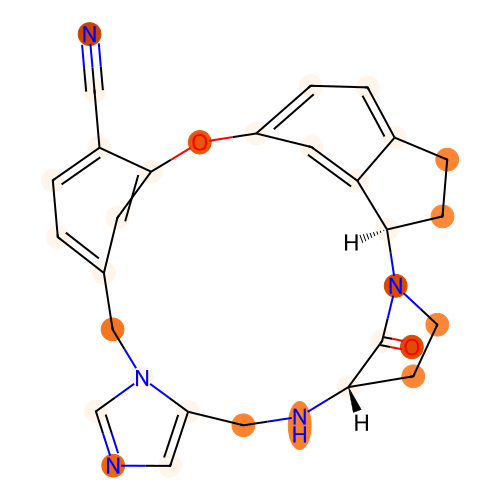

aromatic atom count: 17
prediction: [ 0.33342648 -0.26432425]
CC(=O)NCCc1ccccc1-c1noc([C@H]2CNCC[C@]2(O)c2ccc(F)c(F)c2)c1Br


[16:38:01] The new font size 1 is below the current minimum (6).


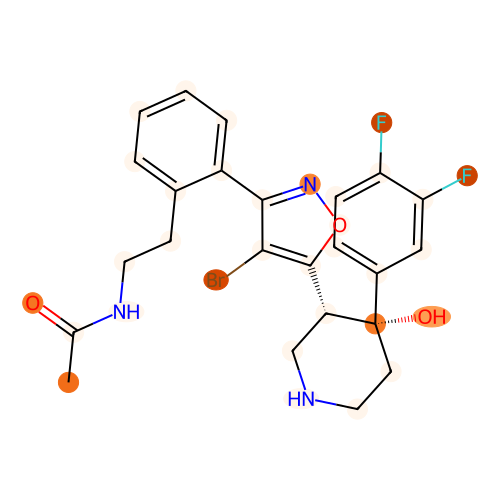

aromatic atom count: 21
prediction: [-1.523632   1.4770699]
O=c1cc(OCc2ccccc2)ccn1-c1ccc2c(cnn2CCN2CCCC2)c1


[16:38:01] The new font size 1 is below the current minimum (6).


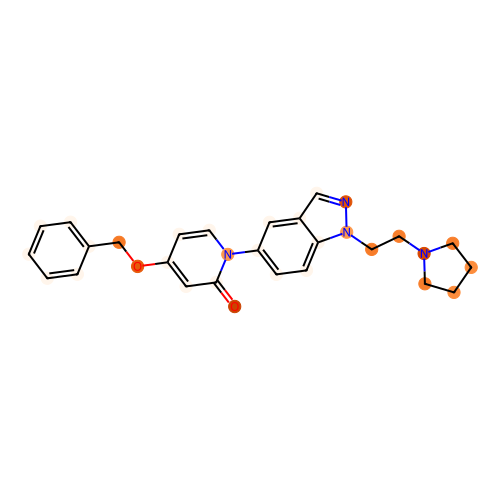

aromatic atom count: 18
prediction: [0.13211888 0.00815589]
Nc1ccc(-c2cccc(F)c2)cc1NC(=O)c1ccc(CN2CCC3(CCCN3)CC2)cc1


[16:38:01] The new font size 1 is below the current minimum (6).


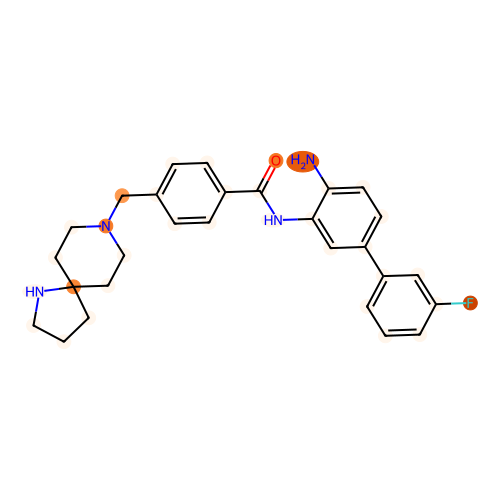

aromatic atom count: 12
prediction: [ 0.05915697 -0.04026177]
CC(=O)N[C@H]1CCN(C(=O)c2ccc(O)cc2OC[C@@H](O)CN2CCC3(CC2)Cc2cc(Cl)ccc2O3)C1


[16:38:01] The new font size 1 is below the current minimum (6).


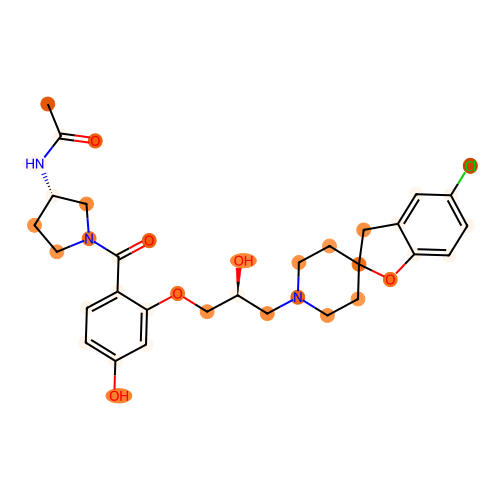

aromatic atom count: 9
prediction: [ 1.9541438 -1.4976002]
Cc1cc2cc(NC(=N[C@H]3CCCCN(CC(=O)N4CCCC4)C3=O)NC#N)ccc2o1


[16:38:01] The new font size 1 is below the current minimum (6).


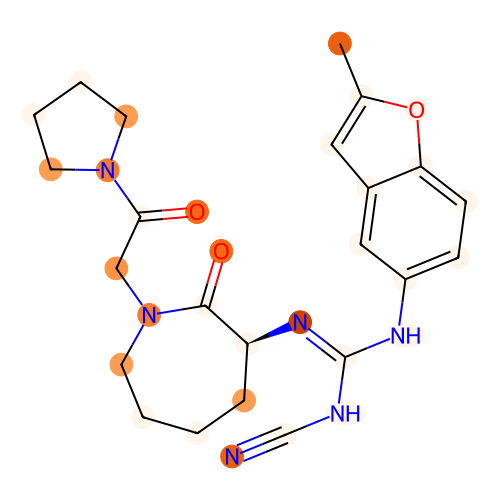

aromatic atom count: 17
prediction: [-1.7455077  1.7626337]
N#Cc1ccc(Cn2cncc2CN(CCN2CCNCC2)[C@H]2CCN(Cc3ccccc3)C2=O)cc1


[16:38:01] The new font size 1 is below the current minimum (6).


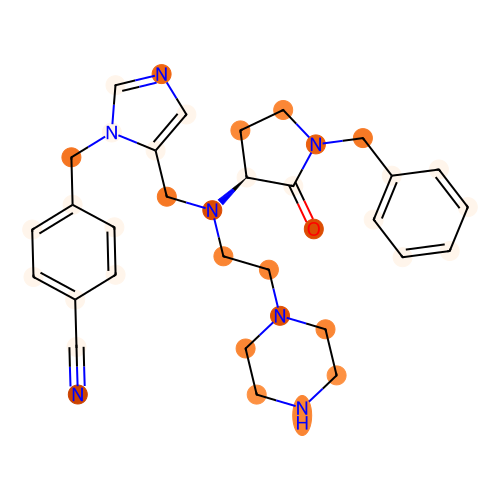

aromatic atom count: 18
prediction: [ 1.0226194  -0.68386906]
O=C(Nc1cccc([C@@H](c2ccc(C(=O)N3CCC3)cc2)N2CCN(Cc3ccc(F)cc3)CC2)c1)C1CC1


[16:38:01] The new font size 1 is below the current minimum (6).


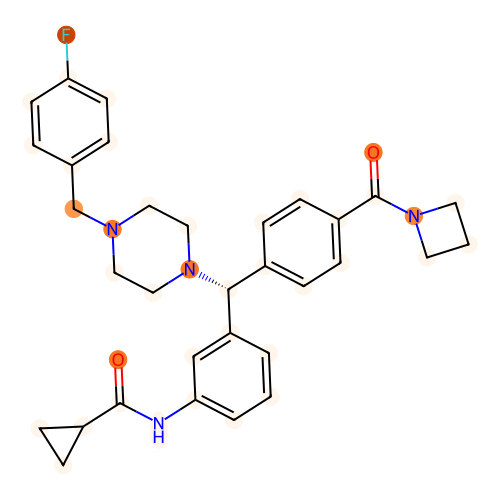

aromatic atom count: 18
prediction: [-2.073682   1.9268187]
CC(C(=O)N[C@]1(c2ccccc2)CC[C@@H](N2CCC(c3ccc(F)cc3)CC2)CC1)c1cc(C(F)(F)F)cc(C(F)(F)F)c1


[16:38:01] The new font size 1 is below the current minimum (6).


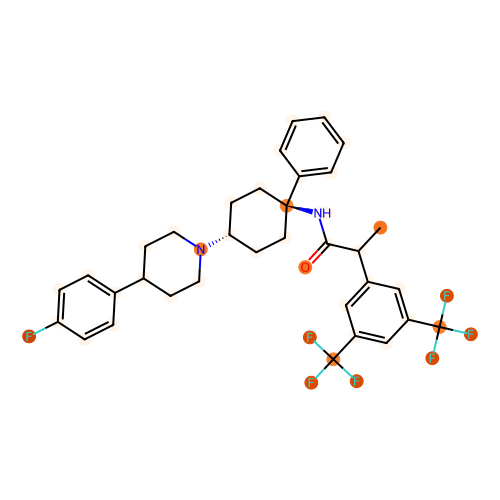

aromatic atom count: 16
prediction: [ 2.9365435 -2.2331662]
C[S+]([O-])Cc1ccc(C(=O)Nc2cccnc2C(=O)NCC2CCOCC2)c2ccccc12


[16:38:01] The new font size 1 is below the current minimum (6).


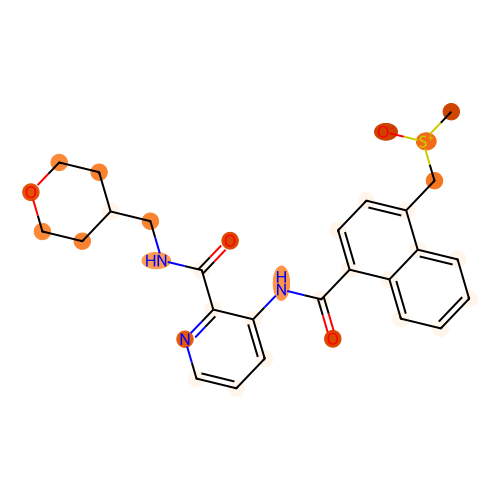

aromatic atom count: 16
prediction: [ 1.9133286 -1.4809657]
O=c1ccc2ncc(F)c3c2n1C[C@@]3(O)CC12CCC(NCc3cc(Cl)c4c(c3Cl)OCCO4)(CC1)CO2


[16:38:01] The new font size 1 is below the current minimum (6).


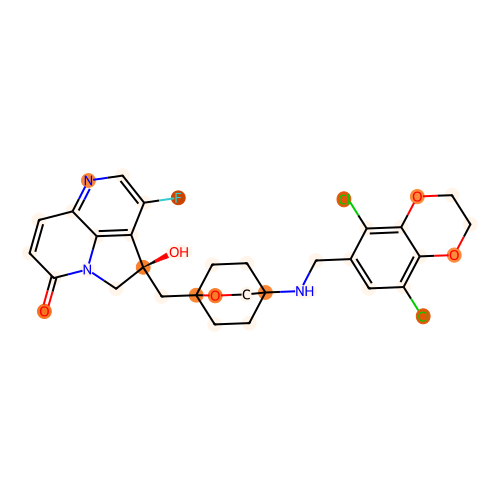

aromatic atom count: 20
prediction: [ 1.3074766 -1.0241035]
Cc1nn(-c2ccnc(Nc3ccc4c(c3)c(Cl)c(C)n4C)n2)cc1CN1CC(O)C1


[16:38:01] The new font size 1 is below the current minimum (6).


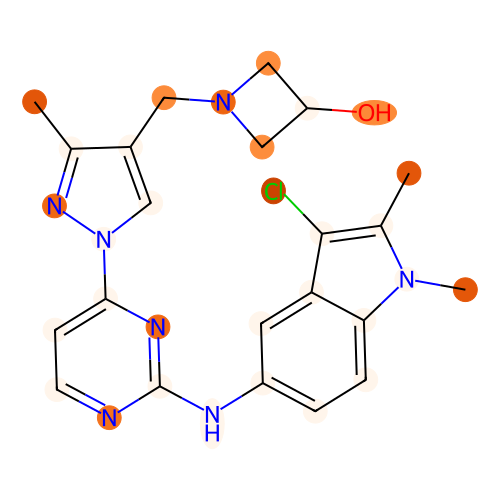

aromatic atom count: 15
prediction: [ 2.0666244 -1.5577958]
CN(C)CCC(NC(=O)C1(N)CCN(c2ncnc3[nH]ccc23)CC1)c1ccc(Cl)cc1


[16:38:01] The new font size 1 is below the current minimum (6).


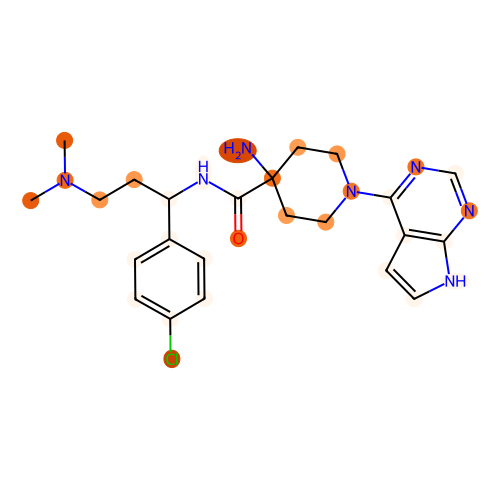

aromatic atom count: 19
prediction: [-0.82311994  0.90532345]
COc1ccc2nccc([C@@H]3CN(C4CCN(Cc5cc6ccccc6[nH]5)CC4)C(=O)O3)c2c1


[16:38:01] The new font size 1 is below the current minimum (6).


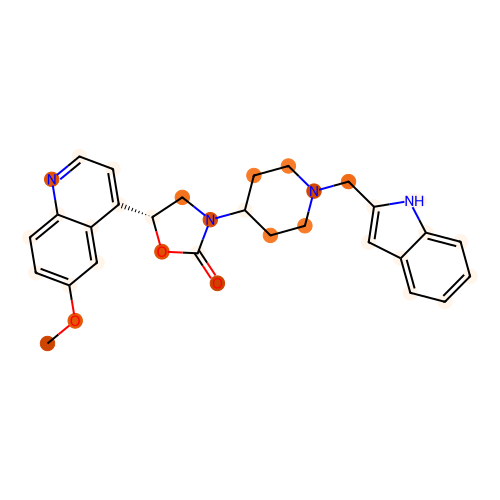

aromatic atom count: 21
prediction: [-1.7667503  1.697611 ]
O=C(NC1CCc2ccc(CCN3CCN(c4nsc5ccccc45)CC3)cc21)c1cccnc1


[16:38:01] The new font size 1 is below the current minimum (6).


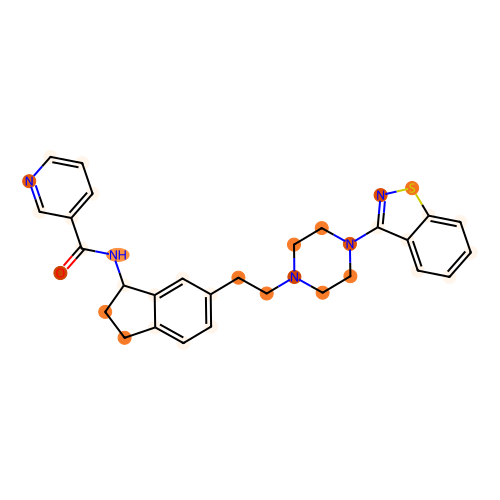

aromatic atom count: 23
prediction: [ 2.9041293 -2.1065686]
COc1ccc(-c2nc(COc3cccc(CN(CC(=O)O)C(=O)Oc4ccc(C)cc4)c3)c(C)o2)cc1


[16:38:01] The new font size 1 is below the current minimum (6).


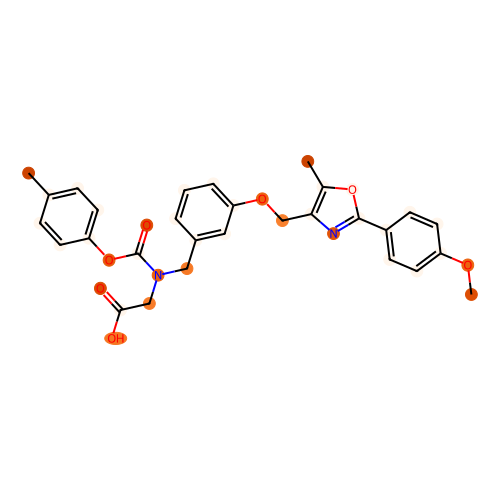

aromatic atom count: 20
prediction: [-1.0196573  1.0130993]
COCCCn1cc(CN(C(=O)[C@H]2CNCC[C@]2(O)c2ccc(F)c(F)c2)C2CC2)c2c(F)ccc(Cn3ccnc3)c21


[16:38:01] The new font size 1 is below the current minimum (6).


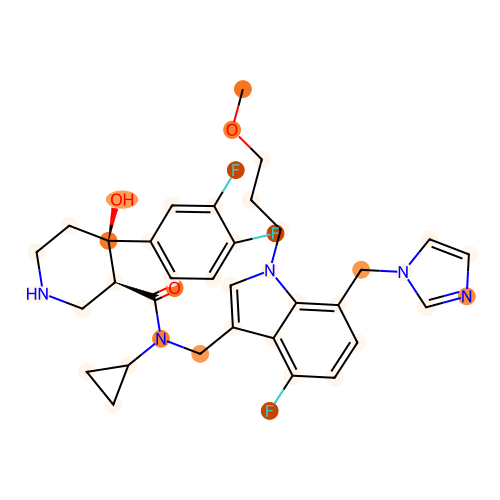

aromatic atom count: 12
prediction: [ 1.3599557 -1.0824293]
O=C(c1cc(F)cc(F)c1)N1CCN(c2ccc(OCCCN3CCCCCC3)cc2)C(=O)C1


[16:38:01] The new font size 1 is below the current minimum (6).


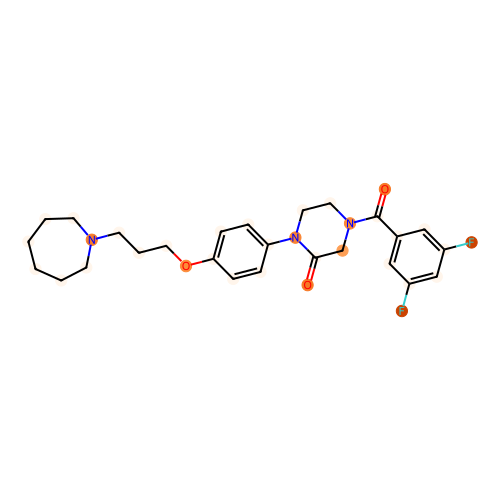

aromatic atom count: 17
prediction: [-1.8793887  1.7478276]
CCCn1c(-c2ccccc2)cc(C(=O)NCCCN2CCN(c3cccc(Cl)c3Cl)CC2)c1C


[16:38:01] The new font size 1 is below the current minimum (6).


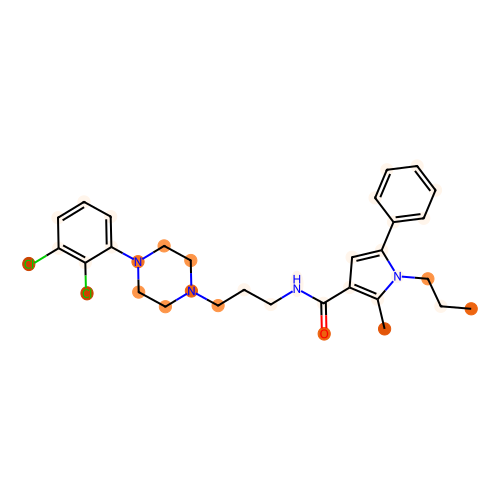

aromatic atom count: 22
prediction: [-1.167234   1.1981478]
COC(=O)N(NC(=O)c1c(CN2CCN(C3CCCCC3)CC2)c(-c2ccccc2)nc2ccccc12)c1ccccc1


[16:38:01] The new font size 1 is below the current minimum (6).


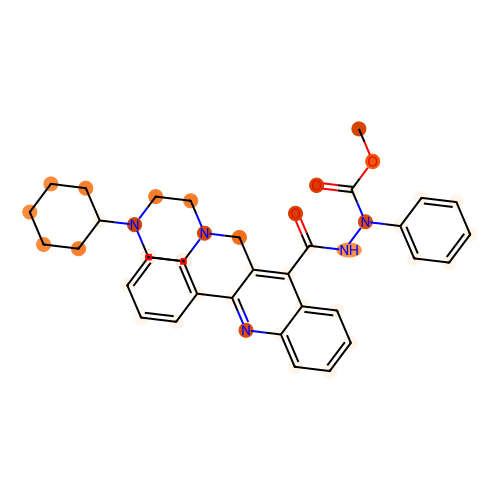

aromatic atom count: 22
prediction: [ 0.3924982 -0.2487329]
O=C(NC1CCN(Cc2ccn(-c3ccc(C(F)(F)F)cc3)c2)CC1)NC(c1ccccc1)c1ncc[nH]1


[16:38:01] The new font size 1 is below the current minimum (6).


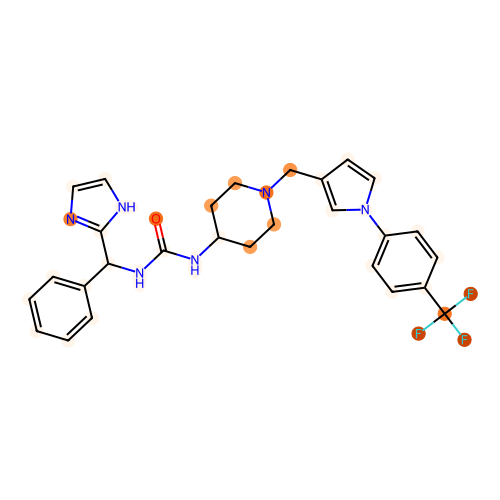

aromatic atom count: 21
prediction: [-2.1054513  1.9820986]
Cc1ccc2c(-c3nnc(SCCCN4C[C@@H]5C[C@]5(c5ccc(Br)cc5)C4)n3C)cccc2n1


[16:38:01] The new font size 1 is below the current minimum (6).


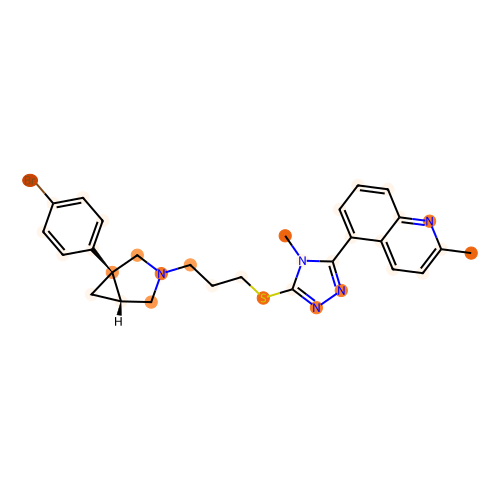

aromatic atom count: 17
prediction: [ 2.0186687 -1.4451245]
CSc1ncccc1C(=O)N1CCC([NH2+]Cc2cncn2Cc2ccc(C#N)cc2)C1=O


[16:38:01] The new font size 1 is below the current minimum (6).


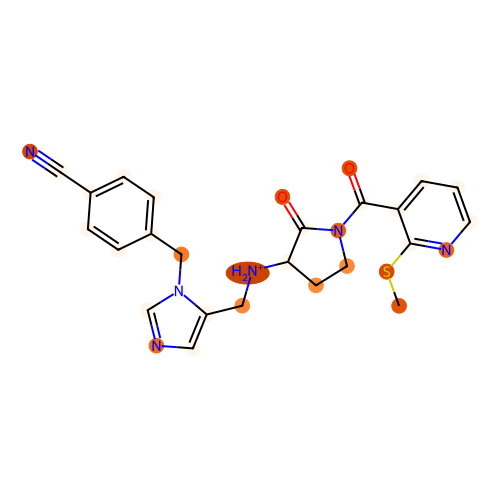

aromatic atom count: 18
prediction: [ 0.6520128  -0.53932196]
COc1ccccc1Oc1cccc(CN2CCC3(CC2)CCN(C(=O)c2ccncn2)CC3)c1


[16:38:01] The new font size 1 is below the current minimum (6).


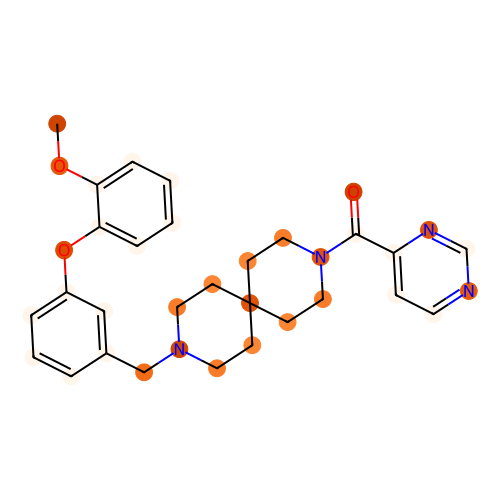

aromatic atom count: 23
prediction: [ 0.24453564 -0.05216212]
O=C(CC1CCN(Cc2ccn(-c3ccc(C(F)(F)F)cc3)c2)CC1)NC(c1ccc(F)cc1)c1ccc(=O)[nH]c1


[16:38:01] The new font size 1 is below the current minimum (6).


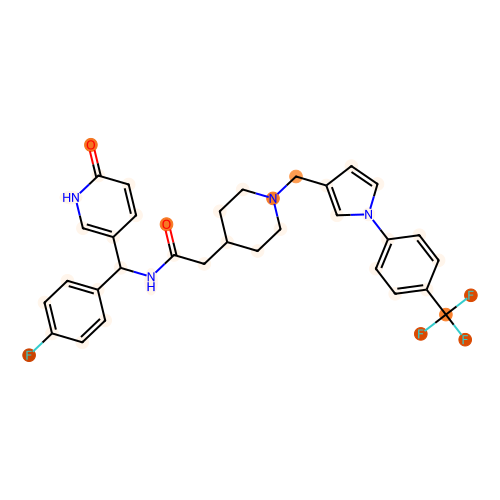

aromatic atom count: 23
prediction: [-0.69840854  0.7971632 ]
C[C@H](c1ccccc1)N1C(=O)O[C@](Cc2ccccc2)(c2nnc(C3(c4ccccc4)CC3)o2)C1=O


[16:38:01] The new font size 1 is below the current minimum (6).


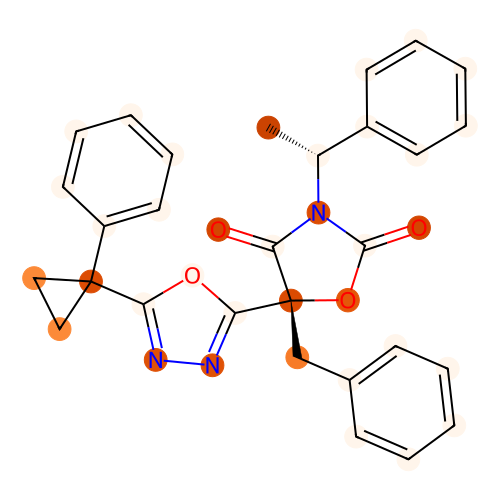

aromatic atom count: 12
prediction: [-0.19835733  0.19833872]
O=C(c1ccc(-c2ccc3c(c2)CCN(CCN2CCCC2)C3=O)c(F)c1)N1CCCC1


[16:38:01] The new font size 1 is below the current minimum (6).


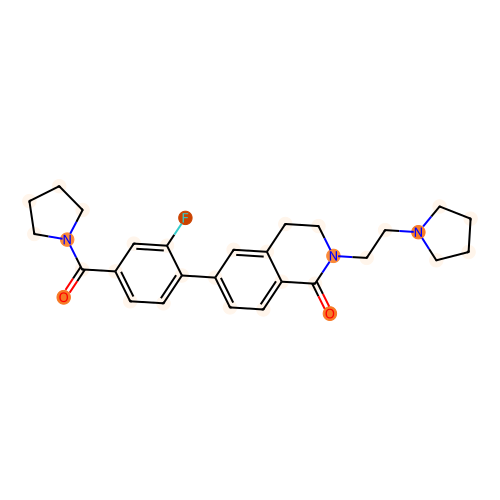

aromatic atom count: 17
prediction: [-1.0195881  1.0596155]
Cn1c(SCCCN2C[C@@H]3C[C@]3(c3ccc(C(F)(F)F)cc3)C2)nnc1-c1ccnnc1


[16:38:01] The new font size 1 is below the current minimum (6).


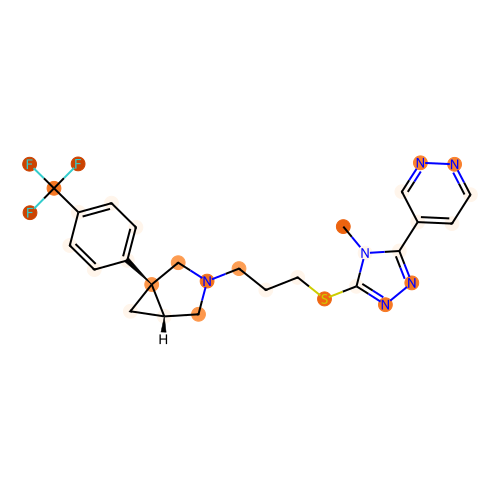

aromatic atom count: 15
prediction: [-1.9583898  1.8089434]
O=C1c2cc3ccccc3n2CCN1CCCCN1CCN(c2cccc(Cl)c2Cl)CC1


[16:38:01] The new font size 1 is below the current minimum (6).


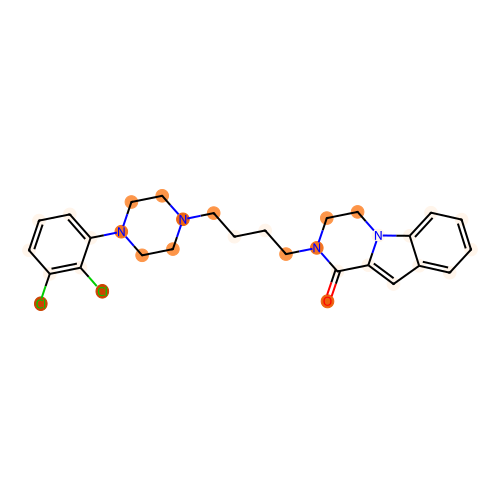

aromatic atom count: 21
prediction: [-1.4705921  1.5079564]
Cc1ccnc(CN2CCC(Oc3ncnc4c3ccn4Cc3ccccc3)CC2)c1


[16:38:01] The new font size 1 is below the current minimum (6).


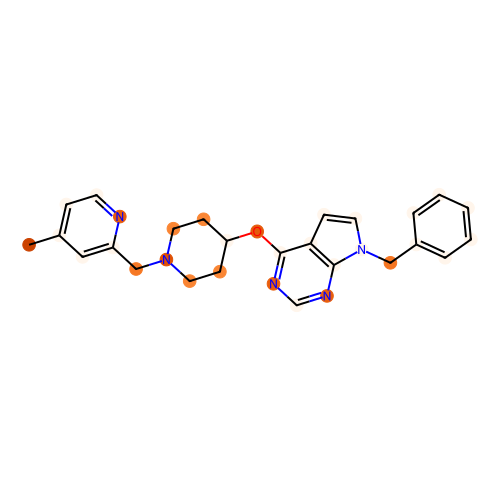

aromatic atom count: 20
prediction: [-1.1345617  1.0893075]
CN(C(=O)Cc1ccc(-n2cnnn2)cc1)C1CCN(Cc2nc3cc(F)ccc3s2)CC1


[16:38:01] The new font size 1 is below the current minimum (6).


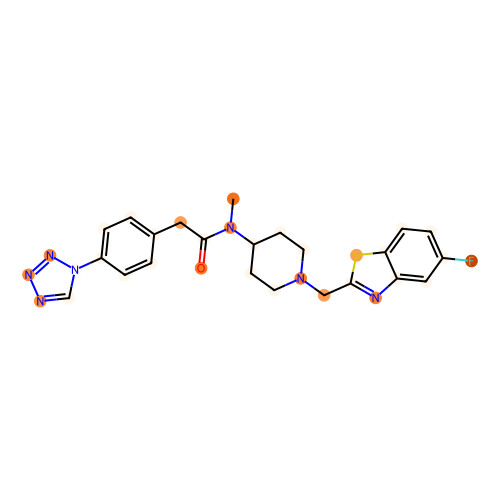

aromatic atom count: 12
prediction: [ 2.9380226 -2.2917917]
COC1COCCC1N[C@@H]1C[C@H]2CN(c3ncccn3)C[C@@]2(C(=O)N2CCc3ncc(C(F)(F)F)cc3C2)C1


[16:38:01] The new font size 1 is below the current minimum (6).


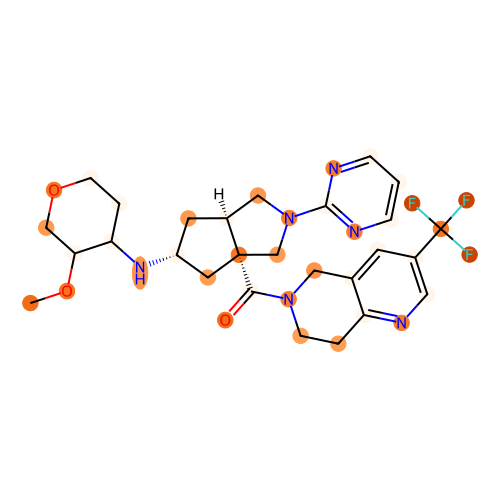

aromatic atom count: 17
prediction: [-0.69736344  0.7172011 ]
Cc1cn(-c2ccc3n(c2=O)CCN([C@@H](C)COc2ccc(F)cc2[C@@H](C)C(F)(F)F)C3=O)cn1


[16:38:01] The new font size 1 is below the current minimum (6).


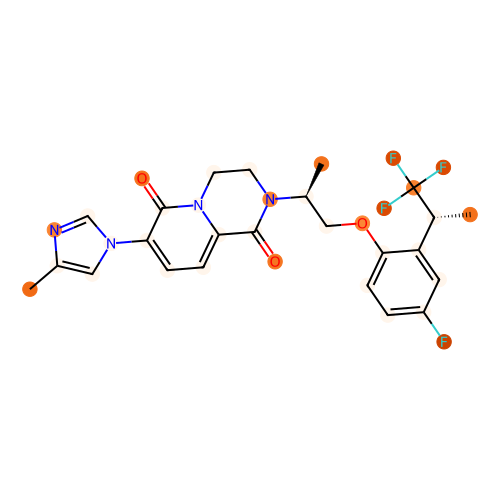

aromatic atom count: 11
prediction: [-1.179519   1.1041218]
CN1CCN(CCCCN2C(=O)CN(/N=C/c3ccc(-c4ccc(Cl)cc4)o3)C2=O)CC1


[16:38:01] The new font size 1 is below the current minimum (6).


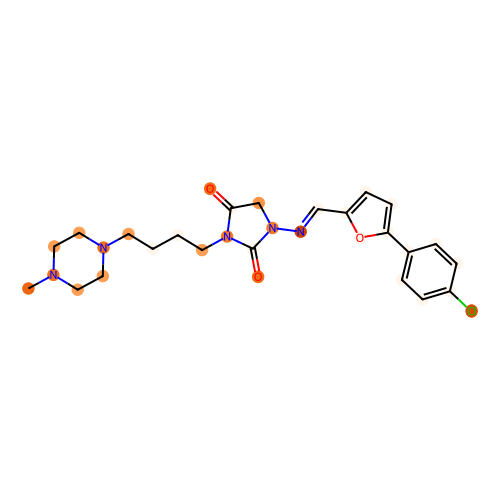

aromatic atom count: 19
prediction: [-0.22291024  0.24929088]
CC(C)=CCn1c(N2CCC[C@H](N)C2)c(C#N)c2c1c(=O)n(Cc1nc(C)c3ccccc3n1)c(=O)n2C


[16:38:01] The new font size 1 is below the current minimum (6).


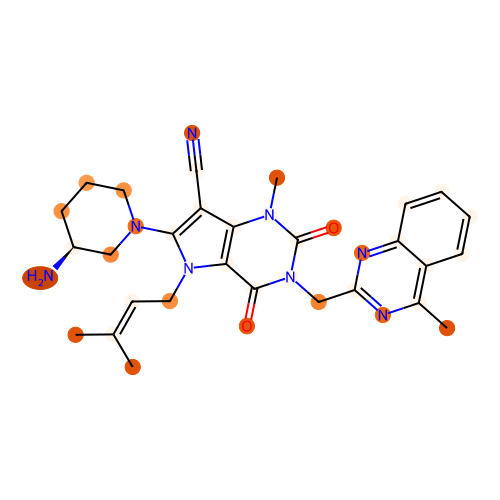

aromatic atom count: 23
prediction: [-0.13351275  0.21137753]
O=C(CC1CCN(Cc2ccn(-c3ccc(C(F)(F)F)cc3)c2)CC1)NC(c1ccc(F)cc1)c1c[nH]c(=O)c(Cl)c1


[16:38:01] The new font size 1 is below the current minimum (6).


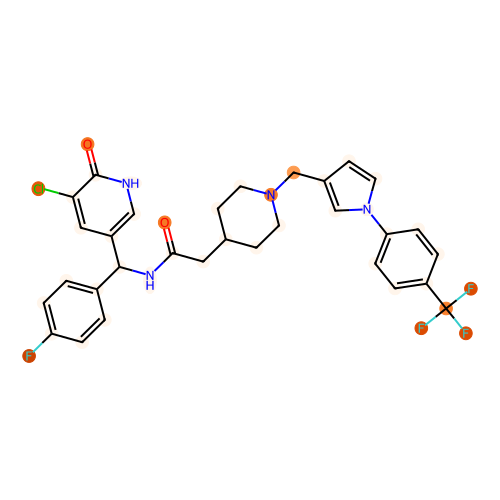

aromatic atom count: 12
prediction: [ 0.93596005 -0.69346946]
C[C@H](Oc1ccc(S(C)(=O)=O)cc1C(=O)N1CCN(c2ncc(C(F)(F)F)cc2F)CC1)C(C)(C)C


[16:38:01] The new font size 1 is below the current minimum (6).


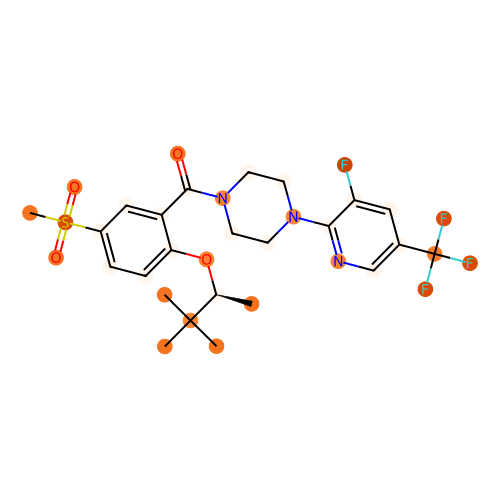

aromatic atom count: 6
prediction: [ 0.96990585 -0.7231139 ]
C[C@]1(CS(=O)(=O)N2CCC(Oc3ccc(OC(F)(F)C(F)F)cc3)CC2)NC(=O)NC1=O


[16:38:01] The new font size 1 is below the current minimum (6).


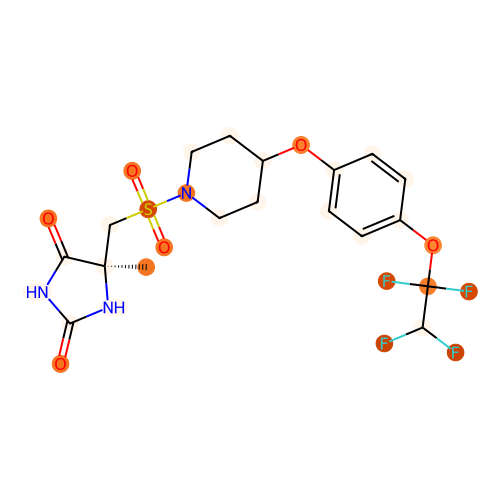

aromatic atom count: 23
prediction: [-0.20159785  0.22126943]
COc1cc(N2C(=O)N(c3ccc(-c4ccc(C(=O)O)s4)cc3)C(=O)C23CCN(Cc2ncccc2C)CC3)ncn1


[16:38:01] The new font size 1 is below the current minimum (6).


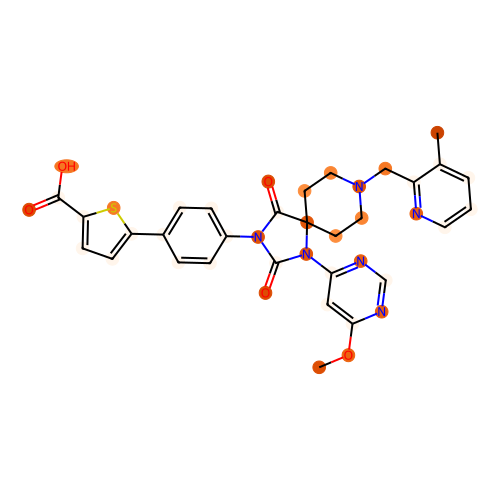

aromatic atom count: 15
prediction: [-1.8824483  1.8161378]
CCN(CC)C(=O)CN1CCCC(c2nc3ccccc3n2Cc2ccc(F)cc2)C1


[16:38:01] The new font size 1 is below the current minimum (6).


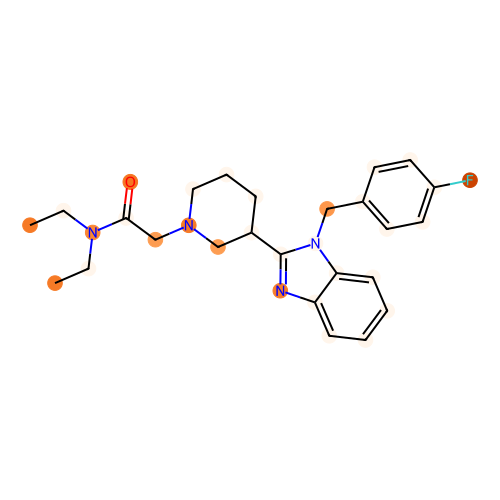

aromatic atom count: 18
prediction: [-1.414138   1.4922469]
O=C(NC(c1ccccc1)c1ccccc1)[C@@H]1CC[C@@H](N2CCOCC2)C[C@H]1c1ccccc1


[16:38:01] The new font size 1 is below the current minimum (6).


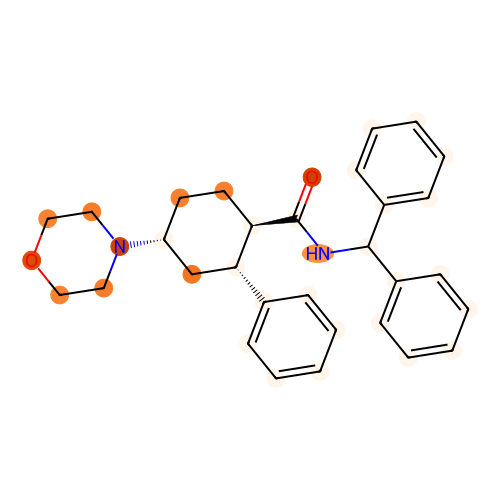

aromatic atom count: 17
prediction: [-1.0378999  1.125435 ]
N#Cc1ccc2cc1Oc1ccc3c(c1)[C@@H](CC3)N1CC[C@@H](NCc3cncn3C2)C1=O


[16:38:01] The new font size 1 is below the current minimum (6).


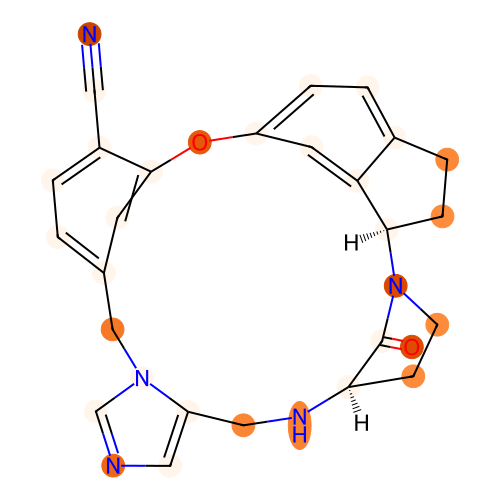

aromatic atom count: 12
prediction: [ 3.5902944 -2.6674368]
CN(C)c1ccc(NC(=O)NS(=O)(=O)c2ccc(OCCCN3CCCC3)cc2)cc1


[16:38:01] The new font size 1 is below the current minimum (6).


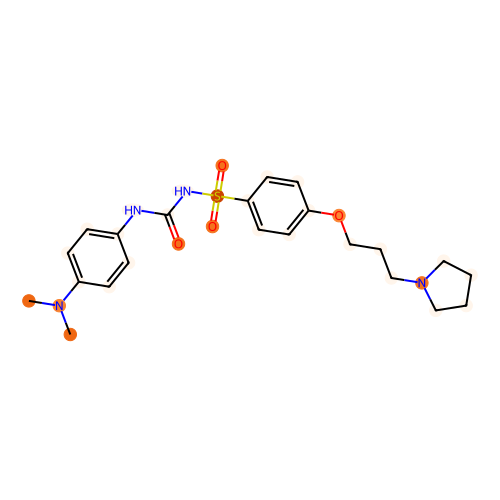

aromatic atom count: 21
prediction: [ 0.29153913 -0.28190237]
COc1cccc(-n2cc3nc(-c4cccnc4C)n(C[C@H]4CCCN(C[C@H]5CCCO5)C4)c(=O)c3n2)c1


[16:38:01] The new font size 1 is below the current minimum (6).


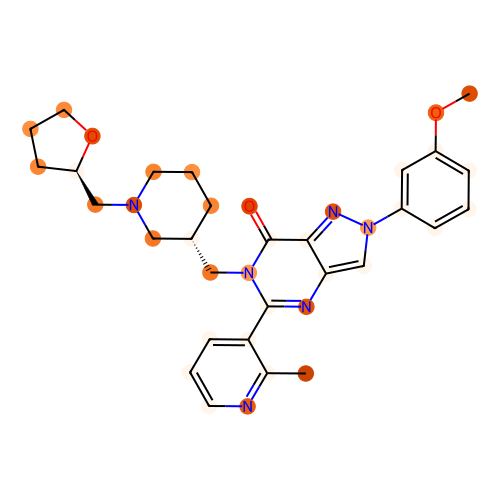

aromatic atom count: 16
prediction: [-0.20324707  0.20708174]
O=C1COc2ccc(CNC34CCC(CCc5c(F)cnc6ccc(OC(F)F)nc56)(CC3)OC4)nc2N1


[16:38:01] The new font size 1 is below the current minimum (6).


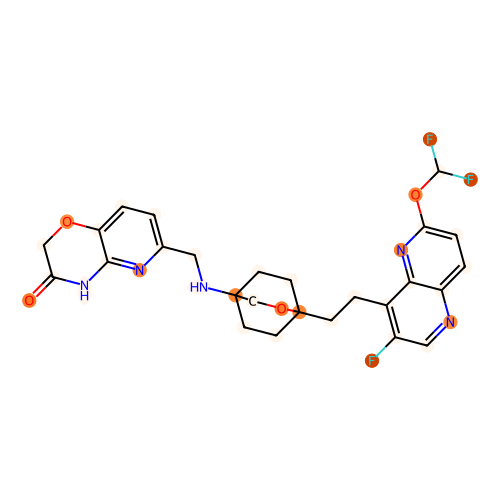

aromatic atom count: 18
prediction: [-1.7741896  1.7042551]
CC(C)(C)CN1CCC(c2ccccc2Oc2ncccc2NC(=O)Nc2ccc(OC(F)(F)F)cc2)CC1


[16:38:01] The new font size 1 is below the current minimum (6).


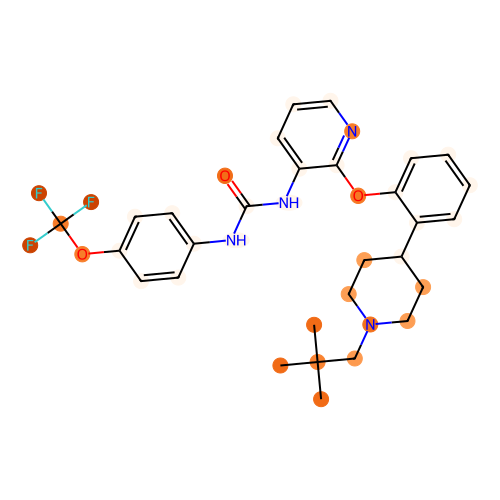

aromatic atom count: 19
prediction: [-1.2614255  1.2726068]
Cc1cc2[nH]c(C3CCN(CCn4c(=O)ccc5ncc(F)cc54)CC3)nc2cc1Cl


[16:38:01] The new font size 1 is below the current minimum (6).


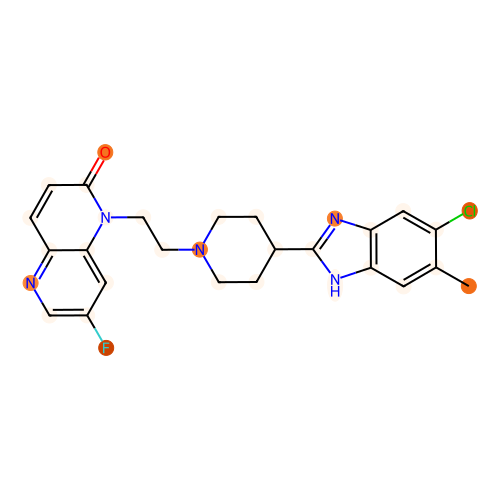

aromatic atom count: 14
prediction: [ 2.2703233 -1.8132969]
Cc1nc2cc3c(cc2o1)CCN(CCCSc1nnc(C2CCOCC2)n1C)CC3


[16:38:01] The new font size 1 is below the current minimum (6).


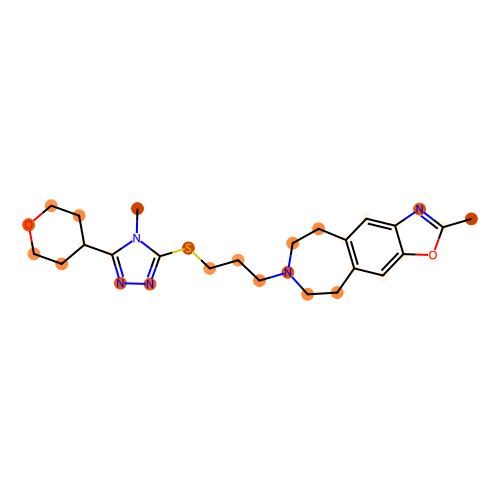

aromatic atom count: 12
prediction: [ 2.4318988 -1.920852 ]
O=C(c1ccc(C(=O)N2CCN(c3ccc(OC4CCN(C5CCC5)CC4)cc3)C(=O)C2)cc1)N1CCC1


[16:38:01] The new font size 1 is below the current minimum (6).


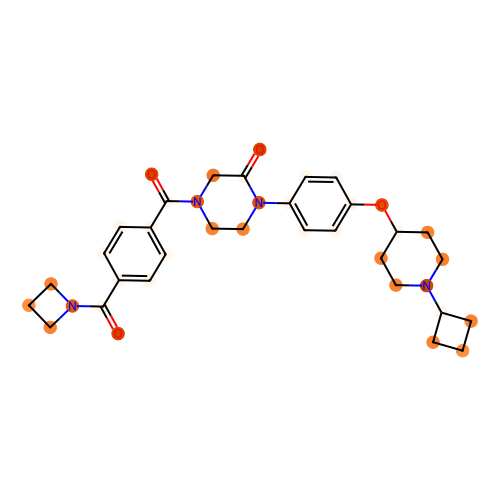

aromatic atom count: 16
prediction: [-1.6888634  1.6679125]
Cc1nc2ccccc2c(=O)n1-c1ccc(OC2CCCN(C3CCCC3)CC2)cc1


[16:38:01] The new font size 1 is below the current minimum (6).


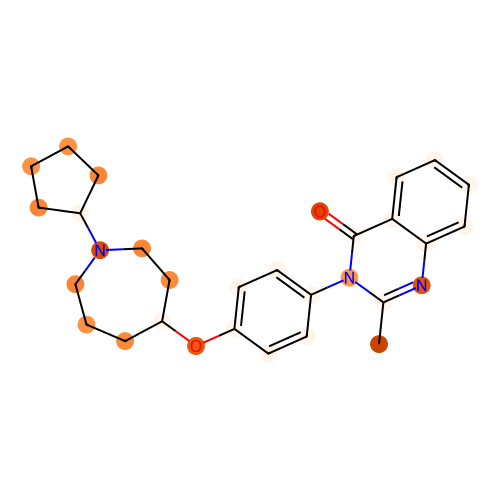

aromatic atom count: 16
prediction: [ 0.93707305 -0.6962719 ]
O=C([C@@H]1CCCCN1)N1CCN(c2nc(NCc3ccc(Cl)cc3Cl)c3cccnc3n2)CC1


[16:38:01] The new font size 1 is below the current minimum (6).


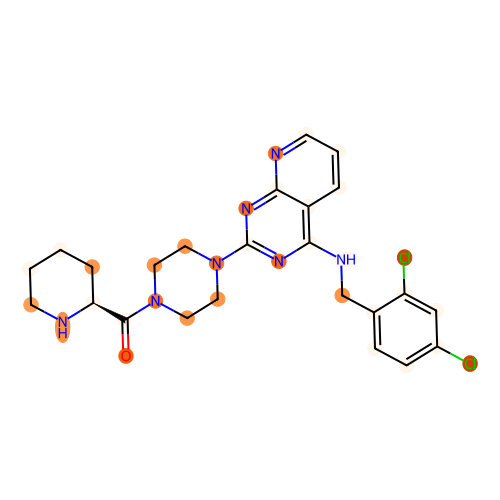

aromatic atom count: 27
prediction: [-1.2166542  1.2629968]
Fc1ccccc1-c1nc2ccn(Cc3ccc(-c4ccc(C(F)(F)F)cc4C(F)(F)F)nn3)cc-2n1


[16:38:01] The new font size 1 is below the current minimum (6).


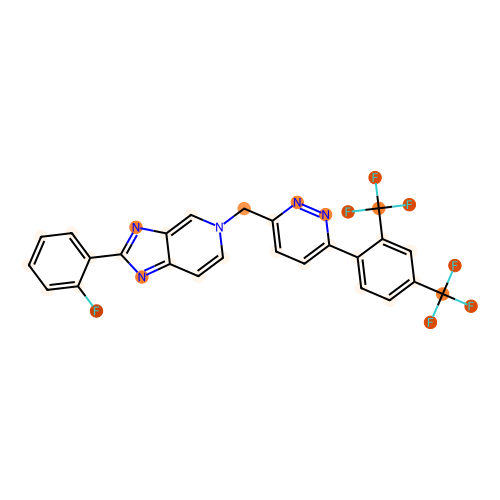

aromatic atom count: 12
prediction: [-1.712706  1.6592  ]
COc1ccc([C@H]2CN(CCCC3CCNCC3)C[C@@H]2CNC(=O)c2cccc(Cl)c2)cc1


[16:38:02] The new font size 1 is below the current minimum (6).


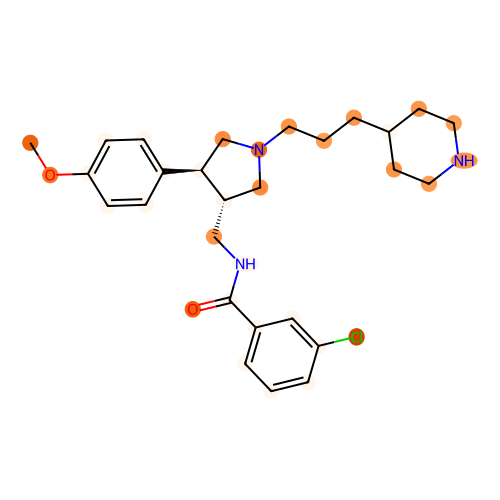

aromatic atom count: 18
prediction: [-0.1566853   0.28944483]
CCOC(=O)NCCc1ccccc1-c1ccc([C@H]2CNCC[C@@H]2c2ccn(C)c(=O)c2)c(Cl)c1


[16:38:02] The new font size 1 is below the current minimum (6).


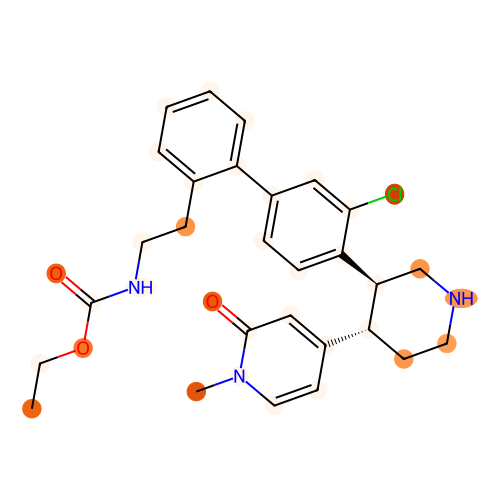

[16:38:02] The new font size 1 is below the current minimum (6).


aromatic atom count: 12
prediction: [ 0.3594964  -0.37102988]
COc1ccc(CC(=O)Nc2cc3c(cc2[N+](=O)[O-])OC(C)(C)[C@H](O)[C@H]3NC2CC2)cc1


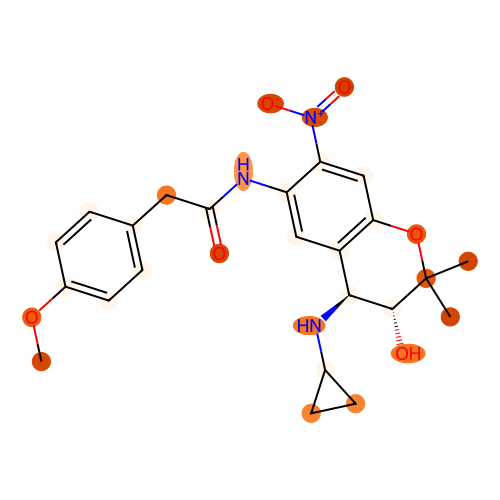

aromatic atom count: 19
prediction: [-1.810407   1.7696042]
COCc1ccc(CCN2CCC(COc3nc4ccccc4c4cn(C)cc34)CC2)cc1


[16:38:02] The new font size 1 is below the current minimum (6).


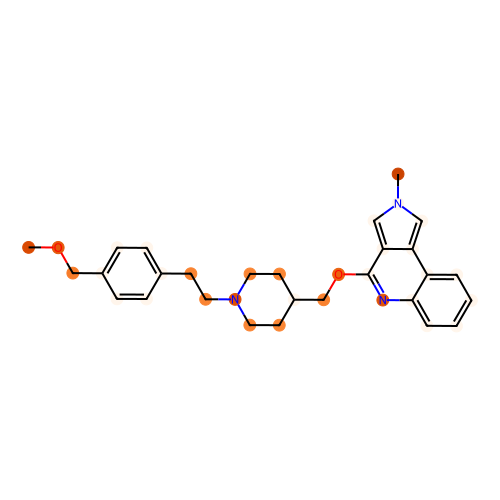

aromatic atom count: 15
prediction: [-0.47907963  0.52789164]
CCOc1cc(CN2CCC(Nc3nc4cc(S(N)(=O)=O)ccc4o3)CC2)ccc1OC


[16:38:02] The new font size 1 is below the current minimum (6).


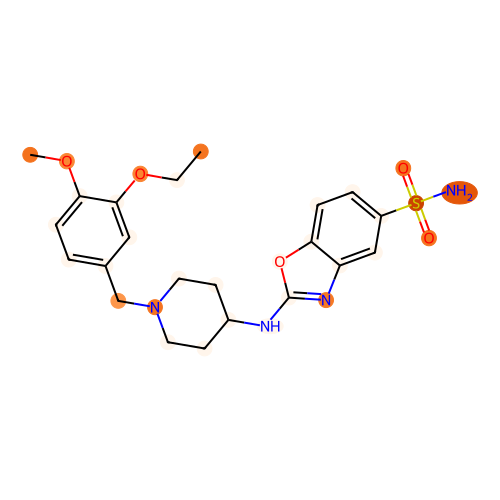

aromatic atom count: 20
prediction: [ 0.9347245 -0.5986401]
CC[C@](O)(c1cn(Cc2ccc3c(-c4cccc(F)c4)c(C(N)=O)sc3c2)nn1)C(F)(F)F


[16:38:02] The new font size 1 is below the current minimum (6).


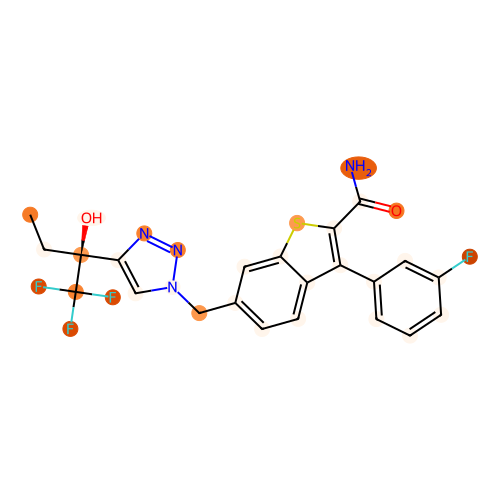

aromatic atom count: 22
prediction: [ 3.1938615 -2.2886093]
CC(C)(O)c1ccc(-c2cccc(-n3cc(C(=O)NC4CC4)c(=O)c4cccnc43)c2)c[n+]1[O-]


[16:38:02] The new font size 1 is below the current minimum (6).


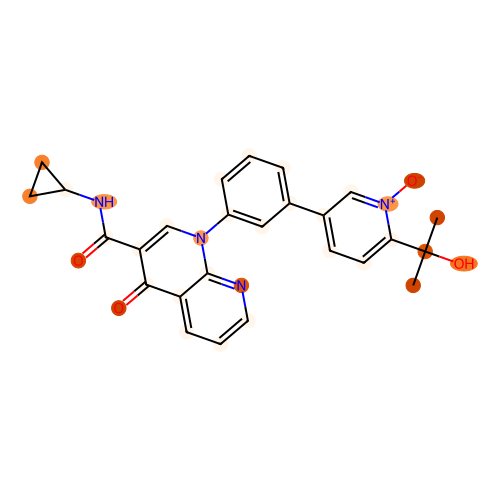

aromatic atom count: 6
prediction: [ 3.3249006 -2.633535 ]
CNC(=O)N1C[C@@H]2C[C@@H](NC3CCOCC3OC)C[C@]2(C(=O)N2CCc3ncc(C(F)(F)F)cc3C2)C1


[16:38:02] The new font size 1 is below the current minimum (6).


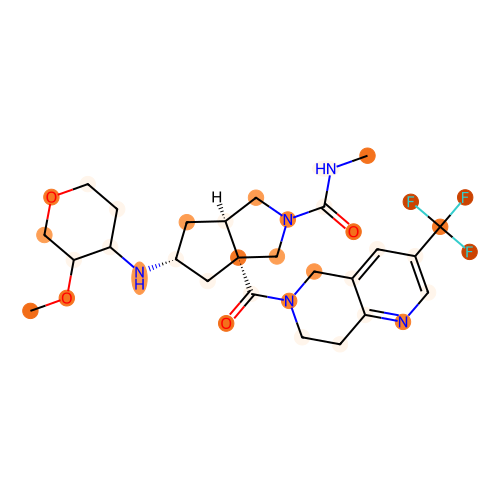

aromatic atom count: 15
prediction: [-1.1318244  1.1088066]
O=C1O[C@]2(CC[C@H](c3nc4cc(OC(F)(F)F)ccc4[nH]3)CC2)CN1c1ccccn1


[16:38:02] The new font size 1 is below the current minimum (6).


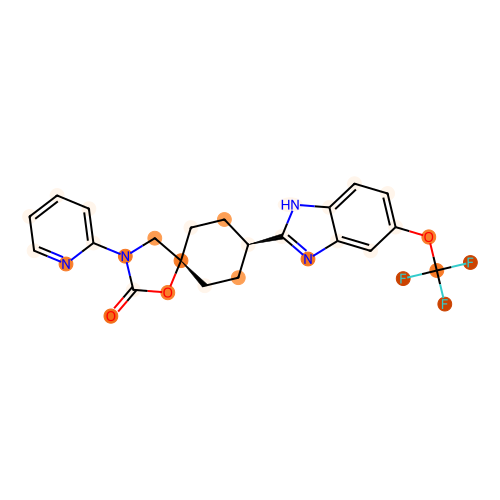

aromatic atom count: 6
prediction: [ 1.6086007 -1.2254897]
CN(C)C(=O)N[C@H]1CC[C@@H](CCN2[C@@H]3CC[C@H]2C[C@@H](Oc2cccc(C(N)=O)c2)C3)CC1


[16:38:02] The new font size 1 is below the current minimum (6).


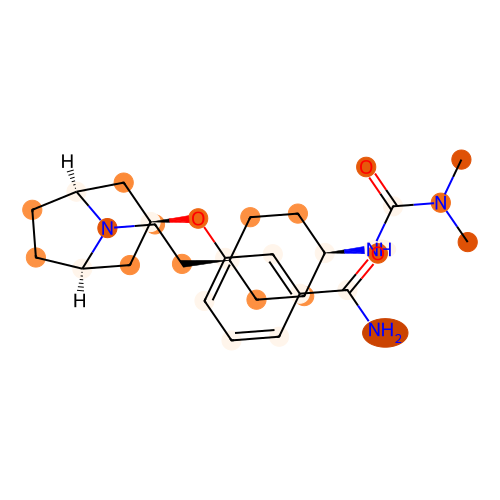

In [28]:
model_for_viz.eval()

out_feature_sorted = []
out_weight_sorted = []
mol_feature_sorted = []

dataset = test_df
test_MAE_list = []
test_MSE_list = []
valList = np.arange(0,dataset.shape[0])
batch_list = []
for i in range(0, dataset.shape[0], batch_size):
    batch = valList[i:i+batch_size]
    batch_list.append(batch) 
for counter, test_batch in enumerate(batch_list):
    batch_df = dataset.loc[test_batch,:]
    smiles_list = batch_df.cano_smiles.values
    y_val = batch_df[tasks[0]].values

    x_atom, x_bonds, x_atom_index, x_bond_index, x_mask, smiles_to_rdkit_list = get_smiles_array(smiles_list,feature_dicts)
            
    selected_rows = batch_df[batch_df['cano_smiles'] == smiles_list].drop(columns=['SMILES', 'Class', 'cano_smiles'])
    physicochemical_features= torch.tensor(selected_rows.to_numpy(dtype=np.float32), dtype=torch.float)
    
    atoms_prediction, atom_feature_viz, atom_attention_weight_viz, mol_feature_viz, mol_feature_unbounded_viz, mol_attention_weight_viz, mol_prediction = model_for_viz(
        torch.Tensor(x_atom), torch.Tensor(x_bonds),
        torch.LongTensor(x_atom_index),
        torch.LongTensor(x_bond_index),
        torch.Tensor(x_mask), 
        physicochemical_features.cpu())

    mol_pred = np.array(mol_prediction.data.squeeze().cpu().numpy())
    atom_feature = np.stack([atom_feature_viz[L].cpu().detach().numpy() for L in range(radius+1)])
    atom_weight = np.stack([mol_attention_weight_viz[t].cpu().detach().numpy() for t in range(T)])
    mol_feature = np.stack([mol_feature_viz[t].cpu().detach().numpy() for t in range(T)])

    mol_feature_sorted.extend([mol_feature[:,i,:] for i in range(mol_feature.shape[1])])
    for i, smiles in enumerate(smiles_list):
        atom_num = i
        ind_mask = x_mask[i]
        ind_atom = smiles_to_rdkit_list[smiles]
        ind_feature = atom_feature[:, i]
        ind_weight = atom_weight[:, i]
        out_feature = []
        out_weight = []
        for j, one_or_zero in enumerate(list(ind_mask)):
            if one_or_zero == 1.0:
                out_feature.append(ind_feature[:,j])
                out_weight.append(ind_weight[:,j])
        out_feature_sorted.extend([out_feature[m] for m in np.argsort(ind_atom)])
        out_weight_sorted.extend([out_weight[m] for m in np.argsort(ind_atom)])        
        
        mol = Chem.MolFromSmiles(smiles)
        
        aromatic_boolean = [int(mol.GetAtomWithIdx(i).GetIsAromatic()) for i in range(mol.GetNumAtoms())]
        if len(aromatic_boolean)>30 and np.sum(aromatic_boolean)>3:
            weight_norm = min_max_norm([out_weight[m][0] for m in np.argsort(ind_atom)])

            print('aromatic atom count: '+str(np.sum(aromatic_boolean))+'\n'
                 'prediction: '+str(mol_pred[atom_num]))
            print(smiles)
            norm = matplotlib.colors.Normalize(vmin=0,vmax=1.28)
            cmap = cm.get_cmap('Oranges')
            plt_colors = cm.ScalarMappable(norm=norm, cmap=cmap)
            atom_colors = {}
            weight_norm = np.array(weight_norm).flatten()
            threshold = weight_norm[np.argsort(weight_norm)[6]]
            weight_norm = np.where(weight_norm < threshold, 0, weight_norm)
            weight_norm[weight_norm < 0.55] = 0  # 0.3보다 작은 값들을 0으로 설정


            for i in range(len(ind_atom)):
                atom_colors[i] = plt_colors.to_rgba(float(weight_norm[i]))
            rdDepictor.Compute2DCoords(mol)

            drawer = rdMolDraw2D.MolDraw2DSVG(500,500)
            drawer.SetFontSize(1)
            op = drawer.drawOptions()

            mol = rdMolDraw2D.PrepareMolForDrawing(mol)
            drawer.DrawMolecule(mol,highlightAtoms=range(0,len(ind_atom)),highlightBonds=[],
                highlightAtomColors=atom_colors)
            drawer.FinishDrawing()
            svg = drawer.GetDrawingText()
            svg2 = svg.replace('svg:','')
            svg3 = SVG(svg2)
            display(svg3)